In [1]:
window_size="_512"
# " + window_size + "

In [2]:
import adclasses
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import joblib
from datetime import timedelta
import os
import warnings
warnings.filterwarnings('ignore')

Using TensorFlow backend.


In [3]:
dataset_name_list = ["ibm-common-stock-closing-prices", 
                     "exchange-2_cpm_results",
                     "exchange-3_cpm_results",
                     "ambient_temperature_system_failure",
                     "all_data_gift_certificates",
                     "exchange-2_cpc_results",
                     "exchange-3_cpc_results",
                     "ec2_cpu_utilization_5f5533",
                     "ec2_cpu_utilization_ac20cd",
                     "international-airline-passengers"]
true_outlier_indices_dict = {}
ad_dict = {}

# ibm-common-stock-closing-prices

In [4]:
dataset_name = "ibm-common-stock-closing-prices"
path = "data/" + dataset_name + ".csv"

data = pd.read_csv(path,header=0)
data["Date"] = pd.to_datetime(data["Date"],format="%Y-%m-%d")

data["timestamp"] = data["Date"]
del data["Date"]
data["value"] = data["IBM common stock closing prices"]
del data["IBM common stock closing prices"]

start_date = data["timestamp"].values[0]
end_date = data["timestamp"].values[-1]
print("Start date: ", start_date)
print("End date: ", end_date)

missing = adclasses.find_missing_time_steps(start_date, end_date, '1D', data)
print("Missing time steps: ", missing)

data = adclasses.fill_missing_time_steps(start_date, end_date, '1D', data, method="linear")

ad = adclasses.UnivariateAnomalyDetection(dataframe=data, timestep="1D", dateformat="%Y-%m-%d", name=dataset_name)
print("Length: ", ad.get_length())
print("Time step size: ", ad.get_timestep())
print("Start Date: ", start_date)
print("End Date: ", end_date)
print("Date Format: ", ad.get_dateformat())

true_outlier_dates = ["1962-10-26",
                      "1964-05-18"]
true_outlier_indices = ad.convert_true_outlier_date(true_outlier_dates)
print("True outlier indices: ", true_outlier_indices)

true_outlier_indices_dict[dataset_name] = true_outlier_indices
ad_dict[dataset_name] = ad

Start date:  1962-01-02T00:00:00.000000000
End date:  1965-12-31T00:00:00.000000000
Missing time steps:  DatetimeIndex(['1962-01-06', '1962-01-07', '1962-01-13', '1962-01-14',
               '1962-01-20', '1962-01-21', '1962-01-27', '1962-01-28',
               '1962-02-03', '1962-02-04',
               ...
               '1965-11-28', '1965-12-04', '1965-12-05', '1965-12-11',
               '1965-12-12', '1965-12-18', '1965-12-19', '1965-12-24',
               '1965-12-25', '1965-12-26'],
              dtype='datetime64[ns]', length=452, freq=None)
Length:  1460
Time step size:  1D
Start Date:  1962-01-02T00:00:00.000000000
End Date:  1965-12-31T00:00:00.000000000
Date Format:  %Y-%m-%d
True outlier indices:  [297, 867]


# exchange-2_cpm_results

In [5]:
dataset_name = "exchange-2_cpm_results"
path = "data/" + dataset_name + ".csv"

data = pd.read_csv(path, header=0)
data = data.dropna()
start_date = data["timestamp"].values[0]
end_date = data["timestamp"].values[-1]
print("Start date: ", start_date)
print("End date: ", end_date)
data["timestamp"] = pd.to_datetime(data["timestamp"], format="%Y-%m-%d %H:%M:%S")

print("Missing time stamps: \n", adclasses.find_missing_time_steps(start_date, end_date, '1H', data))

# if you want to use a method that cannot take missing time steps
# into account, you need to fill in the missing time steps yourself
# this function also removes duplicates
print("Fill Missing Time Steps with Interpolation")
data = adclasses.fill_missing_time_steps(start_date, end_date, '1H', data, method="linear")

data["timestamp"] = pd.to_datetime(data["timestamp"], format="%Y-%m-%d %H:%M:%S")
ad = adclasses.UnivariateAnomalyDetection(dataframe=data, timestep="1H", dateformat="%Y-%m-%d %H:%M:%S", name=dataset_name)
print("Length: ", ad.get_length())
print("Time step size: ", ad.get_timestep())
print("Start Date: ", start_date)
print("End Date: ", end_date)
print("Date Format: ", ad.get_dateformat())
true_outlier_dates = ["2011-07-26 06:00:01",
                      "2011-08-10 17:00:01"]
true_outlier_indices = ad.convert_true_outlier_date(true_outlier_dates)

true_outlier_indices_dict[dataset_name] = true_outlier_indices
ad_dict[dataset_name] = ad

Start date:  2011-07-01 00:00:01
End date:  2011-09-07 15:00:01
Missing time stamps: 
 DatetimeIndex(['2011-07-21 05:00:01', '2011-08-08 18:00:01',
               '2011-08-10 16:00:01', '2011-08-15 22:00:01',
               '2011-08-15 23:00:01', '2011-09-01 19:00:01',
               '2011-09-01 20:00:01', '2011-09-01 21:00:01',
               '2011-09-01 22:00:01', '2011-09-01 23:00:01',
               '2011-09-02 00:00:01', '2011-09-02 01:00:01',
               '2011-09-02 02:00:01', '2011-09-02 03:00:01',
               '2011-09-02 04:00:01', '2011-09-02 05:00:01',
               '2011-09-02 06:00:01', '2011-09-02 07:00:01',
               '2011-09-02 08:00:01', '2011-09-02 09:00:01',
               '2011-09-02 10:00:01', '2011-09-02 11:00:01',
               '2011-09-02 12:00:01', '2011-09-02 13:00:01',
               '2011-09-02 14:00:01'],
              dtype='datetime64[ns]', freq=None)
Fill Missing Time Steps with Interpolation
Duplicate records found: 
                        

# ambient_temperature_system_failure

In [6]:
dataset_name = "ambient_temperature_system_failure"
path = "data/" + dataset_name + ".csv"

data = pd.read_csv(path, header=0)
start_date = data["timestamp"].values[0]
end_date = data["timestamp"].values[-1]
print("Start date: ", start_date)
print("End date: ", end_date)
data["timestamp"] = pd.to_datetime(data["timestamp"], format="%Y-%m-%d %H:%M:%S")

print("Missing time stamps: \n", adclasses.find_missing_time_steps(start_date, end_date, '1H', data))

# if you want to use a method that cannot take missing time steps
# into account, you need to fill in the missing time steps yourself
# this function also removes duplicates
print("Fill Missing Time Steps with Interpolation")
data = adclasses.fill_missing_time_steps(start_date, end_date, '1H', data, method="linear")

data["timestamp"] = pd.to_datetime(data["timestamp"], format="%Y-%m-%d %H:%M:%S")
ad = adclasses.UnivariateAnomalyDetection(dataframe=data, timestep="1H", dateformat="%Y-%m-%d %H:%M:%S", name=dataset_name)
print("Length: ", ad.get_length())
print("Time step size: ", ad.get_timestep())
print("Date Format: ", ad.get_dateformat())
true_outlier_dates = ["2013-12-22 20:00:00",
                      "2014-04-13 09:00:00"]
true_outlier_indices = ad.convert_true_outlier_date(true_outlier_dates)

true_outlier_indices_dict[dataset_name] = true_outlier_indices
ad_dict[dataset_name] = ad

Start date:  2013-07-04 00:00:00
End date:  2014-05-28 15:00:00
Missing time stamps: 
 DatetimeIndex(['2013-07-28 02:00:00', '2013-07-28 05:00:00',
               '2013-07-28 06:00:00', '2013-07-28 07:00:00',
               '2013-07-28 08:00:00', '2013-07-28 09:00:00',
               '2013-07-28 10:00:00', '2013-07-28 11:00:00',
               '2013-07-28 12:00:00', '2013-07-28 13:00:00',
               ...
               '2014-04-10 05:00:00', '2014-04-10 06:00:00',
               '2014-04-10 07:00:00', '2014-04-10 08:00:00',
               '2014-04-10 09:00:00', '2014-04-10 10:00:00',
               '2014-04-10 11:00:00', '2014-04-10 12:00:00',
               '2014-04-10 13:00:00', '2014-04-10 14:00:00'],
              dtype='datetime64[ns]', length=621, freq=None)
Fill Missing Time Steps with Interpolation
Length:  7888
Time step size:  1H
Date Format:  %Y-%m-%d %H:%M:%S


# exchange-3_cpm_results

In [7]:
dataset_name = "exchange-3_cpm_results"
path = "data/" + dataset_name + ".csv"

data = pd.read_csv(path, header=0)
start_date = data["timestamp"].values[0]
end_date = data["timestamp"].values[-1]
print("Start date: ", start_date)
print("End date: ", end_date)

data["timestamp"] = pd.to_datetime(data["timestamp"], 
                                   format="%Y-%m-%d %H:%M:%S")

print("Missing time stamps: \n", adclasses.find_missing_time_steps(start_date, end_date, 
                                                                   '1H', data))
# if you want to use a method that cannot take missing time steps
# into account, you need to fill in the missing time steps yourself
# this function also removes duplicates
print("Fill Missing Time Steps with Interpolation")
data = adclasses.fill_missing_time_steps(start_date, end_date, '1H', data, method="linear")

ad = adclasses.UnivariateAnomalyDetection(dataframe=data, 
                                          timestep="1H", 
                                          dateformat="%Y-%m-%d %H:%M:%S", 
                                          name=dataset_name)
print("Length: ", ad.get_length())
print("Time step size: ", ad.get_timestep())
print("Start Date: ", start_date)
print("End Date: ", end_date)
print("Date Format: ", ad.get_dateformat())
true_outlier_dates = ["2011-08-19 18:15:01"]
true_outlier_indices = ad.convert_true_outlier_date(true_outlier_dates)

true_outlier_indices_dict[dataset_name] = true_outlier_indices
ad_dict[dataset_name] = ad

Start date:  2011-07-01 00:15:01
End date:  2011-09-07 14:15:01
Missing time stamps: 
 DatetimeIndex(['2011-07-07 03:15:01', '2011-07-07 04:15:01',
               '2011-07-08 03:15:01', '2011-07-08 04:15:01',
               '2011-07-08 05:15:01', '2011-07-08 07:15:01',
               '2011-07-08 08:15:01', '2011-07-08 11:15:01',
               '2011-07-08 12:15:01', '2011-07-08 13:15:01',
               ...
               '2011-09-01 14:15:01', '2011-09-01 15:15:01',
               '2011-09-01 16:15:01', '2011-09-01 17:15:01',
               '2011-09-04 18:15:01', '2011-09-04 20:15:01',
               '2011-09-05 14:15:01', '2011-09-05 16:15:01',
               '2011-09-06 00:15:01', '2011-09-06 13:15:01'],
              dtype='datetime64[ns]', length=109, freq=None)
Fill Missing Time Steps with Interpolation
Length:  1647
Time step size:  1H
Start Date:  2011-07-01 00:15:01
End Date:  2011-09-07 14:15:01
Date Format:  %Y-%m-%d %H:%M:%S


# all_data_gift_certificates

In [8]:
dataset_name = "all_data_gift_certificates"
path = "data/" + dataset_name + ".csv"

data = pd.read_csv(path, header=0)
data["timestamp"] = data["BeginTime"].values
del data["BeginTime"]
data["value"] = data["Count"].values
del data["Count"]
start_date = data["timestamp"].values[0]
end_date = data["timestamp"].values[-1]
print("Start date: ", start_date)
print("End date: ", end_date)

data["timestamp"] = pd.to_datetime(data["timestamp"], 
                                   format="%Y-%m-%d %H:%M:%S")

print("Missing time stamps: \n", adclasses.find_missing_time_steps(start_date, end_date, 
                                                                   '1H', data))

ad = adclasses.UnivariateAnomalyDetection(dataframe=data, 
                                          timestep="1H", 
                                          dateformat="%Y-%m-%d %H:%M:%S", 
                                          name=dataset_name)
print("Length: ", ad.get_length())
print("Time step size: ", ad.get_timestep())
print("Start Date: ", start_date)
print("End Date: ", end_date)
print("Date Format: ", ad.get_dateformat())
true_outlier_dates = ["2016-04-06 16:00:00",
                      "2016-07-25 19:00:00",
                      "2016-11-19 20:00:00"]
true_outlier_indices = ad.convert_true_outlier_date(true_outlier_dates)

true_outlier_indices_dict[dataset_name] = true_outlier_indices
ad_dict[dataset_name] = ad

Start date:  2016-01-01 00:00:00
End date:  2016-12-31 23:00:00
Missing time stamps: 
 DatetimeIndex([], dtype='datetime64[ns]', freq='H')
Length:  8784
Time step size:  1H
Start Date:  2016-01-01 00:00:00
End Date:  2016-12-31 23:00:00
Date Format:  %Y-%m-%d %H:%M:%S


# exchange-2_cpc_results

In [9]:
dataset_name = "exchange-2_cpc_results"
path = "data/" + dataset_name + ".csv"

data = pd.read_csv(path, header=0)
start_date = data["timestamp"].values[0]
end_date = data["timestamp"].values[-1]
print("Start date: ", start_date)
print("End date: ", end_date)

data["timestamp"] = pd.to_datetime(data["timestamp"], 
                                   format="%Y-%m-%d %H:%M:%S")

print("Missing time stamps: \n", adclasses.find_missing_time_steps(start_date, end_date, 
                                                                   '1H', data))

# if you want to use a method that cannot take missing time steps
# into account, you need to fill in the missing time steps yourself
# this function also removes duplicates
print("Fill Missing Time Steps with Interpolation")
data = adclasses.fill_missing_time_steps(start_date, end_date, '1H', data, method="linear")

ad = adclasses.UnivariateAnomalyDetection(dataframe=data, 
                                          timestep="1H", 
                                          dateformat="%Y-%m-%d %H:%M:%S", 
                                          name=dataset_name)
print("Length: ", ad.get_length())
print("Time step size: ", ad.get_timestep())
print("Start Date: ", start_date)
print("End Date: ", end_date)
print("Date Format: ", ad.get_dateformat())
true_outlier_dates = ["2011-07-14 13:00:01"]
true_outlier_indices = ad.convert_true_outlier_date(true_outlier_dates)

true_outlier_indices_dict[dataset_name] = true_outlier_indices
ad_dict[dataset_name] = ad

Start date:  2011-07-01 00:00:01
End date:  2011-09-07 15:00:01
Missing time stamps: 
 DatetimeIndex(['2011-07-21 05:00:01', '2011-08-08 18:00:01',
               '2011-08-10 16:00:01', '2011-08-15 22:00:01',
               '2011-08-15 23:00:01', '2011-09-01 19:00:01',
               '2011-09-01 20:00:01', '2011-09-01 21:00:01',
               '2011-09-01 22:00:01', '2011-09-01 23:00:01',
               '2011-09-02 00:00:01', '2011-09-02 01:00:01',
               '2011-09-02 02:00:01', '2011-09-02 03:00:01',
               '2011-09-02 04:00:01', '2011-09-02 05:00:01',
               '2011-09-02 06:00:01', '2011-09-02 07:00:01',
               '2011-09-02 08:00:01', '2011-09-02 09:00:01',
               '2011-09-02 10:00:01', '2011-09-02 11:00:01',
               '2011-09-02 12:00:01', '2011-09-02 13:00:01',
               '2011-09-02 14:00:01'],
              dtype='datetime64[ns]', freq=None)
Fill Missing Time Steps with Interpolation
Duplicate records found: 
                        

# exchange-3_cpc_results

In [10]:
dataset_name = "exchange-3_cpc_results"
path = "data/" + dataset_name + ".csv"

data = pd.read_csv(path, header=0)
start_date = data["timestamp"].values[0]
end_date = data["timestamp"].values[-1]
print("Start date: ", start_date)
print("End date: ", end_date)

data["timestamp"] = pd.to_datetime(data["timestamp"], 
                                   format="%Y-%m-%d %H:%M:%S")

print("Missing time stamps: \n", adclasses.find_missing_time_steps(start_date, end_date, 
                                                                   '1H', data))

# if you want to use a method that cannot take missing time steps
# into account, you need to fill in the missing time steps yourself
# this function also removes duplicates
print("Fill Missing Time Steps with Interpolation")
data = adclasses.fill_missing_time_steps(start_date, end_date, '1H', data, method="linear")

ad = adclasses.UnivariateAnomalyDetection(dataframe=data, 
                                          timestep="1H", 
                                          dateformat="%Y-%m-%d %H:%M:%S", 
                                          name=dataset_name)
print("Length: ", ad.get_length())
print("Time step size: ", ad.get_timestep())
print("Start Date: ", start_date)
print("End Date: ", end_date)
print("Date Format: ", ad.get_dateformat())
true_outlier_dates = ["2011-07-14 10:15:01",
                      "2011-07-20 10:15:01",
                      "2011-08-13 10:15:01"]
true_outlier_indices = ad.convert_true_outlier_date(true_outlier_dates)

true_outlier_indices_dict[dataset_name] = true_outlier_indices
ad_dict[dataset_name] = ad

Start date:  2011-07-01 00:15:01
End date:  2011-09-07 14:15:01
Missing time stamps: 
 DatetimeIndex(['2011-07-07 03:15:01', '2011-07-07 04:15:01',
               '2011-07-08 03:15:01', '2011-07-08 04:15:01',
               '2011-07-08 05:15:01', '2011-07-08 07:15:01',
               '2011-07-08 08:15:01', '2011-07-08 11:15:01',
               '2011-07-08 12:15:01', '2011-07-08 13:15:01',
               ...
               '2011-09-01 14:15:01', '2011-09-01 15:15:01',
               '2011-09-01 16:15:01', '2011-09-01 17:15:01',
               '2011-09-04 18:15:01', '2011-09-04 20:15:01',
               '2011-09-05 14:15:01', '2011-09-05 16:15:01',
               '2011-09-06 00:15:01', '2011-09-06 13:15:01'],
              dtype='datetime64[ns]', length=109, freq=None)
Fill Missing Time Steps with Interpolation
Length:  1647
Time step size:  1H
Start Date:  2011-07-01 00:15:01
End Date:  2011-09-07 14:15:01
Date Format:  %Y-%m-%d %H:%M:%S


# ec2_cpu_utilization_5f5533

In [11]:
dataset_name = "ec2_cpu_utilization_5f5533"
path = "data/" + dataset_name + ".csv"

data = pd.read_csv(path, header=0)
start_date = data["timestamp"].values[0]
end_date = data["timestamp"].values[-1]
print("Start date: ", start_date)
print("End date: ", end_date)

data["timestamp"] = pd.to_datetime(data["timestamp"], 
                                   format="%Y-%m-%d %H:%M:%S")

print("Missing time stamps: \n", adclasses.find_missing_time_steps(start_date, end_date, 
                                                                   '5min', data))

ad = adclasses.UnivariateAnomalyDetection(dataframe=data, 
                                          timestep="5min", 
                                          dateformat="%Y-%m-%d %H:%M:%S", 
                                          name=dataset_name)
print("Length: ", ad.get_length())
print("Time step size: ", ad.get_timestep())
print("Start Date: ", start_date)
print("End Date: ", end_date)
print("Date Format: ", ad.get_dateformat())
true_outlier_dates = ["2014-02-19 00:22:00",
                      "2014-02-24 18:37:00"]
true_outlier_indices = ad.convert_true_outlier_date(true_outlier_dates)

true_outlier_indices_dict[dataset_name] = true_outlier_indices
ad_dict[dataset_name] = ad

Start date:  2014-02-14 14:27:00
End date:  2014-02-28 14:22:00
Missing time stamps: 
 DatetimeIndex([], dtype='datetime64[ns]', freq='5T')
Length:  4032
Time step size:  5min
Start Date:  2014-02-14 14:27:00
End Date:  2014-02-28 14:22:00
Date Format:  %Y-%m-%d %H:%M:%S


# ec2_cpu_utilization_ac20cd

In [12]:
dataset_name = "ec2_cpu_utilization_ac20cd"
path = "data/" + dataset_name + ".csv"

data = pd.read_csv(path, header=0)
start_date = data["timestamp"].values[0]
end_date = data["timestamp"].values[-1]
print("Start date: ", start_date)
print("End date: ", end_date)

data["timestamp"] = pd.to_datetime(data["timestamp"], 
                                   format="%Y-%m-%d %H:%M:%S")

print("Missing time stamps: \n", adclasses.find_missing_time_steps(start_date, end_date, 
                                                                   '5min', data))

# if you want to use a method that cannot take missing time steps
# into account, you need to fill in the missing time steps yourself
# this function also removes duplicates
print("Fill Missing Time Steps with Interpolation")
data = adclasses.fill_missing_time_steps(start_date, end_date, '5min', data, method="linear")

ad = adclasses.UnivariateAnomalyDetection(dataframe=data, 
                                          timestep="5min", 
                                          dateformat="%Y-%m-%d %H:%M:%S", 
                                          name=dataset_name)
print("Length: ", ad.get_length())
print("Time step size: ", ad.get_timestep())
print("Start Date: ", start_date)
print("End Date: ", end_date)
print("Date Format: ", ad.get_dateformat())
true_outlier_dates = ["2014-04-15 00:49:00"]
true_outlier_indices = ad.convert_true_outlier_date(true_outlier_dates)

true_outlier_indices_dict[dataset_name] = true_outlier_indices
ad_dict[dataset_name] = ad

Start date:  2014-04-02 14:29:00
End date:  2014-04-16 14:49:00
Missing time stamps: 
 DatetimeIndex(['2014-04-07 13:39:00', '2014-04-07 13:44:00',
               '2014-04-14 23:49:00', '2014-04-14 23:54:00',
               '2014-04-14 23:59:00'],
              dtype='datetime64[ns]', freq=None)
Fill Missing Time Steps with Interpolation
Length:  4037
Time step size:  5min
Start Date:  2014-04-02 14:29:00
End Date:  2014-04-16 14:49:00
Date Format:  %Y-%m-%d %H:%M:%S


# international-airline-passengers

In [13]:
dataset_name = "international-airline-passengers"
path = "data/" + dataset_name + ".csv"

data = pd.read_csv(path, header=0)
start_date = data["timestamp"].values[0]
end_date = data["timestamp"].values[-1]
print("Start date: ", start_date)
print("End date: ", end_date)

data["timestamp"] = pd.to_datetime(data["timestamp"], 
                                   format="%Y-%m")

print("Missing time stamps: \n", adclasses.find_missing_time_steps(start_date, end_date, 
                                                                   '1MS', data))

# if you want to use a method that cannot take missing time steps
# into account, you need to fill in the missing time steps yourself
# this function also removes duplicates
print("Fill Missing Time Steps with Interpolation")
data = adclasses.fill_missing_time_steps(start_date, end_date, '1MS', data, method="linear")

ad = adclasses.UnivariateAnomalyDetection(dataframe=data, 
                                          timestep="1MS", 
                                          dateformat="%Y-%m", 
                                          name=dataset_name)
print("Length: ", ad.get_length())
print("Time step size: ", ad.get_timestep())
print("Start Date: ", start_date)
print("End Date: ", end_date)
print("Date Format: ", ad.get_dateformat())
true_outlier_dates = ["1957-05"]
true_outlier_indices = ad.convert_true_outlier_date(true_outlier_dates)

true_outlier_indices_dict[dataset_name] = true_outlier_indices
ad_dict[dataset_name] = ad

Start date:  1949-01
End date:  1960-12
Missing time stamps: 
 DatetimeIndex([], dtype='datetime64[ns]', freq='MS')
Fill Missing Time Steps with Interpolation
Length:  144
Time step size:  1MS
Start Date:  1949-01
End Date:  1960-12
Date Format:  %Y-%m


In [14]:
weight_fp_list = []
for i in range(1,11):
    weight_fp_list.append(i/10)
print(weight_fp_list)

[0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]


# SARIMA Results

In [15]:
anomaly_scores_dict = {}

for dataset_name in dataset_name_list:
    output_dict_sarima = joblib.load("anomaly_scores" + window_size + "/SARIMA_auto/" + dataset_name)
    anomaly_scores_dict[dataset_name] = output_dict_sarima["Anomaly Scores"]

In [16]:
adclasses.precision_recall_curve_info(anomaly_scores_dict, true_outlier_indices_dict)

{0.1: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.2: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.3: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.4: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.5: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.6: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.7: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.8: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.9: {'precision': 0.1111111111111111, 'recall': 1.0},
 1.0: {'precision': 1.0, 'recall': 1.0}}

---------weight_fp=0.1, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  9.3
Best window threshold:  1.0
Corresponding window overall precision:  0.45454545454545453
Corresponding window overall recall:  0.5555555555555556
Corresponding window overall F score:  0.5



--- ibm-common-stock-closing-prices ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [242, 272, 303, 364]


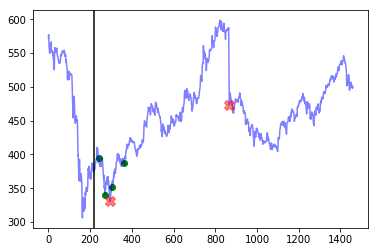




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


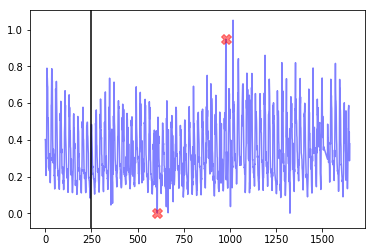




--- exchange-3_cpm_results ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1044, 1193, 1194, 1195]


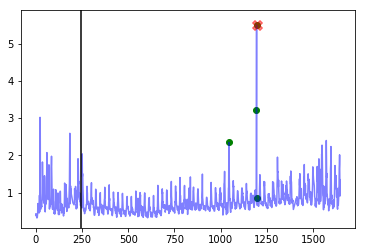




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [2518]


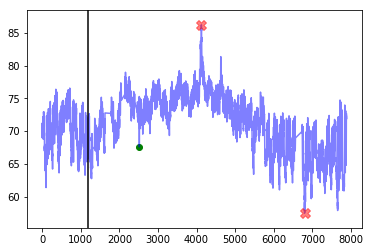




--- all_data_gift_certificates ---
Corresponding window precision:  0.16666666666666666
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  5
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [4286, 4963, 4964, 4986, 4992, 5662, 6137, 6505, 6506, 6650]


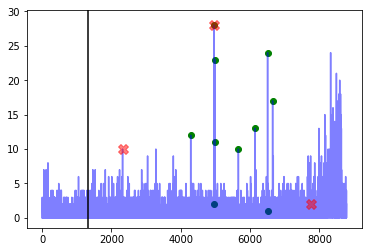




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


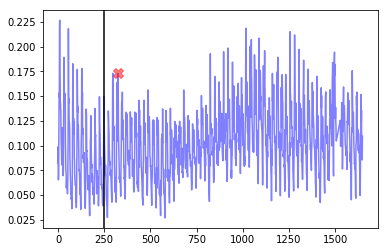




--- exchange-3_cpc_results ---
Corresponding window precision:  0.75
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [322, 466, 1041, 1044, 1194]


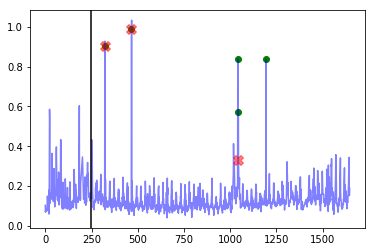




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.4
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [691, 979, 1267, 1555, 2970, 2973]


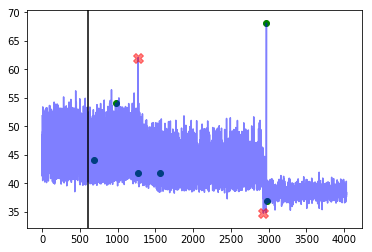




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1843, 3572, 3580, 3581]


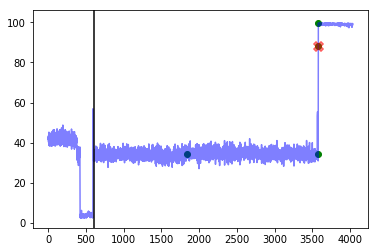




--- international-airline-passengers ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [100, 101]


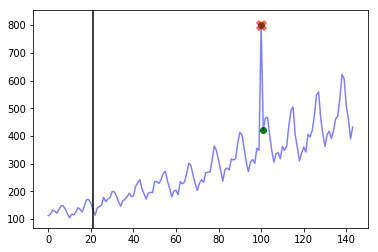

---------weight_fp=0.2, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  10.6
Best window threshold:  1.0
Corresponding window overall precision:  0.45454545454545453
Corresponding window overall recall:  0.5555555555555556
Corresponding window overall F score:  0.5



--- ibm-common-stock-closing-prices ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [242, 272, 303, 364]


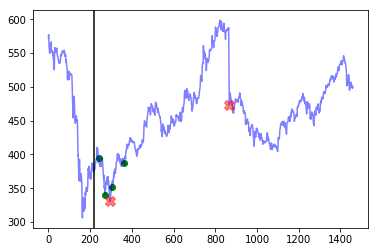




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


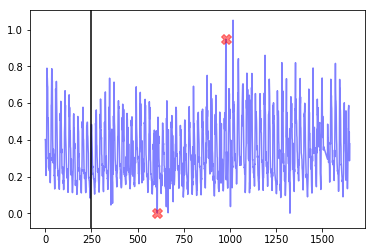




--- exchange-3_cpm_results ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1044, 1193, 1194, 1195]


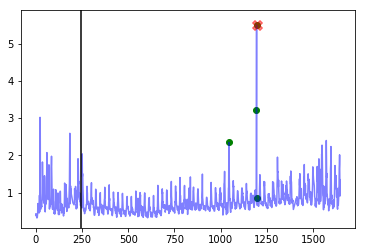




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [2518]


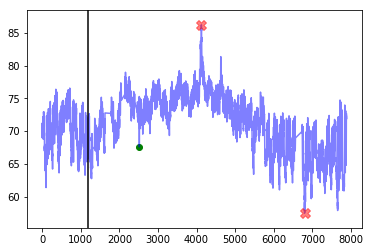




--- all_data_gift_certificates ---
Corresponding window precision:  0.16666666666666666
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  5
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [4286, 4963, 4964, 4986, 4992, 5662, 6137, 6505, 6506, 6650]


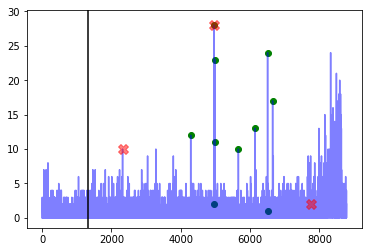




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


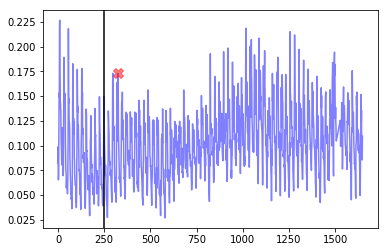




--- exchange-3_cpc_results ---
Corresponding window precision:  0.75
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [322, 466, 1041, 1044, 1194]


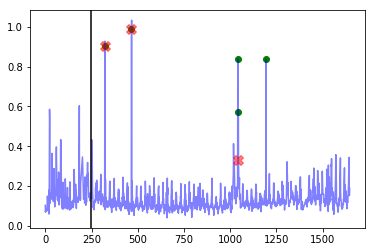




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.4
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [691, 979, 1267, 1555, 2970, 2973]


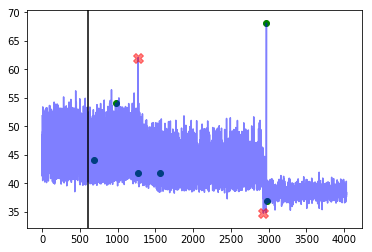




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1843, 3572, 3580, 3581]


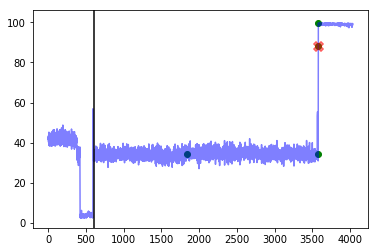




--- international-airline-passengers ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [100, 101]


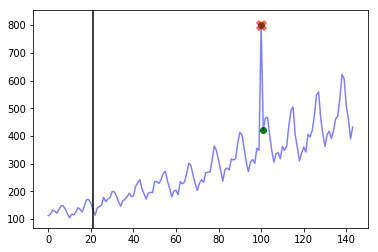

---------weight_fp=0.3, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  11.9
Best window threshold:  1.0
Corresponding window overall precision:  0.45454545454545453
Corresponding window overall recall:  0.5555555555555556
Corresponding window overall F score:  0.5



--- ibm-common-stock-closing-prices ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [242, 272, 303, 364]


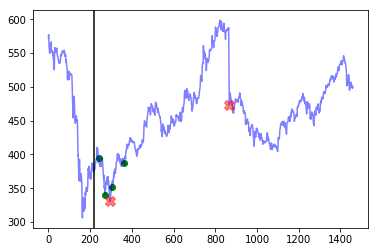




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


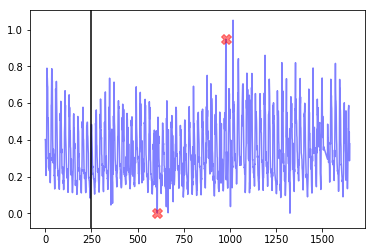




--- exchange-3_cpm_results ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1044, 1193, 1194, 1195]


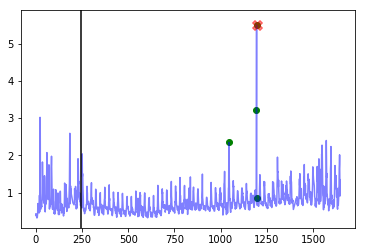




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [2518]


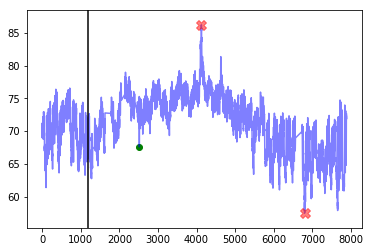




--- all_data_gift_certificates ---
Corresponding window precision:  0.16666666666666666
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  5
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [4286, 4963, 4964, 4986, 4992, 5662, 6137, 6505, 6506, 6650]


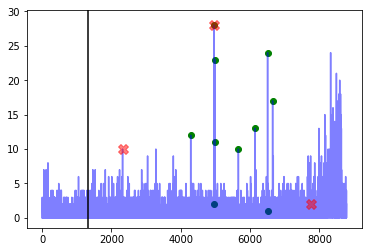




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


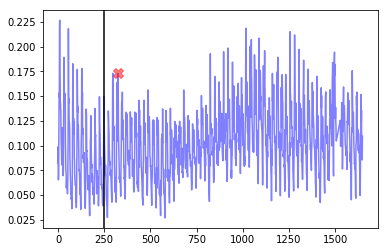




--- exchange-3_cpc_results ---
Corresponding window precision:  0.75
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [322, 466, 1041, 1044, 1194]


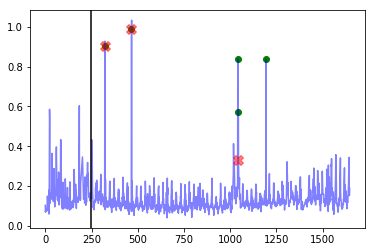




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.4
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [691, 979, 1267, 1555, 2970, 2973]


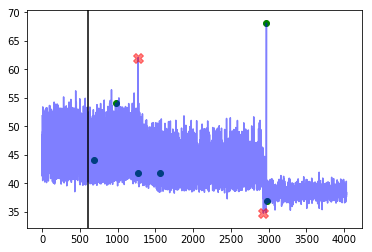




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1843, 3572, 3580, 3581]


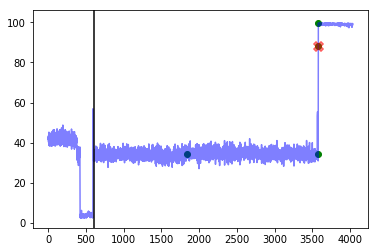




--- international-airline-passengers ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [100, 101]


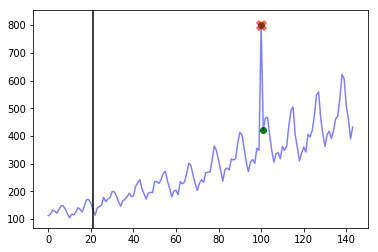

---------weight_fp=0.4, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  13.200000000000001
Best window threshold:  1.0
Corresponding window overall precision:  0.45454545454545453
Corresponding window overall recall:  0.5555555555555556
Corresponding window overall F score:  0.5



--- ibm-common-stock-closing-prices ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [242, 272, 303, 364]


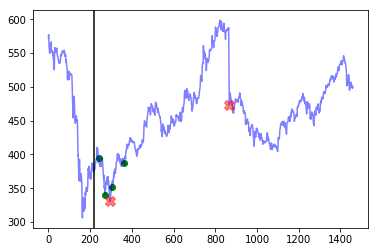




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


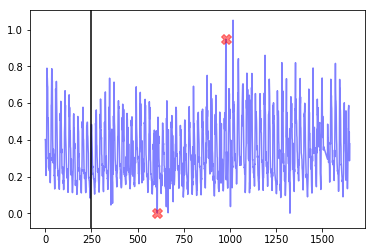




--- exchange-3_cpm_results ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1044, 1193, 1194, 1195]


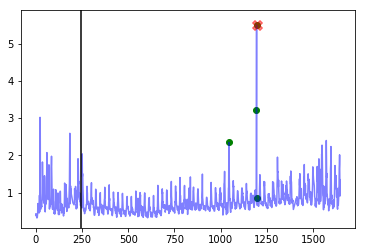




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [2518]


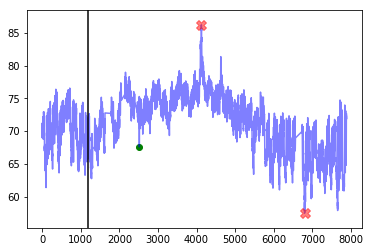




--- all_data_gift_certificates ---
Corresponding window precision:  0.16666666666666666
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  5
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [4286, 4963, 4964, 4986, 4992, 5662, 6137, 6505, 6506, 6650]


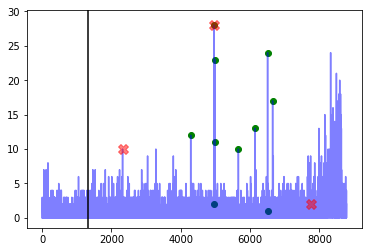




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


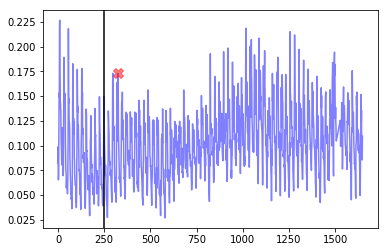




--- exchange-3_cpc_results ---
Corresponding window precision:  0.75
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [322, 466, 1041, 1044, 1194]


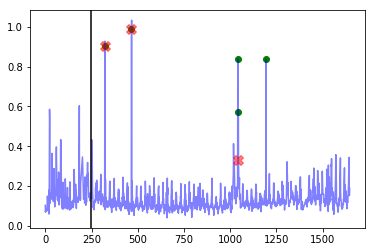




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.4
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [691, 979, 1267, 1555, 2970, 2973]


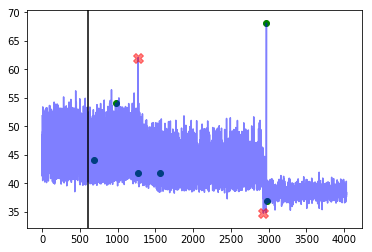




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1843, 3572, 3580, 3581]


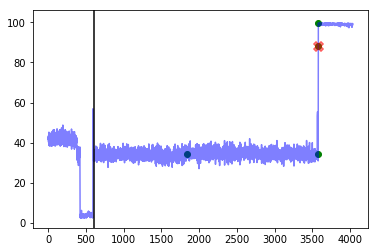




--- international-airline-passengers ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [100, 101]


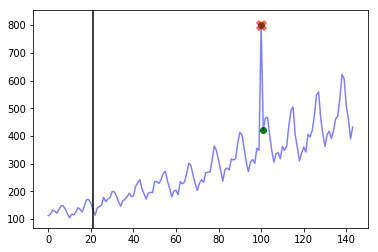

---------weight_fp=0.5, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  14.5
Best window threshold:  1.0
Corresponding window overall precision:  0.45454545454545453
Corresponding window overall recall:  0.5555555555555556
Corresponding window overall F score:  0.5



--- ibm-common-stock-closing-prices ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [242, 272, 303, 364]


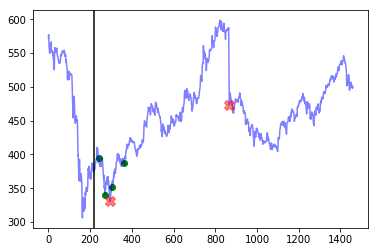




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


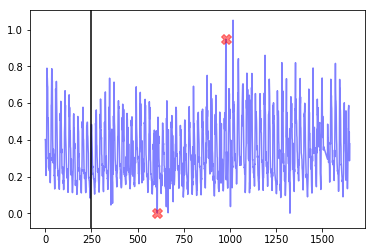




--- exchange-3_cpm_results ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1044, 1193, 1194, 1195]


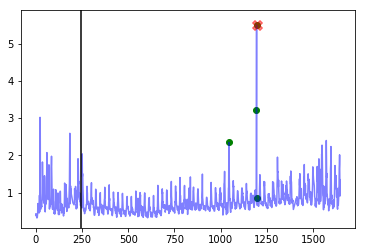




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [2518]


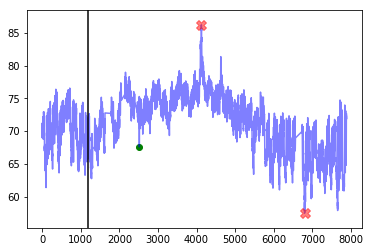




--- all_data_gift_certificates ---
Corresponding window precision:  0.16666666666666666
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  5
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [4286, 4963, 4964, 4986, 4992, 5662, 6137, 6505, 6506, 6650]


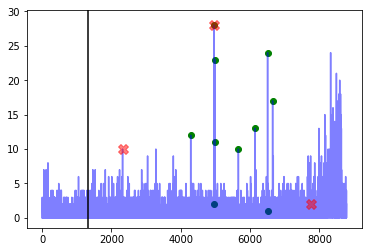




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


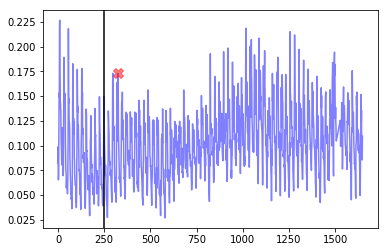




--- exchange-3_cpc_results ---
Corresponding window precision:  0.75
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [322, 466, 1041, 1044, 1194]


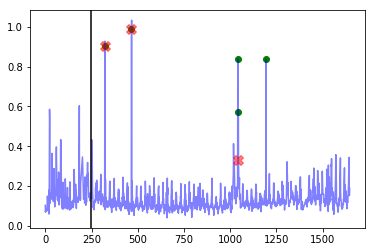




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.4
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [691, 979, 1267, 1555, 2970, 2973]


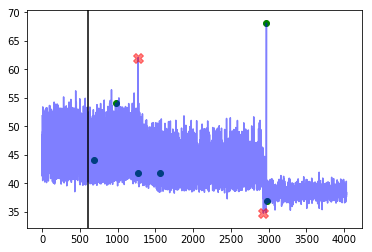




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1843, 3572, 3580, 3581]


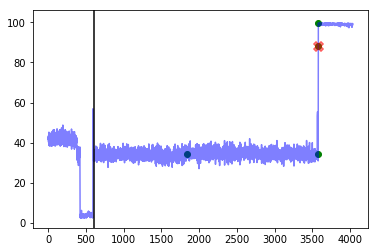




--- international-airline-passengers ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [100, 101]


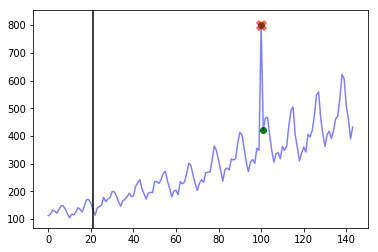

---------weight_fp=0.6, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  15.799999999999999
Best window threshold:  1.0
Corresponding window overall precision:  0.45454545454545453
Corresponding window overall recall:  0.5555555555555556
Corresponding window overall F score:  0.5



--- ibm-common-stock-closing-prices ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [242, 272, 303, 364]


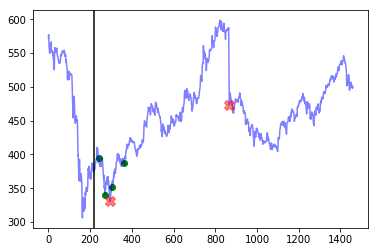




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


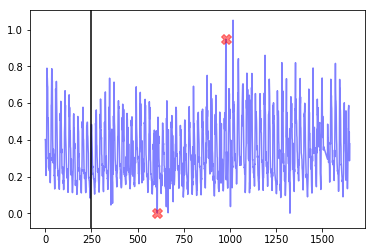




--- exchange-3_cpm_results ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1044, 1193, 1194, 1195]


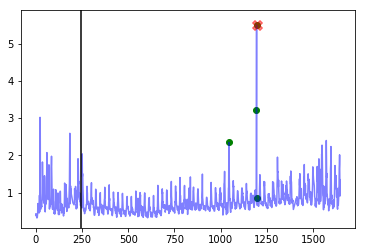




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [2518]


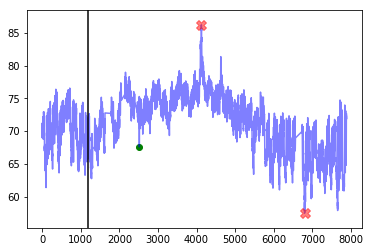




--- all_data_gift_certificates ---
Corresponding window precision:  0.16666666666666666
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  5
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [4286, 4963, 4964, 4986, 4992, 5662, 6137, 6505, 6506, 6650]


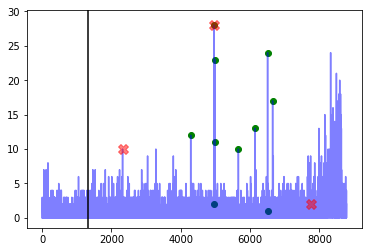




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


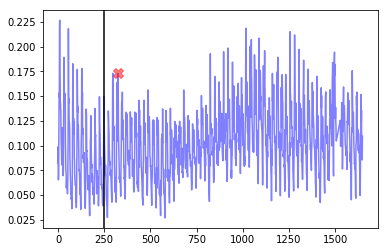




--- exchange-3_cpc_results ---
Corresponding window precision:  0.75
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [322, 466, 1041, 1044, 1194]


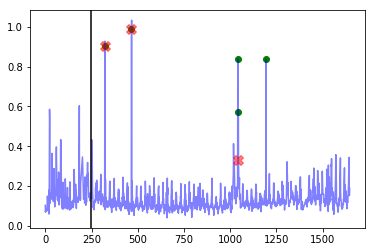




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.4
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [691, 979, 1267, 1555, 2970, 2973]


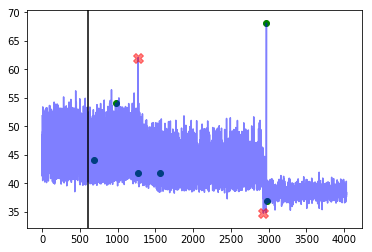




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1843, 3572, 3580, 3581]


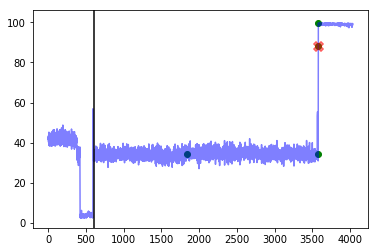




--- international-airline-passengers ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [100, 101]


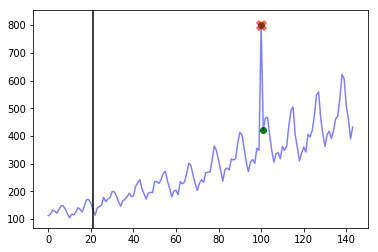

---------weight_fp=0.7, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  17.099999999999998
Best window threshold:  1.0
Corresponding window overall precision:  0.45454545454545453
Corresponding window overall recall:  0.5555555555555556
Corresponding window overall F score:  0.5



--- ibm-common-stock-closing-prices ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [242, 272, 303, 364]


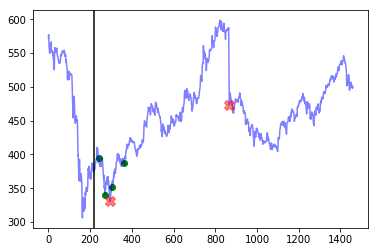




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


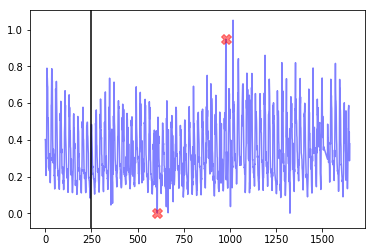




--- exchange-3_cpm_results ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1044, 1193, 1194, 1195]


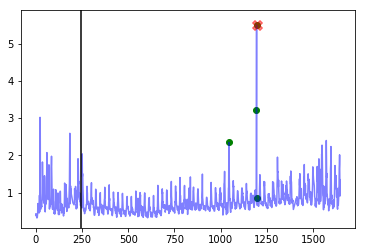




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [2518]


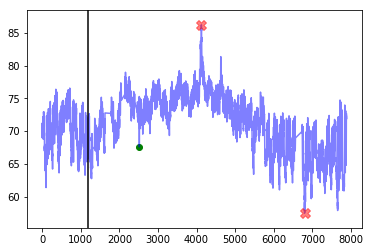




--- all_data_gift_certificates ---
Corresponding window precision:  0.16666666666666666
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  5
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [4286, 4963, 4964, 4986, 4992, 5662, 6137, 6505, 6506, 6650]


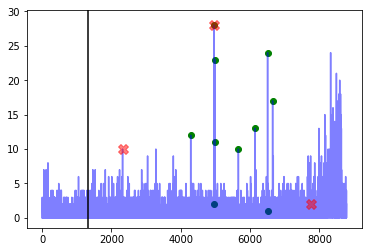




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


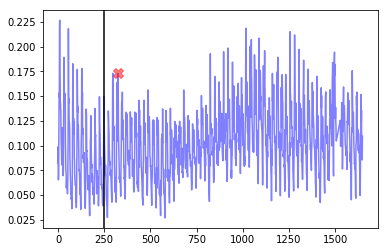




--- exchange-3_cpc_results ---
Corresponding window precision:  0.75
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [322, 466, 1041, 1044, 1194]


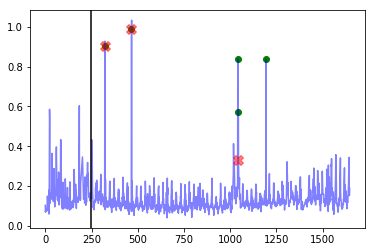




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.4
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [691, 979, 1267, 1555, 2970, 2973]


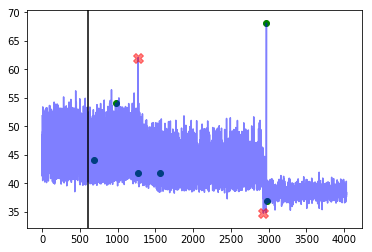




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1843, 3572, 3580, 3581]


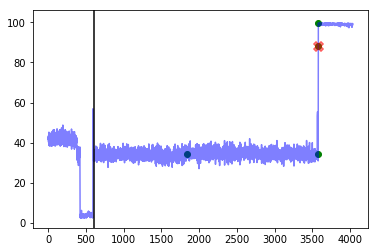




--- international-airline-passengers ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [100, 101]


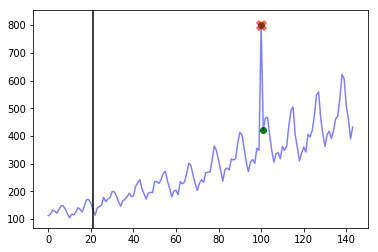

---------weight_fp=0.8, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  18.400000000000002
Best window threshold:  1.0
Corresponding window overall precision:  0.45454545454545453
Corresponding window overall recall:  0.5555555555555556
Corresponding window overall F score:  0.5



--- ibm-common-stock-closing-prices ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [242, 272, 303, 364]


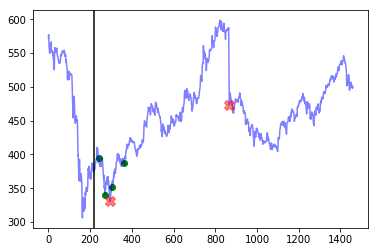




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


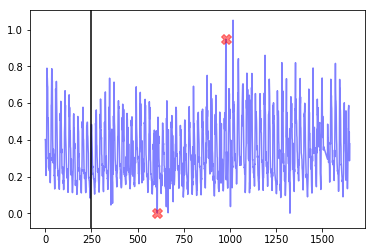




--- exchange-3_cpm_results ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1044, 1193, 1194, 1195]


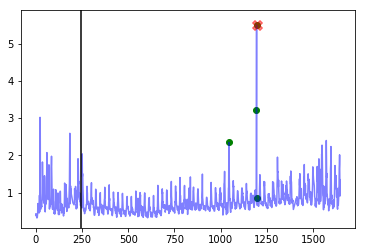




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [2518]


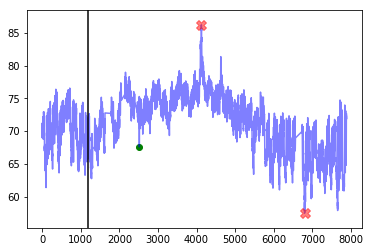




--- all_data_gift_certificates ---
Corresponding window precision:  0.16666666666666666
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  5
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [4286, 4963, 4964, 4986, 4992, 5662, 6137, 6505, 6506, 6650]


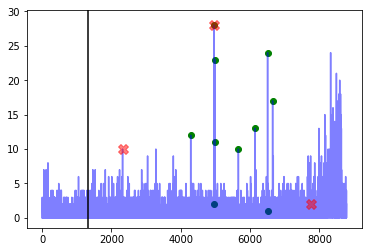




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


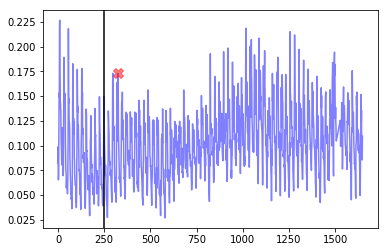




--- exchange-3_cpc_results ---
Corresponding window precision:  0.75
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [322, 466, 1041, 1044, 1194]


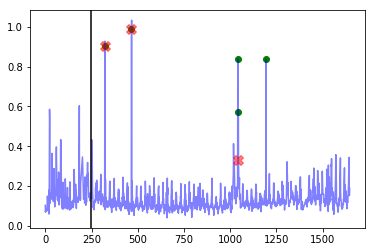




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.4
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [691, 979, 1267, 1555, 2970, 2973]


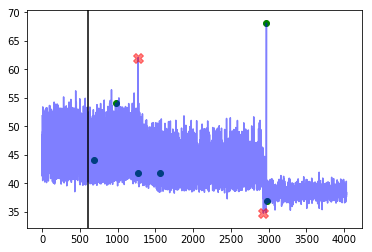




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1843, 3572, 3580, 3581]


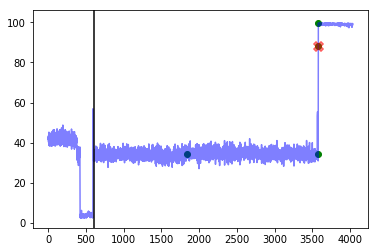




--- international-airline-passengers ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [100, 101]


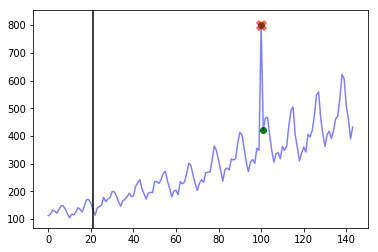

---------weight_fp=0.9, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  19.699999999999996
Best window threshold:  1.0
Corresponding window overall precision:  0.45454545454545453
Corresponding window overall recall:  0.5555555555555556
Corresponding window overall F score:  0.5



--- ibm-common-stock-closing-prices ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [242, 272, 303, 364]


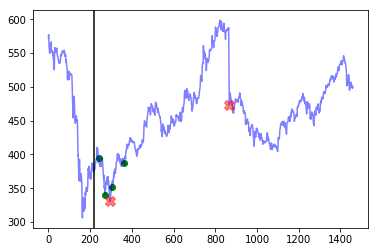




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


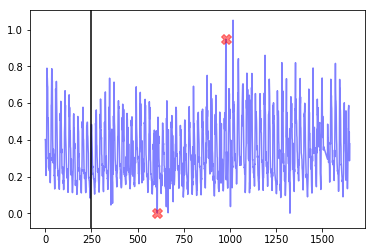




--- exchange-3_cpm_results ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1044, 1193, 1194, 1195]


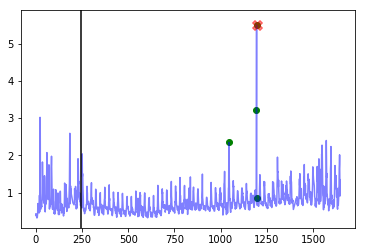




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [2518]


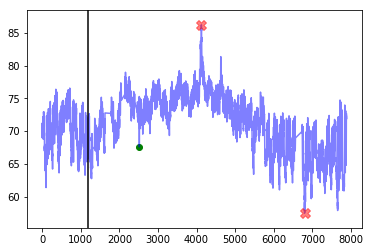




--- all_data_gift_certificates ---
Corresponding window precision:  0.16666666666666666
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  5
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [4286, 4963, 4964, 4986, 4992, 5662, 6137, 6505, 6506, 6650]


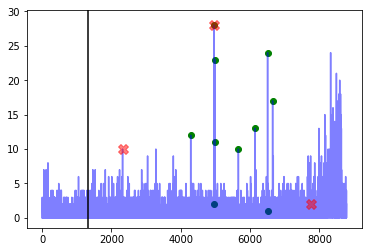




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


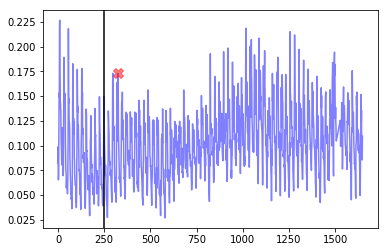




--- exchange-3_cpc_results ---
Corresponding window precision:  0.75
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [322, 466, 1041, 1044, 1194]


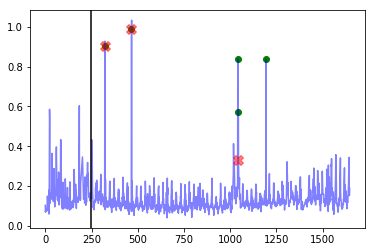




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.4
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [691, 979, 1267, 1555, 2970, 2973]


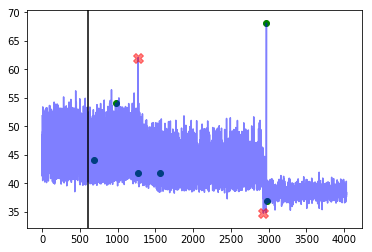




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1843, 3572, 3580, 3581]


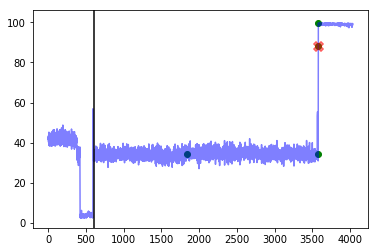




--- international-airline-passengers ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [100, 101]


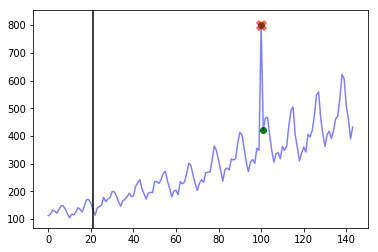

---------weight_fp=1.0, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  21.0
Best window threshold:  1.0
Corresponding window overall precision:  0.45454545454545453
Corresponding window overall recall:  0.5555555555555556
Corresponding window overall F score:  0.5



--- ibm-common-stock-closing-prices ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [242, 272, 303, 364]


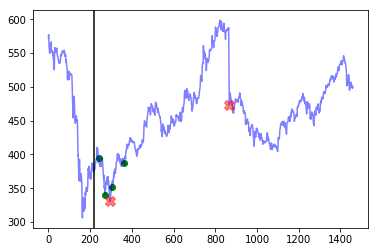




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


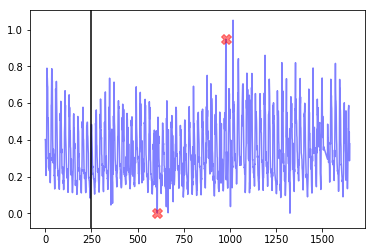




--- exchange-3_cpm_results ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1044, 1193, 1194, 1195]


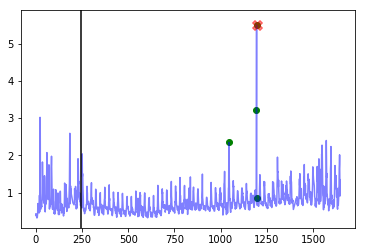




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [2518]


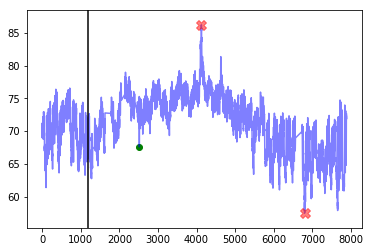




--- all_data_gift_certificates ---
Corresponding window precision:  0.16666666666666666
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  5
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [4286, 4963, 4964, 4986, 4992, 5662, 6137, 6505, 6506, 6650]


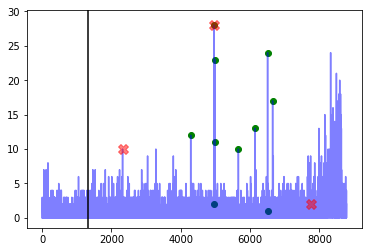




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


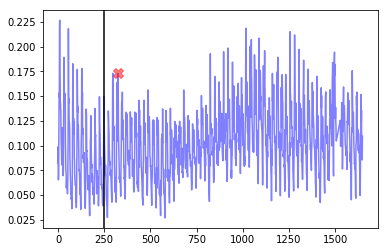




--- exchange-3_cpc_results ---
Corresponding window precision:  0.75
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [322, 466, 1041, 1044, 1194]


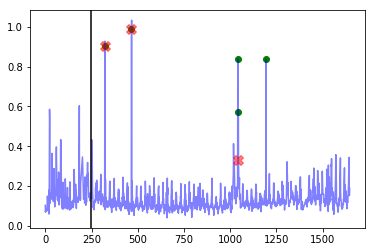




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.4
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [691, 979, 1267, 1555, 2970, 2973]


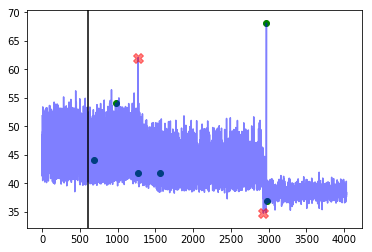




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1843, 3572, 3580, 3581]


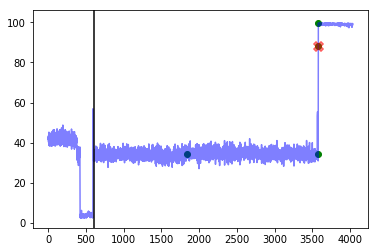




--- international-airline-passengers ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [100, 101]


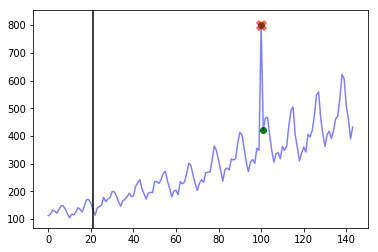

------------
False Positive Weight:  0.1
	 Minimum number of mistakes : 9.3
	 Best window threshold : 1.0
	 Corresponding window overall precision : 0.45454545454545453
	 Corresponding window overall recall : 0.5555555555555556
	 Corresponding window overall F score : 0.5
False Positive Weight:  0.2
	 Minimum number of mistakes : 10.6
	 Best window threshold : 1.0
	 Corresponding window overall precision : 0.45454545454545453
	 Corresponding window overall recall : 0.5555555555555556
	 Corresponding window overall F score : 0.5
False Positive Weight:  0.3
	 Minimum number of mistakes : 11.9
	 Best window threshold : 1.0
	 Corresponding window overall precision : 0.45454545454545453
	 Corresponding window overall recall : 0.5555555555555556
	 Corresponding window overall F score : 0.5
False Positive Weight:  0.4
	 Minimum number of mistakes : 13.200000000000001
	 Best window threshold : 1.0
	 Corresponding window overall precision : 0.45454545454545453
	 Corresponding window overall rec

In [17]:
end_results = {}
for weight_fp in weight_fp_list:  
    print("---------weight_fp=" + str(weight_fp) + ", weight_fn=1----------")
    weight_result = adclasses.pretty_print_results(ad_dict, anomaly_scores_dict, true_outlier_indices_dict, weight_fp=weight_fp, weight_fn=1)
    end_results[weight_fp] = weight_result

print("------------")
adclasses.pretty_print_end_results(end_results)

# Facebook Prophet Results

In [18]:
anomaly_scores_dict = {}

for dataset_name in dataset_name_list:
    output_dict_prophet = joblib.load("anomaly_scores" + window_size + "/Prophet/" + dataset_name)
    anomaly_scores_dict[dataset_name] = output_dict_prophet["Anomaly Scores"]

In [19]:
adclasses.precision_recall_curve_info(anomaly_scores_dict, true_outlier_indices_dict)

{0.1: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.2: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.3: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.4: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.5: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.6: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.7: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.8: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.9: {'precision': 0.1111111111111111, 'recall': 1.0},
 1.0: {'precision': 1.0, 'recall': 1.0}}

---------weight_fp=0.1, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  6.8999999999999995
Best window threshold:  0.9999
Corresponding window overall precision:  0.25
Corresponding window overall recall:  0.8888888888888888
Corresponding window overall F score:  0.3902439024390244



--- ibm-common-stock-closing-prices ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [246, 248, 249, 250, 251, 252, 254, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 294]


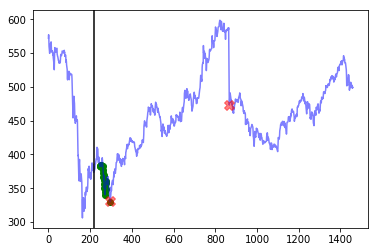




--- exchange-2_cpm_results ---
Corresponding window precision:  0.2
Corresponding window recall:  1.0
Corresponding window false positives:  8
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [348, 360, 365, 424, 601, 606, 655, 664, 665, 753, 801, 899, 976, 977, 978, 1016, 1104, 1522, 1523]


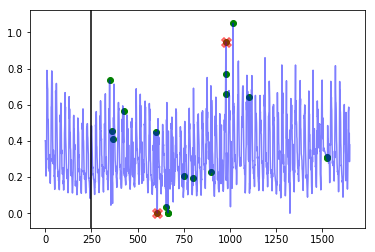




--- exchange-3_cpm_results ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1193, 1194]


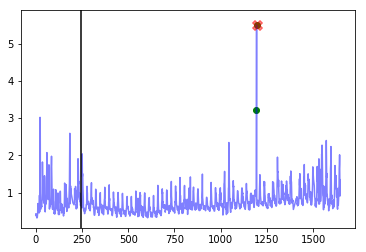




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.25
Corresponding window recall:  1.0
Corresponding window false positives:  6
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1585, 1586, 1588, 1589, 1590, 1591, 1593, 2095, 2096, 2097, 2954, 4105, 4106, 4107, 4108, 4109, 4110, 4111, 4113, 4121, 4122, 4123, 4124, 4125, 4126, 4127, 4128, 4129, 4130, 4131, 4132, 4133, 4134, 4135, 5899, 5900, 5901, 5902, 5905, 5906, 5907, 5908, 5909, 5910, 5911, 6629, 6630, 6631, 6632, 6633, 6634, 6635, 6636, 6637, 6650, 6651, 6652, 6653, 6654, 6655, 6656, 6657, 6788, 7671, 7719]


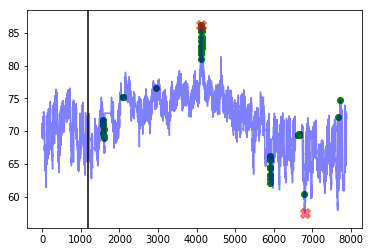




--- all_data_gift_certificates ---
Corresponding window precision:  0.125
Corresponding window recall:  1.0
Corresponding window false positives:  21
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1438, 1462, 1483, 1487, 1505, 1531, 1822, 1918, 2009, 2059, 2157, 2176, 2233, 2304, 2320, 2471, 2871, 2894, 2899, 2974, 3014, 3016, 3042, 3281, 3664, 3688, 3785, 3790, 3805, 3810, 3841, 3855, 4286, 4516, 4946, 4961, 4963, 4986, 4992, 5632, 5662, 5905, 6014, 6019, 6137, 6164, 6167, 6375, 6471, 6505, 6650, 6669, 7317, 7318, 7366, 7396, 7655, 7656, 7677, 7679, 7680, 7696, 7720, 7746, 7838, 7864, 7985, 7987, 7989, 7994, 8009, 8010, 8017, 8059, 8060, 8157, 8162, 8175, 8177, 8252, 8253, 8301, 8323, 8324, 8325, 8326, 8327, 8345, 8346, 8347, 8370, 8371, 8372, 8375, 8393, 8394, 8490, 8491, 8563, 8586, 8610]


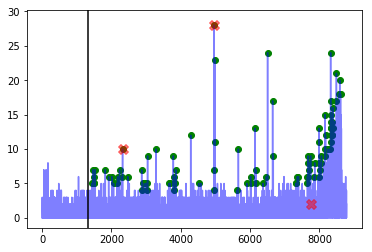




--- exchange-2_cpc_results ---
Corresponding window precision:  0.25
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [317, 325, 439, 489, 534, 535, 558, 559, 560, 561, 583, 585, 586, 607, 609, 633, 655, 1210, 1306]


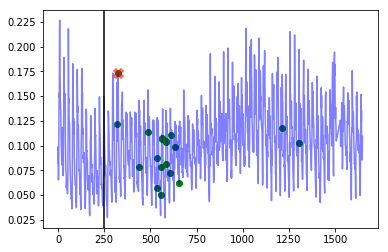




--- exchange-3_cpc_results ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [322, 323, 466, 467, 1016, 1017, 1018, 1019, 1020, 1022, 1023, 1024, 1035, 1040, 1041, 1042, 1043, 1044, 1045, 1046, 1049, 1050, 1193, 1194, 1643]


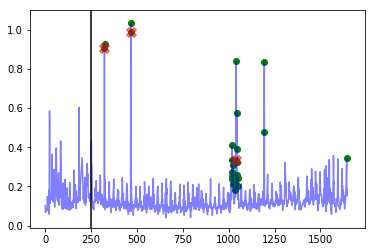




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.6666666666666666
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1271, 2970, 3668]


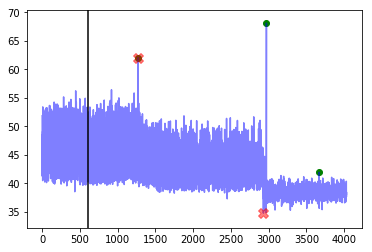




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  2
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [640, 645, 646, 647, 648, 649, 650, 651, 652, 653, 654, 655, 656, 657, 658, 659, 660, 661, 662, 663, 664, 665, 666, 667, 668, 669, 670, 671, 672, 673, 674, 675, 676, 677, 678, 679, 680, 681, 682, 683, 684, 685, 686, 687, 688, 689, 690, 691, 692, 693, 694, 695, 696, 697, 698, 699, 700, 701, 702, 703, 704, 705, 706, 707, 708, 709, 710, 711, 901, 907, 908, 909, 910, 911, 958, 960, 961, 962, 963, 964, 966, 967, 968, 969, 970, 971, 972, 973, 974, 975, 976, 977, 978, 979, 980, 981, 982, 983, 984, 985, 986, 987, 988, 989, 990, 991, 993, 994, 995, 996, 997, 999, 1000, 1001, 1002, 1005, 1006, 1007, 1008, 1009, 1011]


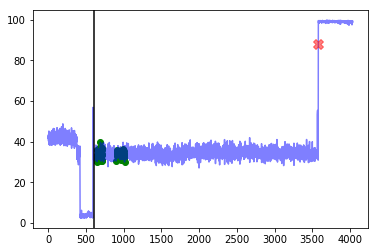




--- international-airline-passengers ---
Corresponding window precision:  0.2
Corresponding window recall:  1.0
Corresponding window false positives:  4
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [78, 90, 100, 102, 103, 114, 115, 126, 127, 137, 138, 139]


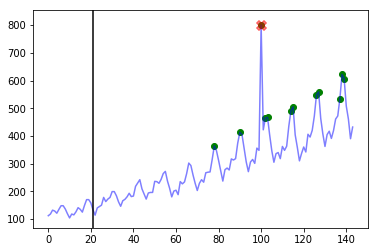

---------weight_fp=0.2, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  11.799999999999999
Best window threshold:  0.9999
Corresponding window overall precision:  0.25
Corresponding window overall recall:  0.8888888888888888
Corresponding window overall F score:  0.3902439024390244



--- ibm-common-stock-closing-prices ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [246, 248, 249, 250, 251, 252, 254, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 294]


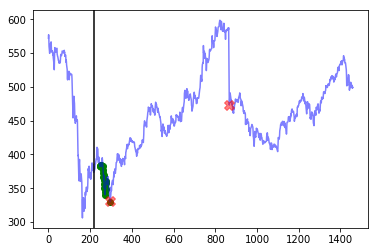




--- exchange-2_cpm_results ---
Corresponding window precision:  0.2
Corresponding window recall:  1.0
Corresponding window false positives:  8
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [348, 360, 365, 424, 601, 606, 655, 664, 665, 753, 801, 899, 976, 977, 978, 1016, 1104, 1522, 1523]


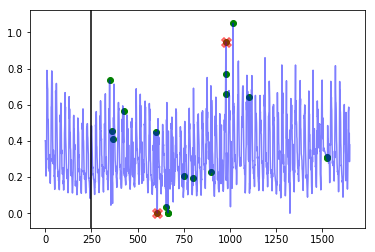




--- exchange-3_cpm_results ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1193, 1194]


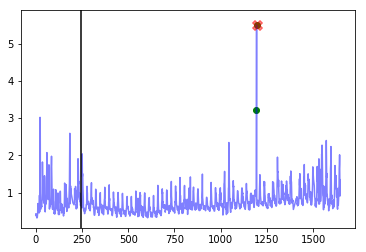




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.25
Corresponding window recall:  1.0
Corresponding window false positives:  6
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1585, 1586, 1588, 1589, 1590, 1591, 1593, 2095, 2096, 2097, 2954, 4105, 4106, 4107, 4108, 4109, 4110, 4111, 4113, 4121, 4122, 4123, 4124, 4125, 4126, 4127, 4128, 4129, 4130, 4131, 4132, 4133, 4134, 4135, 5899, 5900, 5901, 5902, 5905, 5906, 5907, 5908, 5909, 5910, 5911, 6629, 6630, 6631, 6632, 6633, 6634, 6635, 6636, 6637, 6650, 6651, 6652, 6653, 6654, 6655, 6656, 6657, 6788, 7671, 7719]


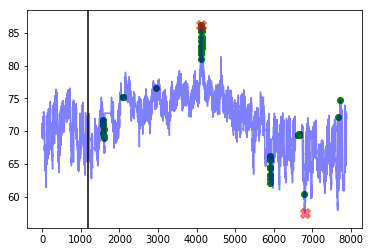




--- all_data_gift_certificates ---
Corresponding window precision:  0.125
Corresponding window recall:  1.0
Corresponding window false positives:  21
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1438, 1462, 1483, 1487, 1505, 1531, 1822, 1918, 2009, 2059, 2157, 2176, 2233, 2304, 2320, 2471, 2871, 2894, 2899, 2974, 3014, 3016, 3042, 3281, 3664, 3688, 3785, 3790, 3805, 3810, 3841, 3855, 4286, 4516, 4946, 4961, 4963, 4986, 4992, 5632, 5662, 5905, 6014, 6019, 6137, 6164, 6167, 6375, 6471, 6505, 6650, 6669, 7317, 7318, 7366, 7396, 7655, 7656, 7677, 7679, 7680, 7696, 7720, 7746, 7838, 7864, 7985, 7987, 7989, 7994, 8009, 8010, 8017, 8059, 8060, 8157, 8162, 8175, 8177, 8252, 8253, 8301, 8323, 8324, 8325, 8326, 8327, 8345, 8346, 8347, 8370, 8371, 8372, 8375, 8393, 8394, 8490, 8491, 8563, 8586, 8610]


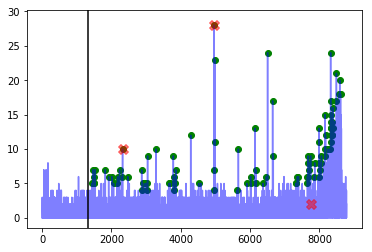




--- exchange-2_cpc_results ---
Corresponding window precision:  0.25
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [317, 325, 439, 489, 534, 535, 558, 559, 560, 561, 583, 585, 586, 607, 609, 633, 655, 1210, 1306]


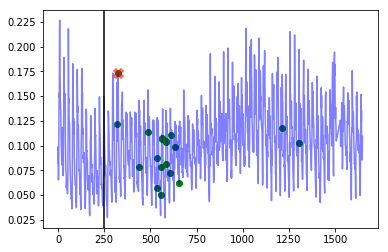




--- exchange-3_cpc_results ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [322, 323, 466, 467, 1016, 1017, 1018, 1019, 1020, 1022, 1023, 1024, 1035, 1040, 1041, 1042, 1043, 1044, 1045, 1046, 1049, 1050, 1193, 1194, 1643]


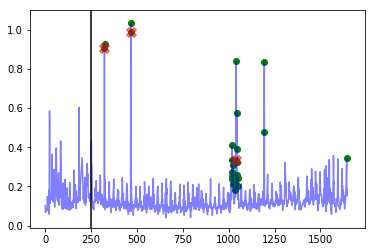




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.6666666666666666
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1271, 2970, 3668]


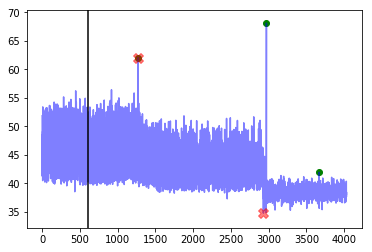




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  2
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [640, 645, 646, 647, 648, 649, 650, 651, 652, 653, 654, 655, 656, 657, 658, 659, 660, 661, 662, 663, 664, 665, 666, 667, 668, 669, 670, 671, 672, 673, 674, 675, 676, 677, 678, 679, 680, 681, 682, 683, 684, 685, 686, 687, 688, 689, 690, 691, 692, 693, 694, 695, 696, 697, 698, 699, 700, 701, 702, 703, 704, 705, 706, 707, 708, 709, 710, 711, 901, 907, 908, 909, 910, 911, 958, 960, 961, 962, 963, 964, 966, 967, 968, 969, 970, 971, 972, 973, 974, 975, 976, 977, 978, 979, 980, 981, 982, 983, 984, 985, 986, 987, 988, 989, 990, 991, 993, 994, 995, 996, 997, 999, 1000, 1001, 1002, 1005, 1006, 1007, 1008, 1009, 1011]


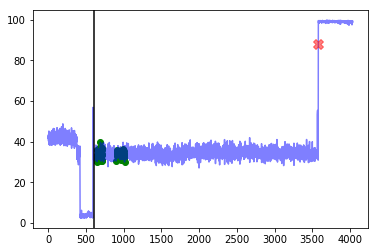




--- international-airline-passengers ---
Corresponding window precision:  0.2
Corresponding window recall:  1.0
Corresponding window false positives:  4
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [78, 90, 100, 102, 103, 114, 115, 126, 127, 137, 138, 139]


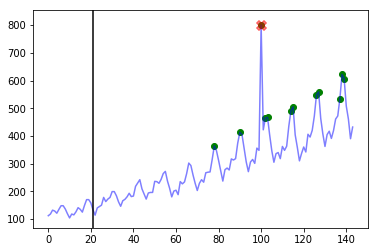

---------weight_fp=0.3, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  12.700000000000001
Best window threshold:  1.0
Corresponding window overall precision:  0.47058823529411764
Corresponding window overall recall:  0.4444444444444444
Corresponding window overall F score:  0.45714285714285713



--- ibm-common-stock-closing-prices ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


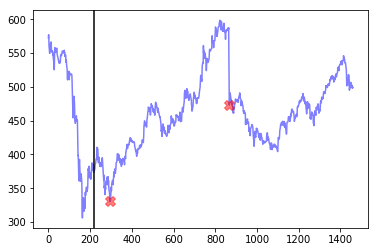




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


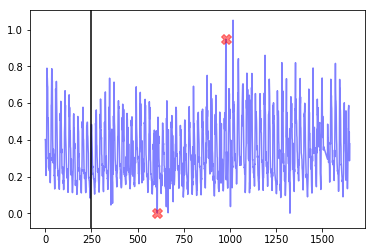




--- exchange-3_cpm_results ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1194]


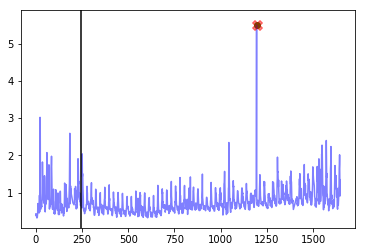




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


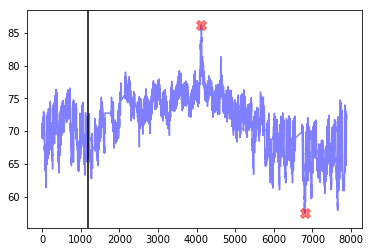




--- all_data_gift_certificates ---
Corresponding window precision:  0.2222222222222222
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  7
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2320, 4286, 4963, 4986, 4992, 5662, 6137, 6505, 6650, 7985, 8324]


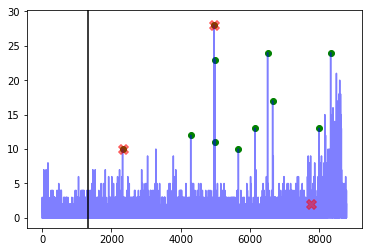




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


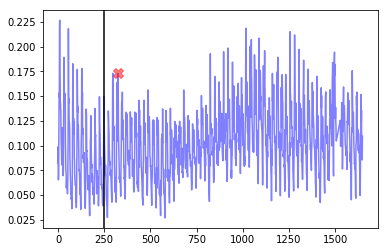




--- exchange-3_cpc_results ---
Corresponding window precision:  0.75
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [322, 323, 466, 467, 1018, 1041, 1044, 1194]


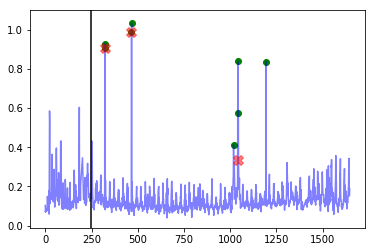




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2970]


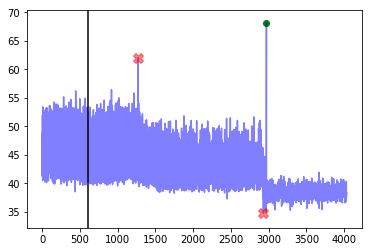




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [687, 693, 697, 700, 706]


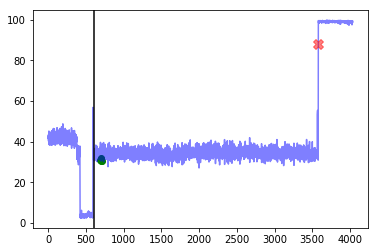




--- international-airline-passengers ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [100]


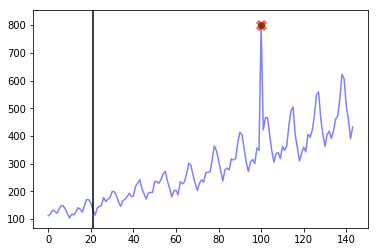

---------weight_fp=0.4, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  13.600000000000001
Best window threshold:  1.0
Corresponding window overall precision:  0.47058823529411764
Corresponding window overall recall:  0.4444444444444444
Corresponding window overall F score:  0.45714285714285713



--- ibm-common-stock-closing-prices ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


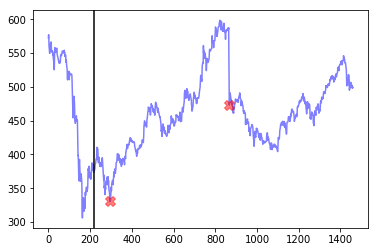




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


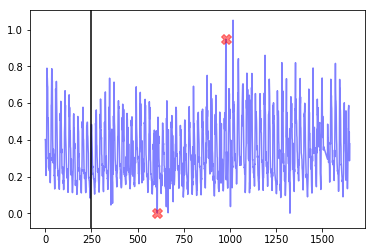




--- exchange-3_cpm_results ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1194]


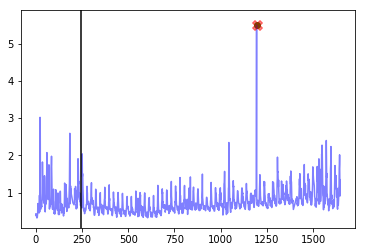




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


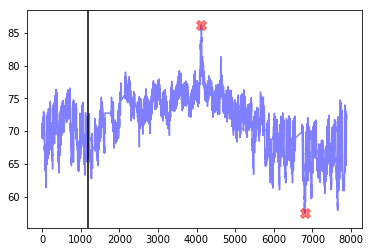




--- all_data_gift_certificates ---
Corresponding window precision:  0.2222222222222222
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  7
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2320, 4286, 4963, 4986, 4992, 5662, 6137, 6505, 6650, 7985, 8324]


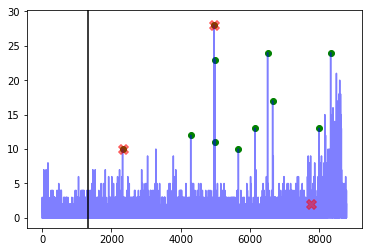




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


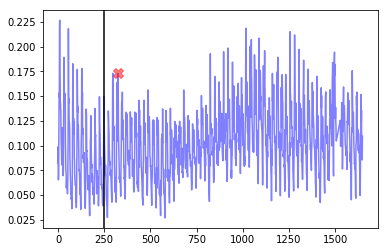




--- exchange-3_cpc_results ---
Corresponding window precision:  0.75
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [322, 323, 466, 467, 1018, 1041, 1044, 1194]


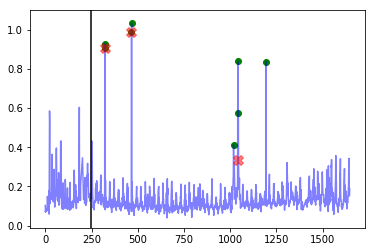




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2970]


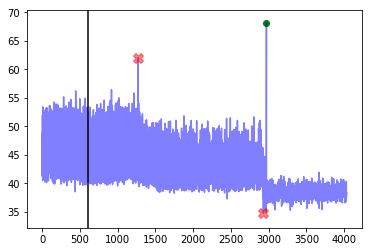




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [687, 693, 697, 700, 706]


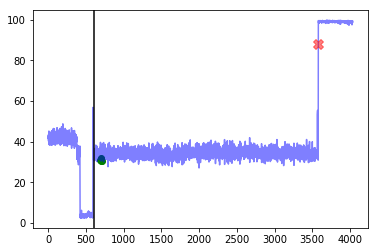




--- international-airline-passengers ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [100]


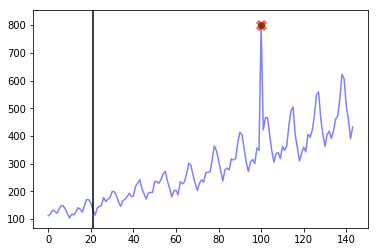

---------weight_fp=0.5, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  14.5
Best window threshold:  1.0
Corresponding window overall precision:  0.47058823529411764
Corresponding window overall recall:  0.4444444444444444
Corresponding window overall F score:  0.45714285714285713



--- ibm-common-stock-closing-prices ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


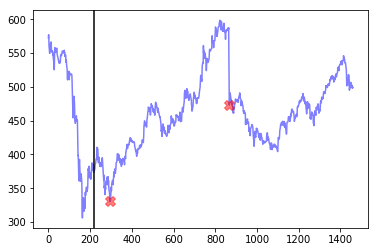




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


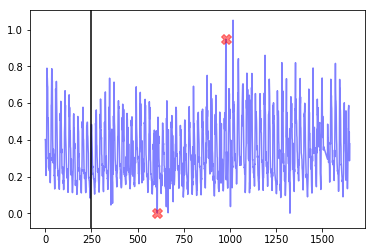




--- exchange-3_cpm_results ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1194]


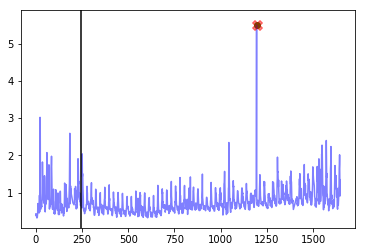




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


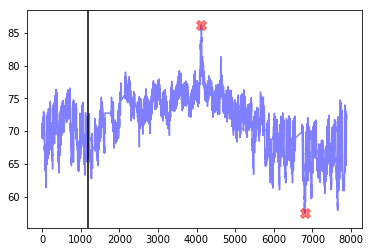




--- all_data_gift_certificates ---
Corresponding window precision:  0.2222222222222222
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  7
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2320, 4286, 4963, 4986, 4992, 5662, 6137, 6505, 6650, 7985, 8324]


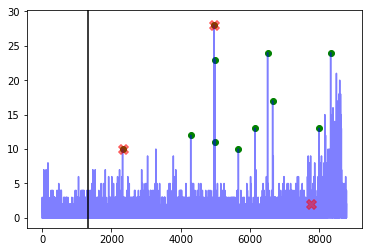




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


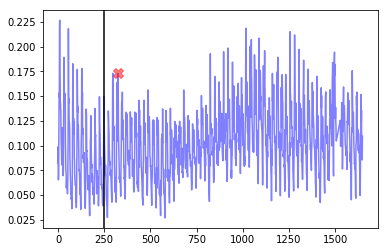




--- exchange-3_cpc_results ---
Corresponding window precision:  0.75
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [322, 323, 466, 467, 1018, 1041, 1044, 1194]


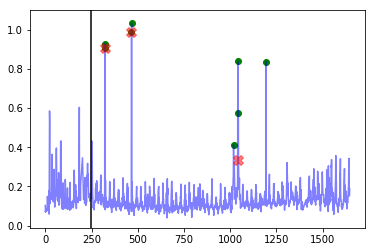




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2970]


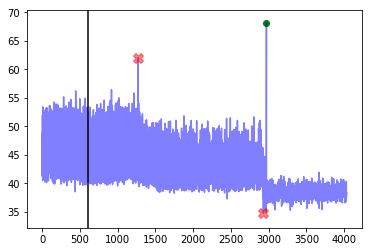




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [687, 693, 697, 700, 706]


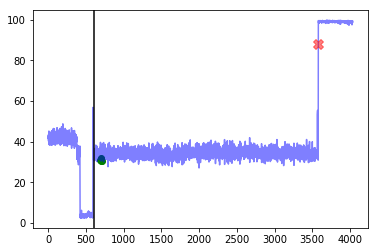




--- international-airline-passengers ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [100]


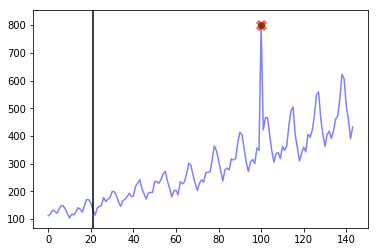

---------weight_fp=0.6, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  15.399999999999999
Best window threshold:  1.0
Corresponding window overall precision:  0.47058823529411764
Corresponding window overall recall:  0.4444444444444444
Corresponding window overall F score:  0.45714285714285713



--- ibm-common-stock-closing-prices ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


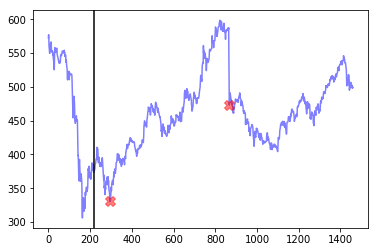




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


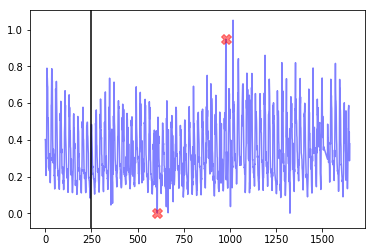




--- exchange-3_cpm_results ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1194]


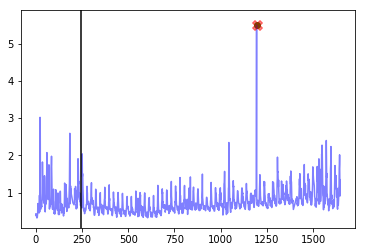




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


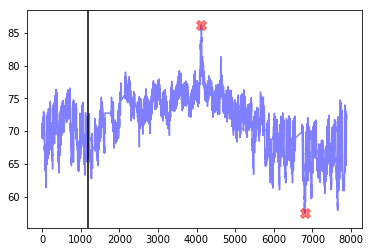




--- all_data_gift_certificates ---
Corresponding window precision:  0.2222222222222222
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  7
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2320, 4286, 4963, 4986, 4992, 5662, 6137, 6505, 6650, 7985, 8324]


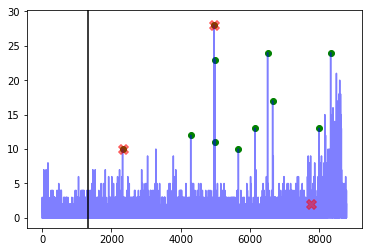




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


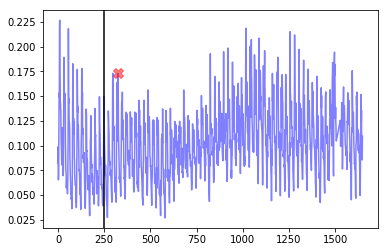




--- exchange-3_cpc_results ---
Corresponding window precision:  0.75
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [322, 323, 466, 467, 1018, 1041, 1044, 1194]


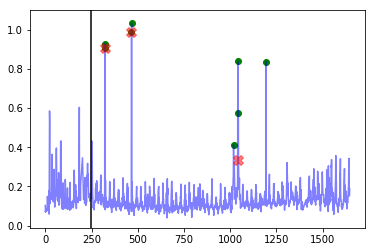




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2970]


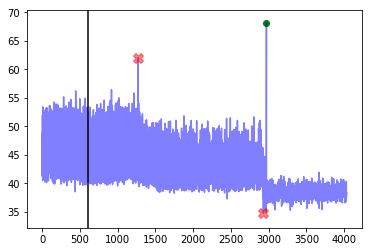




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [687, 693, 697, 700, 706]


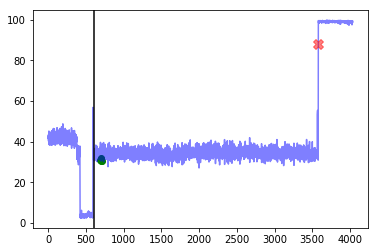




--- international-airline-passengers ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [100]


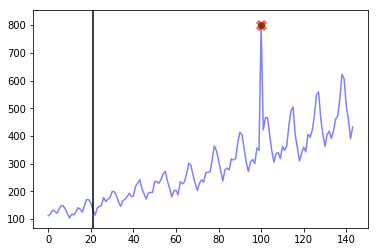

---------weight_fp=0.7, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  16.299999999999997
Best window threshold:  1.0
Corresponding window overall precision:  0.47058823529411764
Corresponding window overall recall:  0.4444444444444444
Corresponding window overall F score:  0.45714285714285713



--- ibm-common-stock-closing-prices ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


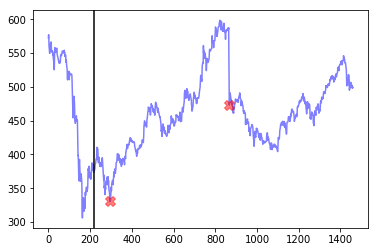




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


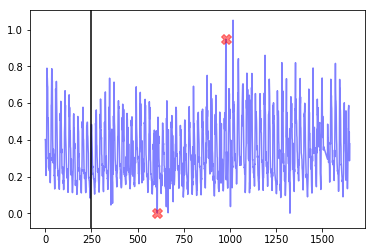




--- exchange-3_cpm_results ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1194]


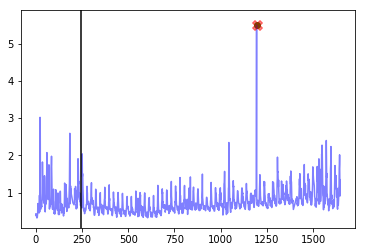




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


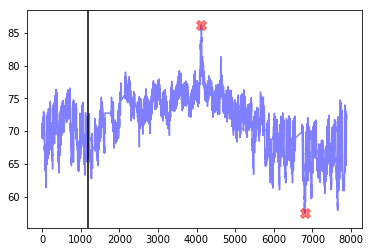




--- all_data_gift_certificates ---
Corresponding window precision:  0.2222222222222222
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  7
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2320, 4286, 4963, 4986, 4992, 5662, 6137, 6505, 6650, 7985, 8324]


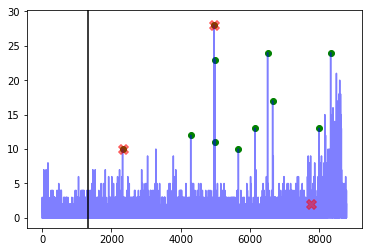




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


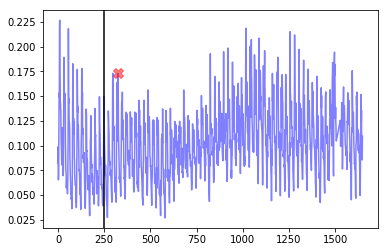




--- exchange-3_cpc_results ---
Corresponding window precision:  0.75
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [322, 323, 466, 467, 1018, 1041, 1044, 1194]


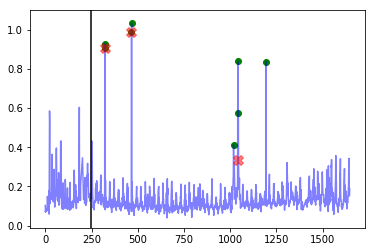




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2970]


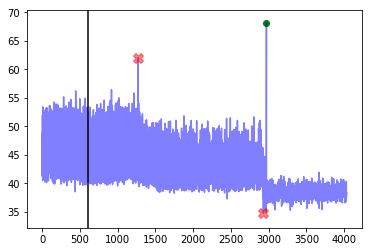




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [687, 693, 697, 700, 706]


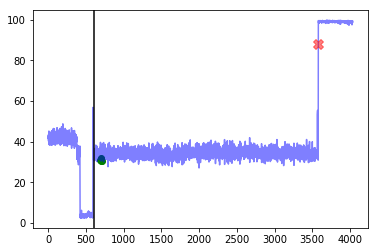




--- international-airline-passengers ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [100]


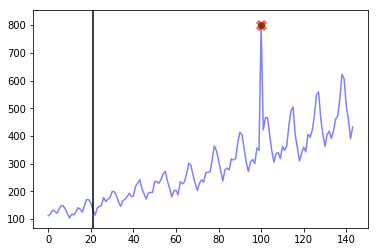

---------weight_fp=0.8, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  17.200000000000003
Best window threshold:  1.0
Corresponding window overall precision:  0.47058823529411764
Corresponding window overall recall:  0.4444444444444444
Corresponding window overall F score:  0.45714285714285713



--- ibm-common-stock-closing-prices ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


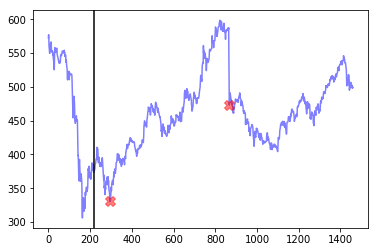




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


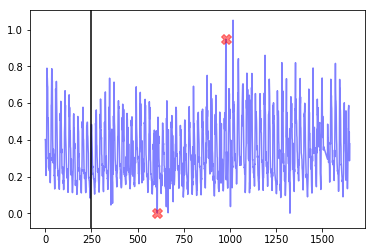




--- exchange-3_cpm_results ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1194]


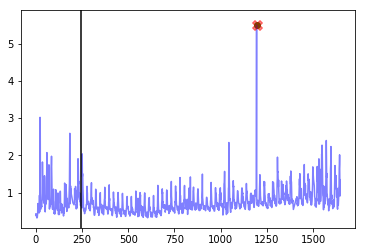




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


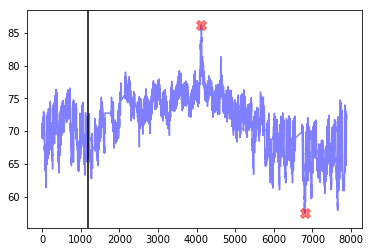




--- all_data_gift_certificates ---
Corresponding window precision:  0.2222222222222222
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  7
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2320, 4286, 4963, 4986, 4992, 5662, 6137, 6505, 6650, 7985, 8324]


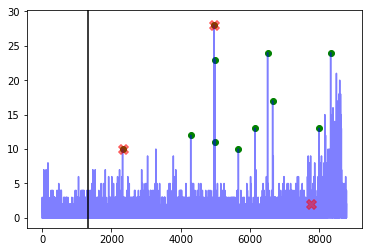




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


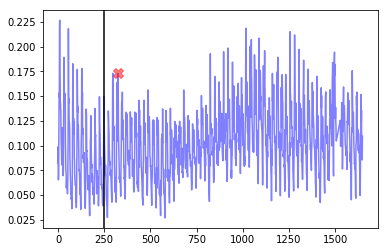




--- exchange-3_cpc_results ---
Corresponding window precision:  0.75
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [322, 323, 466, 467, 1018, 1041, 1044, 1194]


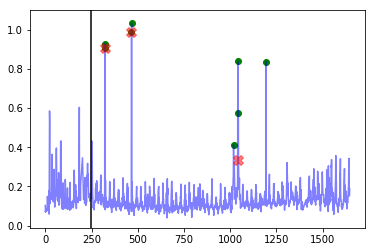




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2970]


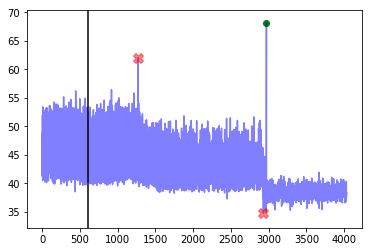




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [687, 693, 697, 700, 706]


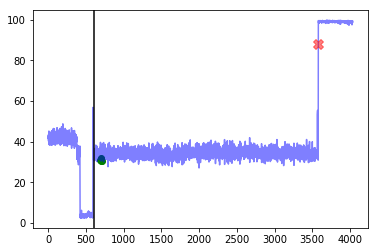




--- international-airline-passengers ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [100]


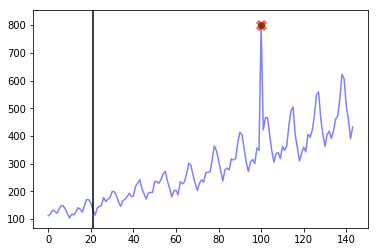

---------weight_fp=0.9, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  18.1
Best window threshold:  1.0
Corresponding window overall precision:  0.47058823529411764
Corresponding window overall recall:  0.4444444444444444
Corresponding window overall F score:  0.45714285714285713



--- ibm-common-stock-closing-prices ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


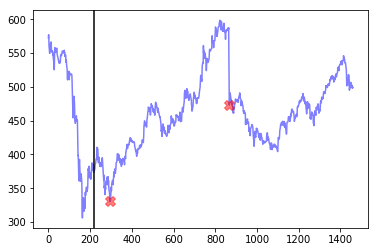




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


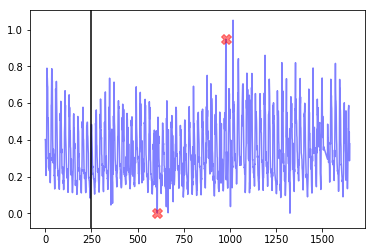




--- exchange-3_cpm_results ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1194]


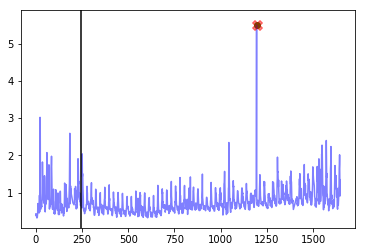




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


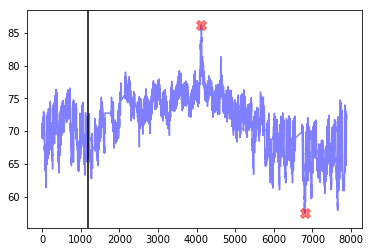




--- all_data_gift_certificates ---
Corresponding window precision:  0.2222222222222222
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  7
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2320, 4286, 4963, 4986, 4992, 5662, 6137, 6505, 6650, 7985, 8324]


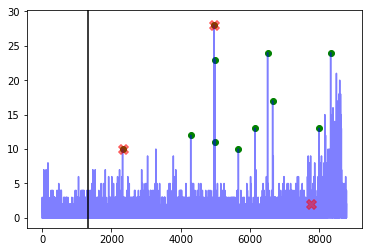




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


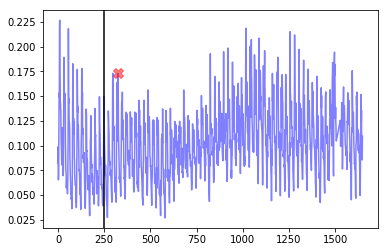




--- exchange-3_cpc_results ---
Corresponding window precision:  0.75
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [322, 323, 466, 467, 1018, 1041, 1044, 1194]


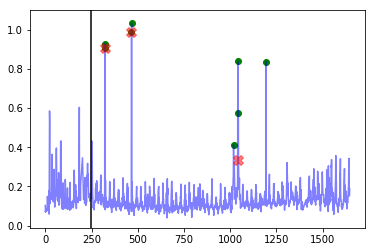




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2970]


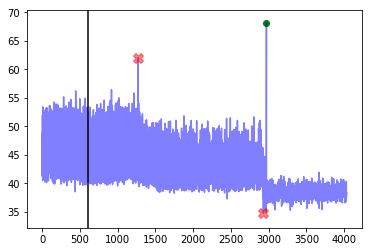




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [687, 693, 697, 700, 706]


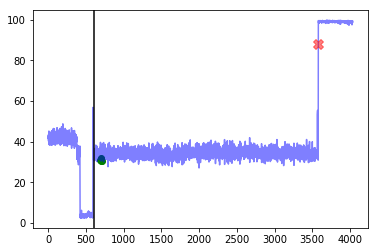




--- international-airline-passengers ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [100]


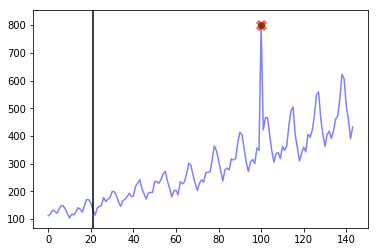

---------weight_fp=1.0, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  19.0
Best window threshold:  1.0
Corresponding window overall precision:  0.47058823529411764
Corresponding window overall recall:  0.4444444444444444
Corresponding window overall F score:  0.45714285714285713



--- ibm-common-stock-closing-prices ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


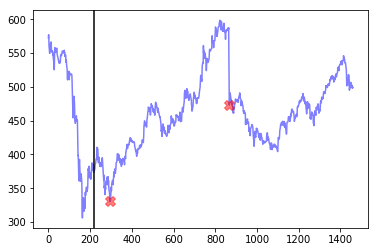




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


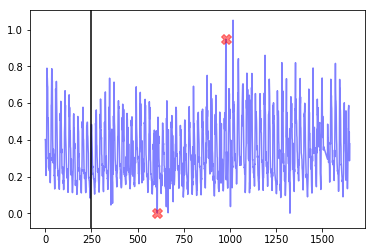




--- exchange-3_cpm_results ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1194]


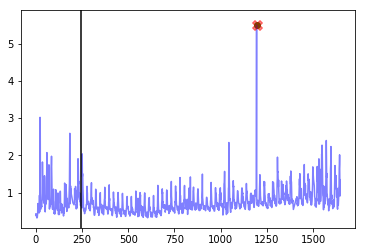




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


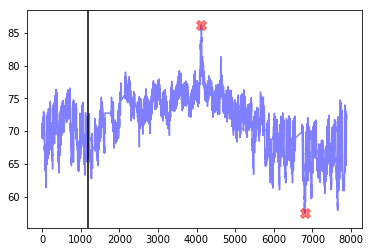




--- all_data_gift_certificates ---
Corresponding window precision:  0.2222222222222222
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  7
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2320, 4286, 4963, 4986, 4992, 5662, 6137, 6505, 6650, 7985, 8324]


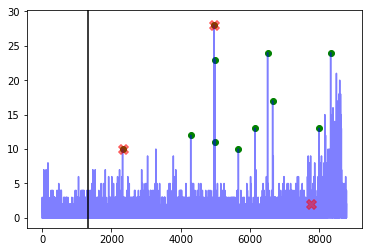




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


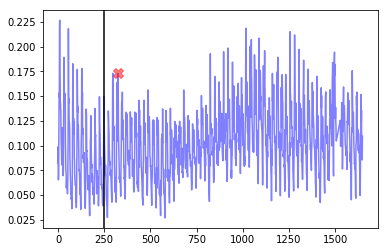




--- exchange-3_cpc_results ---
Corresponding window precision:  0.75
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [322, 323, 466, 467, 1018, 1041, 1044, 1194]


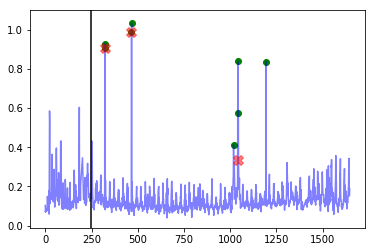




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2970]


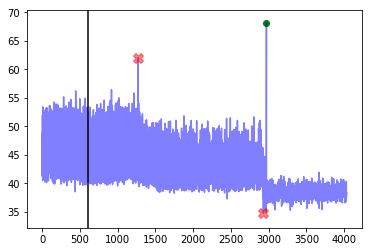




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [687, 693, 697, 700, 706]


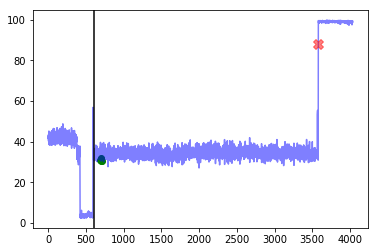




--- international-airline-passengers ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [100]


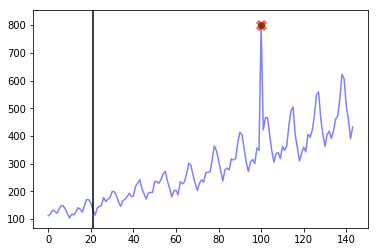

------------
False Positive Weight:  0.1
	 Minimum number of mistakes : 6.8999999999999995
	 Best window threshold : 0.9999
	 Corresponding window overall precision : 0.25
	 Corresponding window overall recall : 0.8888888888888888
	 Corresponding window overall F score : 0.3902439024390244
False Positive Weight:  0.2
	 Minimum number of mistakes : 11.799999999999999
	 Best window threshold : 0.9999
	 Corresponding window overall precision : 0.25
	 Corresponding window overall recall : 0.8888888888888888
	 Corresponding window overall F score : 0.3902439024390244
False Positive Weight:  0.3
	 Minimum number of mistakes : 12.700000000000001
	 Best window threshold : 1.0
	 Corresponding window overall precision : 0.47058823529411764
	 Corresponding window overall recall : 0.4444444444444444
	 Corresponding window overall F score : 0.45714285714285713
False Positive Weight:  0.4
	 Minimum number of mistakes : 13.600000000000001
	 Best window threshold : 1.0
	 Corresponding window overall p

In [20]:
end_results = {}
for weight_fp in weight_fp_list:  
    print("---------weight_fp=" + str(weight_fp) + ", weight_fn=1----------")
    weight_result = adclasses.pretty_print_results(ad_dict, anomaly_scores_dict, true_outlier_indices_dict, weight_fp=weight_fp, weight_fn=1)
    end_results[weight_fp] = weight_result

print("------------")
adclasses.pretty_print_end_results(end_results)

# Twitter AD Results

on everything except ibm-common-stock-closing-prices, ec2_cpu_utilization_5f5533, ec2_cpu_utilization_ac20cd

In [21]:
twitter_dataset_name_list = ["exchange-2_cpm_results",
                             "exchange-3_cpm_results",
                             "ambient_temperature_system_failure",
                             "all_data_gift_certificates",
                             "exchange-2_cpc_results",
                             "exchange-3_cpc_results",
                             "international-airline-passengers"]

twitter_ad_dict = {}
for dataset_name in twitter_dataset_name_list:
    twitter_ad_dict[dataset_name] = ad_dict[dataset_name]
    
twitter_true_outlier_indices_dict = {}
for dataset_name in twitter_dataset_name_list:
    twitter_true_outlier_indices_dict[dataset_name] = true_outlier_indices_dict[dataset_name]

In [22]:
anomaly_scores_dict = {}

for dataset_name in twitter_dataset_name_list:
    output_dict_twitter = joblib.load("anomaly_scores" + window_size + "/Twitter/" + dataset_name)
    anomaly_scores_dict[dataset_name] = output_dict_twitter["Anomaly Scores"]

---------weight_fp=0.1, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  8.7
Best window threshold:  0.0001
Corresponding window overall precision:  0.45454545454545453
Corresponding window overall recall:  0.38461538461538464
Corresponding window overall F score:  0.41666666666666663



--- exchange-2_cpm_results ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.5
Corresponding window false positives:  2
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [978, 1017, 1105]


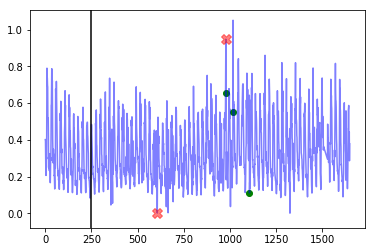




--- exchange-3_cpm_results ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1194, 1195]


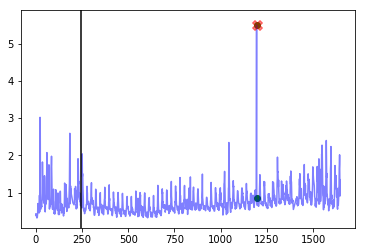




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


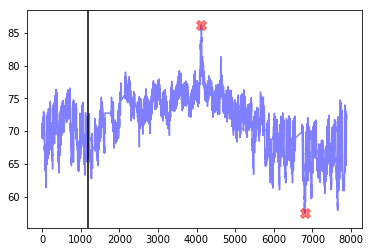




--- all_data_gift_certificates ---
Corresponding window precision:  0.16666666666666666
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  5
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [4964, 4987, 6506, 6651, 8158, 8324, 8325, 8394, 8491, 8492, 8513, 8539, 8564, 8565, 8587, 8611, 8615]


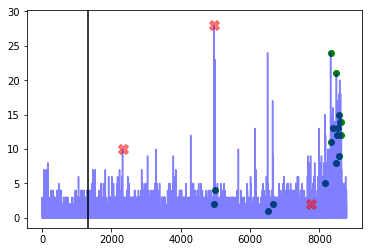




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


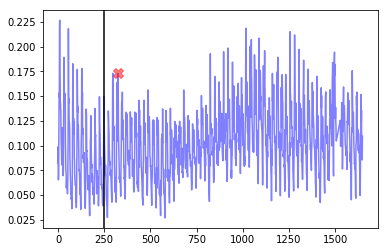




--- exchange-3_cpc_results ---
Corresponding window precision:  1.0
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [324, 467, 468]


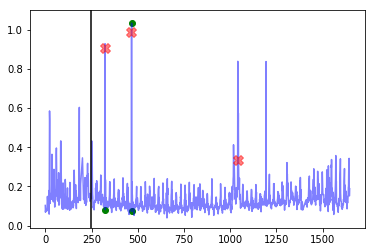




--- international-airline-passengers ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


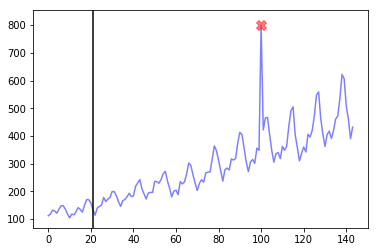

---------weight_fp=0.2, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  9.4
Best window threshold:  0.0001
Corresponding window overall precision:  0.45454545454545453
Corresponding window overall recall:  0.38461538461538464
Corresponding window overall F score:  0.41666666666666663



--- exchange-2_cpm_results ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.5
Corresponding window false positives:  2
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [978, 1017, 1105]


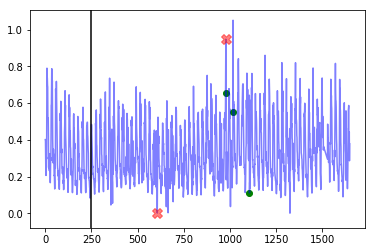




--- exchange-3_cpm_results ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1194, 1195]


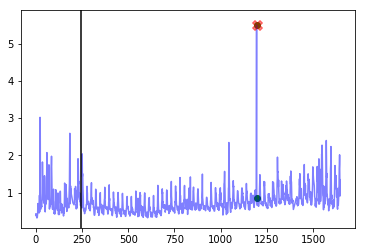




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


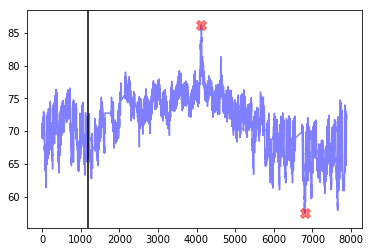




--- all_data_gift_certificates ---
Corresponding window precision:  0.16666666666666666
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  5
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [4964, 4987, 6506, 6651, 8158, 8324, 8325, 8394, 8491, 8492, 8513, 8539, 8564, 8565, 8587, 8611, 8615]


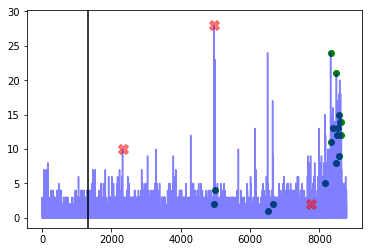




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


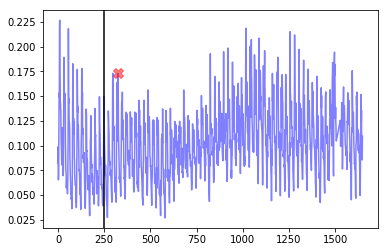




--- exchange-3_cpc_results ---
Corresponding window precision:  1.0
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [324, 467, 468]


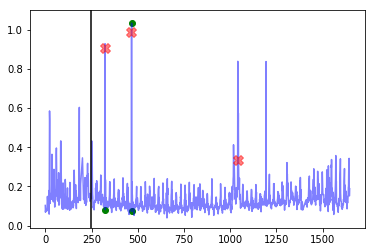




--- international-airline-passengers ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


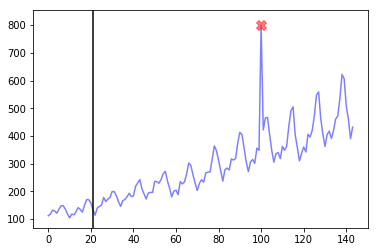

---------weight_fp=0.3, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  10.1
Best window threshold:  0.0001
Corresponding window overall precision:  0.45454545454545453
Corresponding window overall recall:  0.38461538461538464
Corresponding window overall F score:  0.41666666666666663



--- exchange-2_cpm_results ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.5
Corresponding window false positives:  2
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [978, 1017, 1105]


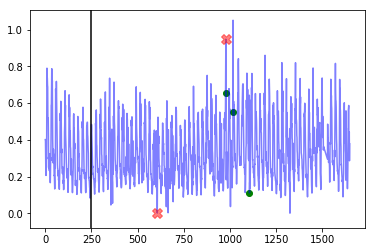




--- exchange-3_cpm_results ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1194, 1195]


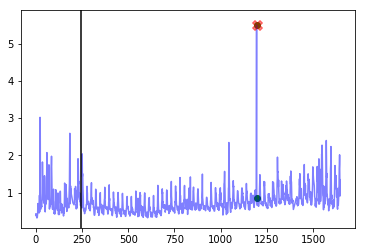




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


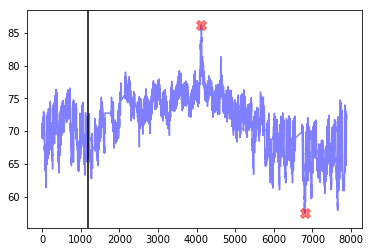




--- all_data_gift_certificates ---
Corresponding window precision:  0.16666666666666666
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  5
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [4964, 4987, 6506, 6651, 8158, 8324, 8325, 8394, 8491, 8492, 8513, 8539, 8564, 8565, 8587, 8611, 8615]


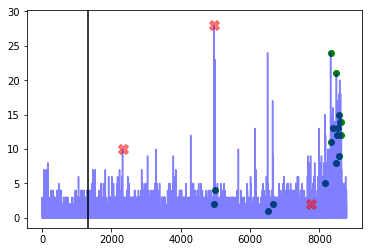




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


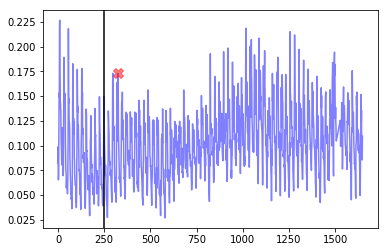




--- exchange-3_cpc_results ---
Corresponding window precision:  1.0
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [324, 467, 468]


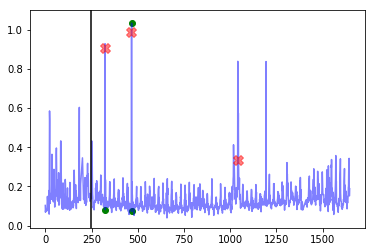




--- international-airline-passengers ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


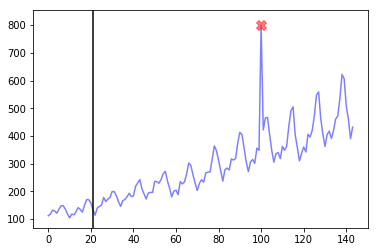

---------weight_fp=0.4, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  10.8
Best window threshold:  0.0001
Corresponding window overall precision:  0.45454545454545453
Corresponding window overall recall:  0.38461538461538464
Corresponding window overall F score:  0.41666666666666663



--- exchange-2_cpm_results ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.5
Corresponding window false positives:  2
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [978, 1017, 1105]


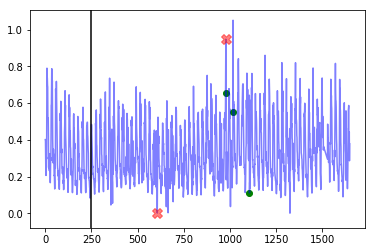




--- exchange-3_cpm_results ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1194, 1195]


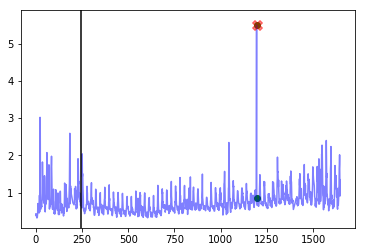




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


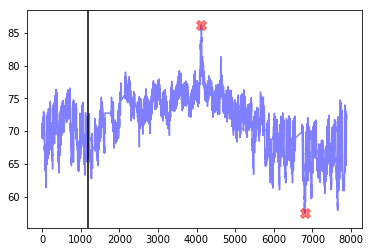




--- all_data_gift_certificates ---
Corresponding window precision:  0.16666666666666666
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  5
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [4964, 4987, 6506, 6651, 8158, 8324, 8325, 8394, 8491, 8492, 8513, 8539, 8564, 8565, 8587, 8611, 8615]


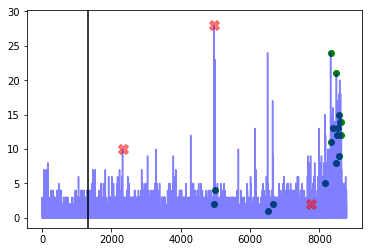




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


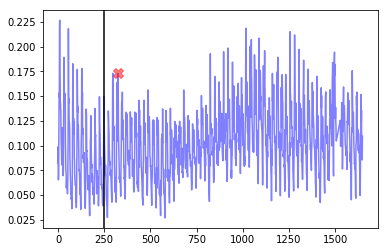




--- exchange-3_cpc_results ---
Corresponding window precision:  1.0
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [324, 467, 468]


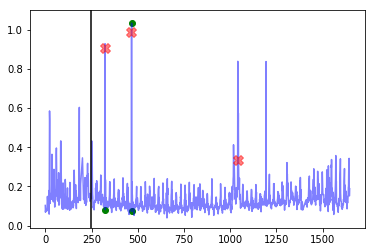




--- international-airline-passengers ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


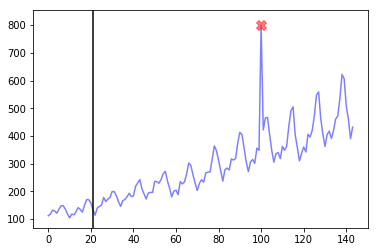

---------weight_fp=0.5, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  11.5
Best window threshold:  0.0001
Corresponding window overall precision:  0.45454545454545453
Corresponding window overall recall:  0.38461538461538464
Corresponding window overall F score:  0.41666666666666663



--- exchange-2_cpm_results ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.5
Corresponding window false positives:  2
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [978, 1017, 1105]


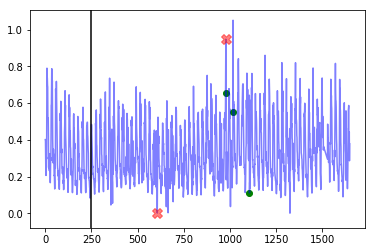




--- exchange-3_cpm_results ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1194, 1195]


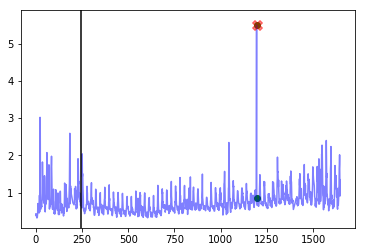




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


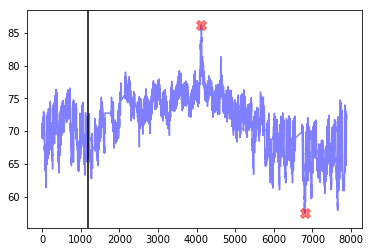




--- all_data_gift_certificates ---
Corresponding window precision:  0.16666666666666666
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  5
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [4964, 4987, 6506, 6651, 8158, 8324, 8325, 8394, 8491, 8492, 8513, 8539, 8564, 8565, 8587, 8611, 8615]


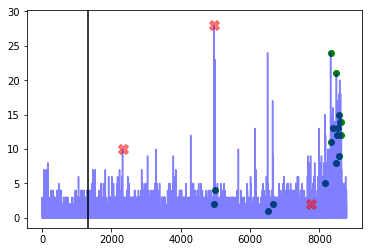




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


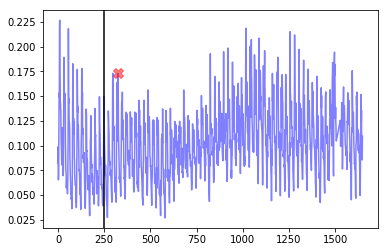




--- exchange-3_cpc_results ---
Corresponding window precision:  1.0
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [324, 467, 468]


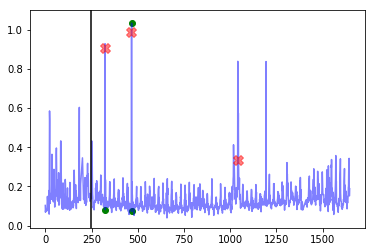




--- international-airline-passengers ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


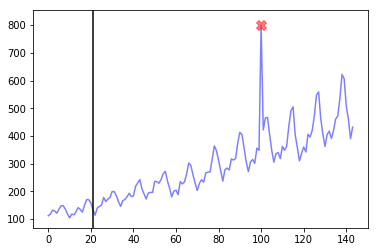

---------weight_fp=0.6, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  12.2
Best window threshold:  0.0001
Corresponding window overall precision:  0.45454545454545453
Corresponding window overall recall:  0.38461538461538464
Corresponding window overall F score:  0.41666666666666663



--- exchange-2_cpm_results ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.5
Corresponding window false positives:  2
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [978, 1017, 1105]


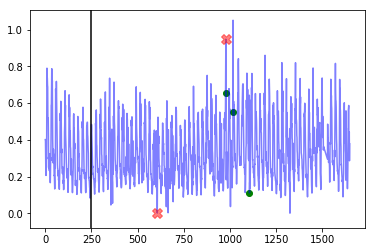




--- exchange-3_cpm_results ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1194, 1195]


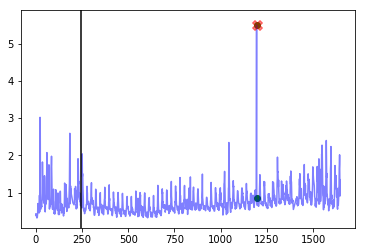




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


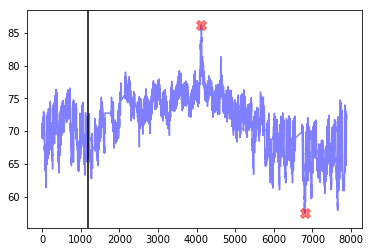




--- all_data_gift_certificates ---
Corresponding window precision:  0.16666666666666666
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  5
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [4964, 4987, 6506, 6651, 8158, 8324, 8325, 8394, 8491, 8492, 8513, 8539, 8564, 8565, 8587, 8611, 8615]


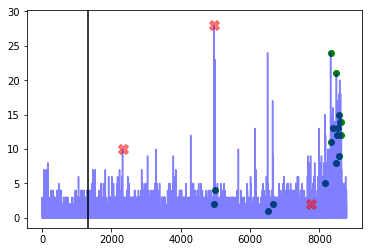




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


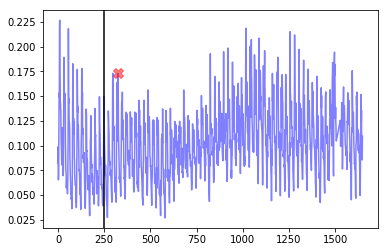




--- exchange-3_cpc_results ---
Corresponding window precision:  1.0
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [324, 467, 468]


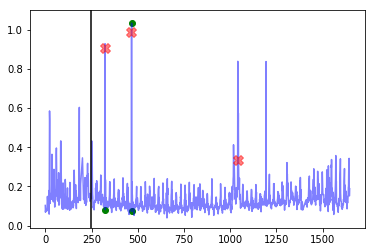




--- international-airline-passengers ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


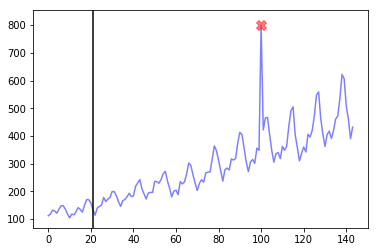

---------weight_fp=0.7, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  12.9
Best window threshold:  0.0001
Corresponding window overall precision:  0.45454545454545453
Corresponding window overall recall:  0.38461538461538464
Corresponding window overall F score:  0.41666666666666663



--- exchange-2_cpm_results ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.5
Corresponding window false positives:  2
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [978, 1017, 1105]


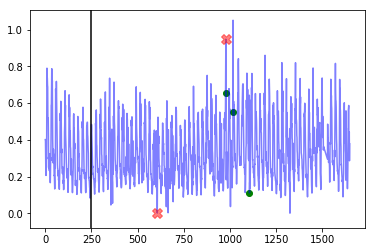




--- exchange-3_cpm_results ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1194, 1195]


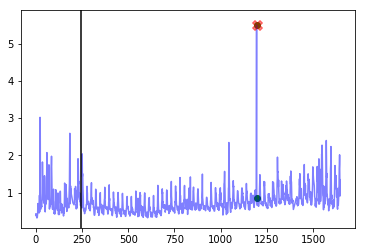




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


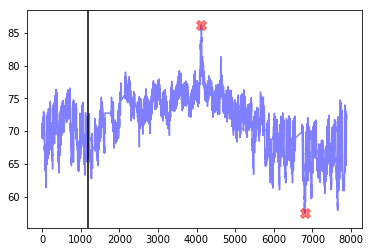




--- all_data_gift_certificates ---
Corresponding window precision:  0.16666666666666666
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  5
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [4964, 4987, 6506, 6651, 8158, 8324, 8325, 8394, 8491, 8492, 8513, 8539, 8564, 8565, 8587, 8611, 8615]


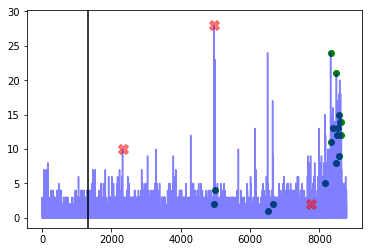




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


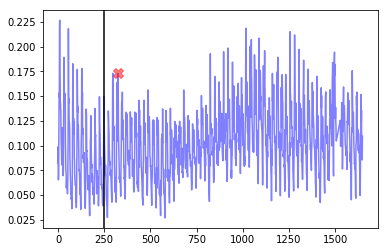




--- exchange-3_cpc_results ---
Corresponding window precision:  1.0
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [324, 467, 468]


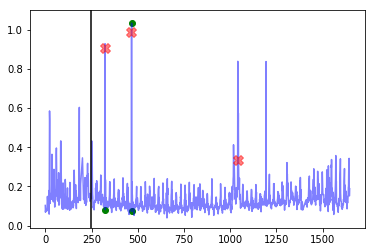




--- international-airline-passengers ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


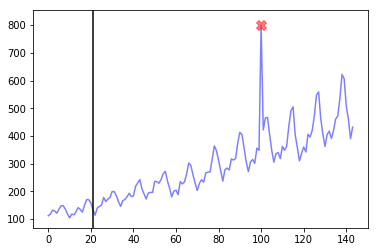

---------weight_fp=0.8, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  13.6
Best window threshold:  0.0001
Corresponding window overall precision:  0.45454545454545453
Corresponding window overall recall:  0.38461538461538464
Corresponding window overall F score:  0.41666666666666663



--- exchange-2_cpm_results ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.5
Corresponding window false positives:  2
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [978, 1017, 1105]


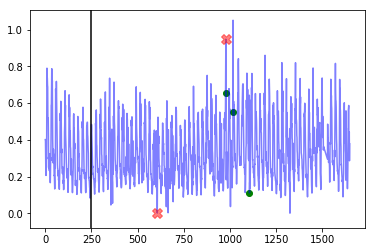




--- exchange-3_cpm_results ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1194, 1195]


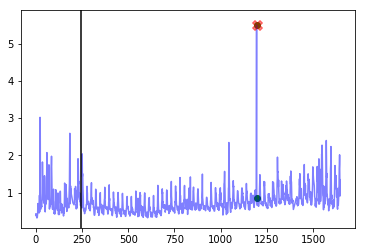




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


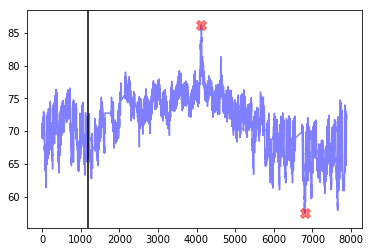




--- all_data_gift_certificates ---
Corresponding window precision:  0.16666666666666666
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  5
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [4964, 4987, 6506, 6651, 8158, 8324, 8325, 8394, 8491, 8492, 8513, 8539, 8564, 8565, 8587, 8611, 8615]


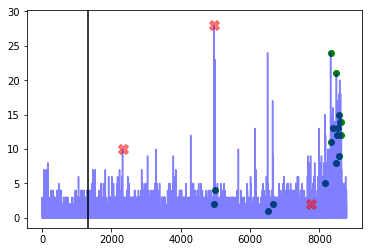




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


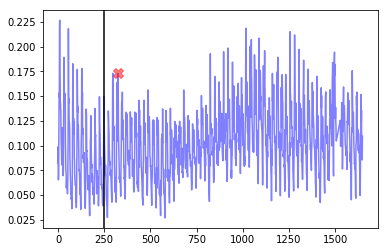




--- exchange-3_cpc_results ---
Corresponding window precision:  1.0
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [324, 467, 468]


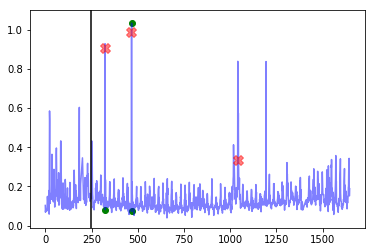




--- international-airline-passengers ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


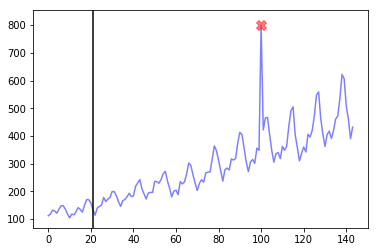

---------weight_fp=0.9, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  14.3
Best window threshold:  0.0001
Corresponding window overall precision:  0.45454545454545453
Corresponding window overall recall:  0.38461538461538464
Corresponding window overall F score:  0.41666666666666663



--- exchange-2_cpm_results ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.5
Corresponding window false positives:  2
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [978, 1017, 1105]


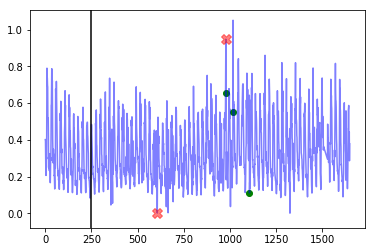




--- exchange-3_cpm_results ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1194, 1195]


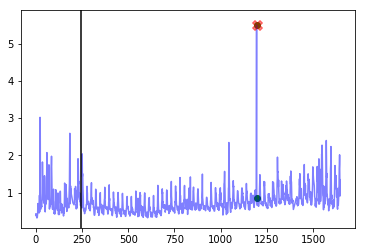




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


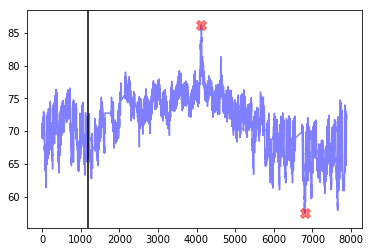




--- all_data_gift_certificates ---
Corresponding window precision:  0.16666666666666666
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  5
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [4964, 4987, 6506, 6651, 8158, 8324, 8325, 8394, 8491, 8492, 8513, 8539, 8564, 8565, 8587, 8611, 8615]


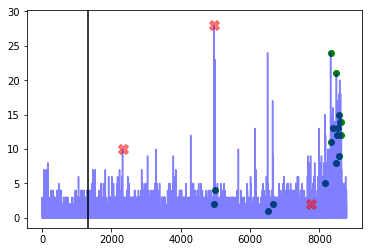




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


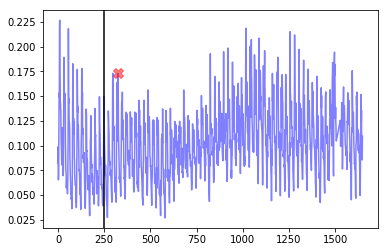




--- exchange-3_cpc_results ---
Corresponding window precision:  1.0
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [324, 467, 468]


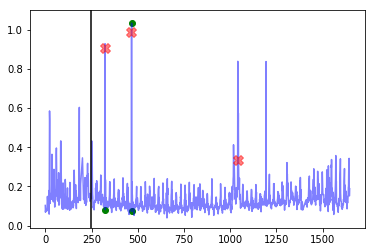




--- international-airline-passengers ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


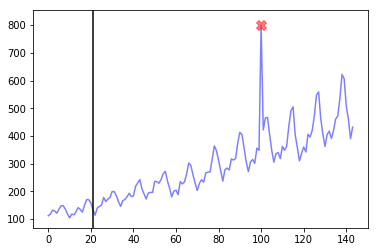

---------weight_fp=1.0, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  15.0
Best window threshold:  0.0001
Corresponding window overall precision:  0.45454545454545453
Corresponding window overall recall:  0.38461538461538464
Corresponding window overall F score:  0.41666666666666663



--- exchange-2_cpm_results ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.5
Corresponding window false positives:  2
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [978, 1017, 1105]


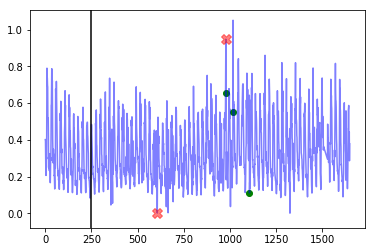




--- exchange-3_cpm_results ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1194, 1195]


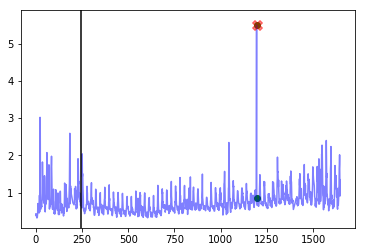




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


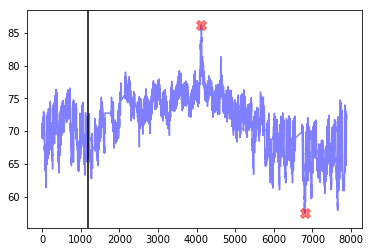




--- all_data_gift_certificates ---
Corresponding window precision:  0.16666666666666666
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  5
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [4964, 4987, 6506, 6651, 8158, 8324, 8325, 8394, 8491, 8492, 8513, 8539, 8564, 8565, 8587, 8611, 8615]


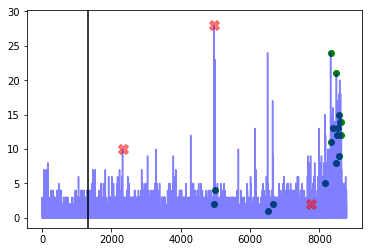




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


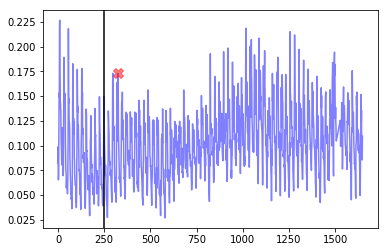




--- exchange-3_cpc_results ---
Corresponding window precision:  1.0
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [324, 467, 468]


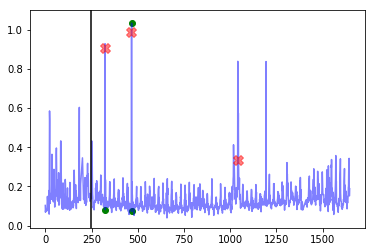




--- international-airline-passengers ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


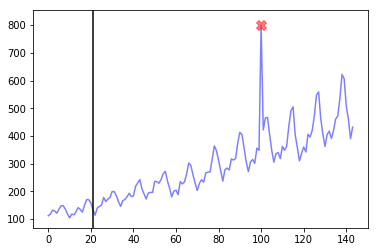

------------
False Positive Weight:  0.1
	 Minimum number of mistakes : 8.7
	 Best window threshold : 0.0001
	 Corresponding window overall precision : 0.45454545454545453
	 Corresponding window overall recall : 0.38461538461538464
	 Corresponding window overall F score : 0.41666666666666663
False Positive Weight:  0.2
	 Minimum number of mistakes : 9.4
	 Best window threshold : 0.0001
	 Corresponding window overall precision : 0.45454545454545453
	 Corresponding window overall recall : 0.38461538461538464
	 Corresponding window overall F score : 0.41666666666666663
False Positive Weight:  0.3
	 Minimum number of mistakes : 10.1
	 Best window threshold : 0.0001
	 Corresponding window overall precision : 0.45454545454545453
	 Corresponding window overall recall : 0.38461538461538464
	 Corresponding window overall F score : 0.41666666666666663
False Positive Weight:  0.4
	 Minimum number of mistakes : 10.8
	 Best window threshold : 0.0001
	 Corresponding window overall precision : 0.4545

In [23]:
end_results = {}
for weight_fp in weight_fp_list:  
    print("---------weight_fp=" + str(weight_fp) + ", weight_fn=1----------")
    weight_result = adclasses.pretty_print_results(twitter_ad_dict, anomaly_scores_dict, twitter_true_outlier_indices_dict, weight_fp=weight_fp, weight_fn=1)
    end_results[weight_fp] = weight_result

print("------------")
adclasses.pretty_print_end_results(end_results)

# HTM Results

on everything except for international-airline-passengers

In [24]:
htm_dataset_name_list = ["ibm-common-stock-closing-prices", 
                         "exchange-2_cpm_results",
                         "exchange-3_cpm_results",
                         "ambient_temperature_system_failure",
                         "all_data_gift_certificates",
                         "exchange-2_cpc_results",
                         "exchange-3_cpc_results",
                         "ec2_cpu_utilization_5f5533",
                         "ec2_cpu_utilization_ac20cd"]

htm_ad_dict = {}
for dataset_name in htm_dataset_name_list:
    htm_ad_dict[dataset_name] = ad_dict[dataset_name]
    
htm_true_outlier_indices_dict = {}
for dataset_name in htm_dataset_name_list:
    htm_true_outlier_indices_dict[dataset_name] = true_outlier_indices_dict[dataset_name]

In [25]:
anomaly_scores_dict = {}

for dataset_name in htm_dataset_name_list:
    output_dict_htm = joblib.load("anomaly_scores" + window_size + "/HTM/" + dataset_name)
    anomaly_scores_dict[dataset_name] = output_dict_htm["Anomaly Scores"]

In [26]:
adclasses.precision_recall_curve_info(anomaly_scores_dict, htm_true_outlier_indices_dict)

{0.1: {'precision': 0.5, 'recall': 1.0},
 0.2: {'precision': 1.0, 'recall': 1.0},
 0.3: {'precision': 1.0, 'recall': 1.0},
 0.4: {'precision': 1.0, 'recall': 1.0},
 0.5: {'precision': 1.0, 'recall': 1.0},
 0.6: {'precision': 1.0, 'recall': 1.0},
 0.7: {'precision': 1.0, 'recall': 1.0},
 0.8: {'precision': 1.0, 'recall': 1.0},
 0.9: {'precision': 1.0, 'recall': 1.0},
 1.0: {'precision': 0.0, 'recall': 0.0}}

---------weight_fp=0.1, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  7.1
Best window threshold:  0.4663
Corresponding window overall precision:  0.3333333333333333
Corresponding window overall recall:  0.75
Corresponding window overall F score:  0.46153846153846156



--- ibm-common-stock-closing-prices ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [393, 803]


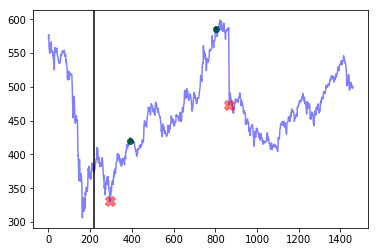




--- exchange-2_cpm_results ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [979, 986, 1105]


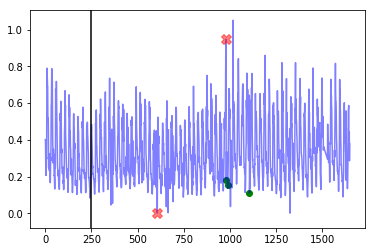




--- exchange-3_cpm_results ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1046, 1049, 1050, 1193, 1532, 1554, 1574, 1575, 1576, 1577, 1578]


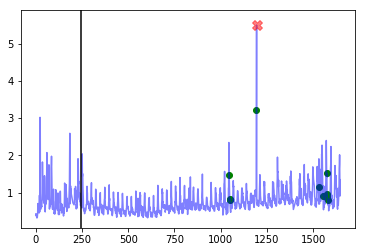




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.4
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2039, 2156, 3556, 4101, 4123, 6792, 6793, 6794, 7657]


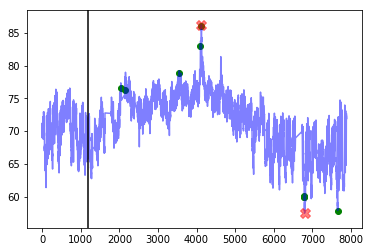




--- all_data_gift_certificates ---
Corresponding window precision:  0.23076923076923078
Corresponding window recall:  1.0
Corresponding window false positives:  10
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2321, 2872, 3043, 4287, 4962, 4987, 5663, 6138, 6506, 6651, 6670, 7680, 7687, 7872, 7986, 8016, 8065, 8157, 8180, 8324, 8346, 8347, 8376, 8378, 8598]


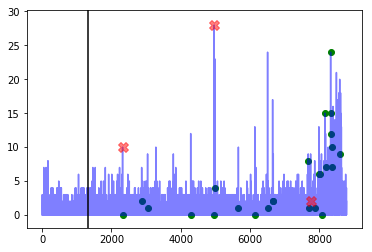




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  3
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [654, 655, 656, 1046, 1486]


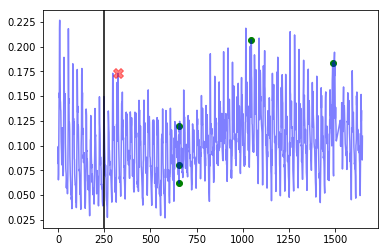




--- exchange-3_cpc_results ---
Corresponding window precision:  1.0
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1022, 1023, 1043]


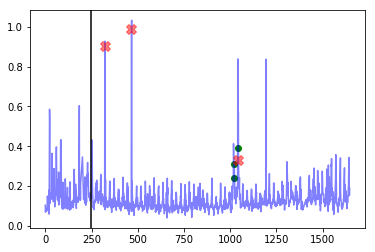




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.6666666666666666
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1271, 1280, 1519, 1537, 1538, 2929, 2930, 2946, 2947, 2970]


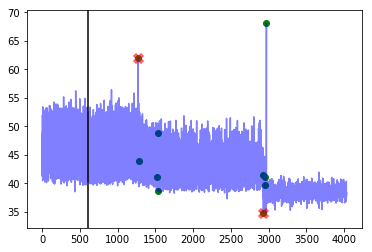




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3569, 3581]


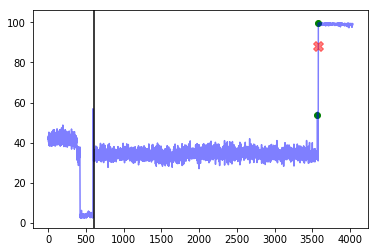

---------weight_fp=0.2, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  9.2
Best window threshold:  0.4663
Corresponding window overall precision:  0.3333333333333333
Corresponding window overall recall:  0.75
Corresponding window overall F score:  0.46153846153846156



--- ibm-common-stock-closing-prices ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [393, 803]


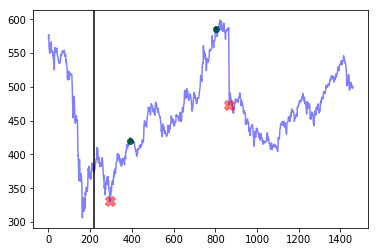




--- exchange-2_cpm_results ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [979, 986, 1105]


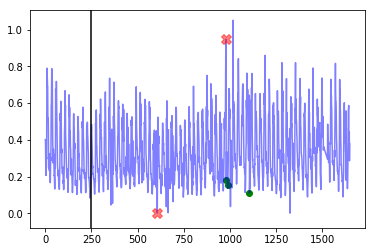




--- exchange-3_cpm_results ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1046, 1049, 1050, 1193, 1532, 1554, 1574, 1575, 1576, 1577, 1578]


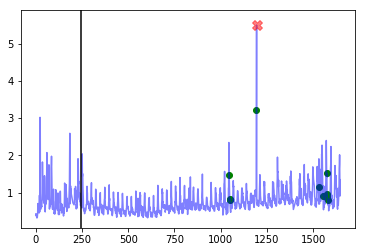




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.4
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2039, 2156, 3556, 4101, 4123, 6792, 6793, 6794, 7657]


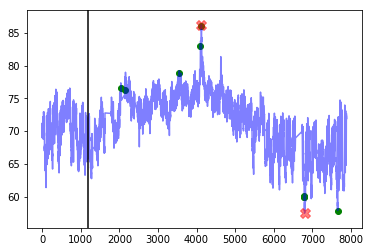




--- all_data_gift_certificates ---
Corresponding window precision:  0.23076923076923078
Corresponding window recall:  1.0
Corresponding window false positives:  10
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2321, 2872, 3043, 4287, 4962, 4987, 5663, 6138, 6506, 6651, 6670, 7680, 7687, 7872, 7986, 8016, 8065, 8157, 8180, 8324, 8346, 8347, 8376, 8378, 8598]


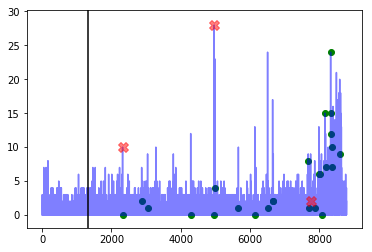




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  3
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [654, 655, 656, 1046, 1486]


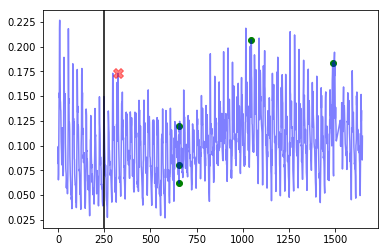




--- exchange-3_cpc_results ---
Corresponding window precision:  1.0
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1022, 1023, 1043]


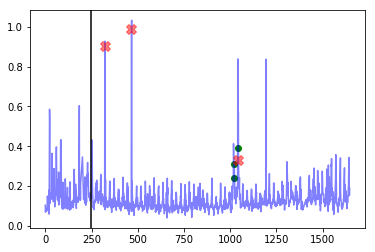




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.6666666666666666
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1271, 1280, 1519, 1537, 1538, 2929, 2930, 2946, 2947, 2970]


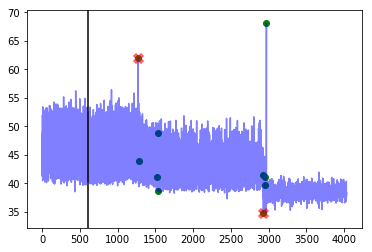




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3569, 3581]


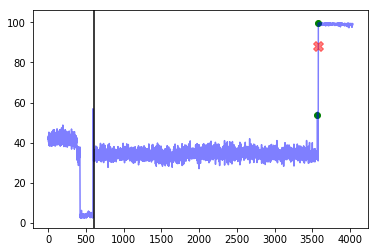

---------weight_fp=0.3, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  11.3
Best window threshold:  0.4663
Corresponding window overall precision:  0.3333333333333333
Corresponding window overall recall:  0.75
Corresponding window overall F score:  0.46153846153846156



--- ibm-common-stock-closing-prices ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [393, 803]


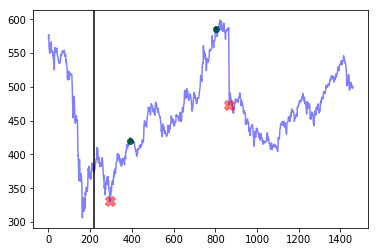




--- exchange-2_cpm_results ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [979, 986, 1105]


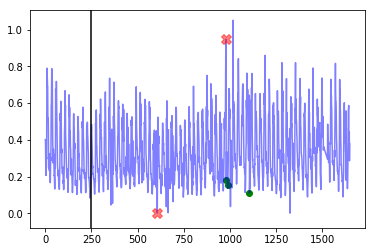




--- exchange-3_cpm_results ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1046, 1049, 1050, 1193, 1532, 1554, 1574, 1575, 1576, 1577, 1578]


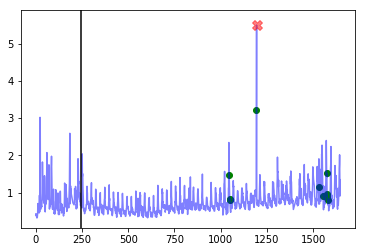




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.4
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2039, 2156, 3556, 4101, 4123, 6792, 6793, 6794, 7657]


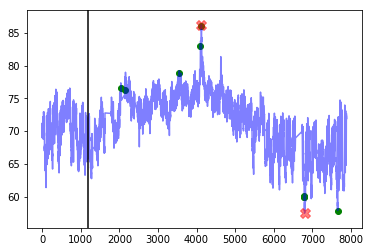




--- all_data_gift_certificates ---
Corresponding window precision:  0.23076923076923078
Corresponding window recall:  1.0
Corresponding window false positives:  10
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2321, 2872, 3043, 4287, 4962, 4987, 5663, 6138, 6506, 6651, 6670, 7680, 7687, 7872, 7986, 8016, 8065, 8157, 8180, 8324, 8346, 8347, 8376, 8378, 8598]


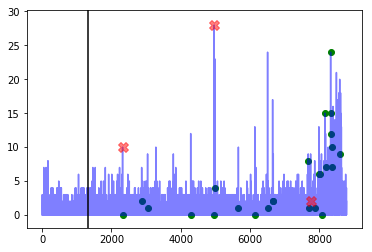




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  3
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [654, 655, 656, 1046, 1486]


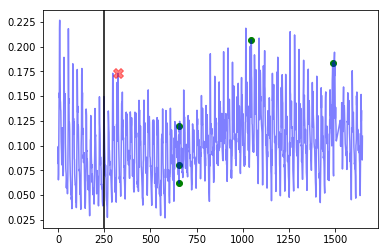




--- exchange-3_cpc_results ---
Corresponding window precision:  1.0
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1022, 1023, 1043]


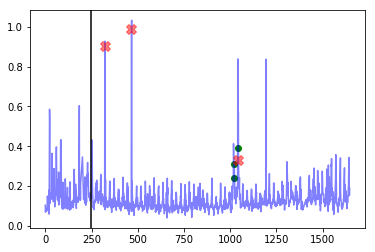




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.6666666666666666
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1271, 1280, 1519, 1537, 1538, 2929, 2930, 2946, 2947, 2970]


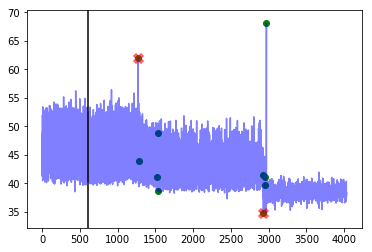




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3569, 3581]


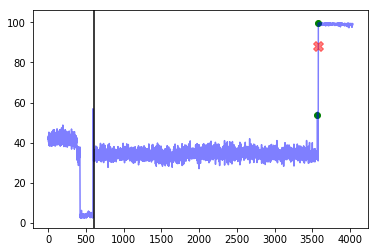

---------weight_fp=0.4, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  13.4
Best window threshold:  0.4663
Corresponding window overall precision:  0.3333333333333333
Corresponding window overall recall:  0.75
Corresponding window overall F score:  0.46153846153846156



--- ibm-common-stock-closing-prices ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [393, 803]


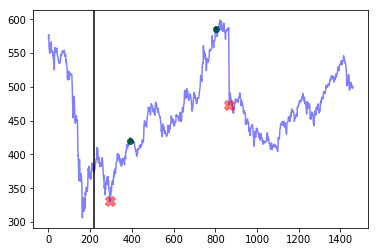




--- exchange-2_cpm_results ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [979, 986, 1105]


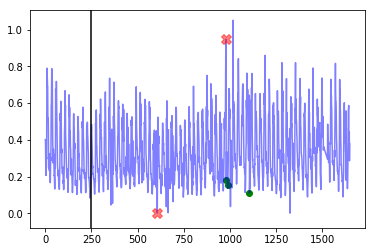




--- exchange-3_cpm_results ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1046, 1049, 1050, 1193, 1532, 1554, 1574, 1575, 1576, 1577, 1578]


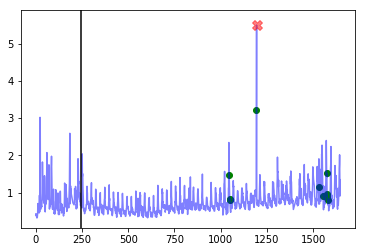




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.4
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2039, 2156, 3556, 4101, 4123, 6792, 6793, 6794, 7657]


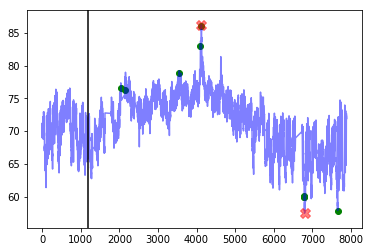




--- all_data_gift_certificates ---
Corresponding window precision:  0.23076923076923078
Corresponding window recall:  1.0
Corresponding window false positives:  10
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2321, 2872, 3043, 4287, 4962, 4987, 5663, 6138, 6506, 6651, 6670, 7680, 7687, 7872, 7986, 8016, 8065, 8157, 8180, 8324, 8346, 8347, 8376, 8378, 8598]


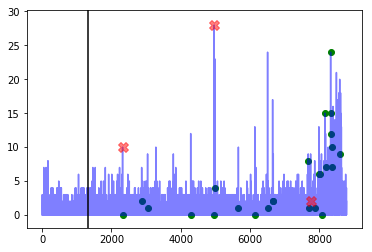




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  3
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [654, 655, 656, 1046, 1486]


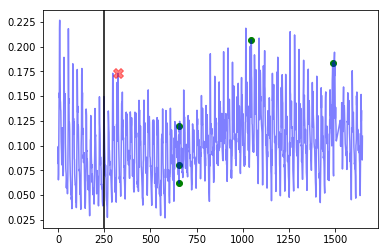




--- exchange-3_cpc_results ---
Corresponding window precision:  1.0
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1022, 1023, 1043]


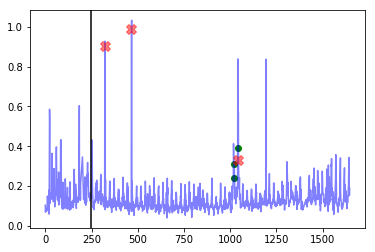




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.6666666666666666
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1271, 1280, 1519, 1537, 1538, 2929, 2930, 2946, 2947, 2970]


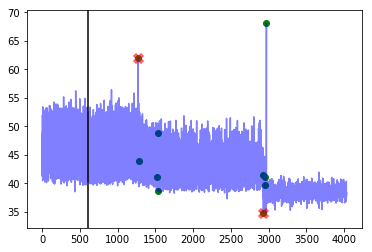




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3569, 3581]


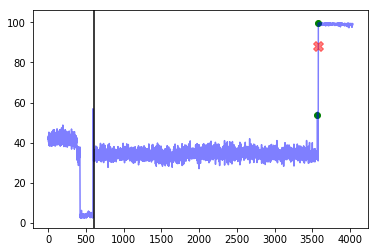

---------weight_fp=0.5, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  15.0
Best window threshold:  0.545
Corresponding window overall precision:  0.3448275862068966
Corresponding window overall recall:  0.625
Corresponding window overall F score:  0.4444444444444445



--- ibm-common-stock-closing-prices ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [803]


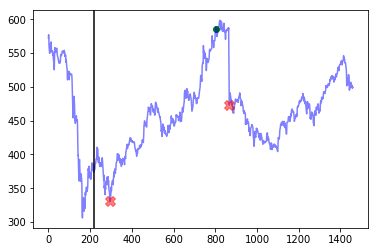




--- exchange-2_cpm_results ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [979, 1105]


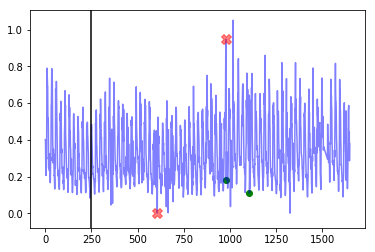




--- exchange-3_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1532]


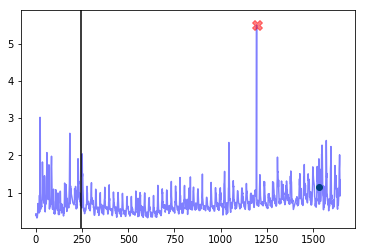




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2039, 3556, 4101, 4123, 6792, 6794]


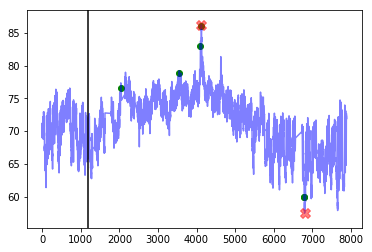




--- all_data_gift_certificates ---
Corresponding window precision:  0.18181818181818182
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  9
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2321, 2872, 3043, 4287, 4987, 5663, 6506, 6651, 6670, 7872, 8016, 8065, 8157, 8180, 8324, 8378, 8598]


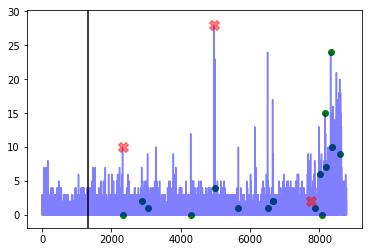




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  2
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [656, 1486]


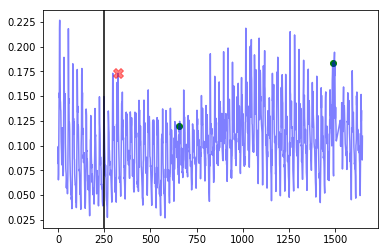




--- exchange-3_cpc_results ---
Corresponding window precision:  1.0
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1023, 1043]


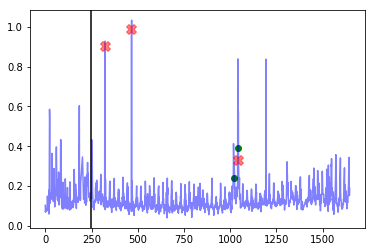




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.6666666666666666
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1271, 1519, 1537, 2930, 2970]


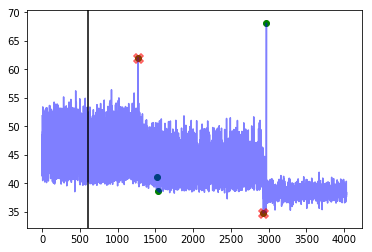




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3569, 3581]


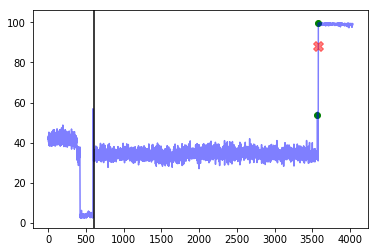

---------weight_fp=0.6, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  15.0
Best window threshold:  0.8455
Corresponding window overall precision:  1.0
Corresponding window overall recall:  0.125
Corresponding window overall F score:  0.2222222222222222



--- ibm-common-stock-closing-prices ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


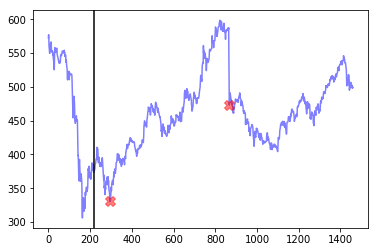




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


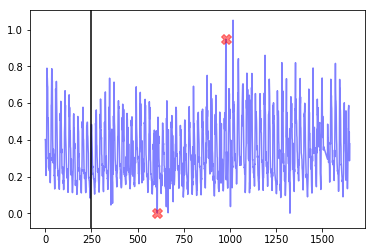




--- exchange-3_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


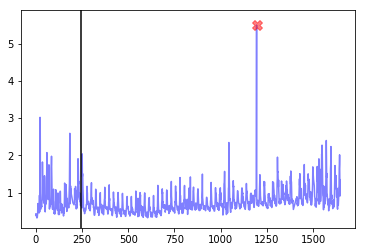




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


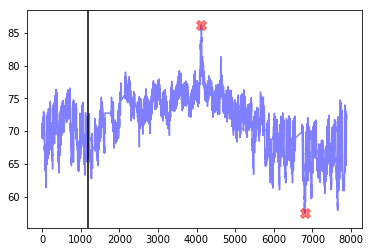




--- all_data_gift_certificates ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


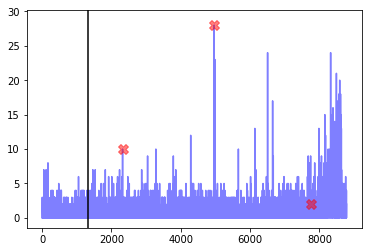




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


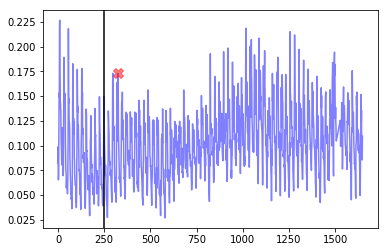




--- exchange-3_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


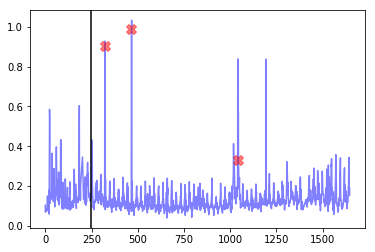




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2930]


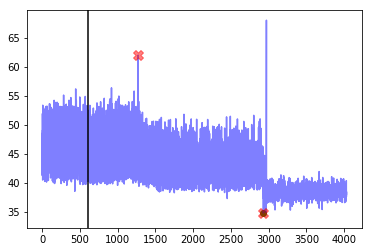




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3569]


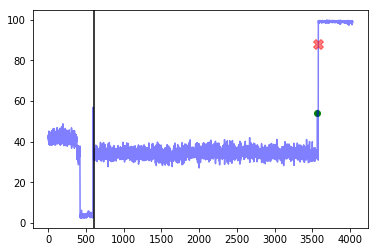

---------weight_fp=0.7, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  15.0
Best window threshold:  0.8455
Corresponding window overall precision:  1.0
Corresponding window overall recall:  0.125
Corresponding window overall F score:  0.2222222222222222



--- ibm-common-stock-closing-prices ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


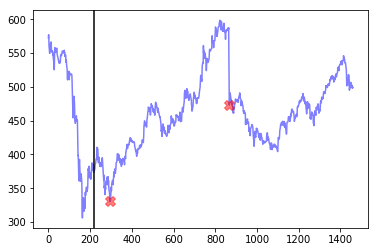




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


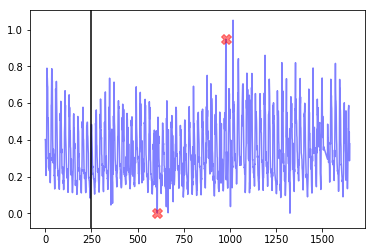




--- exchange-3_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


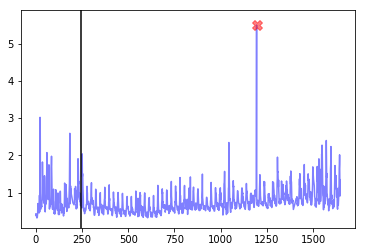




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


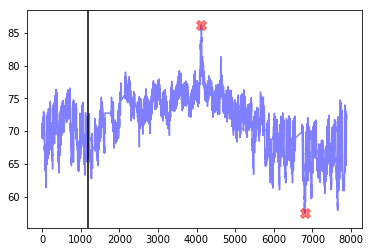




--- all_data_gift_certificates ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


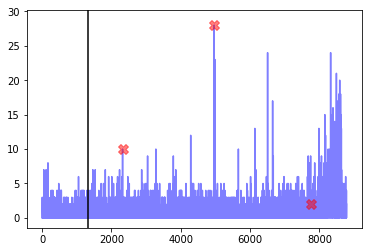




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


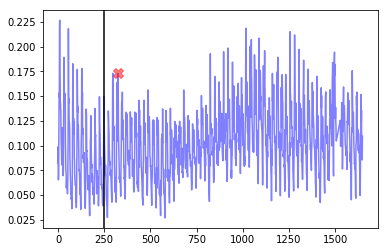




--- exchange-3_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


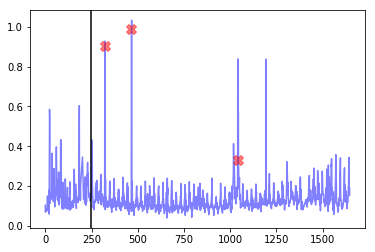




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2930]


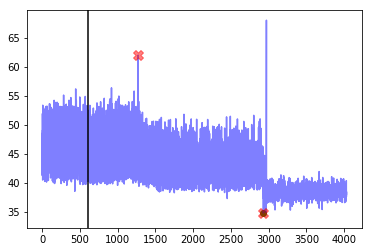




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3569]


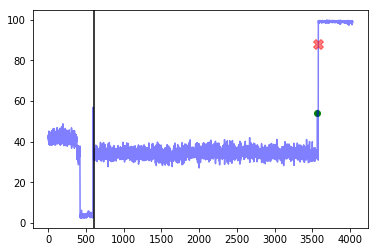

---------weight_fp=0.8, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  15.0
Best window threshold:  0.8455
Corresponding window overall precision:  1.0
Corresponding window overall recall:  0.125
Corresponding window overall F score:  0.2222222222222222



--- ibm-common-stock-closing-prices ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


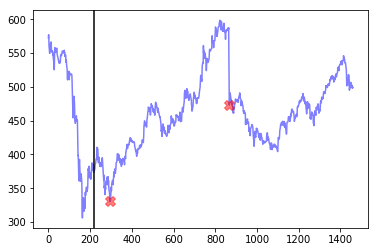




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


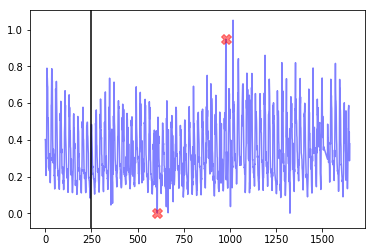




--- exchange-3_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


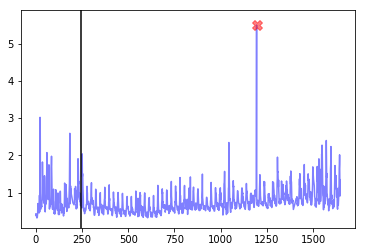




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


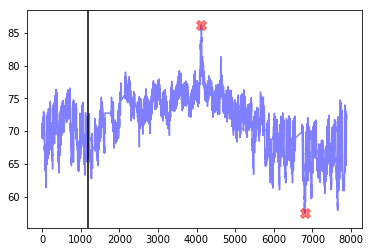




--- all_data_gift_certificates ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


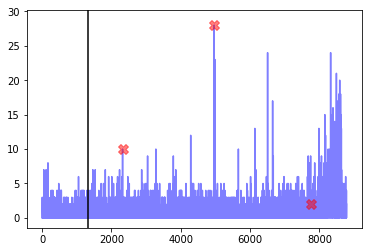




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


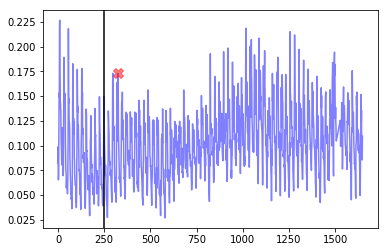




--- exchange-3_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


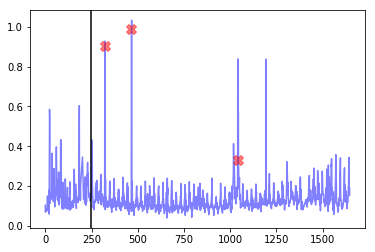




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2930]


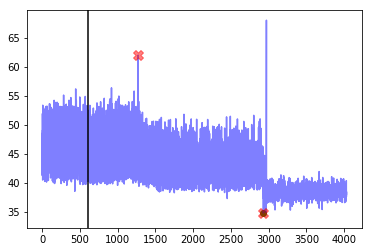




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3569]


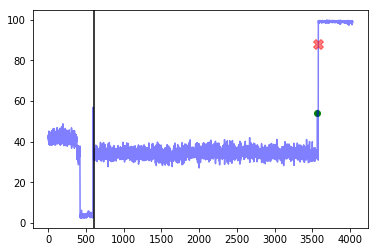

---------weight_fp=0.9, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  15.0
Best window threshold:  0.8455
Corresponding window overall precision:  1.0
Corresponding window overall recall:  0.125
Corresponding window overall F score:  0.2222222222222222



--- ibm-common-stock-closing-prices ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


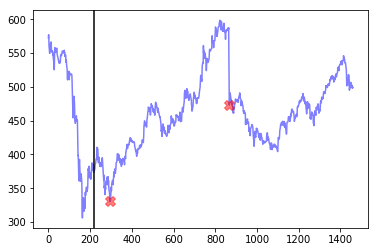




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


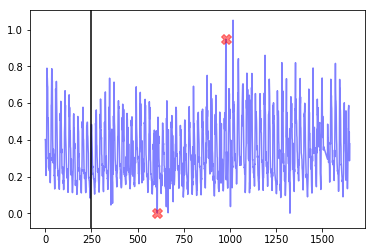




--- exchange-3_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


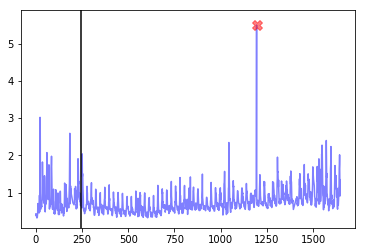




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


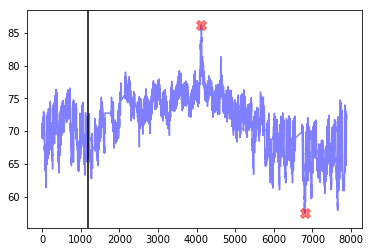




--- all_data_gift_certificates ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


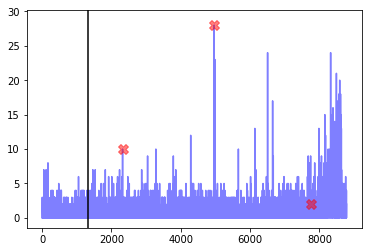




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


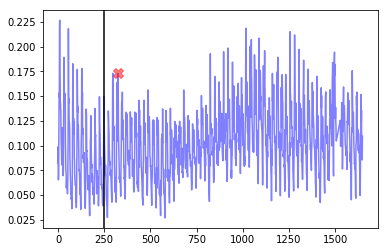




--- exchange-3_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


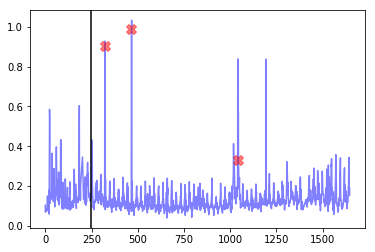




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2930]


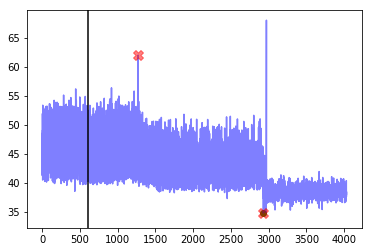




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3569]


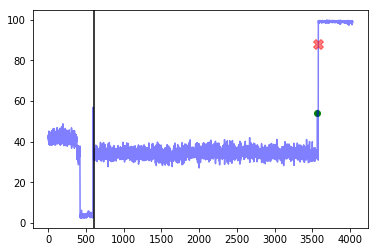

---------weight_fp=1.0, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  15.0
Best window threshold:  0.8455
Corresponding window overall precision:  1.0
Corresponding window overall recall:  0.125
Corresponding window overall F score:  0.2222222222222222



--- ibm-common-stock-closing-prices ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


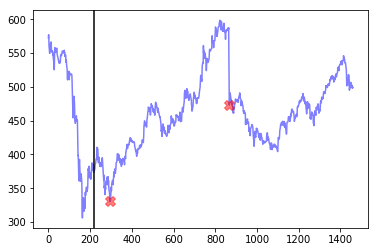




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


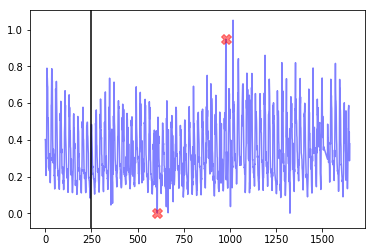




--- exchange-3_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


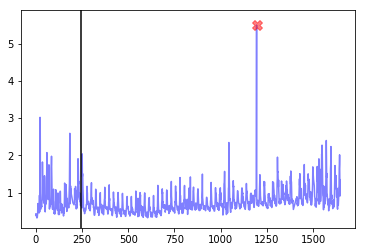




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


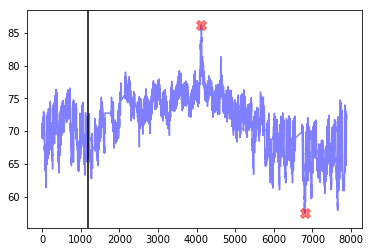




--- all_data_gift_certificates ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


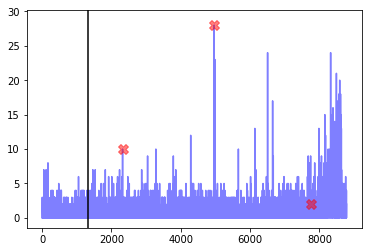




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


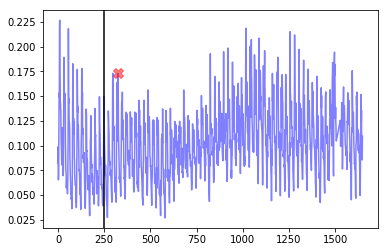




--- exchange-3_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


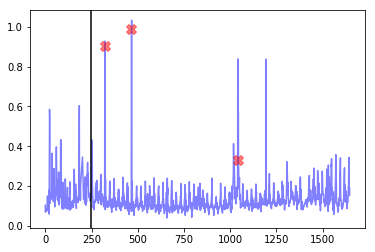




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2930]


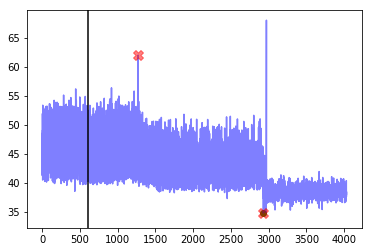




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3569]


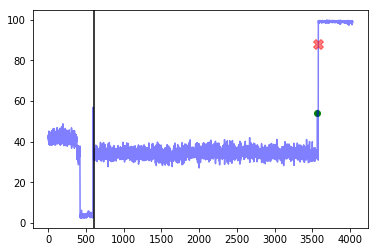

------------
False Positive Weight:  0.1
	 Minimum number of mistakes : 7.1
	 Best window threshold : 0.4663
	 Corresponding window overall precision : 0.3333333333333333
	 Corresponding window overall recall : 0.75
	 Corresponding window overall F score : 0.46153846153846156
False Positive Weight:  0.2
	 Minimum number of mistakes : 9.2
	 Best window threshold : 0.4663
	 Corresponding window overall precision : 0.3333333333333333
	 Corresponding window overall recall : 0.75
	 Corresponding window overall F score : 0.46153846153846156
False Positive Weight:  0.3
	 Minimum number of mistakes : 11.3
	 Best window threshold : 0.4663
	 Corresponding window overall precision : 0.3333333333333333
	 Corresponding window overall recall : 0.75
	 Corresponding window overall F score : 0.46153846153846156
False Positive Weight:  0.4
	 Minimum number of mistakes : 13.4
	 Best window threshold : 0.4663
	 Corresponding window overall precision : 0.3333333333333333
	 Corresponding window overall reca

In [27]:
end_results = {}
for weight_fp in weight_fp_list:  
    print("---------weight_fp=" + str(weight_fp) + ", weight_fn=1----------")
    weight_result = adclasses.pretty_print_results(htm_ad_dict, anomaly_scores_dict, htm_true_outlier_indices_dict, weight_fp=weight_fp, weight_fn=1)
    end_results[weight_fp] = weight_result

print("------------")
adclasses.pretty_print_end_results(end_results)

# STL Residual Results

on everything except ibm-common-stock-closing-prices, ec2_cpu_utilization_5f5533, ec2_cpu_utilization_ac20cd

In [28]:
stl_dataset_name_list = ["exchange-2_cpm_results",
                         "exchange-3_cpm_results",
                         "ambient_temperature_system_failure",
                         "all_data_gift_certificates",
                         "exchange-2_cpc_results",
                         "exchange-3_cpc_results",
                         "international-airline-passengers"]

stl_ad_dict = {}
for dataset_name in stl_dataset_name_list:
    stl_ad_dict[dataset_name] = ad_dict[dataset_name]
    
stl_true_outlier_indices_dict = {}
for dataset_name in stl_dataset_name_list:
    stl_true_outlier_indices_dict[dataset_name] = true_outlier_indices_dict[dataset_name]

In [29]:
anomaly_scores_dict = {}

for dataset_name in stl_dataset_name_list:
    output_dict_stl = joblib.load("anomaly_scores" + window_size + "/stl/" + dataset_name)
    anomaly_scores_dict[dataset_name] = output_dict_stl["Anomaly Scores"]

In [30]:
adclasses.precision_recall_curve_info(anomaly_scores_dict, stl_true_outlier_indices_dict)

{0.1: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.2: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.3: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.4: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.5: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.6: {'precision': 0.0, 'recall': 0.0},
 0.7: {'precision': 0.0, 'recall': 0.0},
 0.8: {'precision': 0.0, 'recall': 0.0},
 0.9: {'precision': 0.0, 'recall': 0.0},
 1.0: {'precision': 0.0, 'recall': 0.0}}

---------weight_fp=0.1, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  10.200000000000001
Best window threshold:  0.0
Corresponding window overall precision:  0.1111111111111111
Corresponding window overall recall:  1.0
Corresponding window overall F score:  0.19999999999999998



--- exchange-2_cpm_results ---
Corresponding window precision:  0.1111111111111111
Corresponding window recall:  1.0
Corresponding window false positives:  16
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [247, 248, 249, 250, 251, 252, 253, 254, 255, 256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 300, 301, 302, 303, 304, 305, 306, 307, 308, 309, 310, 311, 312, 313, 314, 315, 316, 317, 318, 319, 320, 321, 322, 323, 324, 325, 326, 327, 328, 329, 330, 331

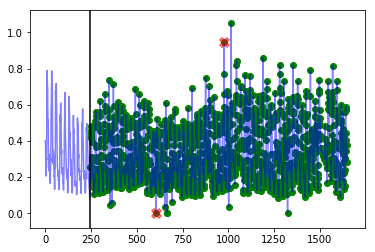




--- exchange-3_cpm_results ---
Corresponding window precision:  0.1111111111111111
Corresponding window recall:  1.0
Corresponding window false positives:  8
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [247, 248, 249, 250, 251, 252, 253, 254, 255, 256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 300, 301, 302, 303, 304, 305, 306, 307, 308, 309, 310, 311, 312, 313, 314, 315, 316, 317, 318, 319, 320, 321, 322, 323, 324, 325, 326, 327, 328, 329, 330, 331, 332, 333, 334, 335, 336, 337, 338, 339, 340, 341, 342, 343, 344, 345, 346, 347, 348, 349, 350, 351, 352, 353, 354, 355, 356, 357, 358, 359, 360, 361, 362, 363, 364, 365, 366, 367, 368, 369, 370, 371, 372, 373, 374, 375, 376, 377, 378, 379, 380, 381, 382, 383, 384, 385, 386, 387, 388, 389, 390, 391, 392, 393, 394

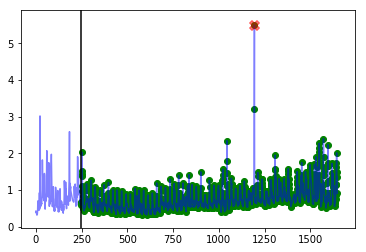




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.1111111111111111
Corresponding window recall:  1.0
Corresponding window false positives:  16
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1183, 1184, 1185, 1186, 1187, 1188, 1189, 1190, 1191, 1192, 1193, 1194, 1195, 1196, 1197, 1198, 1199, 1200, 1201, 1202, 1203, 1204, 1205, 1206, 1207, 1208, 1209, 1210, 1211, 1212, 1213, 1214, 1215, 1216, 1217, 1218, 1219, 1220, 1221, 1222, 1223, 1224, 1225, 1226, 1227, 1228, 1229, 1230, 1231, 1232, 1233, 1234, 1235, 1236, 1237, 1238, 1239, 1240, 1241, 1242, 1243, 1244, 1245, 1246, 1247, 1248, 1249, 1250, 1251, 1252, 1253, 1254, 1255, 1256, 1257, 1258, 1259, 1260, 1261, 1262, 1263, 1264, 1265, 1266, 1267, 1268, 1269, 1270, 1271, 1272, 1273, 1274, 1275, 1276, 1277, 1278, 1279, 1280, 1281, 1282, 1283, 1284, 1285, 1286, 1287, 1288, 1289, 1290, 1291, 1292, 1293, 1294, 1295, 1296, 1297, 1298, 1299, 1300, 1301, 1302, 1303,

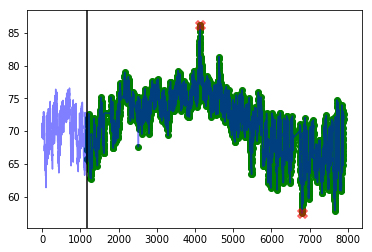




--- all_data_gift_certificates ---
Corresponding window precision:  0.11538461538461539
Corresponding window recall:  1.0
Corresponding window false positives:  23
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1317, 1318, 1319, 1320, 1321, 1322, 1323, 1324, 1325, 1326, 1327, 1328, 1329, 1330, 1331, 1332, 1333, 1334, 1335, 1336, 1337, 1338, 1339, 1340, 1341, 1342, 1343, 1344, 1345, 1346, 1347, 1348, 1349, 1350, 1351, 1352, 1353, 1354, 1355, 1356, 1357, 1358, 1359, 1360, 1361, 1362, 1363, 1364, 1365, 1366, 1367, 1368, 1369, 1370, 1371, 1372, 1373, 1374, 1375, 1376, 1377, 1378, 1379, 1380, 1381, 1382, 1383, 1384, 1385, 1386, 1387, 1388, 1389, 1390, 1391, 1392, 1393, 1394, 1395, 1396, 1397, 1398, 1399, 1400, 1401, 1402, 1403, 1404, 1405, 1406, 1407, 1408, 1409, 1410, 1411, 1412, 1413, 1414, 1415, 1416, 1417, 1418, 1419, 1420, 1421, 1422, 1423, 1424, 1425, 1426, 1427, 1428, 1429, 1430, 1431, 1432, 1433, 1434, 1435, 1436, 1437, 1438, 

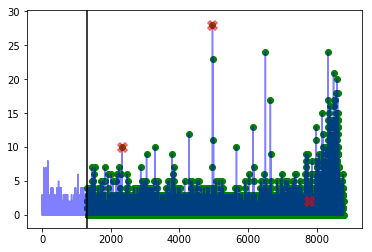




--- exchange-2_cpc_results ---
Corresponding window precision:  0.1111111111111111
Corresponding window recall:  1.0
Corresponding window false positives:  8
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [247, 248, 249, 250, 251, 252, 253, 254, 255, 256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 300, 301, 302, 303, 304, 305, 306, 307, 308, 309, 310, 311, 312, 313, 314, 315, 316, 317, 318, 319, 320, 321, 322, 323, 324, 325, 326, 327, 328, 329, 330, 331, 332, 333, 334, 335, 336, 337, 338, 339, 340, 341, 342, 343, 344, 345, 346, 347, 348, 349, 350, 351, 352, 353, 354, 355, 356, 357, 358, 359, 360, 361, 362, 363, 364, 365, 366, 367, 368, 369, 370, 371, 372, 373, 374, 375, 376, 377, 378, 379, 380, 381, 382, 383, 384, 385, 386, 387, 388, 389, 390, 391, 392, 393, 394

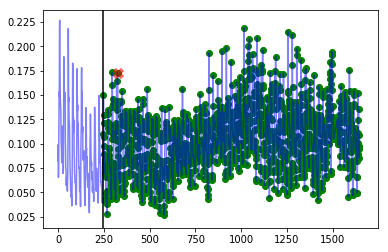




--- exchange-3_cpc_results ---
Corresponding window precision:  0.11538461538461539
Corresponding window recall:  1.0
Corresponding window false positives:  23
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [247, 248, 249, 250, 251, 252, 253, 254, 255, 256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 300, 301, 302, 303, 304, 305, 306, 307, 308, 309, 310, 311, 312, 313, 314, 315, 316, 317, 318, 319, 320, 321, 322, 323, 324, 325, 326, 327, 328, 329, 330, 331, 332, 333, 334, 335, 336, 337, 338, 339, 340, 341, 342, 343, 344, 345, 346, 347, 348, 349, 350, 351, 352, 353, 354, 355, 356, 357, 358, 359, 360, 361, 362, 363, 364, 365, 366, 367, 368, 369, 370, 371, 372, 373, 374, 375, 376, 377, 378, 379, 380, 381, 382, 383, 384, 385, 386, 387, 388, 389, 390, 391, 392, 393, 3

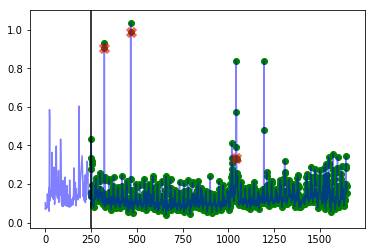




--- international-airline-passengers ---
Corresponding window precision:  0.1111111111111111
Corresponding window recall:  1.0
Corresponding window false positives:  8
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143]


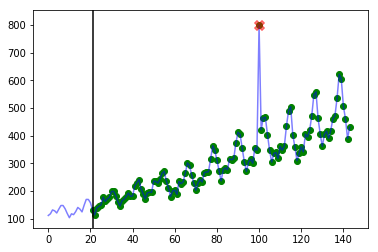

---------weight_fp=0.2, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  13.6
Best window threshold:  0.5157
Corresponding window overall precision:  0.3
Corresponding window overall recall:  0.23076923076923078
Corresponding window overall F score:  0.2608695652173913



--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  3
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [247, 248, 249, 250, 251, 252, 253, 254, 255, 256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 300, 301, 302, 303, 304, 305, 306, 307, 308, 309, 310, 311, 312, 313, 314, 315, 316, 317, 318, 319, 320, 321, 322, 323, 324, 325, 326, 1646, 1647]


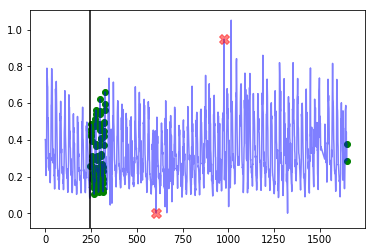




--- exchange-3_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  2
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [247, 248, 249, 250, 251, 252, 253, 254, 255, 256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 300, 301, 302, 303, 304, 305, 306, 307, 308, 309, 310, 311, 312, 313, 314, 315, 316, 317, 318, 319, 320, 321, 322, 323, 324, 325, 326, 1645, 1646]


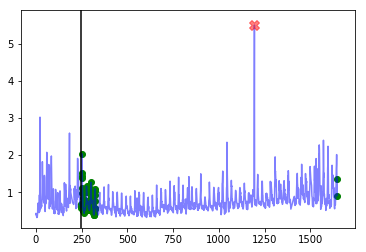




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [7886, 7887]


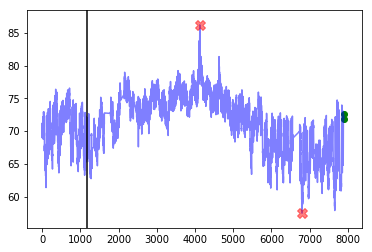




--- all_data_gift_certificates ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [8782, 8783]


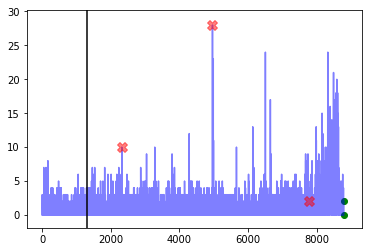




--- exchange-2_cpc_results ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [247, 248, 249, 250, 251, 252, 253, 254, 255, 256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 300, 301, 302, 303, 304, 305, 306, 307, 308, 309, 310, 311, 312, 313, 314, 315, 316, 317, 318, 319, 320, 321, 322, 323, 324, 325, 326, 1646, 1647]


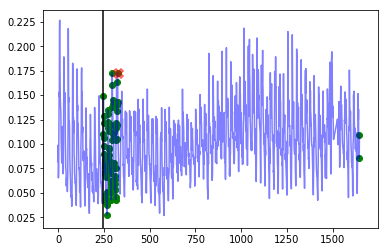




--- exchange-3_cpc_results ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  2
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [247, 248, 249, 250, 251, 252, 253, 254, 255, 256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 300, 301, 302, 303, 304, 305, 306, 307, 308, 309, 310, 311, 312, 313, 314, 315, 316, 317, 318, 319, 320, 321, 322, 323, 324, 325, 326, 1645, 1646]


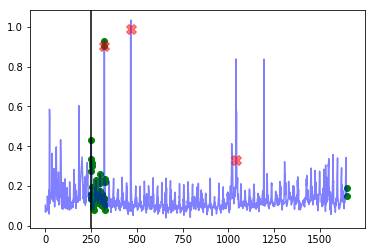




--- international-airline-passengers ---
Corresponding window precision:  0.1111111111111111
Corresponding window recall:  1.0
Corresponding window false positives:  8
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143]


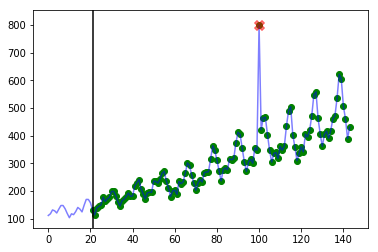

---------weight_fp=0.3, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  15.100000000000001
Best window threshold:  0.5624
Corresponding window overall precision:  0.16666666666666666
Corresponding window overall recall:  0.07692307692307693
Corresponding window overall F score:  0.10526315789473684



--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1646, 1647]


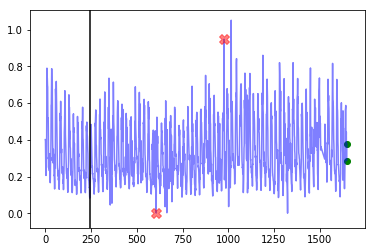




--- exchange-3_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1645, 1646]


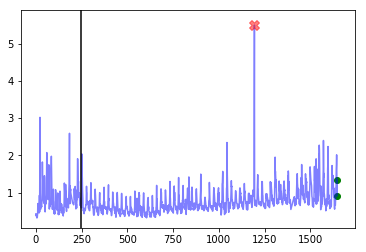




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [7886, 7887]


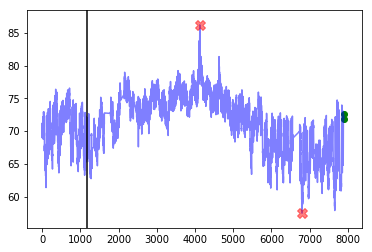




--- all_data_gift_certificates ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [8782, 8783]


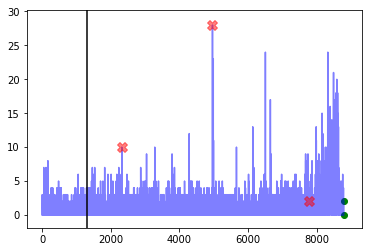




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1646, 1647]


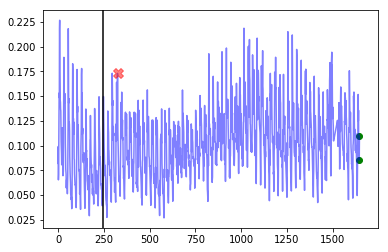




--- exchange-3_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [1645, 1646]


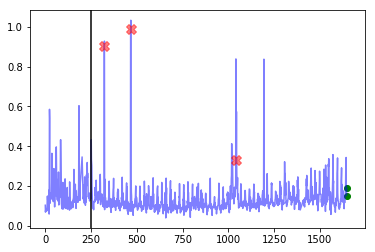




--- international-airline-passengers ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [142, 143]


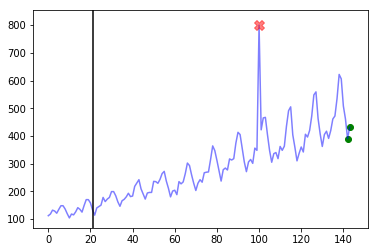

---------weight_fp=0.4, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  15.8
Best window threshold:  0.5624
Corresponding window overall precision:  0.16666666666666666
Corresponding window overall recall:  0.07692307692307693
Corresponding window overall F score:  0.10526315789473684



--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1646, 1647]


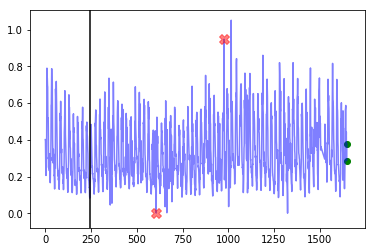




--- exchange-3_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1645, 1646]


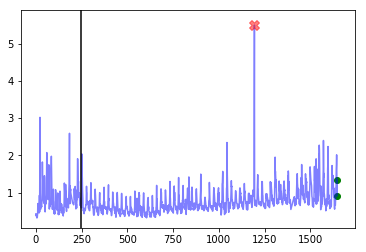




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [7886, 7887]


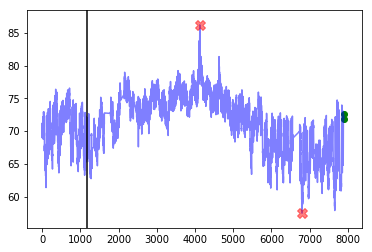




--- all_data_gift_certificates ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [8782, 8783]


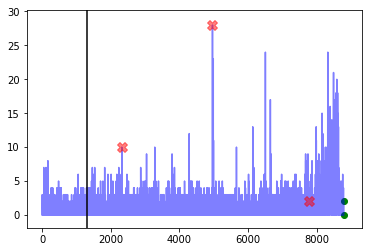




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1646, 1647]


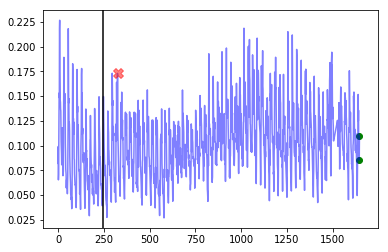




--- exchange-3_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [1645, 1646]


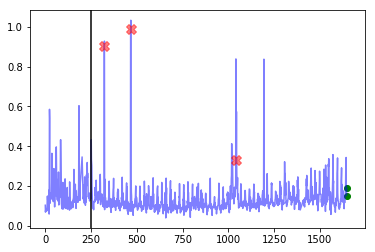




--- international-airline-passengers ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [142, 143]


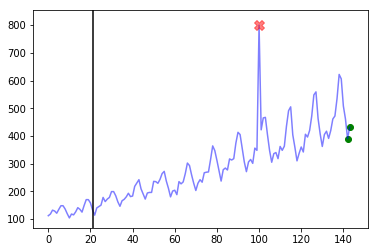

---------weight_fp=0.5, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  16.5
Best window threshold:  0.5624
Corresponding window overall precision:  0.16666666666666666
Corresponding window overall recall:  0.07692307692307693
Corresponding window overall F score:  0.10526315789473684



--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1646, 1647]


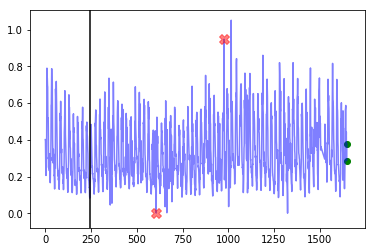




--- exchange-3_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1645, 1646]


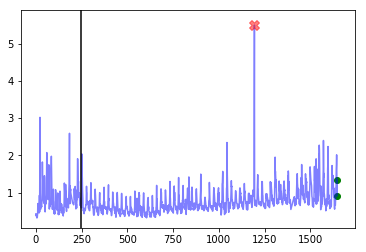




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [7886, 7887]


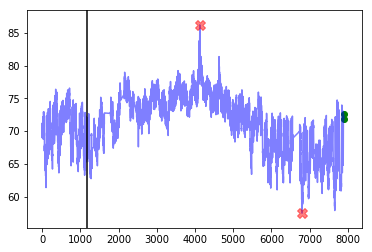




--- all_data_gift_certificates ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [8782, 8783]


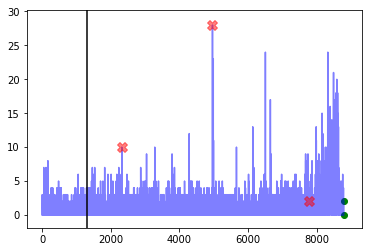




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1646, 1647]


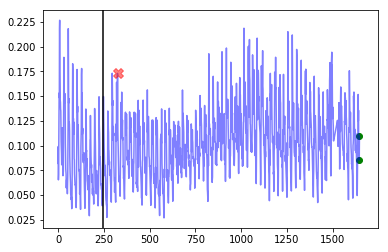




--- exchange-3_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [1645, 1646]


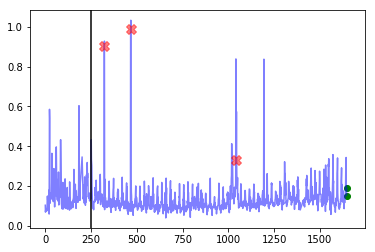




--- international-airline-passengers ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [142, 143]


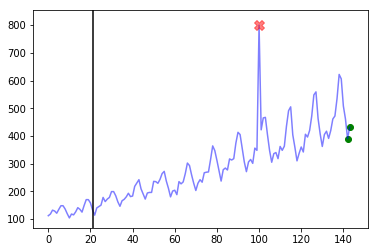

---------weight_fp=0.6, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  17.2
Best window threshold:  0.5624
Corresponding window overall precision:  0.16666666666666666
Corresponding window overall recall:  0.07692307692307693
Corresponding window overall F score:  0.10526315789473684



--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1646, 1647]


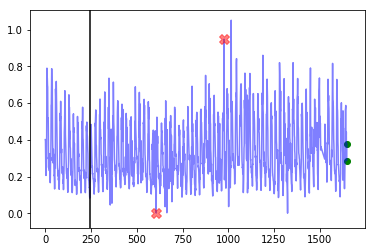




--- exchange-3_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1645, 1646]


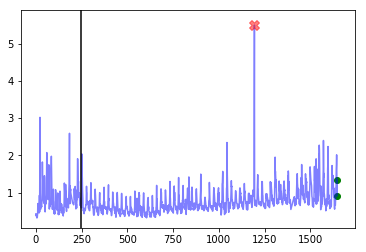




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [7886, 7887]


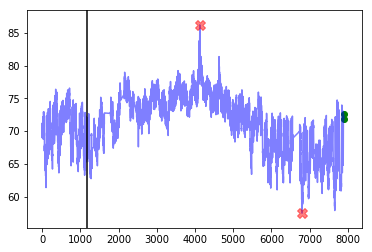




--- all_data_gift_certificates ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [8782, 8783]


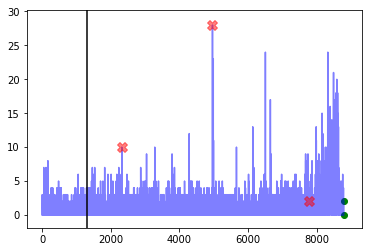




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1646, 1647]


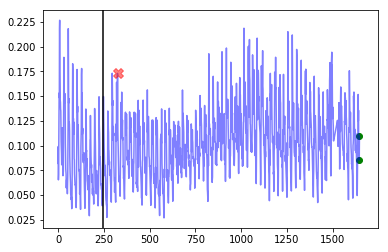




--- exchange-3_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [1645, 1646]


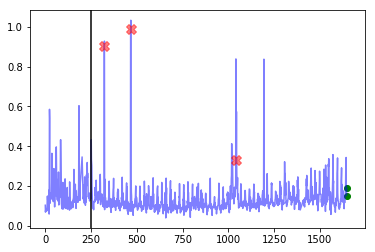




--- international-airline-passengers ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [142, 143]


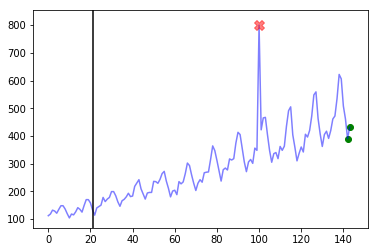

---------weight_fp=0.7, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  17.9
Best window threshold:  0.5624
Corresponding window overall precision:  0.16666666666666666
Corresponding window overall recall:  0.07692307692307693
Corresponding window overall F score:  0.10526315789473684



--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1646, 1647]


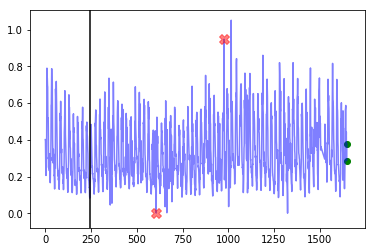




--- exchange-3_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1645, 1646]


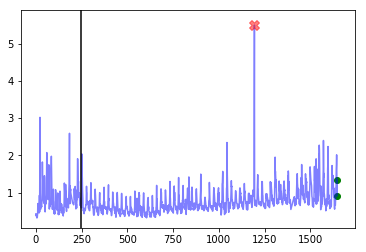




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [7886, 7887]


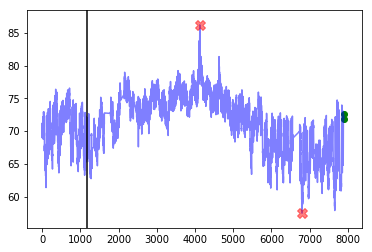




--- all_data_gift_certificates ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [8782, 8783]


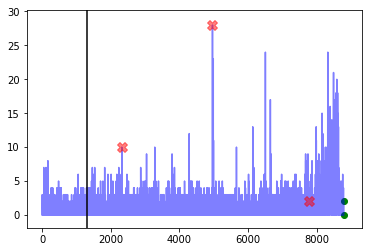




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1646, 1647]


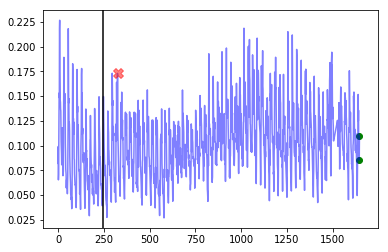




--- exchange-3_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [1645, 1646]


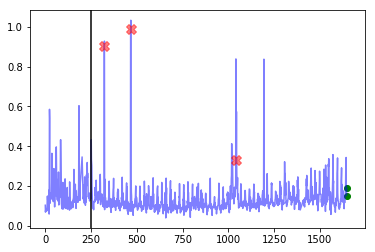




--- international-airline-passengers ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [142, 143]


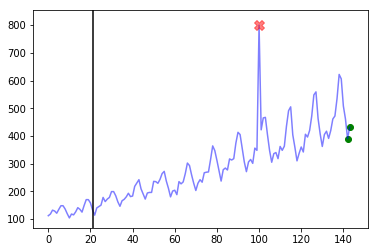

---------weight_fp=0.8, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  18.6
Best window threshold:  0.5624
Corresponding window overall precision:  0.16666666666666666
Corresponding window overall recall:  0.07692307692307693
Corresponding window overall F score:  0.10526315789473684



--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1646, 1647]


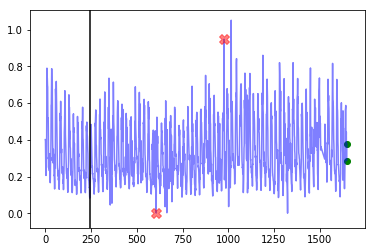




--- exchange-3_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1645, 1646]


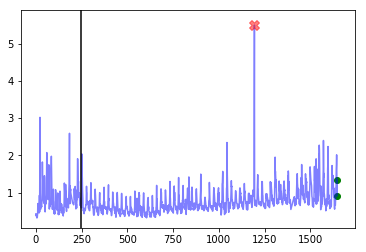




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [7886, 7887]


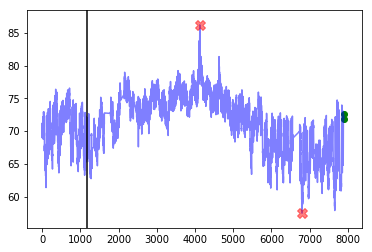




--- all_data_gift_certificates ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [8782, 8783]


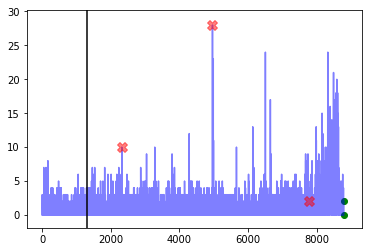




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1646, 1647]


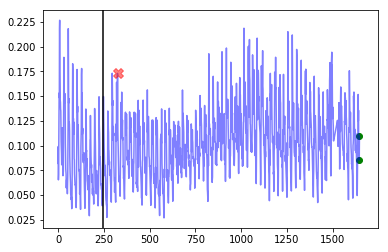




--- exchange-3_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [1645, 1646]


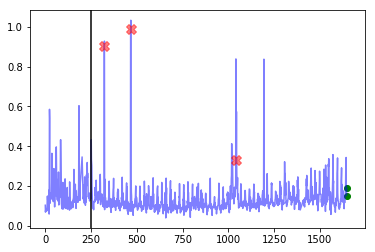




--- international-airline-passengers ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [142, 143]


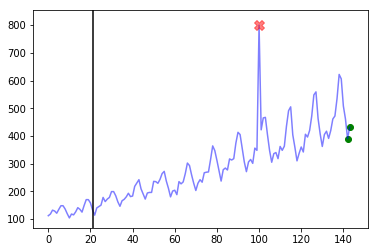

---------weight_fp=0.9, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  19.299999999999997
Best window threshold:  0.5624
Corresponding window overall precision:  0.16666666666666666
Corresponding window overall recall:  0.07692307692307693
Corresponding window overall F score:  0.10526315789473684



--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1646, 1647]


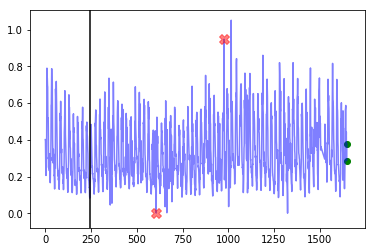




--- exchange-3_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1645, 1646]


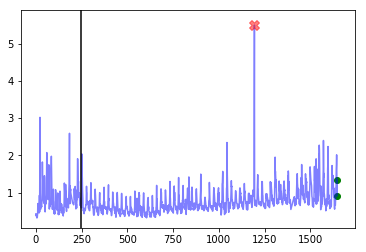




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [7886, 7887]


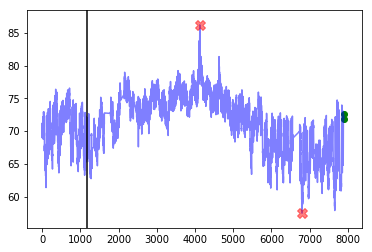




--- all_data_gift_certificates ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [8782, 8783]


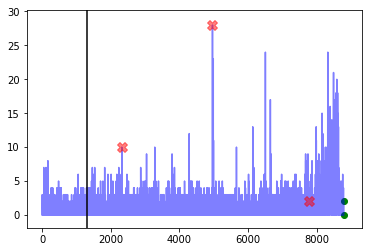




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1646, 1647]


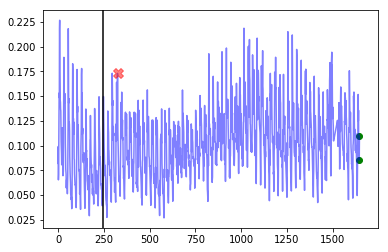




--- exchange-3_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [1645, 1646]


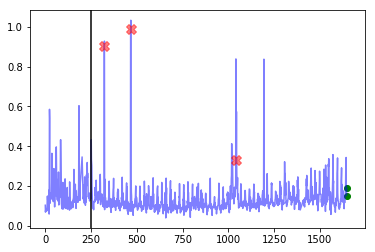




--- international-airline-passengers ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [142, 143]


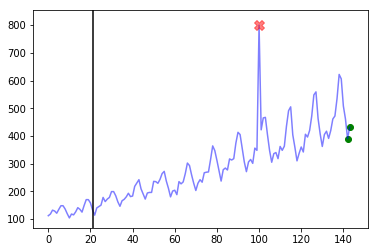

---------weight_fp=1.0, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  20.0
Best window threshold:  0.5624
Corresponding window overall precision:  0.16666666666666666
Corresponding window overall recall:  0.07692307692307693
Corresponding window overall F score:  0.10526315789473684



--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1646, 1647]


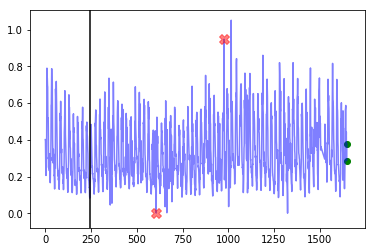




--- exchange-3_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1645, 1646]


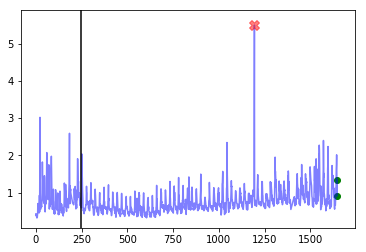




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [7886, 7887]


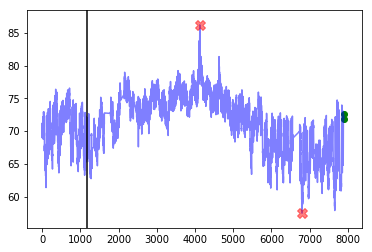




--- all_data_gift_certificates ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [8782, 8783]


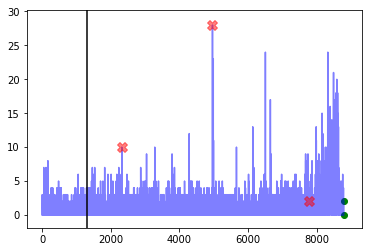




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1646, 1647]


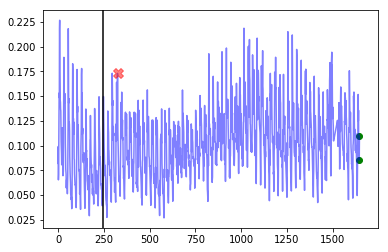




--- exchange-3_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [1645, 1646]


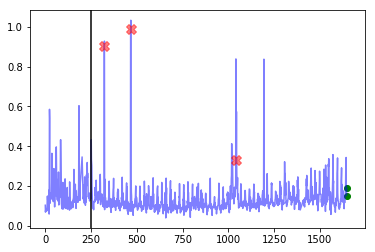




--- international-airline-passengers ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [142, 143]


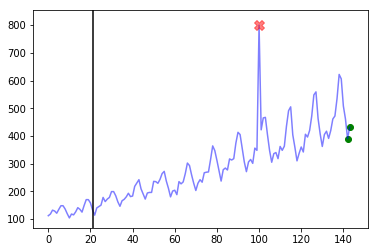

------------
False Positive Weight:  0.1
	 Minimum number of mistakes : 10.200000000000001
	 Best window threshold : 0.0
	 Corresponding window overall precision : 0.1111111111111111
	 Corresponding window overall recall : 1.0
	 Corresponding window overall F score : 0.19999999999999998
False Positive Weight:  0.2
	 Minimum number of mistakes : 13.6
	 Best window threshold : 0.5157
	 Corresponding window overall precision : 0.3
	 Corresponding window overall recall : 0.23076923076923078
	 Corresponding window overall F score : 0.2608695652173913
False Positive Weight:  0.3
	 Minimum number of mistakes : 15.100000000000001
	 Best window threshold : 0.5624
	 Corresponding window overall precision : 0.16666666666666666
	 Corresponding window overall recall : 0.07692307692307693
	 Corresponding window overall F score : 0.10526315789473684
False Positive Weight:  0.4
	 Minimum number of mistakes : 15.8
	 Best window threshold : 0.5624
	 Corresponding window overall precision : 0.16666666666

In [31]:
end_results = {}
for weight_fp in weight_fp_list:  
    print("---------weight_fp=" + str(weight_fp) + ", weight_fn=1----------")
    weight_result = adclasses.pretty_print_results(stl_ad_dict, anomaly_scores_dict, stl_true_outlier_indices_dict, weight_fp=weight_fp, weight_fn=1)
    end_results[weight_fp] = weight_result

print("------------")
adclasses.pretty_print_end_results(end_results)

# windowed gaussian Results

In [32]:
anomaly_scores_dict = {}

for dataset_name in dataset_name_list:
    output_dict_htm = joblib.load("anomaly_scores" + window_size + "/windowed_gaussian/" + dataset_name)
    anomaly_scores_dict[dataset_name] = output_dict_htm["Anomaly Scores"]

In [33]:
adclasses.precision_recall_curve_info(anomaly_scores_dict, true_outlier_indices_dict)

{0.1: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.2: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.3: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.4: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.5: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.6: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.7: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.8: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.9: {'precision': 0.1111111111111111, 'recall': 1.0},
 1.0: {'precision': 0.0, 'recall': 0.0}}

---------weight_fp=0.1, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  6.7
Best window threshold:  0.9999
Corresponding window overall precision:  0.2777777777777778
Corresponding window overall recall:  0.8333333333333334
Corresponding window overall F score:  0.4166666666666667



--- ibm-common-stock-closing-prices ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [800, 801, 802, 803, 804, 805, 806, 807, 809, 810, 811]


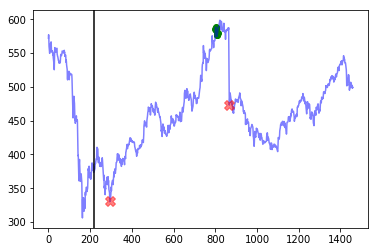




--- exchange-2_cpm_results ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [977, 1016]


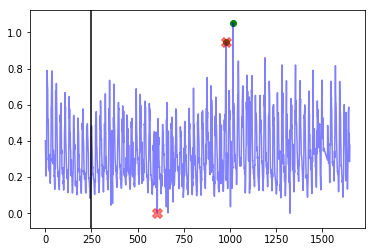




--- exchange-3_cpm_results ---
Corresponding window precision:  0.25
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [836, 901, 1020, 1021, 1044, 1045, 1046, 1193, 1194, 1307, 1548, 1571, 1596]


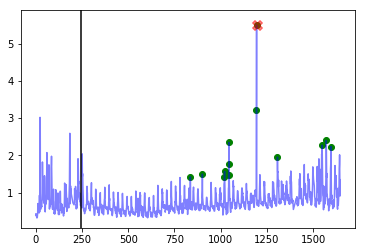




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2518, 4100, 4101, 4102, 4103, 4104, 4105, 4106, 4107, 4108, 4109, 4110, 4120, 4121, 4122, 4123, 4124, 4125, 4126, 4127, 4128, 4129, 4130, 4131, 4132, 4133, 4134, 4135, 4136, 5457, 5458, 5459, 5461, 5462, 5463, 5464, 5465, 5466, 5467, 5468, 5469, 5470, 5471, 5472, 5473, 5474, 5475, 5476, 5477, 5478, 5479, 5480, 5481, 5482, 5483, 5504, 6795, 6796, 6797, 6798, 6799, 6800, 6801, 6802, 6803, 6804, 6806, 6808, 6809, 6811]


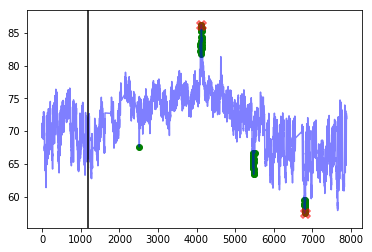




--- all_data_gift_certificates ---
Corresponding window precision:  0.125
Corresponding window recall:  1.0
Corresponding window false positives:  21
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1438, 1462, 1483, 1487, 1505, 1531, 1820, 1822, 1918, 2009, 2059, 2157, 2176, 2233, 2304, 2320, 2471, 2514, 2871, 2899, 2974, 3016, 3042, 3281, 3664, 3688, 3785, 3790, 3810, 3841, 3855, 4286, 4516, 4578, 4946, 4961, 4963, 4986, 4987, 4989, 4992, 5008, 5009, 5632, 5637, 5662, 5905, 5924, 6014, 6019, 6137, 6164, 6167, 6375, 6471, 6505, 6650, 6669, 7317, 7318, 7366, 7396, 7655, 7656, 7677, 7679, 7680, 7696, 7720, 7746, 7838, 7864, 7871, 7985, 7987, 7989, 8009, 8010, 8017, 8059, 8060, 8157, 8162, 8175, 8177, 8323, 8324, 8326, 8327, 8345, 8346, 8347, 8370, 8371, 8372, 8375, 8393, 8394, 8490, 8491, 8563, 8586, 8610]


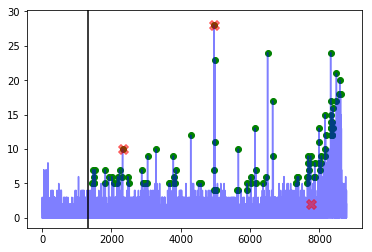




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  3
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [824, 896, 920, 1016, 1046, 1088]


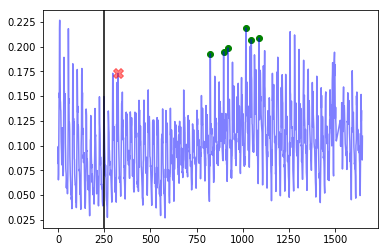




--- exchange-3_cpc_results ---
Corresponding window precision:  0.6
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [322, 323, 466, 467, 1017, 1018, 1019, 1020, 1022, 1023, 1041, 1042, 1043, 1044, 1045, 1046, 1050, 1193, 1194]


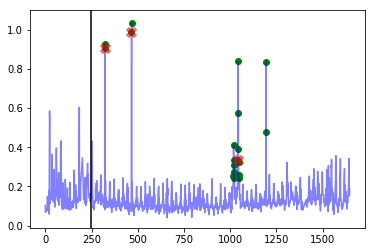




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1271, 2970]


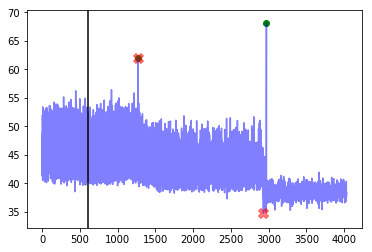




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3567, 3568, 3569, 3570, 3571, 3580, 3581, 3582, 3583, 3584, 3585, 3586, 3587, 3588, 3589, 3590, 3591, 3592, 3593, 3594, 3595, 3596, 3597, 3598, 3599, 3600, 3601, 3602, 3603, 3604, 3605, 3606, 3607, 3608, 3609, 3610, 3611, 3612, 3613, 3614, 3615, 3616, 3617, 3618, 3619, 3620, 3621, 3622, 3623, 3624, 3625, 3626, 3627, 3628, 3629, 3630, 3631, 3632, 3633, 3634, 3635, 3636, 3637, 3638, 3639, 3640, 3641, 3642, 3643, 3644, 3645, 3646, 3647, 3648, 3649, 3650, 3651, 3652, 3653, 3654, 3655, 3656, 3657, 3658, 3659, 3660, 3661, 3662, 3663, 3664, 3665, 3666, 3667, 3668, 3669, 3670, 3671, 3672, 3673, 3674, 3675, 3676, 3677, 3678, 3679, 3680, 3681, 3682, 3683, 3684, 3685, 3686, 3687, 3688, 3689, 3690, 3691, 3692, 3693, 3694, 3695, 3696, 3697, 3698, 3699,

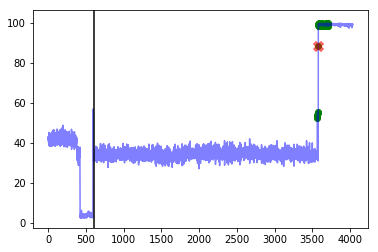




--- international-airline-passengers ---
Corresponding window precision:  0.25
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [100, 115, 126, 127, 137, 138, 139, 140]


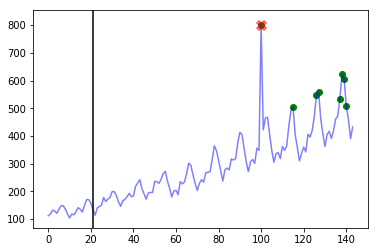

---------weight_fp=0.2, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  10.399999999999999
Best window threshold:  0.9999
Corresponding window overall precision:  0.2777777777777778
Corresponding window overall recall:  0.8333333333333334
Corresponding window overall F score:  0.4166666666666667



--- ibm-common-stock-closing-prices ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [800, 801, 802, 803, 804, 805, 806, 807, 809, 810, 811]


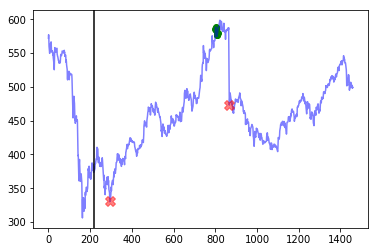




--- exchange-2_cpm_results ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [977, 1016]


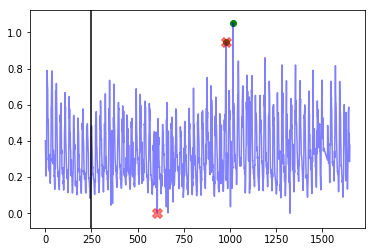




--- exchange-3_cpm_results ---
Corresponding window precision:  0.25
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [836, 901, 1020, 1021, 1044, 1045, 1046, 1193, 1194, 1307, 1548, 1571, 1596]


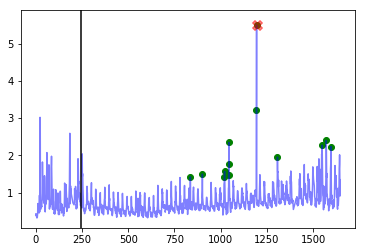




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2518, 4100, 4101, 4102, 4103, 4104, 4105, 4106, 4107, 4108, 4109, 4110, 4120, 4121, 4122, 4123, 4124, 4125, 4126, 4127, 4128, 4129, 4130, 4131, 4132, 4133, 4134, 4135, 4136, 5457, 5458, 5459, 5461, 5462, 5463, 5464, 5465, 5466, 5467, 5468, 5469, 5470, 5471, 5472, 5473, 5474, 5475, 5476, 5477, 5478, 5479, 5480, 5481, 5482, 5483, 5504, 6795, 6796, 6797, 6798, 6799, 6800, 6801, 6802, 6803, 6804, 6806, 6808, 6809, 6811]


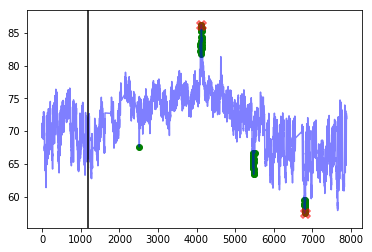




--- all_data_gift_certificates ---
Corresponding window precision:  0.125
Corresponding window recall:  1.0
Corresponding window false positives:  21
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1438, 1462, 1483, 1487, 1505, 1531, 1820, 1822, 1918, 2009, 2059, 2157, 2176, 2233, 2304, 2320, 2471, 2514, 2871, 2899, 2974, 3016, 3042, 3281, 3664, 3688, 3785, 3790, 3810, 3841, 3855, 4286, 4516, 4578, 4946, 4961, 4963, 4986, 4987, 4989, 4992, 5008, 5009, 5632, 5637, 5662, 5905, 5924, 6014, 6019, 6137, 6164, 6167, 6375, 6471, 6505, 6650, 6669, 7317, 7318, 7366, 7396, 7655, 7656, 7677, 7679, 7680, 7696, 7720, 7746, 7838, 7864, 7871, 7985, 7987, 7989, 8009, 8010, 8017, 8059, 8060, 8157, 8162, 8175, 8177, 8323, 8324, 8326, 8327, 8345, 8346, 8347, 8370, 8371, 8372, 8375, 8393, 8394, 8490, 8491, 8563, 8586, 8610]


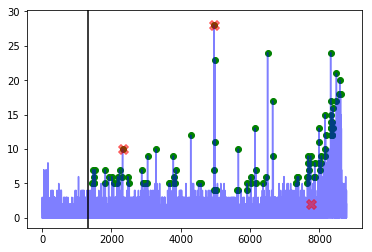




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  3
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [824, 896, 920, 1016, 1046, 1088]


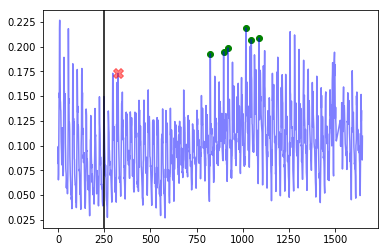




--- exchange-3_cpc_results ---
Corresponding window precision:  0.6
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [322, 323, 466, 467, 1017, 1018, 1019, 1020, 1022, 1023, 1041, 1042, 1043, 1044, 1045, 1046, 1050, 1193, 1194]


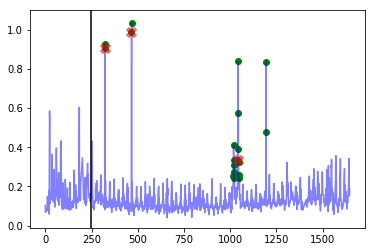




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1271, 2970]


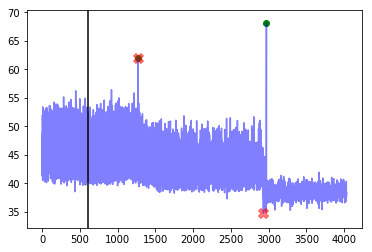




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3567, 3568, 3569, 3570, 3571, 3580, 3581, 3582, 3583, 3584, 3585, 3586, 3587, 3588, 3589, 3590, 3591, 3592, 3593, 3594, 3595, 3596, 3597, 3598, 3599, 3600, 3601, 3602, 3603, 3604, 3605, 3606, 3607, 3608, 3609, 3610, 3611, 3612, 3613, 3614, 3615, 3616, 3617, 3618, 3619, 3620, 3621, 3622, 3623, 3624, 3625, 3626, 3627, 3628, 3629, 3630, 3631, 3632, 3633, 3634, 3635, 3636, 3637, 3638, 3639, 3640, 3641, 3642, 3643, 3644, 3645, 3646, 3647, 3648, 3649, 3650, 3651, 3652, 3653, 3654, 3655, 3656, 3657, 3658, 3659, 3660, 3661, 3662, 3663, 3664, 3665, 3666, 3667, 3668, 3669, 3670, 3671, 3672, 3673, 3674, 3675, 3676, 3677, 3678, 3679, 3680, 3681, 3682, 3683, 3684, 3685, 3686, 3687, 3688, 3689, 3690, 3691, 3692, 3693, 3694, 3695, 3696, 3697, 3698, 3699,

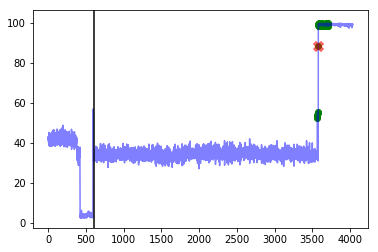




--- international-airline-passengers ---
Corresponding window precision:  0.25
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [100, 115, 126, 127, 137, 138, 139, 140]


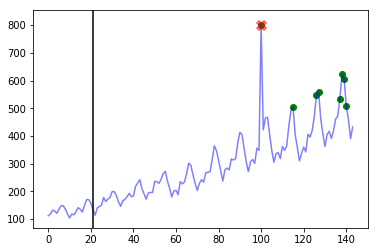

---------weight_fp=0.3, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  12.700000000000001
Best window threshold:  1.0
Corresponding window overall precision:  0.47058823529411764
Corresponding window overall recall:  0.4444444444444444
Corresponding window overall F score:  0.45714285714285713



--- ibm-common-stock-closing-prices ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


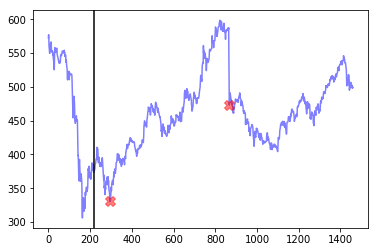




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


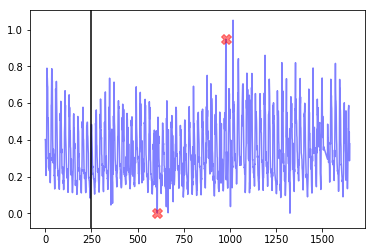




--- exchange-3_cpm_results ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1044, 1193, 1194]


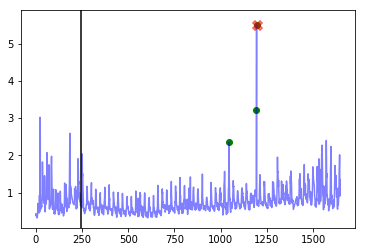




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


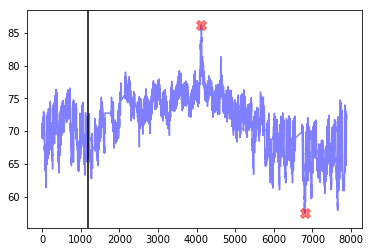




--- all_data_gift_certificates ---
Corresponding window precision:  0.2222222222222222
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  7
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2320, 4286, 4963, 4986, 4992, 5662, 6137, 6505, 6650, 7985, 8324]


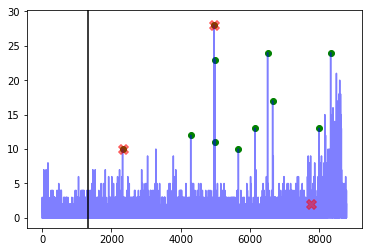




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


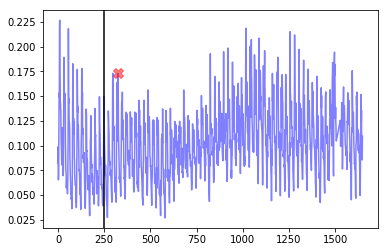




--- exchange-3_cpc_results ---
Corresponding window precision:  0.75
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [322, 323, 466, 467, 1018, 1041, 1044, 1194]


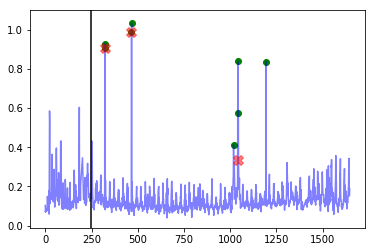




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2970]


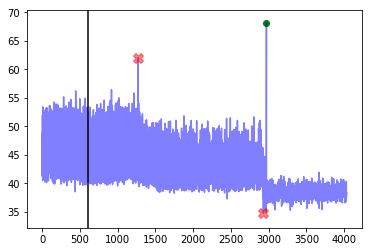




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3567, 3568, 3569, 3570, 3571, 3580, 3581, 3582, 3583, 3584, 3585, 3586, 3587, 3588, 3589, 3590, 3591, 3592, 3593, 3594, 3595, 3596, 3597, 3598, 3599, 3600, 3601, 3602, 3603, 3604, 3605, 3606, 3607, 3608, 3609, 3610, 3611]


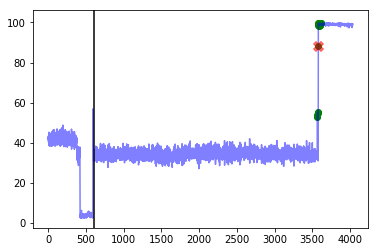




--- international-airline-passengers ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


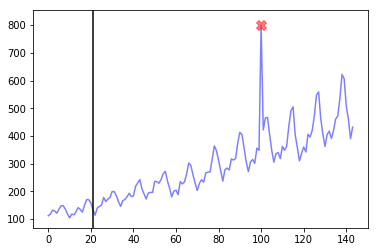

---------weight_fp=0.4, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  13.600000000000001
Best window threshold:  1.0
Corresponding window overall precision:  0.47058823529411764
Corresponding window overall recall:  0.4444444444444444
Corresponding window overall F score:  0.45714285714285713



--- ibm-common-stock-closing-prices ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


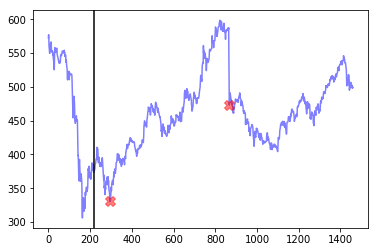




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


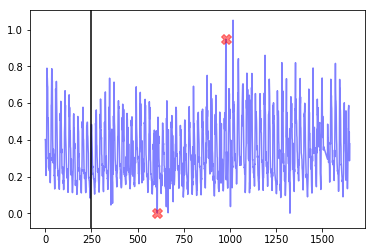




--- exchange-3_cpm_results ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1044, 1193, 1194]


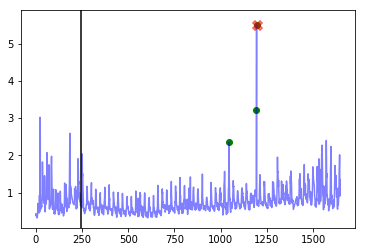




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


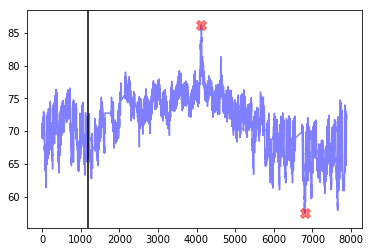




--- all_data_gift_certificates ---
Corresponding window precision:  0.2222222222222222
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  7
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2320, 4286, 4963, 4986, 4992, 5662, 6137, 6505, 6650, 7985, 8324]


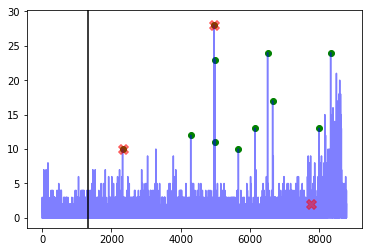




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


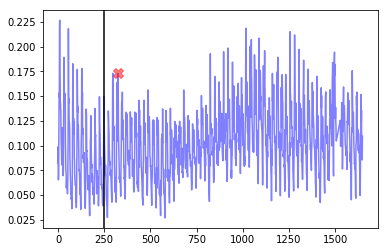




--- exchange-3_cpc_results ---
Corresponding window precision:  0.75
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [322, 323, 466, 467, 1018, 1041, 1044, 1194]


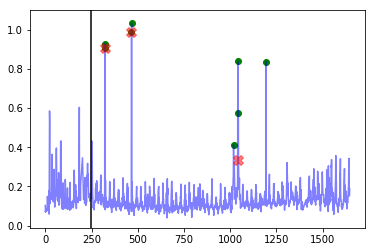




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2970]


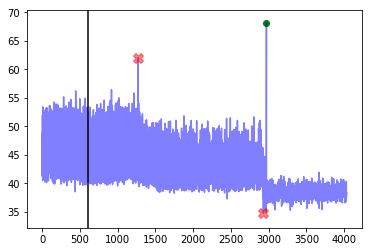




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3567, 3568, 3569, 3570, 3571, 3580, 3581, 3582, 3583, 3584, 3585, 3586, 3587, 3588, 3589, 3590, 3591, 3592, 3593, 3594, 3595, 3596, 3597, 3598, 3599, 3600, 3601, 3602, 3603, 3604, 3605, 3606, 3607, 3608, 3609, 3610, 3611]


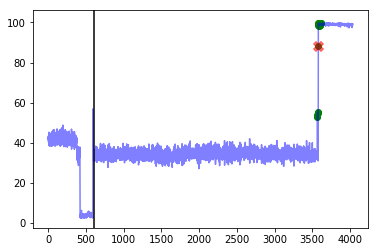




--- international-airline-passengers ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


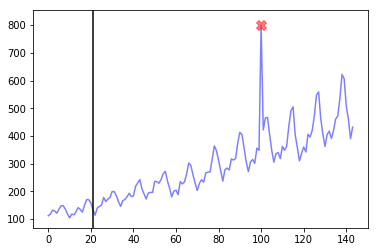

---------weight_fp=0.5, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  14.5
Best window threshold:  1.0
Corresponding window overall precision:  0.47058823529411764
Corresponding window overall recall:  0.4444444444444444
Corresponding window overall F score:  0.45714285714285713



--- ibm-common-stock-closing-prices ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


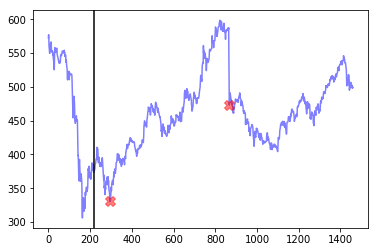




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


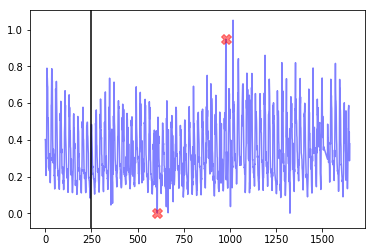




--- exchange-3_cpm_results ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1044, 1193, 1194]


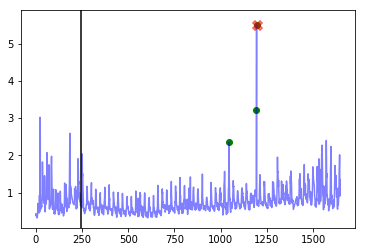




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


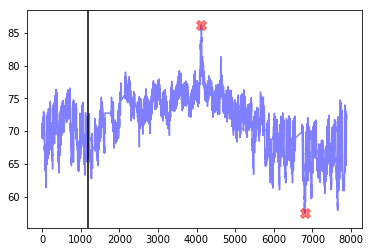




--- all_data_gift_certificates ---
Corresponding window precision:  0.2222222222222222
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  7
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2320, 4286, 4963, 4986, 4992, 5662, 6137, 6505, 6650, 7985, 8324]


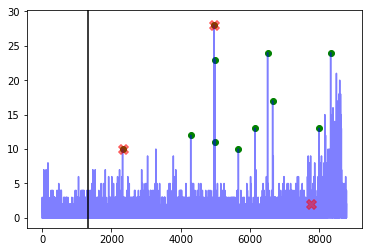




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


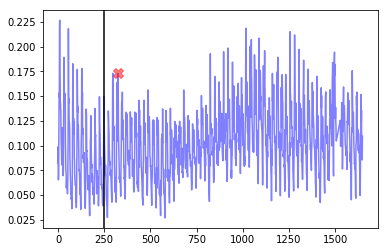




--- exchange-3_cpc_results ---
Corresponding window precision:  0.75
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [322, 323, 466, 467, 1018, 1041, 1044, 1194]


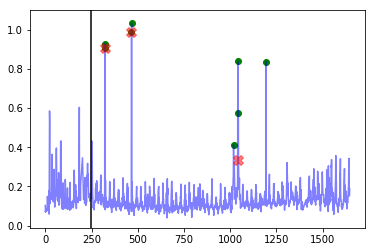




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2970]


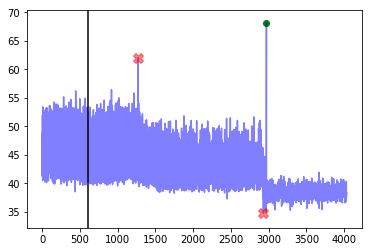




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3567, 3568, 3569, 3570, 3571, 3580, 3581, 3582, 3583, 3584, 3585, 3586, 3587, 3588, 3589, 3590, 3591, 3592, 3593, 3594, 3595, 3596, 3597, 3598, 3599, 3600, 3601, 3602, 3603, 3604, 3605, 3606, 3607, 3608, 3609, 3610, 3611]


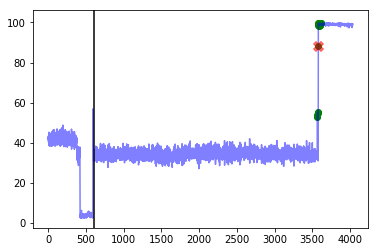




--- international-airline-passengers ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


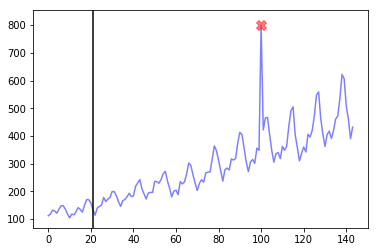

---------weight_fp=0.6, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  15.4
Best window threshold:  1.0
Corresponding window overall precision:  0.47058823529411764
Corresponding window overall recall:  0.4444444444444444
Corresponding window overall F score:  0.45714285714285713



--- ibm-common-stock-closing-prices ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


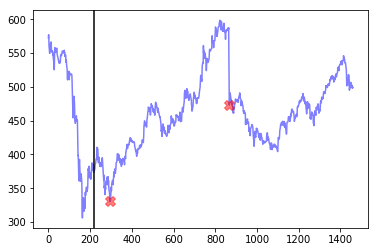




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


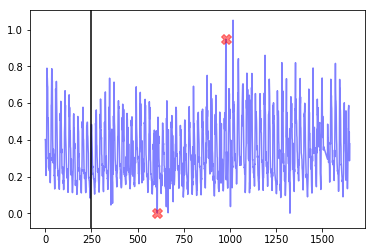




--- exchange-3_cpm_results ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1044, 1193, 1194]


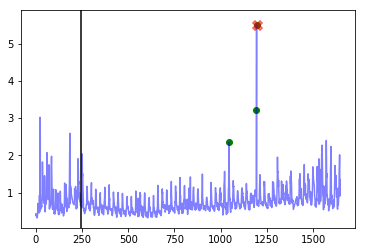




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


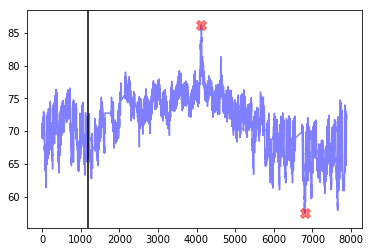




--- all_data_gift_certificates ---
Corresponding window precision:  0.2222222222222222
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  7
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2320, 4286, 4963, 4986, 4992, 5662, 6137, 6505, 6650, 7985, 8324]


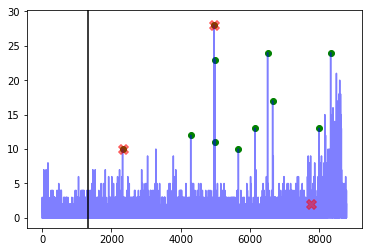




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


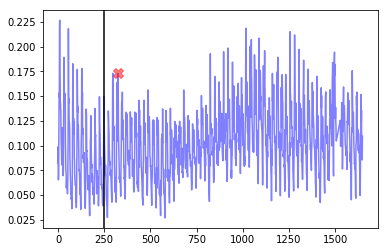




--- exchange-3_cpc_results ---
Corresponding window precision:  0.75
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [322, 323, 466, 467, 1018, 1041, 1044, 1194]


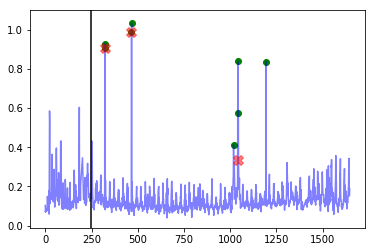




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2970]


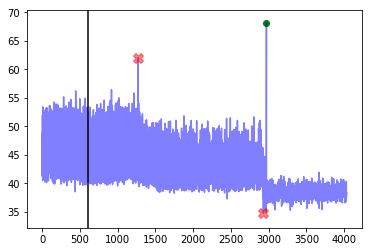




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3567, 3568, 3569, 3570, 3571, 3580, 3581, 3582, 3583, 3584, 3585, 3586, 3587, 3588, 3589, 3590, 3591, 3592, 3593, 3594, 3595, 3596, 3597, 3598, 3599, 3600, 3601, 3602, 3603, 3604, 3605, 3606, 3607, 3608, 3609, 3610, 3611]


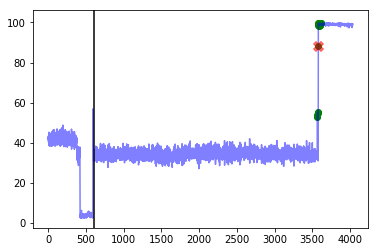




--- international-airline-passengers ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


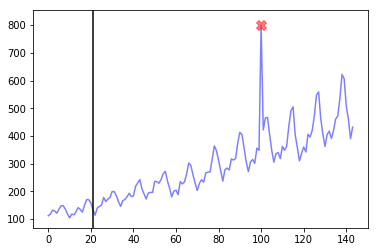

---------weight_fp=0.7, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  16.299999999999997
Best window threshold:  1.0
Corresponding window overall precision:  0.47058823529411764
Corresponding window overall recall:  0.4444444444444444
Corresponding window overall F score:  0.45714285714285713



--- ibm-common-stock-closing-prices ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


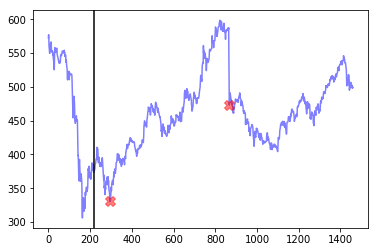




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


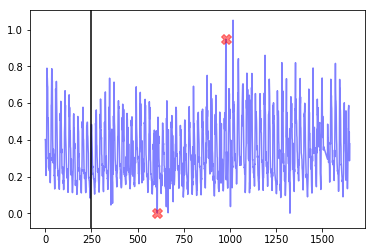




--- exchange-3_cpm_results ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1044, 1193, 1194]


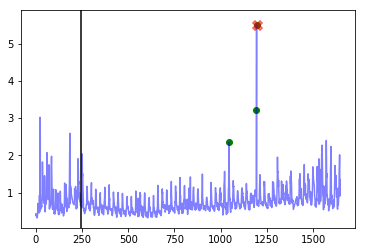




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


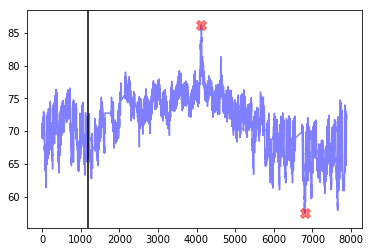




--- all_data_gift_certificates ---
Corresponding window precision:  0.2222222222222222
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  7
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2320, 4286, 4963, 4986, 4992, 5662, 6137, 6505, 6650, 7985, 8324]


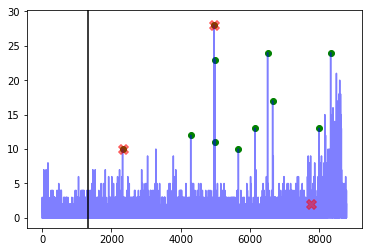




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


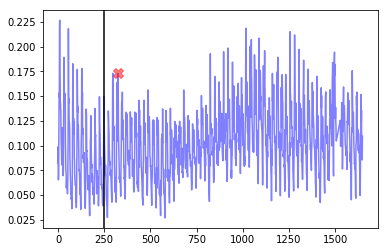




--- exchange-3_cpc_results ---
Corresponding window precision:  0.75
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [322, 323, 466, 467, 1018, 1041, 1044, 1194]


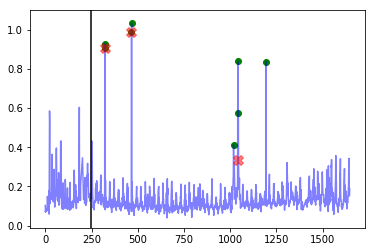




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2970]


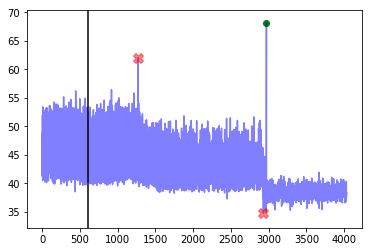




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3567, 3568, 3569, 3570, 3571, 3580, 3581, 3582, 3583, 3584, 3585, 3586, 3587, 3588, 3589, 3590, 3591, 3592, 3593, 3594, 3595, 3596, 3597, 3598, 3599, 3600, 3601, 3602, 3603, 3604, 3605, 3606, 3607, 3608, 3609, 3610, 3611]


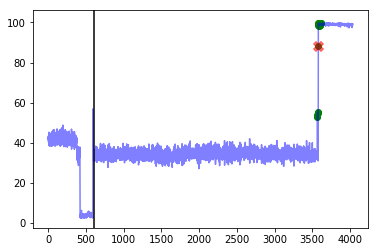




--- international-airline-passengers ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


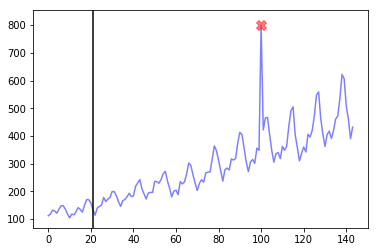

---------weight_fp=0.8, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  17.200000000000003
Best window threshold:  1.0
Corresponding window overall precision:  0.47058823529411764
Corresponding window overall recall:  0.4444444444444444
Corresponding window overall F score:  0.45714285714285713



--- ibm-common-stock-closing-prices ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


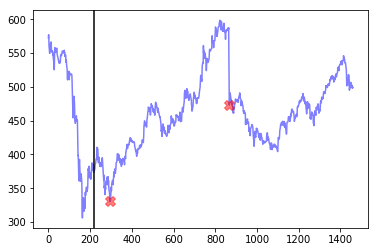




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


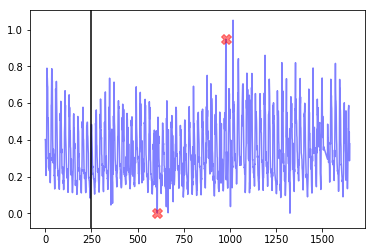




--- exchange-3_cpm_results ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1044, 1193, 1194]


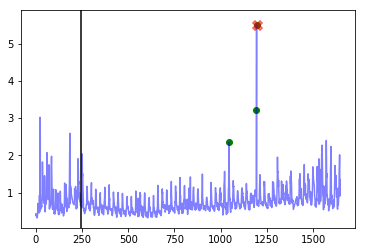




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


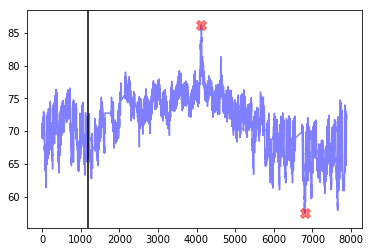




--- all_data_gift_certificates ---
Corresponding window precision:  0.2222222222222222
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  7
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2320, 4286, 4963, 4986, 4992, 5662, 6137, 6505, 6650, 7985, 8324]


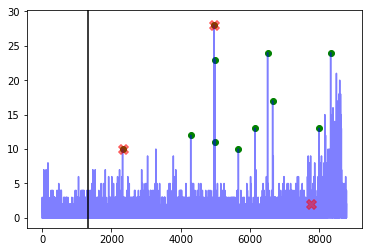




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


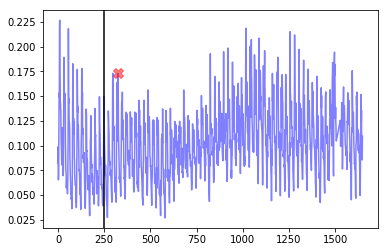




--- exchange-3_cpc_results ---
Corresponding window precision:  0.75
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [322, 323, 466, 467, 1018, 1041, 1044, 1194]


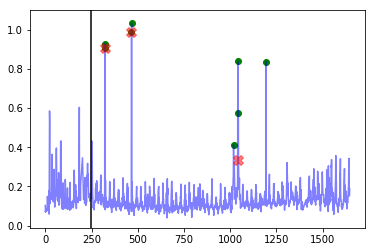




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2970]


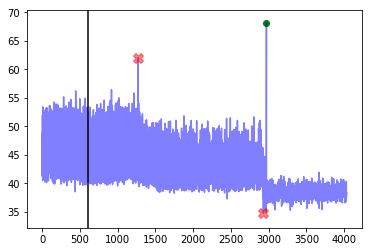




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3567, 3568, 3569, 3570, 3571, 3580, 3581, 3582, 3583, 3584, 3585, 3586, 3587, 3588, 3589, 3590, 3591, 3592, 3593, 3594, 3595, 3596, 3597, 3598, 3599, 3600, 3601, 3602, 3603, 3604, 3605, 3606, 3607, 3608, 3609, 3610, 3611]


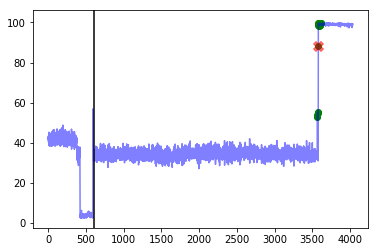




--- international-airline-passengers ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


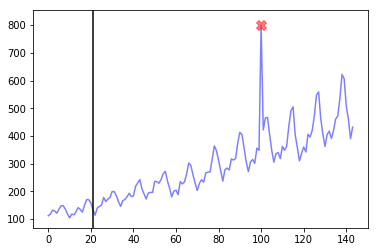

---------weight_fp=0.9, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  18.099999999999998
Best window threshold:  1.0
Corresponding window overall precision:  0.47058823529411764
Corresponding window overall recall:  0.4444444444444444
Corresponding window overall F score:  0.45714285714285713



--- ibm-common-stock-closing-prices ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


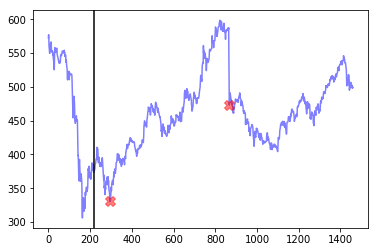




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


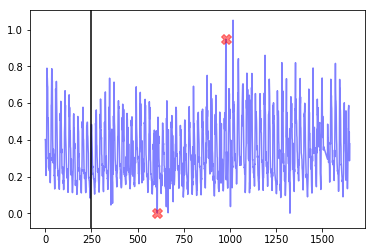




--- exchange-3_cpm_results ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1044, 1193, 1194]


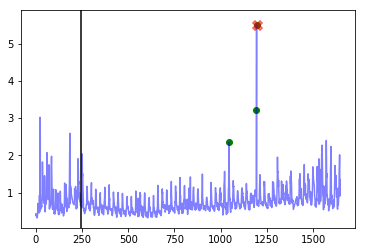




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


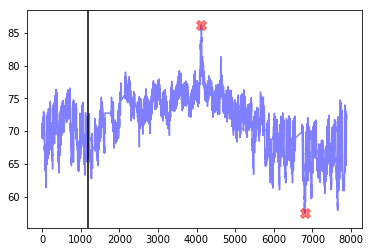




--- all_data_gift_certificates ---
Corresponding window precision:  0.2222222222222222
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  7
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2320, 4286, 4963, 4986, 4992, 5662, 6137, 6505, 6650, 7985, 8324]


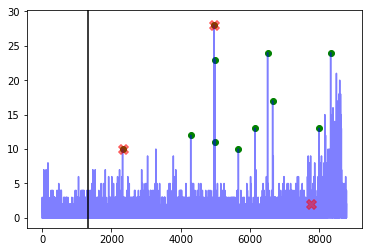




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


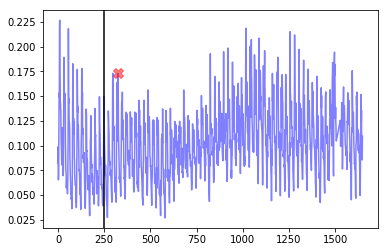




--- exchange-3_cpc_results ---
Corresponding window precision:  0.75
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [322, 323, 466, 467, 1018, 1041, 1044, 1194]


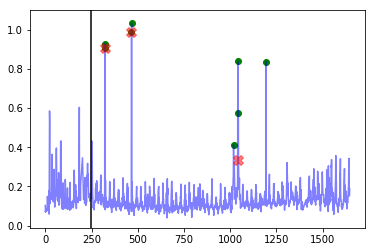




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2970]


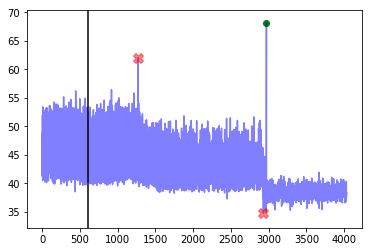




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3567, 3568, 3569, 3570, 3571, 3580, 3581, 3582, 3583, 3584, 3585, 3586, 3587, 3588, 3589, 3590, 3591, 3592, 3593, 3594, 3595, 3596, 3597, 3598, 3599, 3600, 3601, 3602, 3603, 3604, 3605, 3606, 3607, 3608, 3609, 3610, 3611]


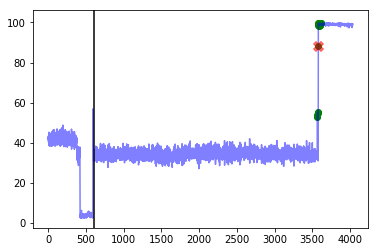




--- international-airline-passengers ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


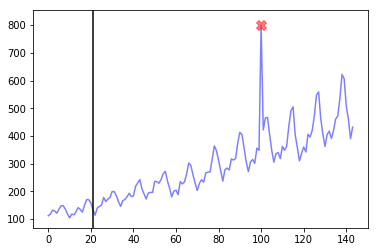

---------weight_fp=1.0, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  19.0
Best window threshold:  1.0
Corresponding window overall precision:  0.47058823529411764
Corresponding window overall recall:  0.4444444444444444
Corresponding window overall F score:  0.45714285714285713



--- ibm-common-stock-closing-prices ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


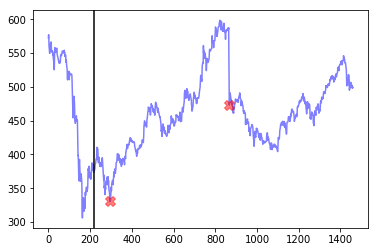




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


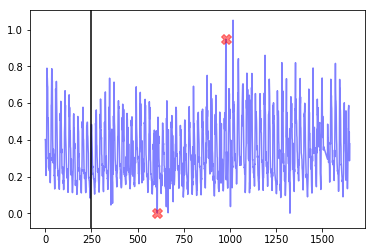




--- exchange-3_cpm_results ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1044, 1193, 1194]


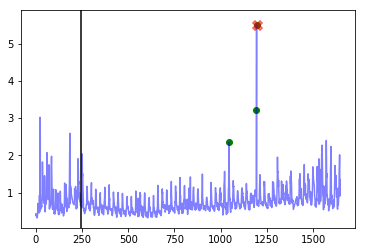




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


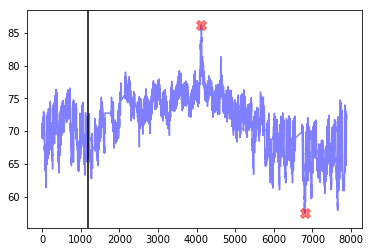




--- all_data_gift_certificates ---
Corresponding window precision:  0.2222222222222222
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  7
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2320, 4286, 4963, 4986, 4992, 5662, 6137, 6505, 6650, 7985, 8324]


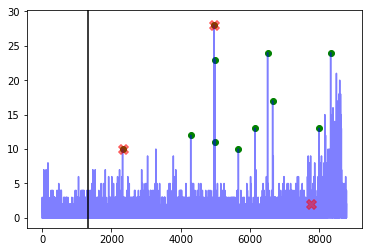




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


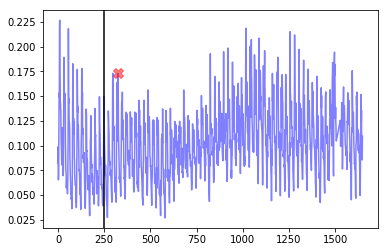




--- exchange-3_cpc_results ---
Corresponding window precision:  0.75
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [322, 323, 466, 467, 1018, 1041, 1044, 1194]


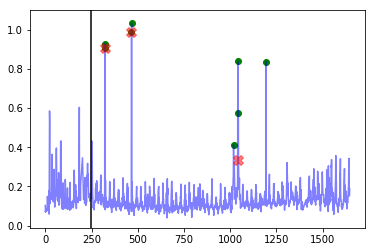




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2970]


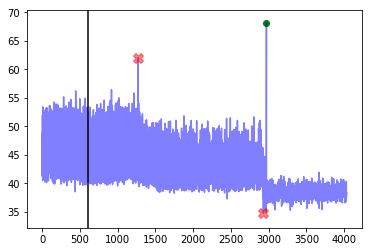




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3567, 3568, 3569, 3570, 3571, 3580, 3581, 3582, 3583, 3584, 3585, 3586, 3587, 3588, 3589, 3590, 3591, 3592, 3593, 3594, 3595, 3596, 3597, 3598, 3599, 3600, 3601, 3602, 3603, 3604, 3605, 3606, 3607, 3608, 3609, 3610, 3611]


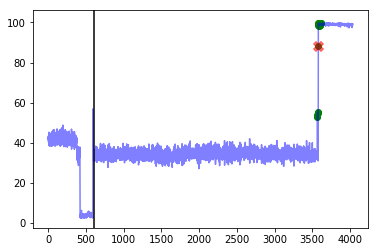




--- international-airline-passengers ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


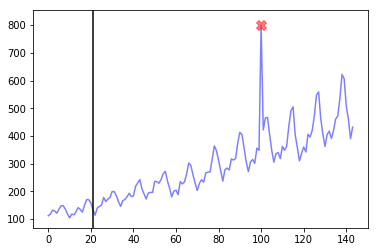

------------
False Positive Weight:  0.1
	 Minimum number of mistakes : 6.7
	 Best window threshold : 0.9999
	 Corresponding window overall precision : 0.2777777777777778
	 Corresponding window overall recall : 0.8333333333333334
	 Corresponding window overall F score : 0.4166666666666667
False Positive Weight:  0.2
	 Minimum number of mistakes : 10.399999999999999
	 Best window threshold : 0.9999
	 Corresponding window overall precision : 0.2777777777777778
	 Corresponding window overall recall : 0.8333333333333334
	 Corresponding window overall F score : 0.4166666666666667
False Positive Weight:  0.3
	 Minimum number of mistakes : 12.700000000000001
	 Best window threshold : 1.0
	 Corresponding window overall precision : 0.47058823529411764
	 Corresponding window overall recall : 0.4444444444444444
	 Corresponding window overall F score : 0.45714285714285713
False Positive Weight:  0.4
	 Minimum number of mistakes : 13.600000000000001
	 Best window threshold : 1.0
	 Corresponding win

In [34]:
end_results = {}
for weight_fp in weight_fp_list:  
    print("---------weight_fp=" + str(weight_fp) + ", weight_fn=1----------")
    weight_result = adclasses.pretty_print_results(ad_dict, anomaly_scores_dict, true_outlier_indices_dict, weight_fp=weight_fp, weight_fn=1)
    end_results[weight_fp] = weight_result

print("------------")
adclasses.pretty_print_end_results(end_results)

# HOTSAX Results

In [35]:
anomaly_scores_dict = {}

for dataset_name in dataset_name_list:
    output_dict_htm = joblib.load("anomaly_scores" + window_size + "/hotsax/" + dataset_name)
    anomaly_scores_dict[dataset_name] = output_dict_htm["Anomaly Scores"]

In [36]:
adclasses.precision_recall_curve_info(anomaly_scores_dict, true_outlier_indices_dict)

{0.1: {'precision': 0.0, 'recall': 0.0},
 0.2: {'precision': 0.0, 'recall': 0.0},
 0.3: {'precision': 0.0, 'recall': 0.0},
 0.4: {'precision': 0.0, 'recall': 0.0},
 0.5: {'precision': 0.0, 'recall': 0.0},
 0.6: {'precision': 0.0, 'recall': 0.0},
 0.7: {'precision': 0.0, 'recall': 0.0},
 0.8: {'precision': 0.0, 'recall': 0.0},
 0.9: {'precision': 0.0, 'recall': 0.0},
 1.0: {'precision': 0.0, 'recall': 0.0}}

---------weight_fp=0.1, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  13.5
Best window threshold:  0.0001
Corresponding window overall precision:  0.14285714285714285
Corresponding window overall recall:  0.3888888888888889
Corresponding window overall F score:  0.208955223880597



--- ibm-common-stock-closing-prices ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  2
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [477, 1056]


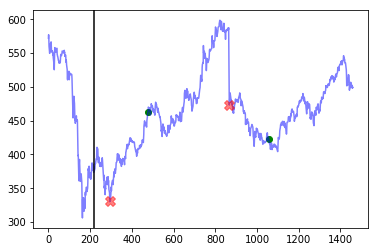




--- exchange-2_cpm_results ---
Corresponding window precision:  0.6666666666666666
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [655, 942, 1493]


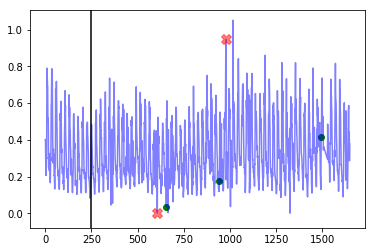




--- exchange-3_cpm_results ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1193]


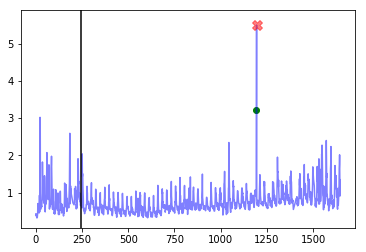




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.1
Corresponding window recall:  0.5
Corresponding window false positives:  9
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1403, 1745, 2047, 2196, 2469, 2797, 3004, 3077, 3363, 3557, 3807, 4315, 6693, 7783]


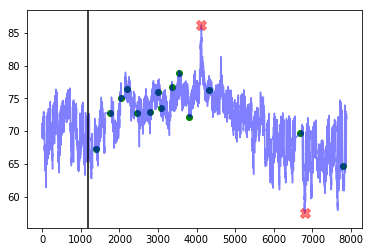




--- all_data_gift_certificates ---
Corresponding window precision:  0.09090909090909091
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  10
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1576, 1636, 1845, 2609, 3046, 3954, 4157, 4236, 4651, 4870, 5414, 5493, 5749, 6255]


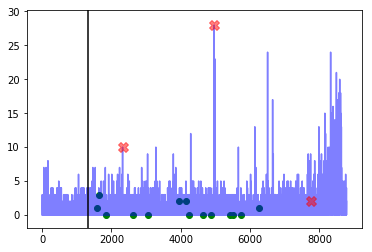




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  3
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [612, 863, 1475]


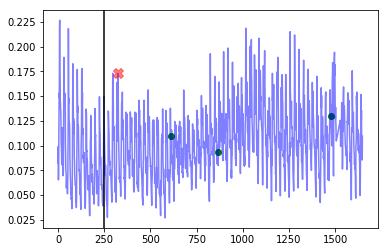




--- exchange-3_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  2
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [966, 1487]


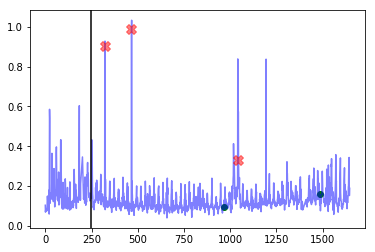




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.2857142857142857
Corresponding window recall:  1.0
Corresponding window false positives:  5
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1241, 1435, 1905, 2902, 2956, 3045, 3613, 3733]


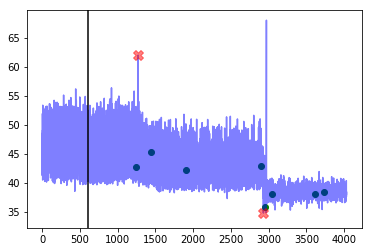




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.25
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1467, 3145, 3606, 3739, 3819, 3871, 3972]


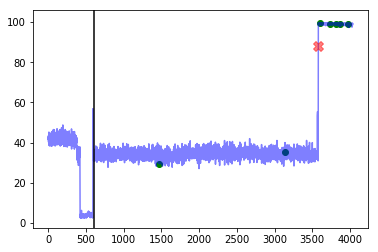




--- international-airline-passengers ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


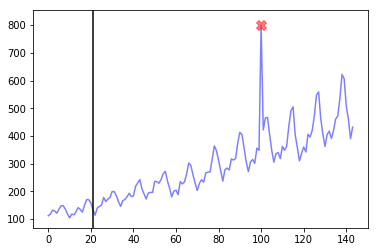

---------weight_fp=0.2, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  17.0
Best window threshold:  0.0001
Corresponding window overall precision:  0.14285714285714285
Corresponding window overall recall:  0.3888888888888889
Corresponding window overall F score:  0.208955223880597



--- ibm-common-stock-closing-prices ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  2
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [477, 1056]


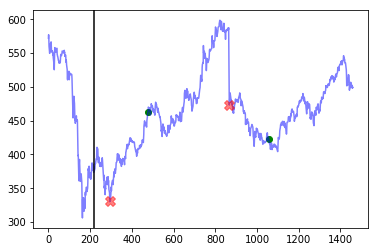




--- exchange-2_cpm_results ---
Corresponding window precision:  0.6666666666666666
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [655, 942, 1493]


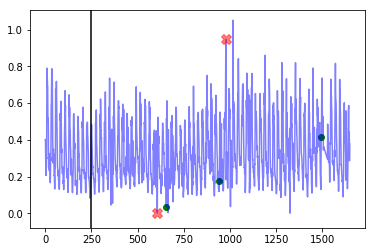




--- exchange-3_cpm_results ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1193]


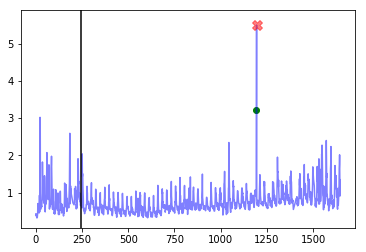




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.1
Corresponding window recall:  0.5
Corresponding window false positives:  9
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1403, 1745, 2047, 2196, 2469, 2797, 3004, 3077, 3363, 3557, 3807, 4315, 6693, 7783]


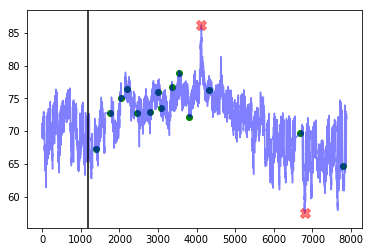




--- all_data_gift_certificates ---
Corresponding window precision:  0.09090909090909091
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  10
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1576, 1636, 1845, 2609, 3046, 3954, 4157, 4236, 4651, 4870, 5414, 5493, 5749, 6255]


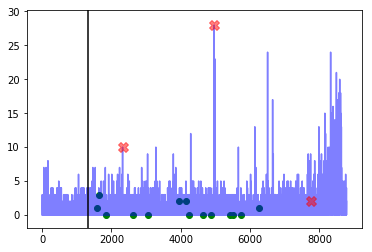




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  3
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [612, 863, 1475]


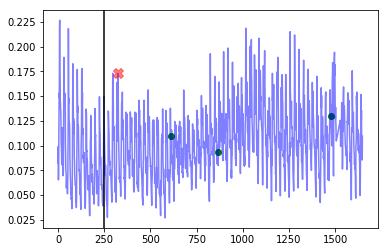




--- exchange-3_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  2
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [966, 1487]


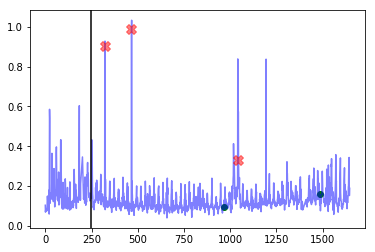




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.2857142857142857
Corresponding window recall:  1.0
Corresponding window false positives:  5
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1241, 1435, 1905, 2902, 2956, 3045, 3613, 3733]


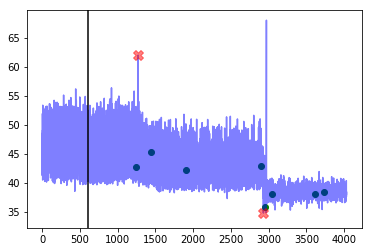




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.25
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1467, 3145, 3606, 3739, 3819, 3871, 3972]


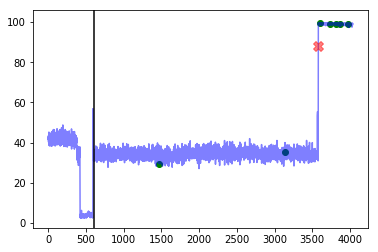




--- international-airline-passengers ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


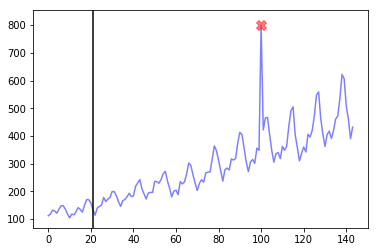

---------weight_fp=0.3, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  20.5
Best window threshold:  0.0001
Corresponding window overall precision:  0.14285714285714285
Corresponding window overall recall:  0.3888888888888889
Corresponding window overall F score:  0.208955223880597



--- ibm-common-stock-closing-prices ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  2
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [477, 1056]


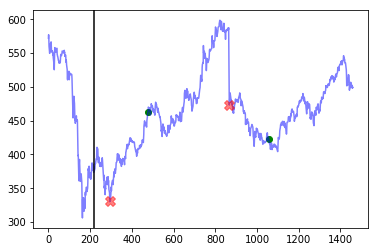




--- exchange-2_cpm_results ---
Corresponding window precision:  0.6666666666666666
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [655, 942, 1493]


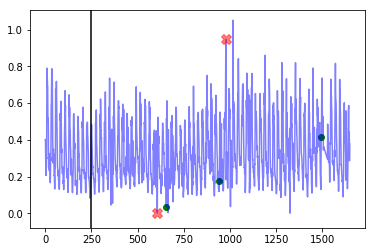




--- exchange-3_cpm_results ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1193]


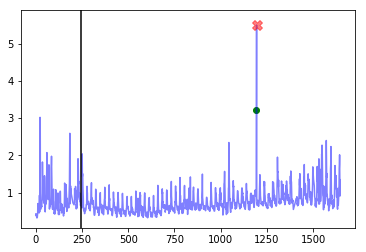




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.1
Corresponding window recall:  0.5
Corresponding window false positives:  9
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1403, 1745, 2047, 2196, 2469, 2797, 3004, 3077, 3363, 3557, 3807, 4315, 6693, 7783]


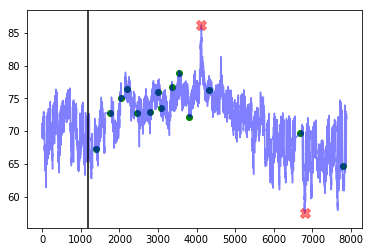




--- all_data_gift_certificates ---
Corresponding window precision:  0.09090909090909091
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  10
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1576, 1636, 1845, 2609, 3046, 3954, 4157, 4236, 4651, 4870, 5414, 5493, 5749, 6255]


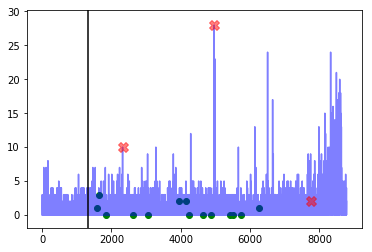




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  3
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [612, 863, 1475]


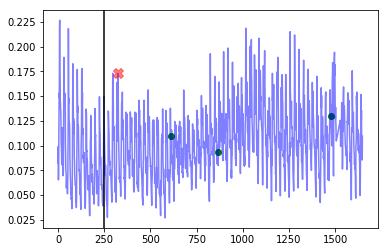




--- exchange-3_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  2
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [966, 1487]


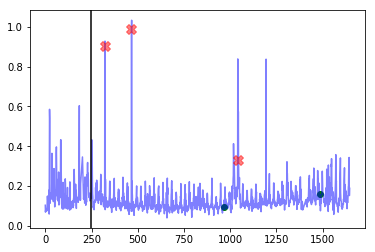




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.2857142857142857
Corresponding window recall:  1.0
Corresponding window false positives:  5
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1241, 1435, 1905, 2902, 2956, 3045, 3613, 3733]


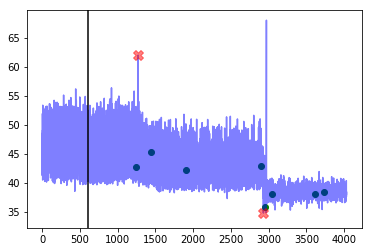




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.25
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1467, 3145, 3606, 3739, 3819, 3871, 3972]


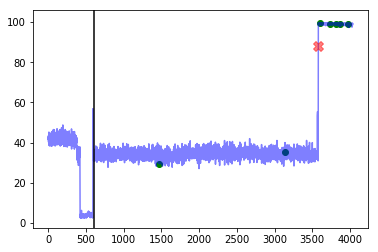




--- international-airline-passengers ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


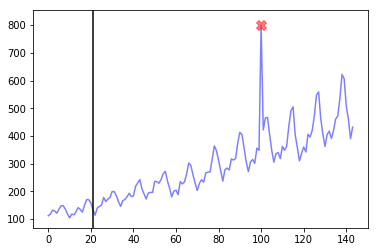

---------weight_fp=0.4, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  24.0
Best window threshold:  0.0001
Corresponding window overall precision:  0.14285714285714285
Corresponding window overall recall:  0.3888888888888889
Corresponding window overall F score:  0.208955223880597



--- ibm-common-stock-closing-prices ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  2
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [477, 1056]


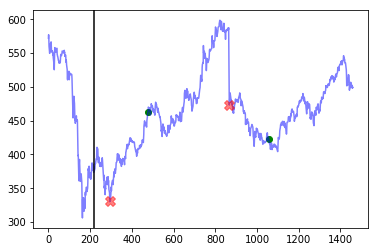




--- exchange-2_cpm_results ---
Corresponding window precision:  0.6666666666666666
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [655, 942, 1493]


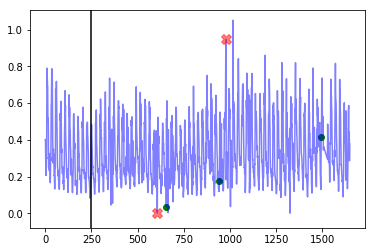




--- exchange-3_cpm_results ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1193]


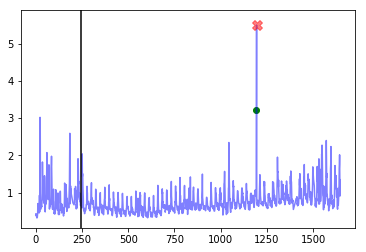




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.1
Corresponding window recall:  0.5
Corresponding window false positives:  9
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1403, 1745, 2047, 2196, 2469, 2797, 3004, 3077, 3363, 3557, 3807, 4315, 6693, 7783]


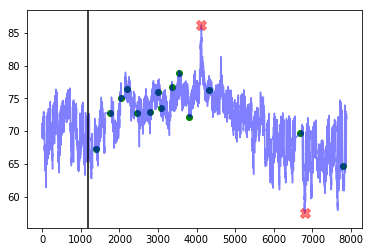




--- all_data_gift_certificates ---
Corresponding window precision:  0.09090909090909091
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  10
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1576, 1636, 1845, 2609, 3046, 3954, 4157, 4236, 4651, 4870, 5414, 5493, 5749, 6255]


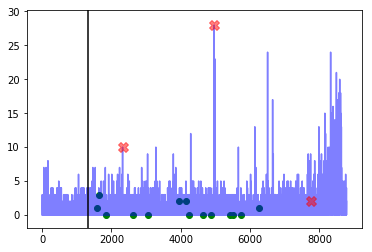




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  3
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [612, 863, 1475]


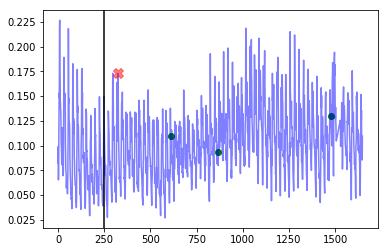




--- exchange-3_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  2
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [966, 1487]


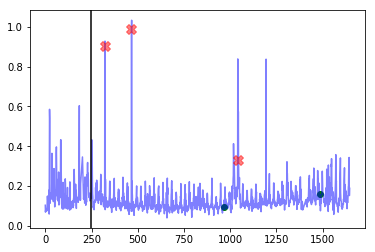




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.2857142857142857
Corresponding window recall:  1.0
Corresponding window false positives:  5
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1241, 1435, 1905, 2902, 2956, 3045, 3613, 3733]


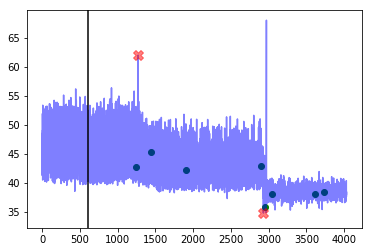




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.25
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1467, 3145, 3606, 3739, 3819, 3871, 3972]


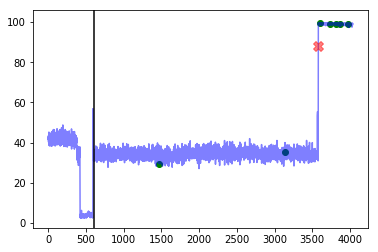




--- international-airline-passengers ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


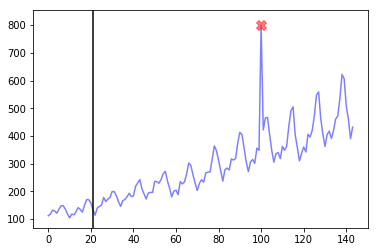

---------weight_fp=0.5, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  27.5
Best window threshold:  0.0001
Corresponding window overall precision:  0.14285714285714285
Corresponding window overall recall:  0.3888888888888889
Corresponding window overall F score:  0.208955223880597



--- ibm-common-stock-closing-prices ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  2
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [477, 1056]


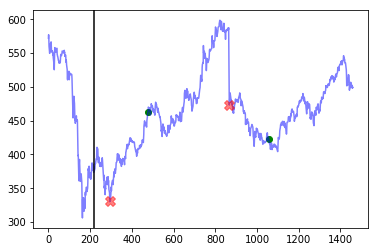




--- exchange-2_cpm_results ---
Corresponding window precision:  0.6666666666666666
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [655, 942, 1493]


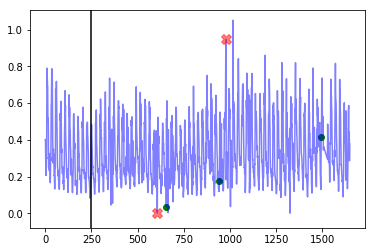




--- exchange-3_cpm_results ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1193]


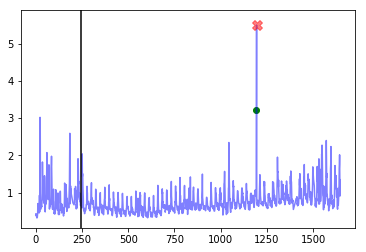




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.1
Corresponding window recall:  0.5
Corresponding window false positives:  9
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1403, 1745, 2047, 2196, 2469, 2797, 3004, 3077, 3363, 3557, 3807, 4315, 6693, 7783]


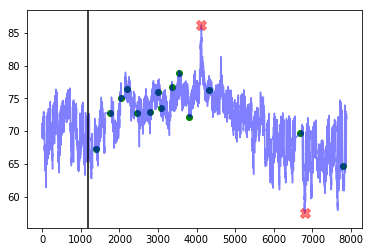




--- all_data_gift_certificates ---
Corresponding window precision:  0.09090909090909091
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  10
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1576, 1636, 1845, 2609, 3046, 3954, 4157, 4236, 4651, 4870, 5414, 5493, 5749, 6255]


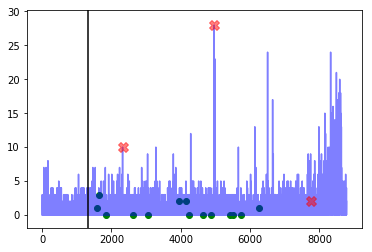




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  3
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [612, 863, 1475]


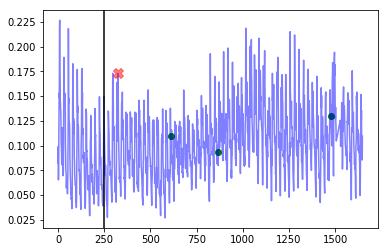




--- exchange-3_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  2
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [966, 1487]


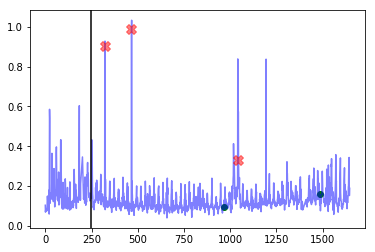




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.2857142857142857
Corresponding window recall:  1.0
Corresponding window false positives:  5
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1241, 1435, 1905, 2902, 2956, 3045, 3613, 3733]


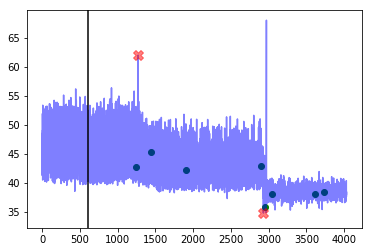




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.25
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1467, 3145, 3606, 3739, 3819, 3871, 3972]


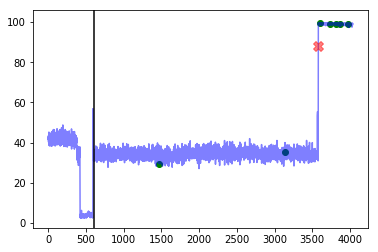




--- international-airline-passengers ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


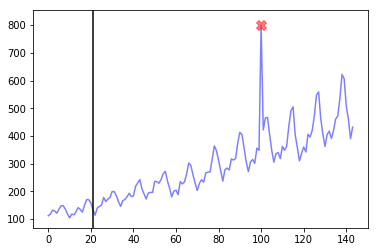

---------weight_fp=0.6, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  31.0
Best window threshold:  0.0001
Corresponding window overall precision:  0.14285714285714285
Corresponding window overall recall:  0.3888888888888889
Corresponding window overall F score:  0.208955223880597



--- ibm-common-stock-closing-prices ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  2
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [477, 1056]


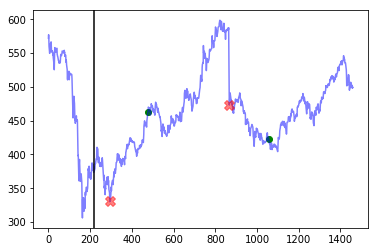




--- exchange-2_cpm_results ---
Corresponding window precision:  0.6666666666666666
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [655, 942, 1493]


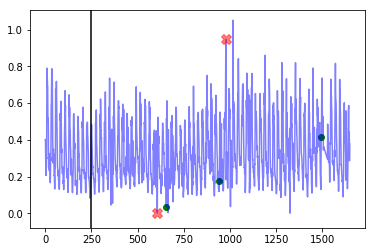




--- exchange-3_cpm_results ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1193]


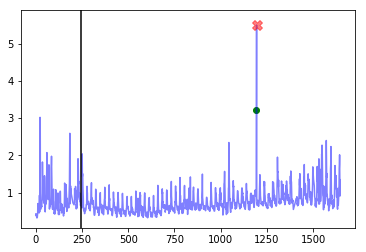




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.1
Corresponding window recall:  0.5
Corresponding window false positives:  9
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1403, 1745, 2047, 2196, 2469, 2797, 3004, 3077, 3363, 3557, 3807, 4315, 6693, 7783]


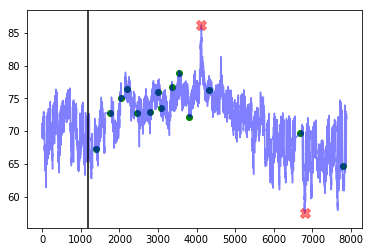




--- all_data_gift_certificates ---
Corresponding window precision:  0.09090909090909091
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  10
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1576, 1636, 1845, 2609, 3046, 3954, 4157, 4236, 4651, 4870, 5414, 5493, 5749, 6255]


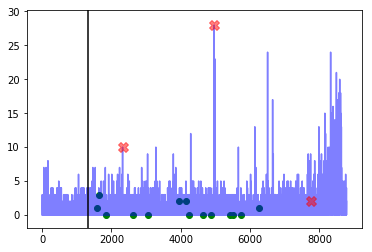




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  3
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [612, 863, 1475]


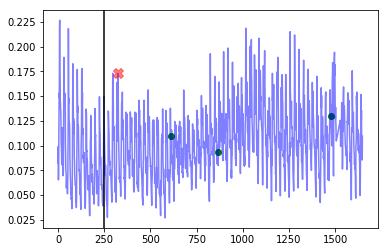




--- exchange-3_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  2
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [966, 1487]


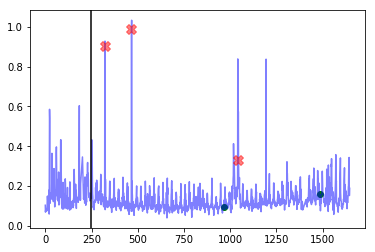




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.2857142857142857
Corresponding window recall:  1.0
Corresponding window false positives:  5
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1241, 1435, 1905, 2902, 2956, 3045, 3613, 3733]


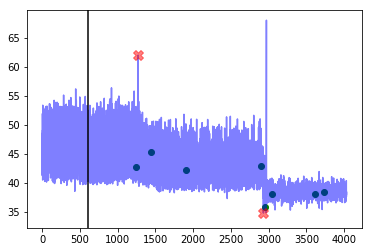




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.25
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1467, 3145, 3606, 3739, 3819, 3871, 3972]


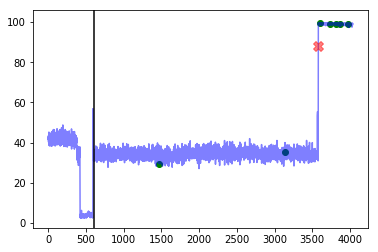




--- international-airline-passengers ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


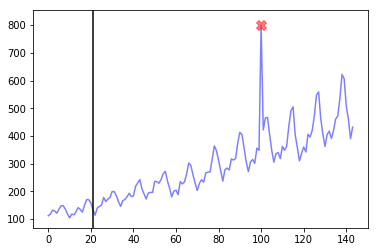

---------weight_fp=0.7, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  34.5
Best window threshold:  0.0001
Corresponding window overall precision:  0.14285714285714285
Corresponding window overall recall:  0.3888888888888889
Corresponding window overall F score:  0.208955223880597



--- ibm-common-stock-closing-prices ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  2
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [477, 1056]


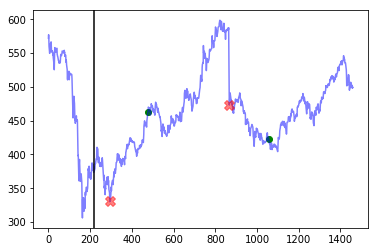




--- exchange-2_cpm_results ---
Corresponding window precision:  0.6666666666666666
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [655, 942, 1493]


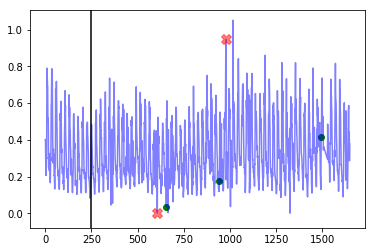




--- exchange-3_cpm_results ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1193]


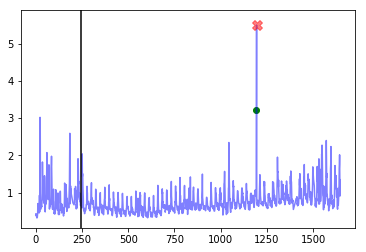




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.1
Corresponding window recall:  0.5
Corresponding window false positives:  9
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1403, 1745, 2047, 2196, 2469, 2797, 3004, 3077, 3363, 3557, 3807, 4315, 6693, 7783]


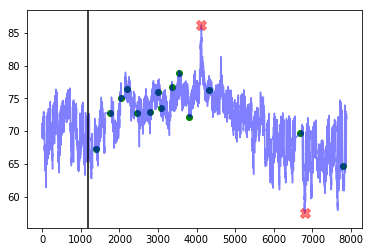




--- all_data_gift_certificates ---
Corresponding window precision:  0.09090909090909091
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  10
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1576, 1636, 1845, 2609, 3046, 3954, 4157, 4236, 4651, 4870, 5414, 5493, 5749, 6255]


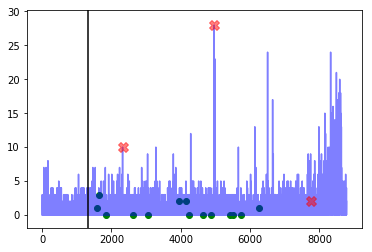




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  3
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [612, 863, 1475]


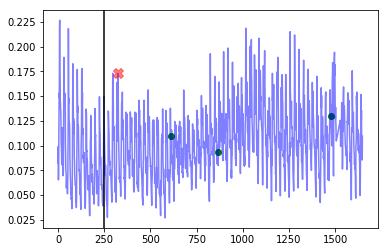




--- exchange-3_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  2
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [966, 1487]


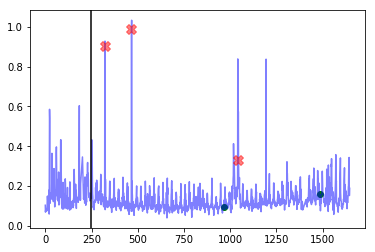




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.2857142857142857
Corresponding window recall:  1.0
Corresponding window false positives:  5
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1241, 1435, 1905, 2902, 2956, 3045, 3613, 3733]


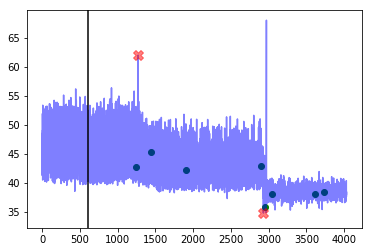




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.25
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1467, 3145, 3606, 3739, 3819, 3871, 3972]


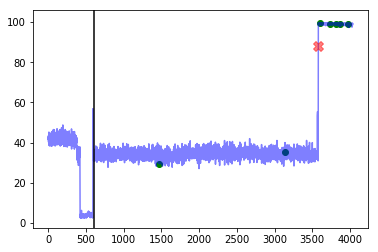




--- international-airline-passengers ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


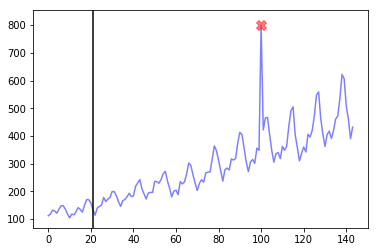

---------weight_fp=0.8, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  38.0
Best window threshold:  0.0001
Corresponding window overall precision:  0.14285714285714285
Corresponding window overall recall:  0.3888888888888889
Corresponding window overall F score:  0.208955223880597



--- ibm-common-stock-closing-prices ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  2
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [477, 1056]


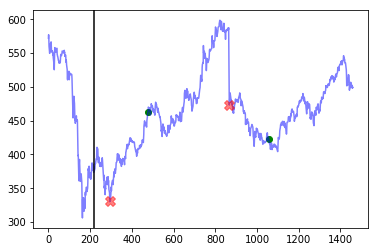




--- exchange-2_cpm_results ---
Corresponding window precision:  0.6666666666666666
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [655, 942, 1493]


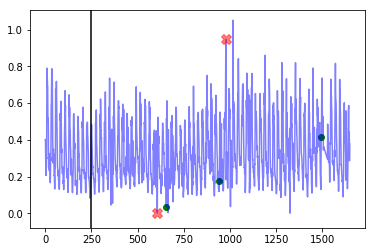




--- exchange-3_cpm_results ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1193]


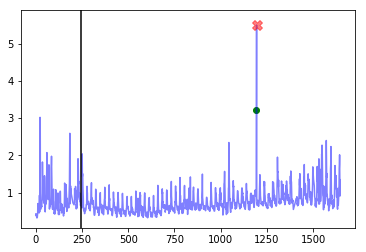




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.1
Corresponding window recall:  0.5
Corresponding window false positives:  9
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1403, 1745, 2047, 2196, 2469, 2797, 3004, 3077, 3363, 3557, 3807, 4315, 6693, 7783]


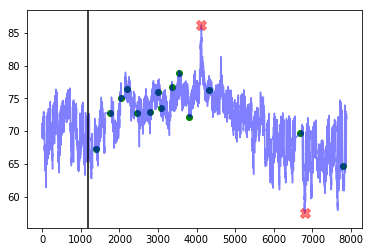




--- all_data_gift_certificates ---
Corresponding window precision:  0.09090909090909091
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  10
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1576, 1636, 1845, 2609, 3046, 3954, 4157, 4236, 4651, 4870, 5414, 5493, 5749, 6255]


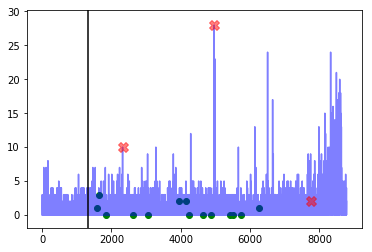




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  3
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [612, 863, 1475]


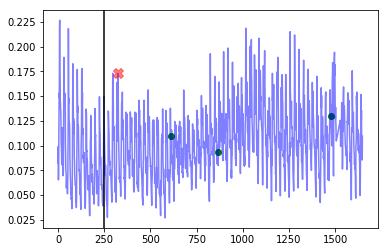




--- exchange-3_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  2
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [966, 1487]


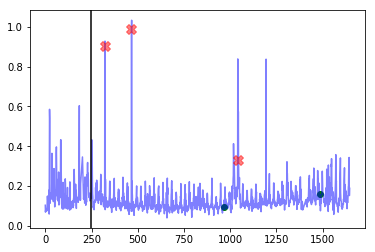




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.2857142857142857
Corresponding window recall:  1.0
Corresponding window false positives:  5
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1241, 1435, 1905, 2902, 2956, 3045, 3613, 3733]


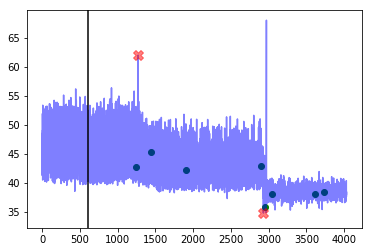




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.25
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1467, 3145, 3606, 3739, 3819, 3871, 3972]


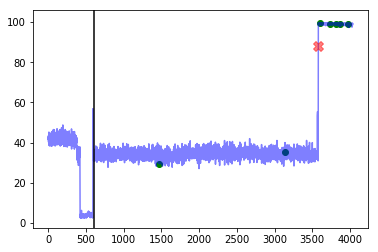




--- international-airline-passengers ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


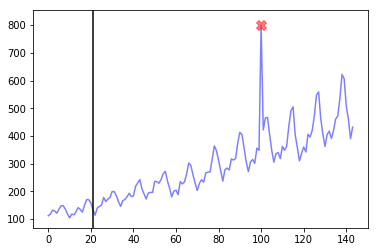

---------weight_fp=0.9, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  41.5
Best window threshold:  0.0001
Corresponding window overall precision:  0.14285714285714285
Corresponding window overall recall:  0.3888888888888889
Corresponding window overall F score:  0.208955223880597



--- ibm-common-stock-closing-prices ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  2
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [477, 1056]


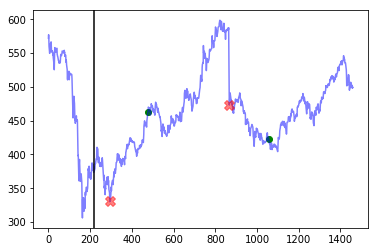




--- exchange-2_cpm_results ---
Corresponding window precision:  0.6666666666666666
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [655, 942, 1493]


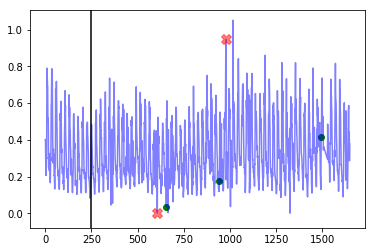




--- exchange-3_cpm_results ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1193]


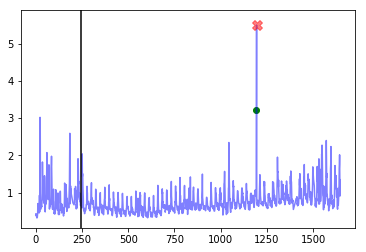




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.1
Corresponding window recall:  0.5
Corresponding window false positives:  9
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1403, 1745, 2047, 2196, 2469, 2797, 3004, 3077, 3363, 3557, 3807, 4315, 6693, 7783]


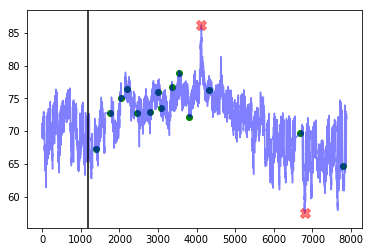




--- all_data_gift_certificates ---
Corresponding window precision:  0.09090909090909091
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  10
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1576, 1636, 1845, 2609, 3046, 3954, 4157, 4236, 4651, 4870, 5414, 5493, 5749, 6255]


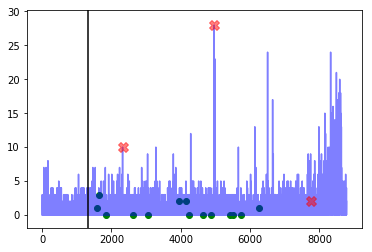




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  3
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [612, 863, 1475]


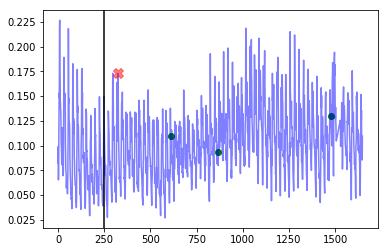




--- exchange-3_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  2
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [966, 1487]


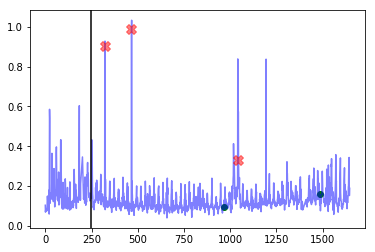




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.2857142857142857
Corresponding window recall:  1.0
Corresponding window false positives:  5
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1241, 1435, 1905, 2902, 2956, 3045, 3613, 3733]


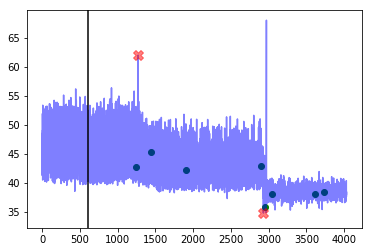




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.25
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1467, 3145, 3606, 3739, 3819, 3871, 3972]


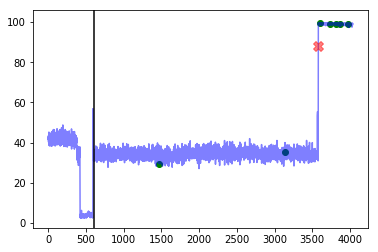




--- international-airline-passengers ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


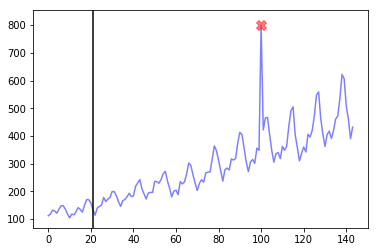

---------weight_fp=1.0, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  45.0
Best window threshold:  0.0001
Corresponding window overall precision:  0.14285714285714285
Corresponding window overall recall:  0.3888888888888889
Corresponding window overall F score:  0.208955223880597



--- ibm-common-stock-closing-prices ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  2
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [477, 1056]


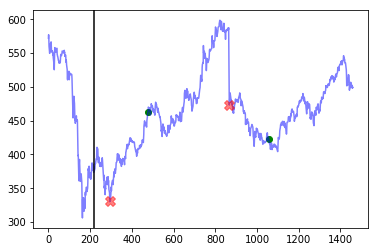




--- exchange-2_cpm_results ---
Corresponding window precision:  0.6666666666666666
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [655, 942, 1493]


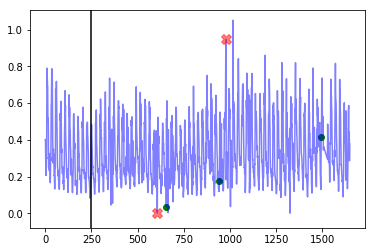




--- exchange-3_cpm_results ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1193]


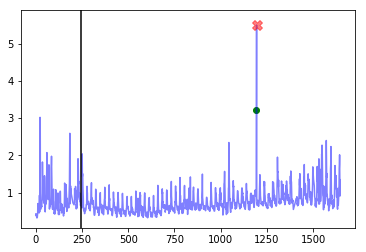




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.1
Corresponding window recall:  0.5
Corresponding window false positives:  9
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1403, 1745, 2047, 2196, 2469, 2797, 3004, 3077, 3363, 3557, 3807, 4315, 6693, 7783]


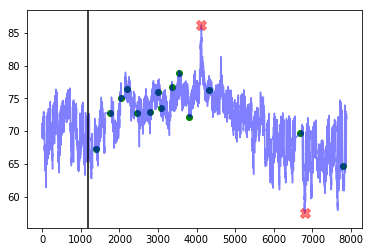




--- all_data_gift_certificates ---
Corresponding window precision:  0.09090909090909091
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  10
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1576, 1636, 1845, 2609, 3046, 3954, 4157, 4236, 4651, 4870, 5414, 5493, 5749, 6255]


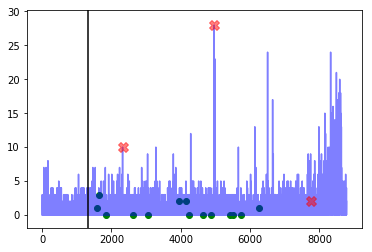




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  3
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [612, 863, 1475]


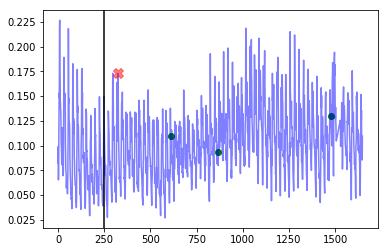




--- exchange-3_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  2
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [966, 1487]


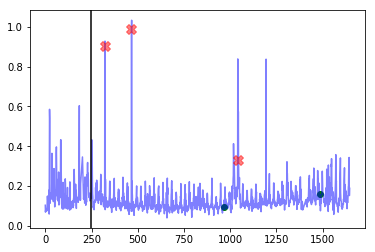




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.2857142857142857
Corresponding window recall:  1.0
Corresponding window false positives:  5
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1241, 1435, 1905, 2902, 2956, 3045, 3613, 3733]


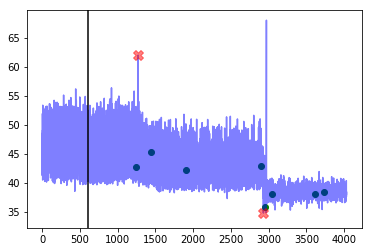




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.25
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1467, 3145, 3606, 3739, 3819, 3871, 3972]


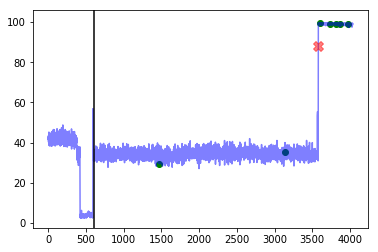




--- international-airline-passengers ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


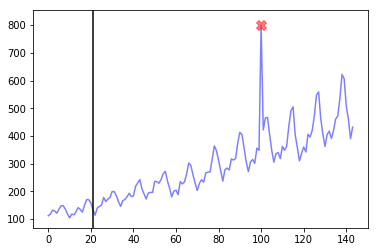

------------
False Positive Weight:  0.1
	 Minimum number of mistakes : 13.5
	 Best window threshold : 0.0001
	 Corresponding window overall precision : 0.14285714285714285
	 Corresponding window overall recall : 0.3888888888888889
	 Corresponding window overall F score : 0.208955223880597
False Positive Weight:  0.2
	 Minimum number of mistakes : 17.0
	 Best window threshold : 0.0001
	 Corresponding window overall precision : 0.14285714285714285
	 Corresponding window overall recall : 0.3888888888888889
	 Corresponding window overall F score : 0.208955223880597
False Positive Weight:  0.3
	 Minimum number of mistakes : 20.5
	 Best window threshold : 0.0001
	 Corresponding window overall precision : 0.14285714285714285
	 Corresponding window overall recall : 0.3888888888888889
	 Corresponding window overall F score : 0.208955223880597
False Positive Weight:  0.4
	 Minimum number of mistakes : 24.0
	 Best window threshold : 0.0001
	 Corresponding window overall precision : 0.14285714285

In [37]:
end_results = {}
for weight_fp in weight_fp_list:  
    print("---------weight_fp=" + str(weight_fp) + ", weight_fn=1----------")
    weight_result = adclasses.pretty_print_results(ad_dict, anomaly_scores_dict, true_outlier_indices_dict, weight_fp=weight_fp, weight_fn=1)
    end_results[weight_fp] = weight_result

print("------------")
adclasses.pretty_print_end_results(end_results)

# Anomalous

In [38]:
anomalous_dataset_name_list = ["exchange-2_cpm_results",
                         "exchange-3_cpm_results",
                         "ambient_temperature_system_failure",
                         "all_data_gift_certificates",
                         "exchange-2_cpc_results",
                         "exchange-3_cpc_results",
                         "international-airline-passengers"]

anomalous_ad_dict = {}
for dataset_name in anomalous_dataset_name_list:
    anomalous_ad_dict[dataset_name] = ad_dict[dataset_name]
    
anomalous_true_outlier_indices_dict = {}
for dataset_name in anomalous_dataset_name_list:
    anomalous_true_outlier_indices_dict[dataset_name] = true_outlier_indices_dict[dataset_name]

In [39]:
anomaly_scores_dict = {}

for dataset_name in anomalous_dataset_name_list:
    output_dict_anomalous = joblib.load("anomaly_scores" + window_size + "/anomalous/" + dataset_name)
    anomaly_scores_dict[dataset_name] = output_dict_anomalous["Anomaly Scores"]

In [40]:
adclasses.precision_recall_curve_info(anomaly_scores_dict, anomalous_true_outlier_indices_dict)


{0.1: {'precision': 0.0, 'recall': 0.0},
 0.2: {'precision': 0.0, 'recall': 0.0},
 0.3: {'precision': 0.0, 'recall': 0.0},
 0.4: {'precision': 0.0, 'recall': 0.0},
 0.5: {'precision': 0.0, 'recall': 0.0},
 0.6: {'precision': 0.0, 'recall': 0.0},
 0.7: {'precision': 0.0, 'recall': 0.0},
 0.8: {'precision': 0.0, 'recall': 0.0},
 0.9: {'precision': 0.0, 'recall': 0.0},
 1.0: {'precision': 0.0, 'recall': 0.0}}

---------weight_fp=0.1, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  10.200000000000001
Best window threshold:  0.0
Corresponding window overall precision:  0.1111111111111111
Corresponding window overall recall:  1.0
Corresponding window overall F score:  0.19999999999999998



--- exchange-2_cpm_results ---
Corresponding window precision:  0.1111111111111111
Corresponding window recall:  1.0
Corresponding window false positives:  16
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [247, 248, 249, 250, 251, 252, 253, 254, 255, 256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 300, 301, 302, 303, 304, 305, 306, 307, 308, 309, 310, 311, 312, 313, 314, 315, 316, 317, 318, 319, 320, 321, 322, 323, 324, 325, 326, 327, 328, 329, 330, 331

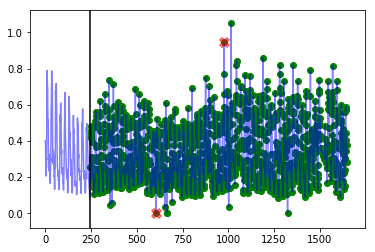




--- exchange-3_cpm_results ---
Corresponding window precision:  0.1111111111111111
Corresponding window recall:  1.0
Corresponding window false positives:  8
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [247, 248, 249, 250, 251, 252, 253, 254, 255, 256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 300, 301, 302, 303, 304, 305, 306, 307, 308, 309, 310, 311, 312, 313, 314, 315, 316, 317, 318, 319, 320, 321, 322, 323, 324, 325, 326, 327, 328, 329, 330, 331, 332, 333, 334, 335, 336, 337, 338, 339, 340, 341, 342, 343, 344, 345, 346, 347, 348, 349, 350, 351, 352, 353, 354, 355, 356, 357, 358, 359, 360, 361, 362, 363, 364, 365, 366, 367, 368, 369, 370, 371, 372, 373, 374, 375, 376, 377, 378, 379, 380, 381, 382, 383, 384, 385, 386, 387, 388, 389, 390, 391, 392, 393, 394

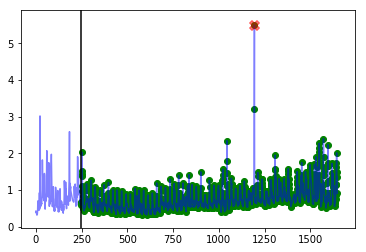




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.1111111111111111
Corresponding window recall:  1.0
Corresponding window false positives:  16
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1183, 1184, 1185, 1186, 1187, 1188, 1189, 1190, 1191, 1192, 1193, 1194, 1195, 1196, 1197, 1198, 1199, 1200, 1201, 1202, 1203, 1204, 1205, 1206, 1207, 1208, 1209, 1210, 1211, 1212, 1213, 1214, 1215, 1216, 1217, 1218, 1219, 1220, 1221, 1222, 1223, 1224, 1225, 1226, 1227, 1228, 1229, 1230, 1231, 1232, 1233, 1234, 1235, 1236, 1237, 1238, 1239, 1240, 1241, 1242, 1243, 1244, 1245, 1246, 1247, 1248, 1249, 1250, 1251, 1252, 1253, 1254, 1255, 1256, 1257, 1258, 1259, 1260, 1261, 1262, 1263, 1264, 1265, 1266, 1267, 1268, 1269, 1270, 1271, 1272, 1273, 1274, 1275, 1276, 1277, 1278, 1279, 1280, 1281, 1282, 1283, 1284, 1285, 1286, 1287, 1288, 1289, 1290, 1291, 1292, 1293, 1294, 1295, 1296, 1297, 1298, 1299, 1300, 1301, 1302, 1303,

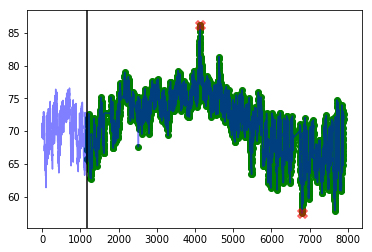




--- all_data_gift_certificates ---
Corresponding window precision:  0.11538461538461539
Corresponding window recall:  1.0
Corresponding window false positives:  23
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1317, 1318, 1319, 1320, 1321, 1322, 1323, 1324, 1325, 1326, 1327, 1328, 1329, 1330, 1331, 1332, 1333, 1334, 1335, 1336, 1337, 1338, 1339, 1340, 1341, 1342, 1343, 1344, 1345, 1346, 1347, 1348, 1349, 1350, 1351, 1352, 1353, 1354, 1355, 1356, 1357, 1358, 1359, 1360, 1361, 1362, 1363, 1364, 1365, 1366, 1367, 1368, 1369, 1370, 1371, 1372, 1373, 1374, 1375, 1376, 1377, 1378, 1379, 1380, 1381, 1382, 1383, 1384, 1385, 1386, 1387, 1388, 1389, 1390, 1391, 1392, 1393, 1394, 1395, 1396, 1397, 1398, 1399, 1400, 1401, 1402, 1403, 1404, 1405, 1406, 1407, 1408, 1409, 1410, 1411, 1412, 1413, 1414, 1415, 1416, 1417, 1418, 1419, 1420, 1421, 1422, 1423, 1424, 1425, 1426, 1427, 1428, 1429, 1430, 1431, 1432, 1433, 1434, 1435, 1436, 1437, 1438, 

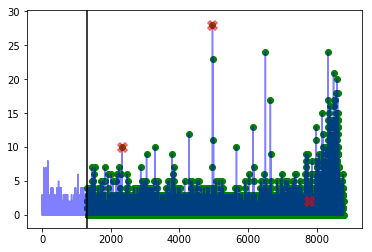




--- exchange-2_cpc_results ---
Corresponding window precision:  0.1111111111111111
Corresponding window recall:  1.0
Corresponding window false positives:  8
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [247, 248, 249, 250, 251, 252, 253, 254, 255, 256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 300, 301, 302, 303, 304, 305, 306, 307, 308, 309, 310, 311, 312, 313, 314, 315, 316, 317, 318, 319, 320, 321, 322, 323, 324, 325, 326, 327, 328, 329, 330, 331, 332, 333, 334, 335, 336, 337, 338, 339, 340, 341, 342, 343, 344, 345, 346, 347, 348, 349, 350, 351, 352, 353, 354, 355, 356, 357, 358, 359, 360, 361, 362, 363, 364, 365, 366, 367, 368, 369, 370, 371, 372, 373, 374, 375, 376, 377, 378, 379, 380, 381, 382, 383, 384, 385, 386, 387, 388, 389, 390, 391, 392, 393, 394

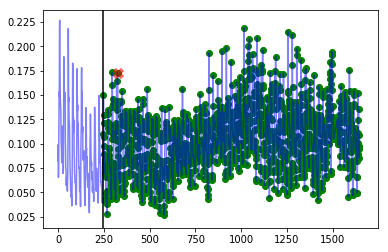




--- exchange-3_cpc_results ---
Corresponding window precision:  0.11538461538461539
Corresponding window recall:  1.0
Corresponding window false positives:  23
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [247, 248, 249, 250, 251, 252, 253, 254, 255, 256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 300, 301, 302, 303, 304, 305, 306, 307, 308, 309, 310, 311, 312, 313, 314, 315, 316, 317, 318, 319, 320, 321, 322, 323, 324, 325, 326, 327, 328, 329, 330, 331, 332, 333, 334, 335, 336, 337, 338, 339, 340, 341, 342, 343, 344, 345, 346, 347, 348, 349, 350, 351, 352, 353, 354, 355, 356, 357, 358, 359, 360, 361, 362, 363, 364, 365, 366, 367, 368, 369, 370, 371, 372, 373, 374, 375, 376, 377, 378, 379, 380, 381, 382, 383, 384, 385, 386, 387, 388, 389, 390, 391, 392, 393, 3

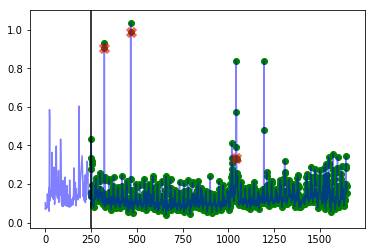




--- international-airline-passengers ---
Corresponding window precision:  0.1111111111111111
Corresponding window recall:  1.0
Corresponding window false positives:  8
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143]


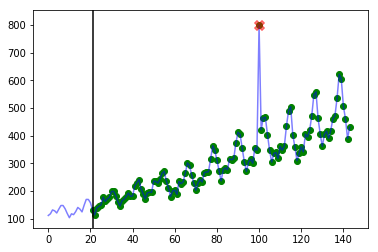

---------weight_fp=0.2, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  13.2
Best window threshold:  0.0001
Corresponding window overall precision:  0.2
Corresponding window overall recall:  0.23076923076923078
Corresponding window overall F score:  0.21428571428571427



--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1425, 1448, 1449]


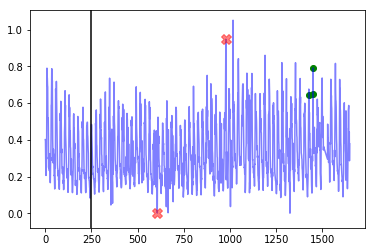




--- exchange-3_cpm_results ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1095, 1098, 1195]


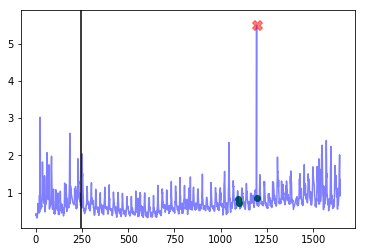




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  4
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1616, 1627, 1628, 1691, 1692, 1693, 1694, 1697, 1698, 2054, 2420, 6549, 6552, 6651, 6654]


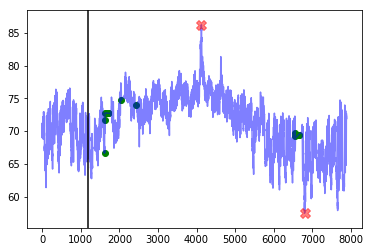




--- all_data_gift_certificates ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  3
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [4987, 6165, 8520, 8521, 8522, 8605, 8606, 8607, 8608, 8611, 8613, 8614, 8616, 8617, 8618, 8634, 8635]


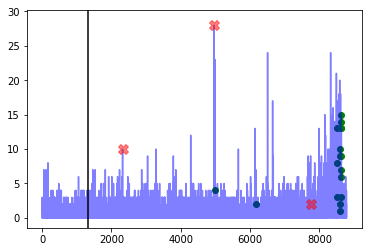




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1493, 1494, 1497]


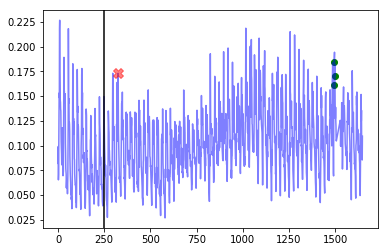




--- exchange-3_cpc_results ---
Corresponding window precision:  0.5
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1042, 1095]


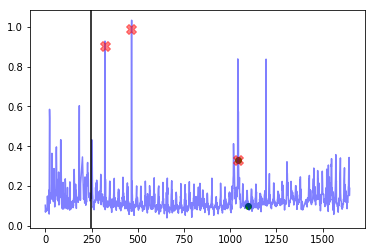




--- international-airline-passengers ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


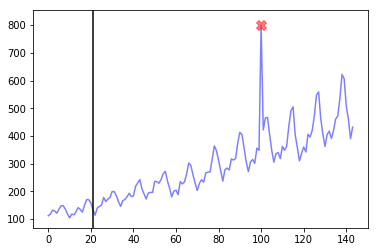

---------weight_fp=0.3, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  14.3
Best window threshold:  0.0001
Corresponding window overall precision:  0.2
Corresponding window overall recall:  0.23076923076923078
Corresponding window overall F score:  0.21428571428571427



--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1425, 1448, 1449]


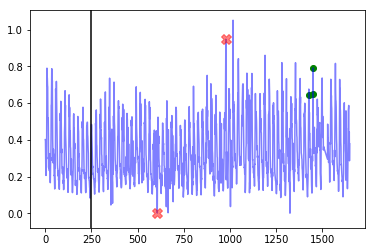




--- exchange-3_cpm_results ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1095, 1098, 1195]


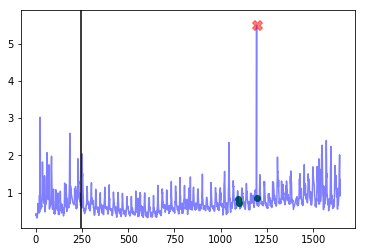




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  4
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1616, 1627, 1628, 1691, 1692, 1693, 1694, 1697, 1698, 2054, 2420, 6549, 6552, 6651, 6654]


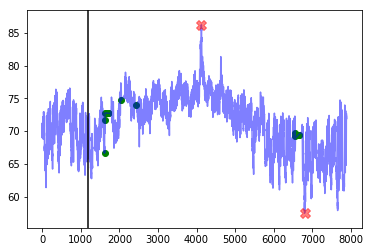




--- all_data_gift_certificates ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  3
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [4987, 6165, 8520, 8521, 8522, 8605, 8606, 8607, 8608, 8611, 8613, 8614, 8616, 8617, 8618, 8634, 8635]


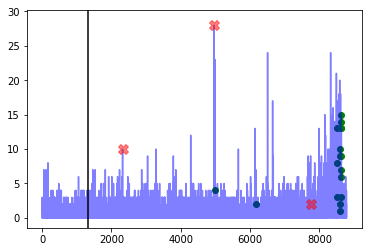




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1493, 1494, 1497]


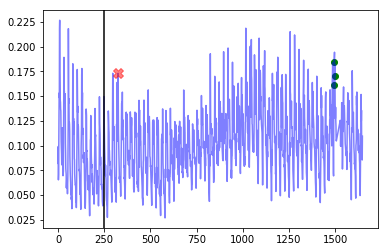




--- exchange-3_cpc_results ---
Corresponding window precision:  0.5
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1042, 1095]


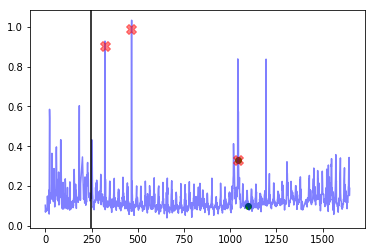




--- international-airline-passengers ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


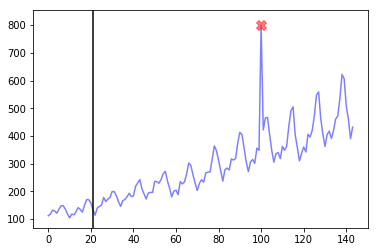

---------weight_fp=0.4, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  15.400000000000002
Best window threshold:  0.0001
Corresponding window overall precision:  0.2
Corresponding window overall recall:  0.23076923076923078
Corresponding window overall F score:  0.21428571428571427



--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1425, 1448, 1449]


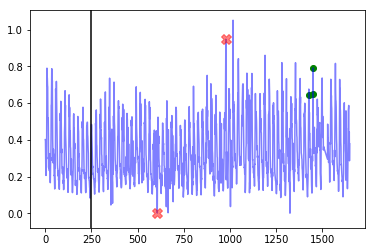




--- exchange-3_cpm_results ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1095, 1098, 1195]


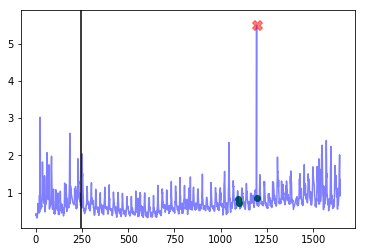




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  4
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1616, 1627, 1628, 1691, 1692, 1693, 1694, 1697, 1698, 2054, 2420, 6549, 6552, 6651, 6654]


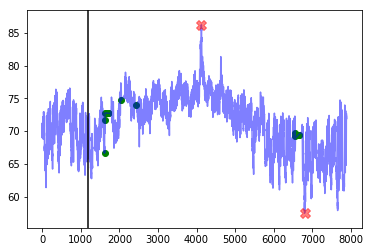




--- all_data_gift_certificates ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  3
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [4987, 6165, 8520, 8521, 8522, 8605, 8606, 8607, 8608, 8611, 8613, 8614, 8616, 8617, 8618, 8634, 8635]


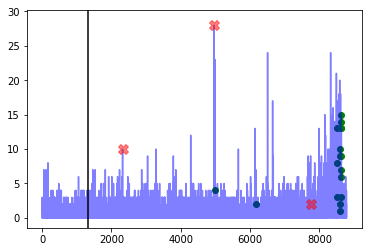




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1493, 1494, 1497]


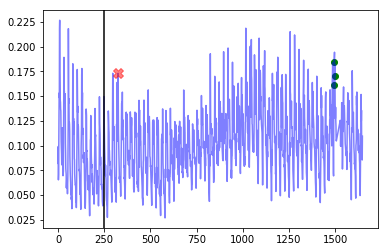




--- exchange-3_cpc_results ---
Corresponding window precision:  0.5
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1042, 1095]


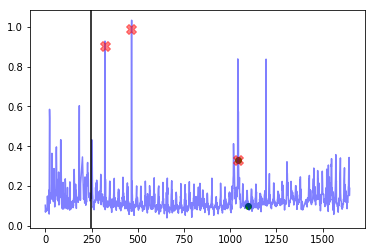




--- international-airline-passengers ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


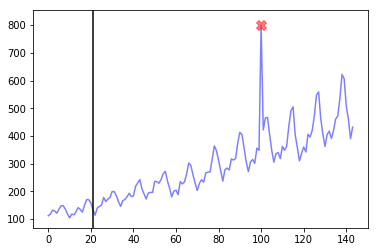

---------weight_fp=0.5, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  16.5
Best window threshold:  0.0001
Corresponding window overall precision:  0.2
Corresponding window overall recall:  0.23076923076923078
Corresponding window overall F score:  0.21428571428571427



--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1425, 1448, 1449]


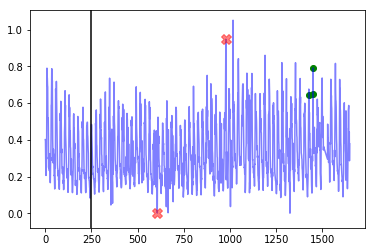




--- exchange-3_cpm_results ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1095, 1098, 1195]


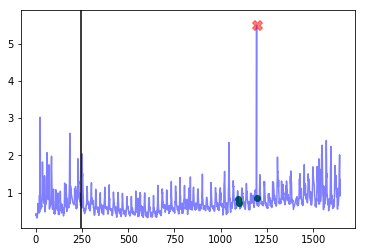




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  4
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1616, 1627, 1628, 1691, 1692, 1693, 1694, 1697, 1698, 2054, 2420, 6549, 6552, 6651, 6654]


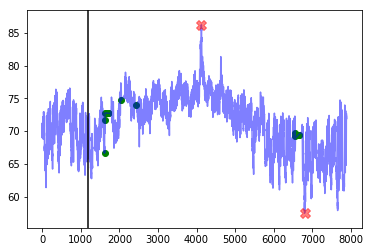




--- all_data_gift_certificates ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  3
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [4987, 6165, 8520, 8521, 8522, 8605, 8606, 8607, 8608, 8611, 8613, 8614, 8616, 8617, 8618, 8634, 8635]


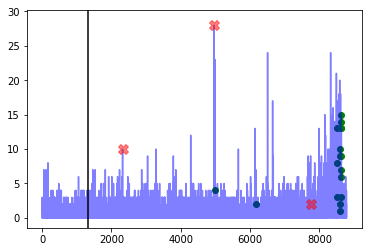




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1493, 1494, 1497]


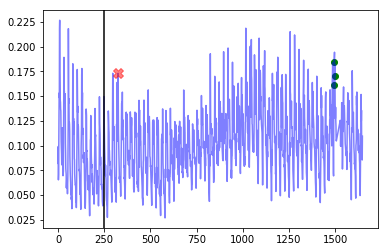




--- exchange-3_cpc_results ---
Corresponding window precision:  0.5
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1042, 1095]


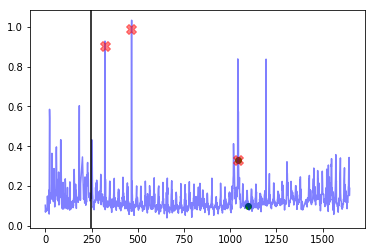




--- international-airline-passengers ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


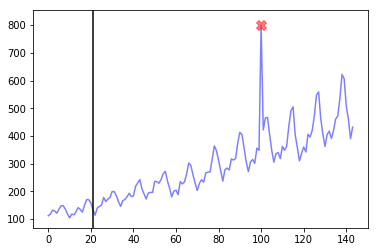

---------weight_fp=0.6, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  17.6
Best window threshold:  0.0001
Corresponding window overall precision:  0.2
Corresponding window overall recall:  0.23076923076923078
Corresponding window overall F score:  0.21428571428571427



--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1425, 1448, 1449]


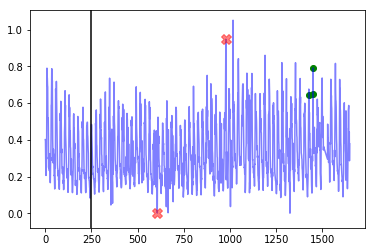




--- exchange-3_cpm_results ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1095, 1098, 1195]


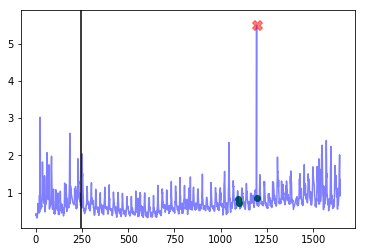




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  4
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1616, 1627, 1628, 1691, 1692, 1693, 1694, 1697, 1698, 2054, 2420, 6549, 6552, 6651, 6654]


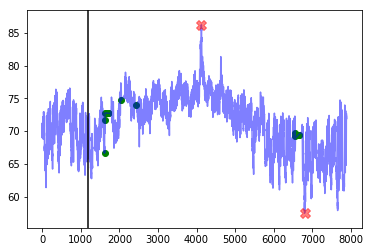




--- all_data_gift_certificates ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  3
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [4987, 6165, 8520, 8521, 8522, 8605, 8606, 8607, 8608, 8611, 8613, 8614, 8616, 8617, 8618, 8634, 8635]


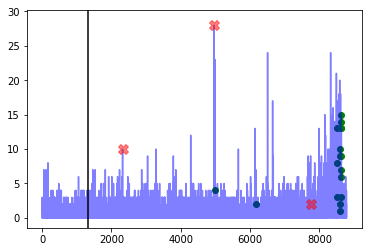




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1493, 1494, 1497]


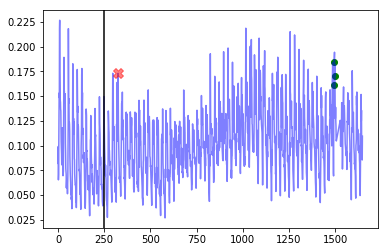




--- exchange-3_cpc_results ---
Corresponding window precision:  0.5
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1042, 1095]


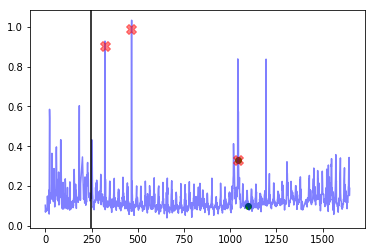




--- international-airline-passengers ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


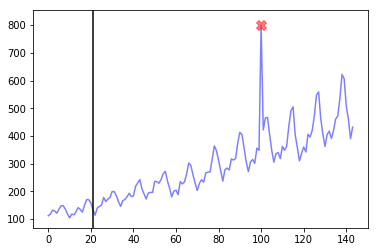

---------weight_fp=0.7, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  18.7
Best window threshold:  0.0001
Corresponding window overall precision:  0.2
Corresponding window overall recall:  0.23076923076923078
Corresponding window overall F score:  0.21428571428571427



--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1425, 1448, 1449]


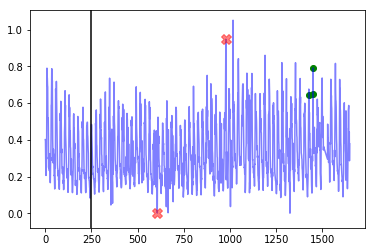




--- exchange-3_cpm_results ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1095, 1098, 1195]


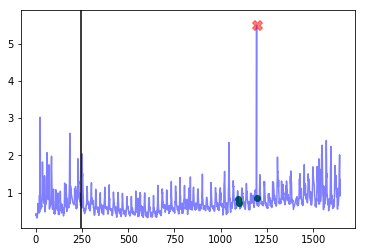




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  4
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1616, 1627, 1628, 1691, 1692, 1693, 1694, 1697, 1698, 2054, 2420, 6549, 6552, 6651, 6654]


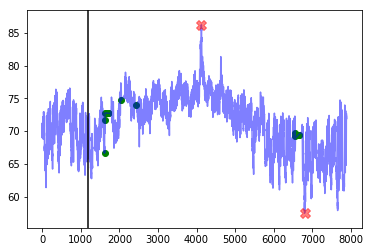




--- all_data_gift_certificates ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  3
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [4987, 6165, 8520, 8521, 8522, 8605, 8606, 8607, 8608, 8611, 8613, 8614, 8616, 8617, 8618, 8634, 8635]


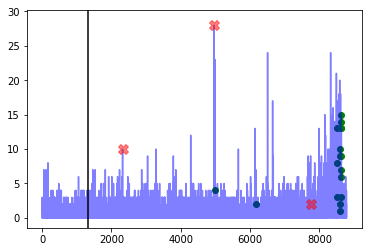




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1493, 1494, 1497]


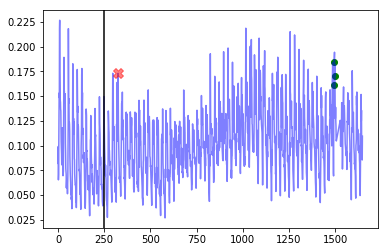




--- exchange-3_cpc_results ---
Corresponding window precision:  0.5
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1042, 1095]


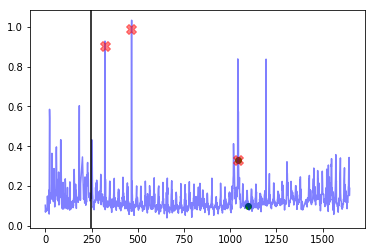




--- international-airline-passengers ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


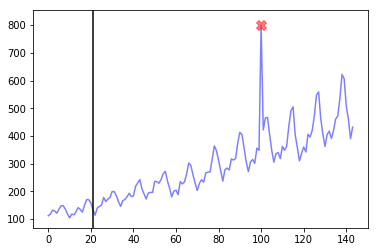

---------weight_fp=0.8, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  19.8
Best window threshold:  0.0001
Corresponding window overall precision:  0.2
Corresponding window overall recall:  0.23076923076923078
Corresponding window overall F score:  0.21428571428571427



--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1425, 1448, 1449]


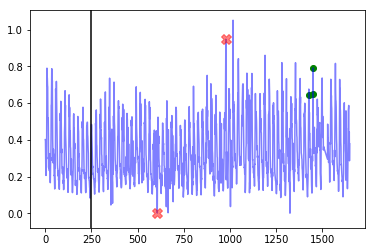




--- exchange-3_cpm_results ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1095, 1098, 1195]


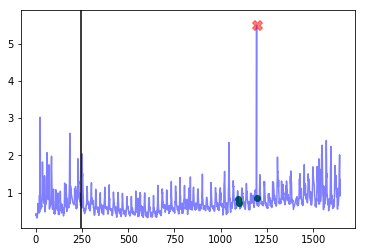




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  4
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1616, 1627, 1628, 1691, 1692, 1693, 1694, 1697, 1698, 2054, 2420, 6549, 6552, 6651, 6654]


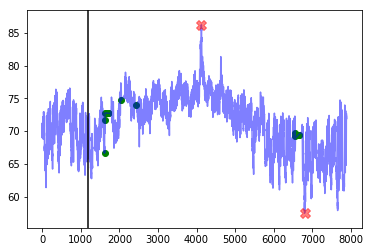




--- all_data_gift_certificates ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  3
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [4987, 6165, 8520, 8521, 8522, 8605, 8606, 8607, 8608, 8611, 8613, 8614, 8616, 8617, 8618, 8634, 8635]


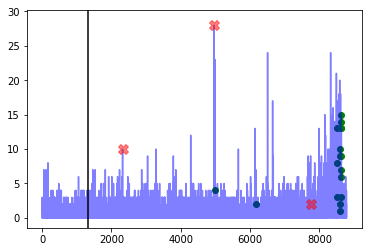




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1493, 1494, 1497]


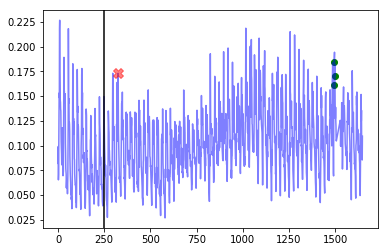




--- exchange-3_cpc_results ---
Corresponding window precision:  0.5
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1042, 1095]


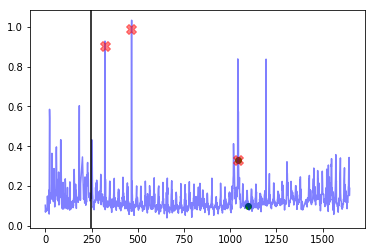




--- international-airline-passengers ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


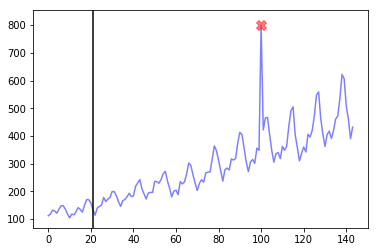

---------weight_fp=0.9, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  20.899999999999995
Best window threshold:  0.0001
Corresponding window overall precision:  0.2
Corresponding window overall recall:  0.23076923076923078
Corresponding window overall F score:  0.21428571428571427



--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1425, 1448, 1449]


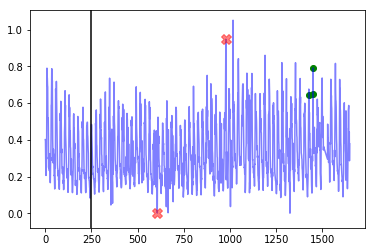




--- exchange-3_cpm_results ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1095, 1098, 1195]


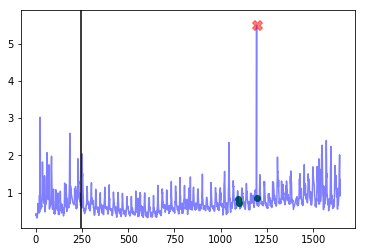




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  4
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1616, 1627, 1628, 1691, 1692, 1693, 1694, 1697, 1698, 2054, 2420, 6549, 6552, 6651, 6654]


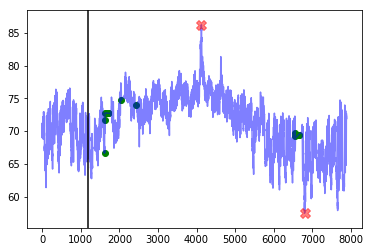




--- all_data_gift_certificates ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  3
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [4987, 6165, 8520, 8521, 8522, 8605, 8606, 8607, 8608, 8611, 8613, 8614, 8616, 8617, 8618, 8634, 8635]


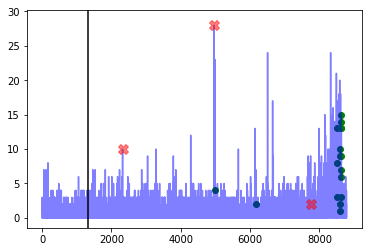




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1493, 1494, 1497]


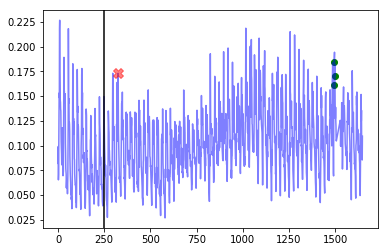




--- exchange-3_cpc_results ---
Corresponding window precision:  0.5
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1042, 1095]


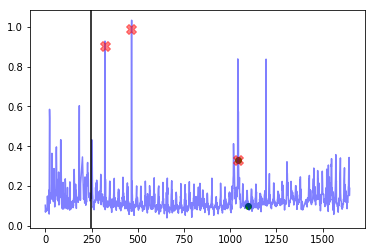




--- international-airline-passengers ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


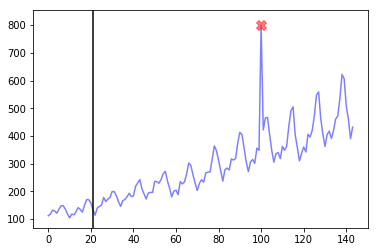

---------weight_fp=1.0, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  22.0
Best window threshold:  0.0001
Corresponding window overall precision:  0.2
Corresponding window overall recall:  0.23076923076923078
Corresponding window overall F score:  0.21428571428571427



--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1425, 1448, 1449]


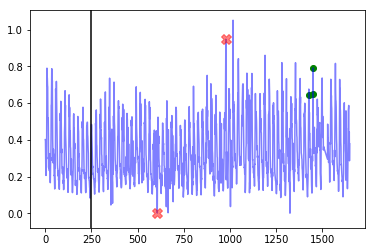




--- exchange-3_cpm_results ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1095, 1098, 1195]


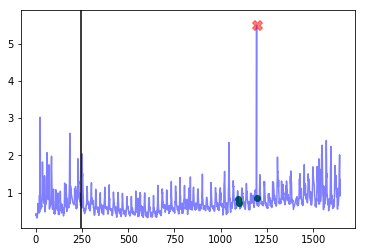




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  4
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1616, 1627, 1628, 1691, 1692, 1693, 1694, 1697, 1698, 2054, 2420, 6549, 6552, 6651, 6654]


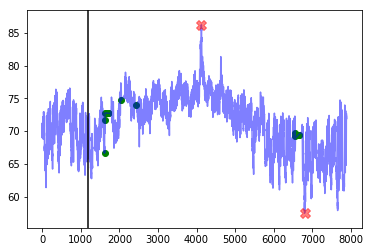




--- all_data_gift_certificates ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  3
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [4987, 6165, 8520, 8521, 8522, 8605, 8606, 8607, 8608, 8611, 8613, 8614, 8616, 8617, 8618, 8634, 8635]


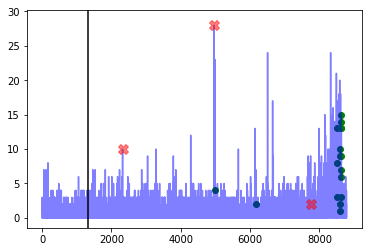




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1493, 1494, 1497]


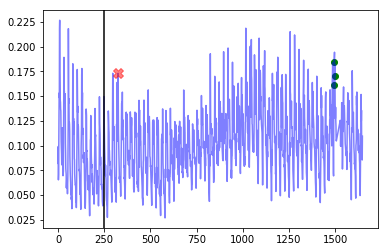




--- exchange-3_cpc_results ---
Corresponding window precision:  0.5
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1042, 1095]


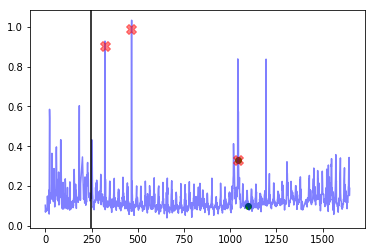




--- international-airline-passengers ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


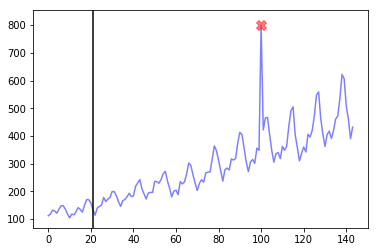

------------
False Positive Weight:  0.1
	 Minimum number of mistakes : 10.200000000000001
	 Best window threshold : 0.0
	 Corresponding window overall precision : 0.1111111111111111
	 Corresponding window overall recall : 1.0
	 Corresponding window overall F score : 0.19999999999999998
False Positive Weight:  0.2
	 Minimum number of mistakes : 13.2
	 Best window threshold : 0.0001
	 Corresponding window overall precision : 0.2
	 Corresponding window overall recall : 0.23076923076923078
	 Corresponding window overall F score : 0.21428571428571427
False Positive Weight:  0.3
	 Minimum number of mistakes : 14.3
	 Best window threshold : 0.0001
	 Corresponding window overall precision : 0.2
	 Corresponding window overall recall : 0.23076923076923078
	 Corresponding window overall F score : 0.21428571428571427
False Positive Weight:  0.4
	 Minimum number of mistakes : 15.400000000000002
	 Best window threshold : 0.0001
	 Corresponding window overall precision : 0.2
	 Corresponding window o

In [41]:
end_results = {}
for weight_fp in weight_fp_list:  
    print("---------weight_fp=" + str(weight_fp) + ", weight_fn=1----------")
    weight_result = adclasses.pretty_print_results(anomalous_ad_dict, anomaly_scores_dict, anomalous_true_outlier_indices_dict, weight_fp=weight_fp, weight_fn=1)
    end_results[weight_fp] = weight_result

print("------------")
adclasses.pretty_print_end_results(end_results)

# GLM

In [42]:
anomaly_scores_dict = {}

for dataset_name in dataset_name_list:
    output_dict_glm = joblib.load("anomaly_scores" + window_size + "/GLM/" + dataset_name)
    anomaly_scores_dict[dataset_name] = output_dict_glm["Anomaly Scores"]

In [43]:
adclasses.precision_recall_curve_info(anomaly_scores_dict, true_outlier_indices_dict)

{0.1: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.2: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.3: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.4: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.5: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.6: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.7: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.8: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.9: {'precision': 0.1111111111111111, 'recall': 1.0},
 1.0: {'precision': 1.0, 'recall': 1.0}}

---------weight_fp=0.1, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  6.0
Best window threshold:  0.999
Corresponding window overall precision:  0.2222222222222222
Corresponding window overall recall:  1.0
Corresponding window overall F score:  0.3636363636363636



--- ibm-common-stock-closing-prices ---
Corresponding window precision:  0.15384615384615385
Corresponding window recall:  1.0
Corresponding window false positives:  11
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [272, 303, 364, 365, 395, 423, 515, 516, 637, 668, 698, 729, 760, 789, 820, 850, 867, 868, 1064, 1095, 1126, 1154, 1185, 1338, 1368, 1399, 1400, 1429]


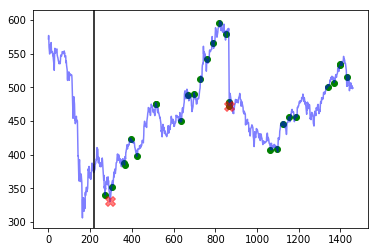




--- exchange-2_cpm_results ---
Corresponding window precision:  0.2
Corresponding window recall:  1.0
Corresponding window false positives:  8
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [360, 601, 606, 655, 664, 665, 666, 802, 876, 896, 899, 923, 951, 975, 976, 977, 978, 1002, 1016, 1045, 1104, 1520, 1521, 1522, 1570, 1627]


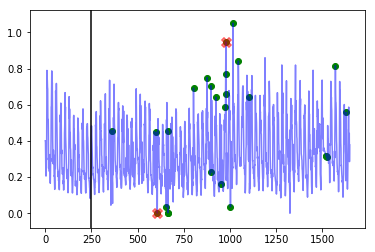




--- exchange-3_cpm_results ---
Corresponding window precision:  0.2
Corresponding window recall:  1.0
Corresponding window false positives:  4
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [779, 780, 819, 836, 901, 1018, 1021, 1044, 1045, 1193, 1194, 1218, 1242, 1531, 1536, 1571]


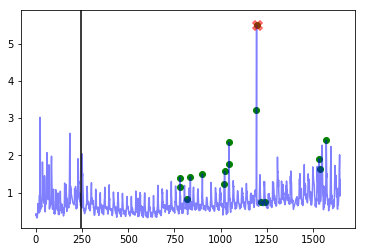




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.2857142857142857
Corresponding window recall:  1.0
Corresponding window false positives:  5
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1563, 2518, 2886, 2887, 3555, 3557, 3558, 4100, 4101, 4102, 4103, 4104, 4105, 4106, 4107, 4108, 4109, 4110, 4111, 4112, 4113, 4115, 4120, 4121, 4122, 4123, 4124, 4125, 4126, 4127, 4128, 4129, 4130, 4131, 4132, 4133, 4134, 5443, 5444, 5449, 5462, 5463, 5466, 5467, 5468, 5469, 5470, 5471, 5472, 5473, 5474, 5475, 5476, 5477, 5478, 5479, 5480, 6788, 6791, 6816]


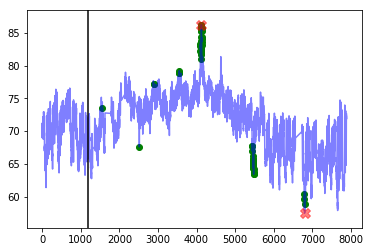




--- all_data_gift_certificates ---
Corresponding window precision:  0.125
Corresponding window recall:  1.0
Corresponding window false positives:  21
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1385, 1409, 1438, 1462, 1483, 1505, 1531, 1702, 1770, 1820, 1822, 1918, 2009, 2059, 2157, 2176, 2233, 2304, 2320, 2471, 2514, 2667, 2871, 2894, 2899, 2905, 2974, 3014, 3016, 3024, 3042, 3053, 3260, 3281, 3311, 3389, 3664, 3688, 3711, 3785, 3790, 3805, 3810, 3841, 3842, 3855, 3867, 3963, 3988, 4149, 4286, 4317, 4341, 4367, 4516, 4578, 4823, 4946, 4961, 4963, 4986, 4992, 5632, 5637, 5662, 5733, 5905, 5924, 6014, 6019, 6137, 6164, 6167, 6375, 6471, 6505, 6650, 6669, 7100, 7169, 7200, 7317, 7318, 7321, 7366, 7396, 7491, 7505, 7655, 7656, 7677, 7679, 7680, 7696, 7720, 7723, 7746, 7823, 7838, 7864, 7871, 7963, 7984, 7985, 7987, 7989, 7994, 8009, 8015, 8017, 8059, 8060, 8134, 8157, 8162, 8175, 8177, 8252, 8253, 8301, 8323, 8324, 8326, 8327, 83

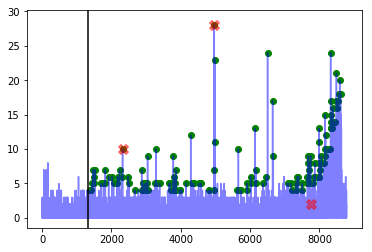




--- exchange-2_cpc_results ---
Corresponding window precision:  0.25
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [325, 824, 1016, 1046, 1062, 1484, 1485, 1486, 1487, 1520]


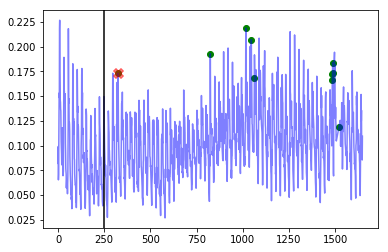




--- exchange-3_cpc_results ---
Corresponding window precision:  0.6
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [322, 323, 466, 467, 1011, 1014, 1016, 1017, 1018, 1019, 1022, 1033, 1041, 1043, 1044, 1193, 1194, 1571]


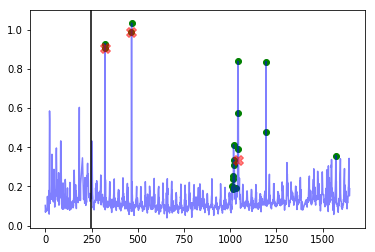




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  0.6666666666666666
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1271, 2968, 2970, 3861, 3863]


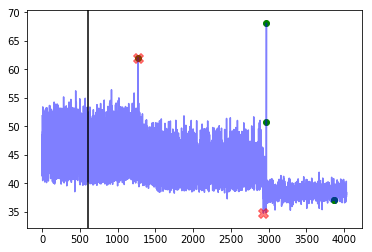




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.2
Corresponding window recall:  1.0
Corresponding window false positives:  4
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [607, 608, 609, 610, 611, 619, 620, 2131, 2135, 2338, 2419, 2420, 2421, 2422, 2423, 2424, 2425, 2426, 2428, 2429, 2430, 2431, 2432, 2433, 2434, 2436, 2437, 2438, 2441, 2442, 2443, 2444, 2445, 2449, 2454, 2456, 3425, 3567, 3568, 3569, 3570, 3571, 3580, 3581, 3582, 3583, 3584, 3585, 3586, 3587, 3588, 3589, 3590, 3591, 3592, 3593, 3594, 3595, 3596, 3597, 3598, 3599, 3600, 3601, 3602, 3603, 3604, 3605, 3607, 3608, 3609, 3610, 3611, 3859, 3860, 3861, 3862, 3863, 3864]


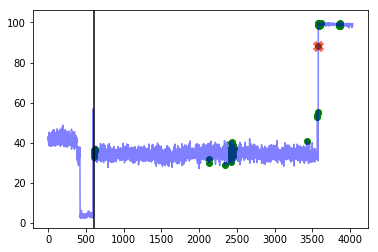




--- international-airline-passengers ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [78, 100]


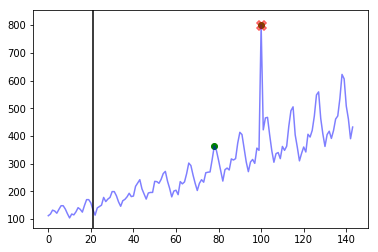

---------weight_fp=0.2, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  11.0
Best window threshold:  1.0
Corresponding window overall precision:  0.47368421052631576
Corresponding window overall recall:  0.5
Corresponding window overall F score:  0.4864864864864865



--- ibm-common-stock-closing-prices ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


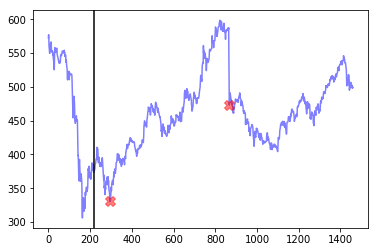




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


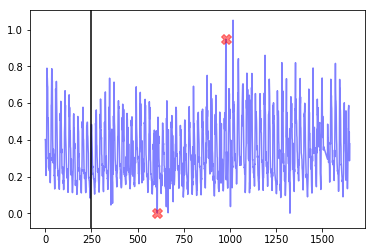




--- exchange-3_cpm_results ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1044, 1193, 1194]


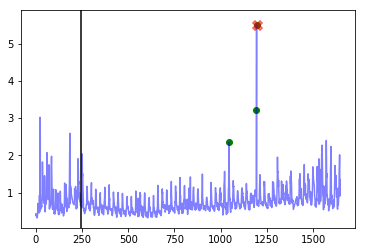




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


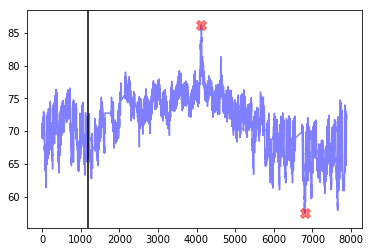




--- all_data_gift_certificates ---
Corresponding window precision:  0.2222222222222222
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  7
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2320, 4286, 4963, 4986, 5662, 6137, 6505, 6650, 7985, 8324]


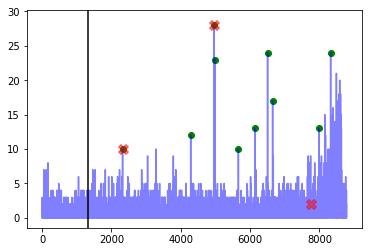




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


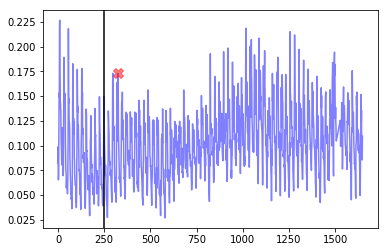




--- exchange-3_cpc_results ---
Corresponding window precision:  0.75
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [322, 466, 467, 1041, 1194]


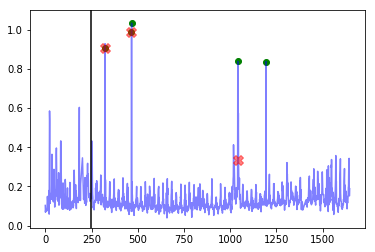




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2970]


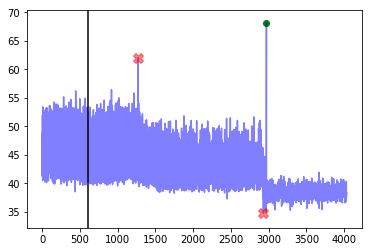




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2420, 3567, 3568, 3571, 3580, 3581, 3582, 3583, 3584, 3585]


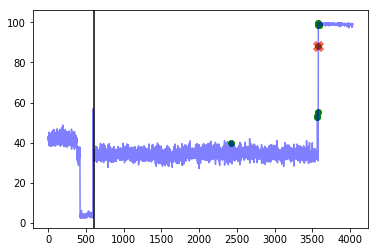




--- international-airline-passengers ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [100]


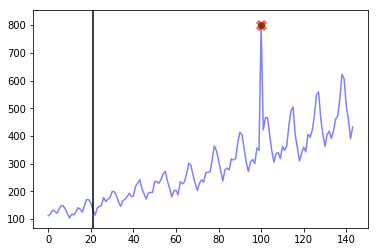

---------weight_fp=0.3, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  12.000000000000002
Best window threshold:  1.0
Corresponding window overall precision:  0.47368421052631576
Corresponding window overall recall:  0.5
Corresponding window overall F score:  0.4864864864864865



--- ibm-common-stock-closing-prices ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


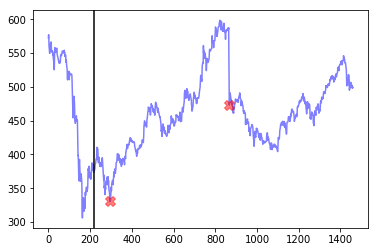




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


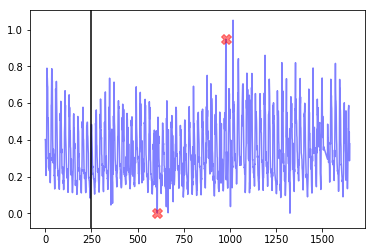




--- exchange-3_cpm_results ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1044, 1193, 1194]


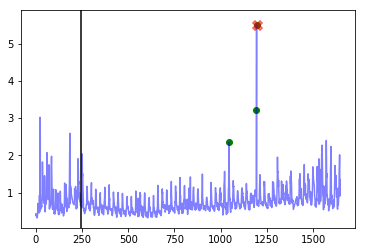




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


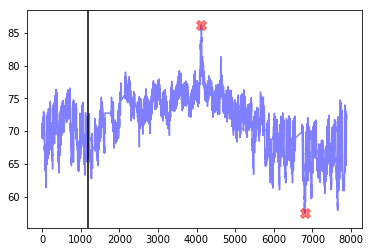




--- all_data_gift_certificates ---
Corresponding window precision:  0.2222222222222222
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  7
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2320, 4286, 4963, 4986, 5662, 6137, 6505, 6650, 7985, 8324]


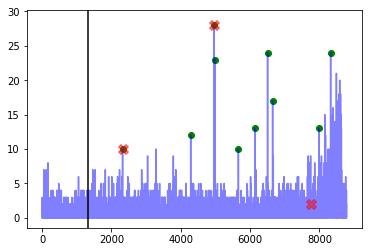




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


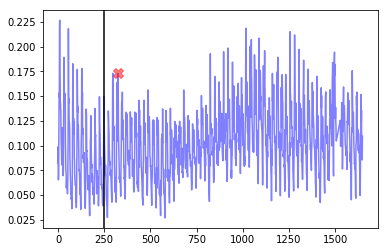




--- exchange-3_cpc_results ---
Corresponding window precision:  0.75
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [322, 466, 467, 1041, 1194]


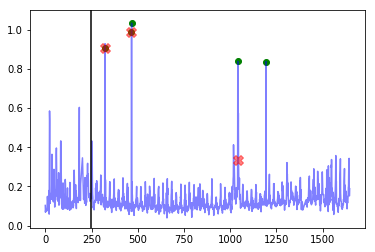




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2970]


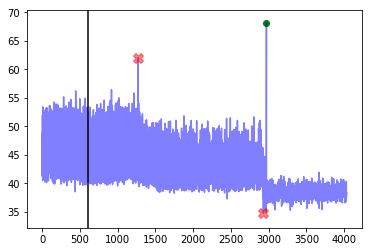




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2420, 3567, 3568, 3571, 3580, 3581, 3582, 3583, 3584, 3585]


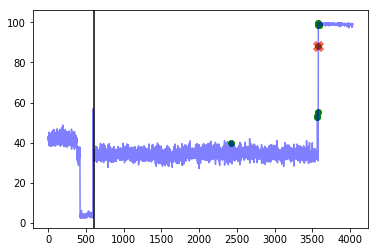




--- international-airline-passengers ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [100]


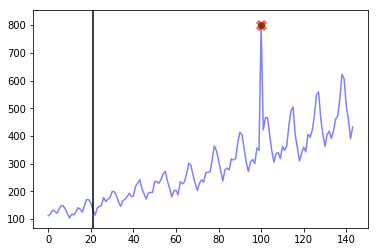

---------weight_fp=0.4, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  13.000000000000002
Best window threshold:  1.0
Corresponding window overall precision:  0.47368421052631576
Corresponding window overall recall:  0.5
Corresponding window overall F score:  0.4864864864864865



--- ibm-common-stock-closing-prices ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


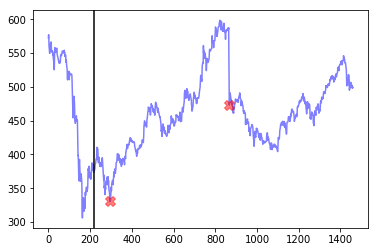




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


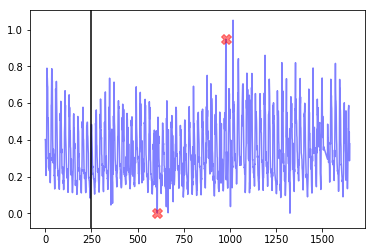




--- exchange-3_cpm_results ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1044, 1193, 1194]


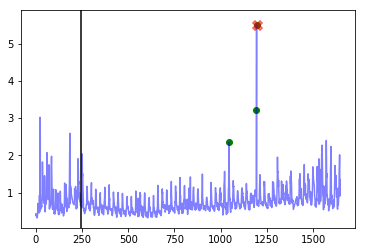




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


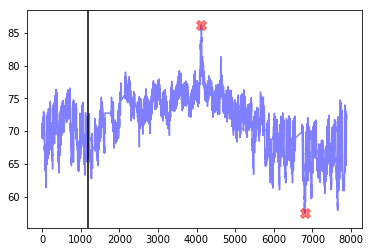




--- all_data_gift_certificates ---
Corresponding window precision:  0.2222222222222222
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  7
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2320, 4286, 4963, 4986, 5662, 6137, 6505, 6650, 7985, 8324]


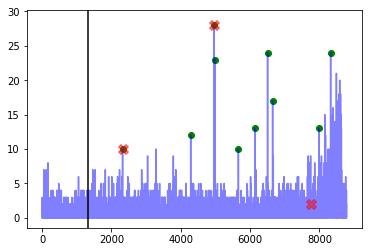




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


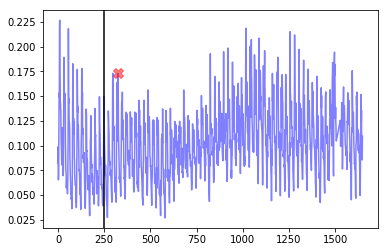




--- exchange-3_cpc_results ---
Corresponding window precision:  0.75
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [322, 466, 467, 1041, 1194]


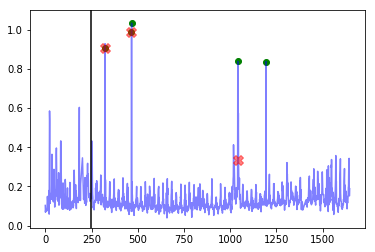




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2970]


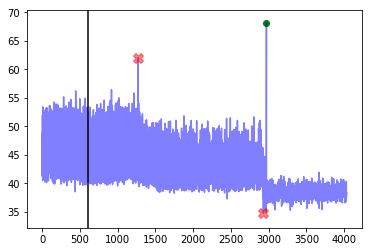




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2420, 3567, 3568, 3571, 3580, 3581, 3582, 3583, 3584, 3585]


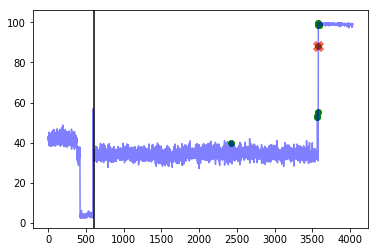




--- international-airline-passengers ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [100]


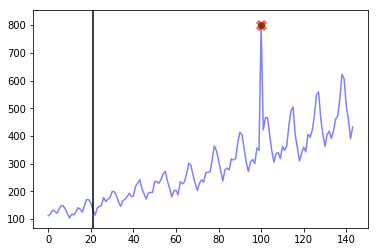

---------weight_fp=0.5, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  14.0
Best window threshold:  1.0
Corresponding window overall precision:  0.47368421052631576
Corresponding window overall recall:  0.5
Corresponding window overall F score:  0.4864864864864865



--- ibm-common-stock-closing-prices ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


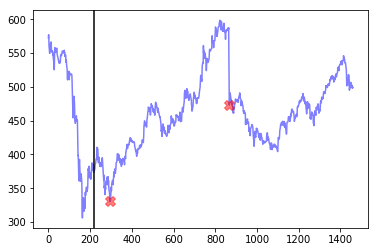




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


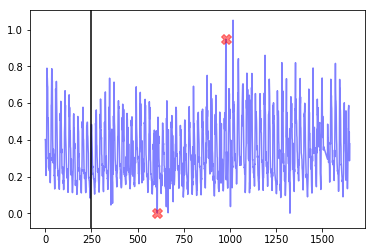




--- exchange-3_cpm_results ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1044, 1193, 1194]


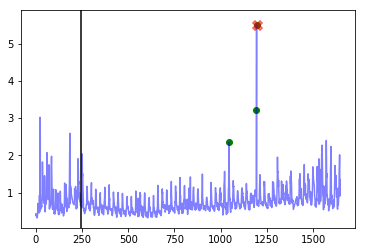




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


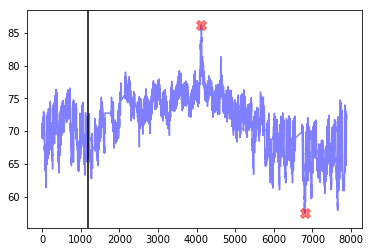




--- all_data_gift_certificates ---
Corresponding window precision:  0.2222222222222222
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  7
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2320, 4286, 4963, 4986, 5662, 6137, 6505, 6650, 7985, 8324]


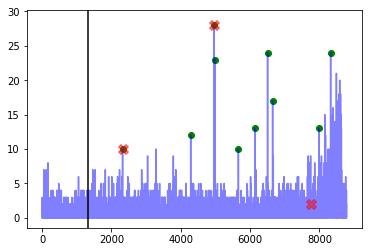




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


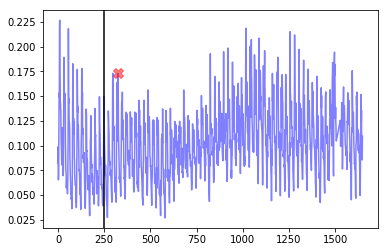




--- exchange-3_cpc_results ---
Corresponding window precision:  0.75
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [322, 466, 467, 1041, 1194]


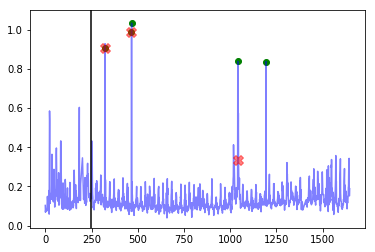




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2970]


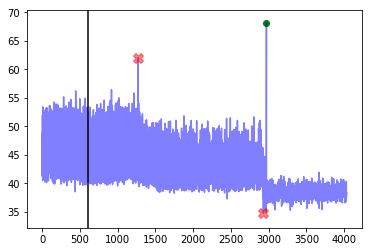




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2420, 3567, 3568, 3571, 3580, 3581, 3582, 3583, 3584, 3585]


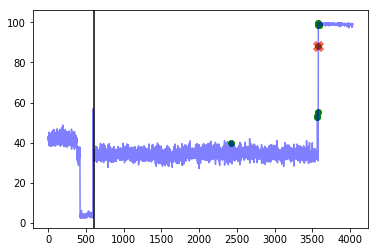




--- international-airline-passengers ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [100]


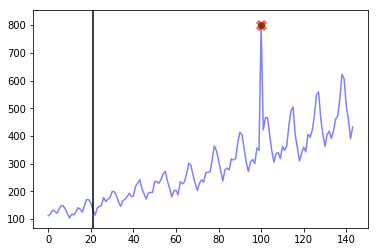

---------weight_fp=0.6, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  15.0
Best window threshold:  1.0
Corresponding window overall precision:  0.47368421052631576
Corresponding window overall recall:  0.5
Corresponding window overall F score:  0.4864864864864865



--- ibm-common-stock-closing-prices ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


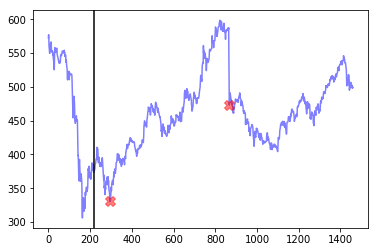




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


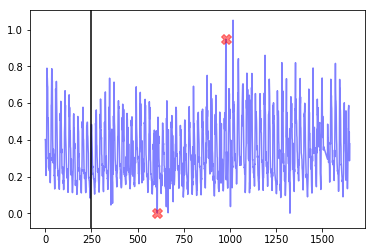




--- exchange-3_cpm_results ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1044, 1193, 1194]


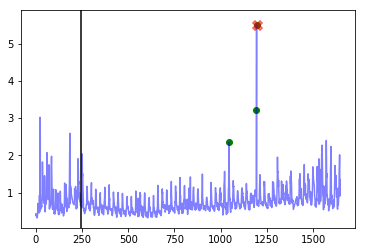




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


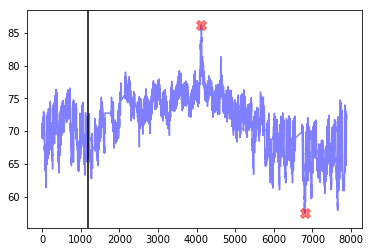




--- all_data_gift_certificates ---
Corresponding window precision:  0.2222222222222222
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  7
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2320, 4286, 4963, 4986, 5662, 6137, 6505, 6650, 7985, 8324]


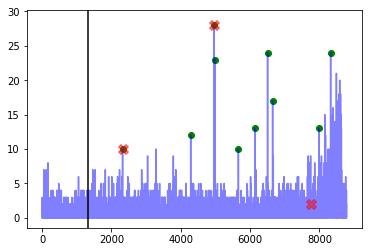




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


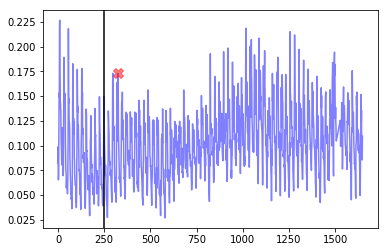




--- exchange-3_cpc_results ---
Corresponding window precision:  0.75
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [322, 466, 467, 1041, 1194]


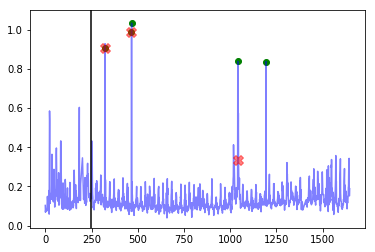




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2970]


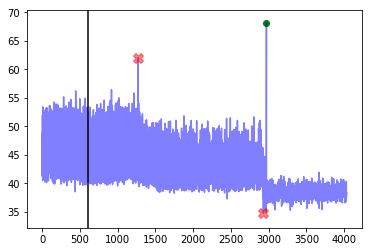




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2420, 3567, 3568, 3571, 3580, 3581, 3582, 3583, 3584, 3585]


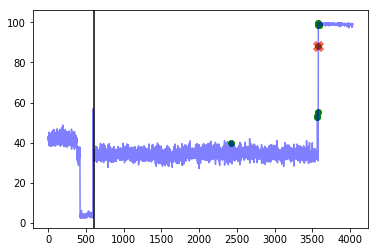




--- international-airline-passengers ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [100]


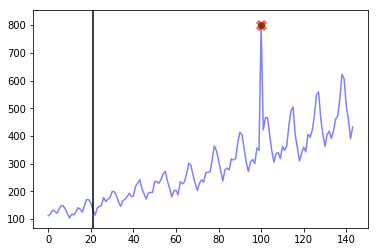

---------weight_fp=0.7, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  15.999999999999998
Best window threshold:  1.0
Corresponding window overall precision:  0.47368421052631576
Corresponding window overall recall:  0.5
Corresponding window overall F score:  0.4864864864864865



--- ibm-common-stock-closing-prices ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


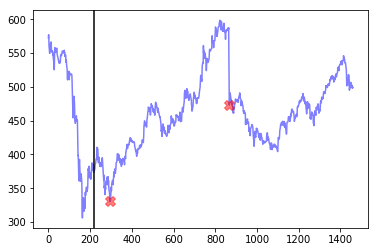




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


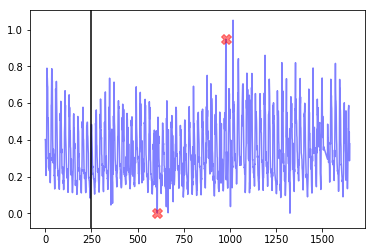




--- exchange-3_cpm_results ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1044, 1193, 1194]


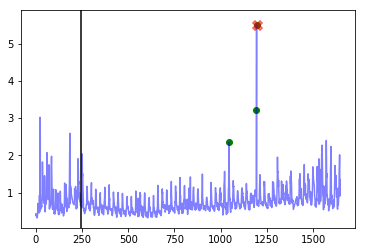




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


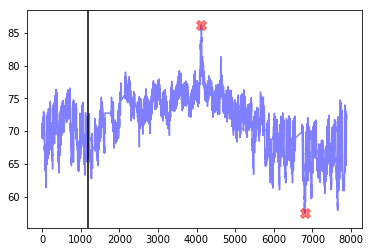




--- all_data_gift_certificates ---
Corresponding window precision:  0.2222222222222222
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  7
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2320, 4286, 4963, 4986, 5662, 6137, 6505, 6650, 7985, 8324]


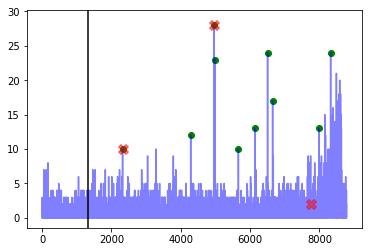




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


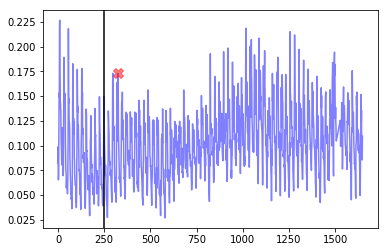




--- exchange-3_cpc_results ---
Corresponding window precision:  0.75
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [322, 466, 467, 1041, 1194]


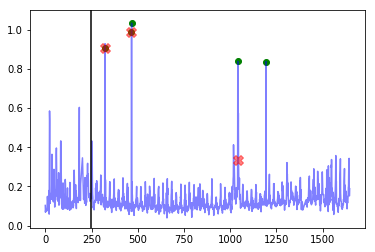




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2970]


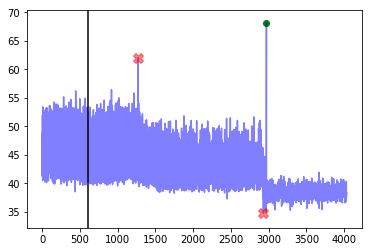




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2420, 3567, 3568, 3571, 3580, 3581, 3582, 3583, 3584, 3585]


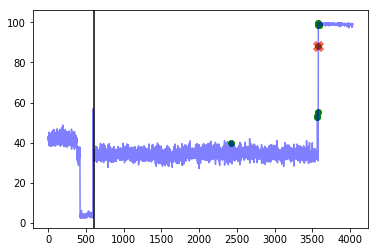




--- international-airline-passengers ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [100]


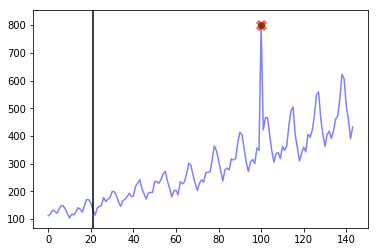

---------weight_fp=0.8, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  17.000000000000004
Best window threshold:  1.0
Corresponding window overall precision:  0.47368421052631576
Corresponding window overall recall:  0.5
Corresponding window overall F score:  0.4864864864864865



--- ibm-common-stock-closing-prices ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


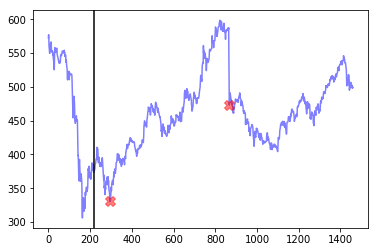




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


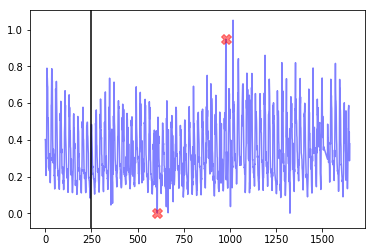




--- exchange-3_cpm_results ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1044, 1193, 1194]


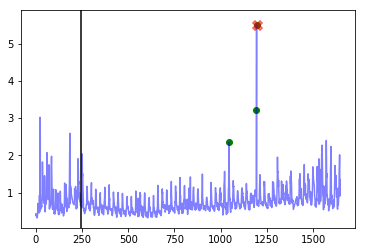




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


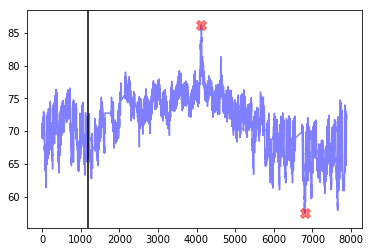




--- all_data_gift_certificates ---
Corresponding window precision:  0.2222222222222222
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  7
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2320, 4286, 4963, 4986, 5662, 6137, 6505, 6650, 7985, 8324]


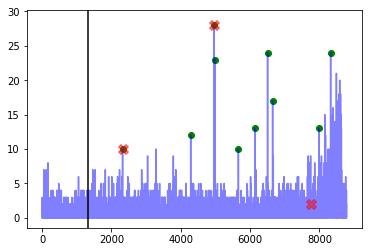




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


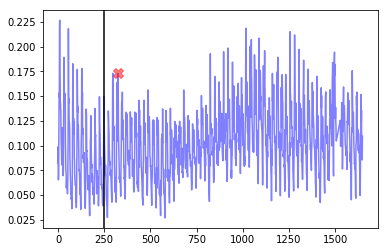




--- exchange-3_cpc_results ---
Corresponding window precision:  0.75
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [322, 466, 467, 1041, 1194]


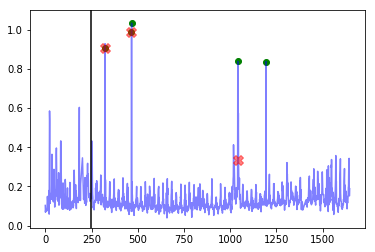




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2970]


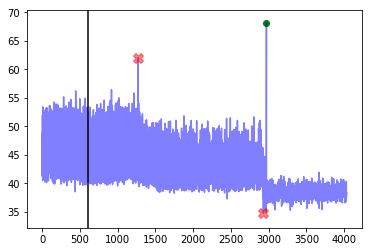




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2420, 3567, 3568, 3571, 3580, 3581, 3582, 3583, 3584, 3585]


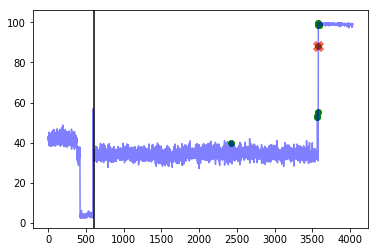




--- international-airline-passengers ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [100]


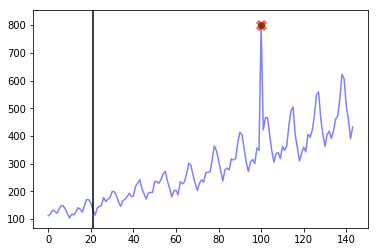

---------weight_fp=0.9, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  17.999999999999996
Best window threshold:  1.0
Corresponding window overall precision:  0.47368421052631576
Corresponding window overall recall:  0.5
Corresponding window overall F score:  0.4864864864864865



--- ibm-common-stock-closing-prices ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


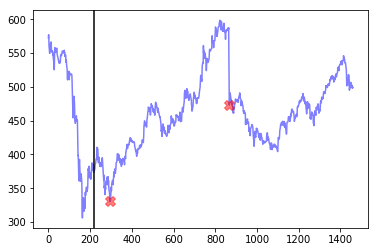




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


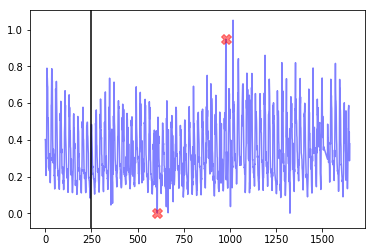




--- exchange-3_cpm_results ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1044, 1193, 1194]


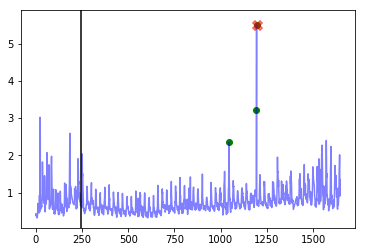




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


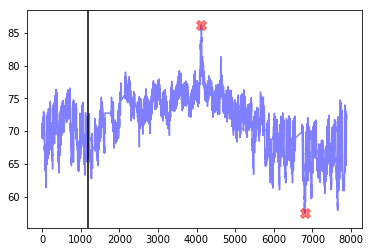




--- all_data_gift_certificates ---
Corresponding window precision:  0.2222222222222222
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  7
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2320, 4286, 4963, 4986, 5662, 6137, 6505, 6650, 7985, 8324]


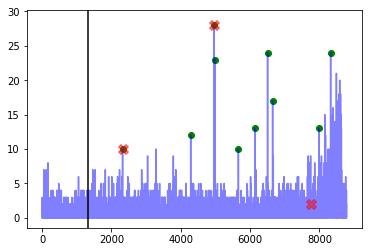




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


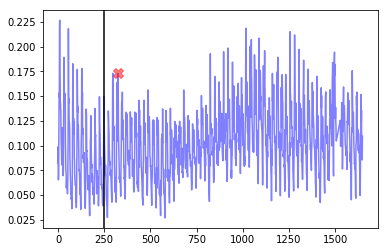




--- exchange-3_cpc_results ---
Corresponding window precision:  0.75
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [322, 466, 467, 1041, 1194]


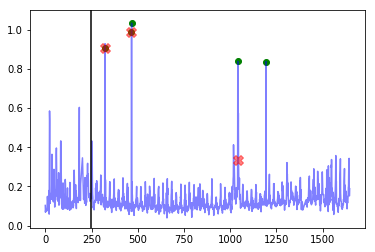




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2970]


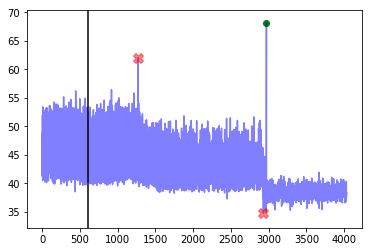




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2420, 3567, 3568, 3571, 3580, 3581, 3582, 3583, 3584, 3585]


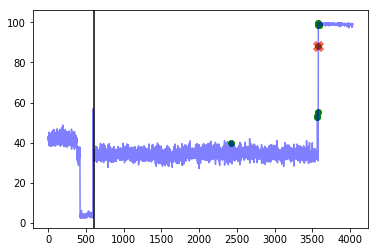




--- international-airline-passengers ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [100]


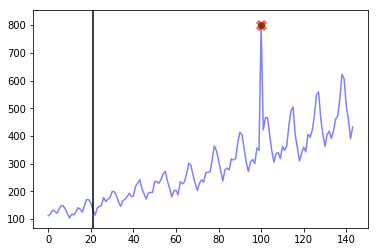

---------weight_fp=1.0, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  19.0
Best window threshold:  1.0
Corresponding window overall precision:  0.47368421052631576
Corresponding window overall recall:  0.5
Corresponding window overall F score:  0.4864864864864865



--- ibm-common-stock-closing-prices ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


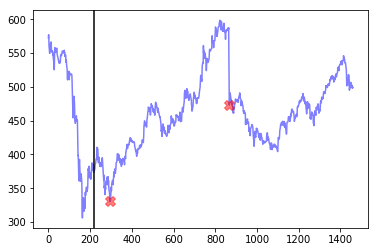




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


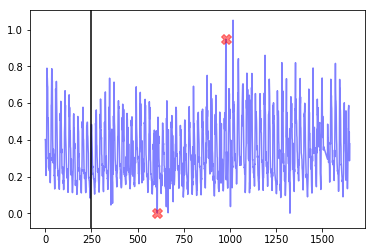




--- exchange-3_cpm_results ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1044, 1193, 1194]


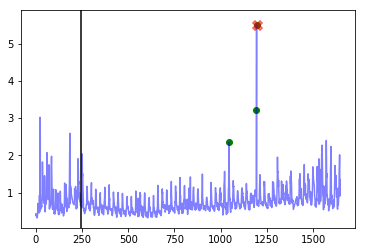




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


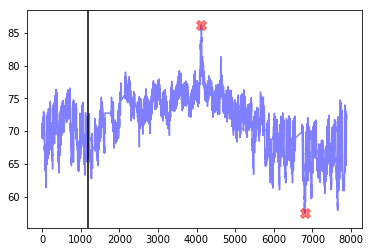




--- all_data_gift_certificates ---
Corresponding window precision:  0.2222222222222222
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  7
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2320, 4286, 4963, 4986, 5662, 6137, 6505, 6650, 7985, 8324]


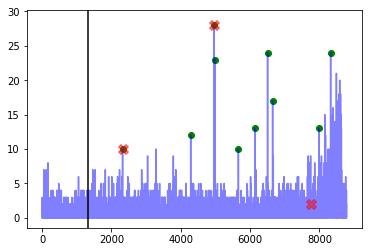




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


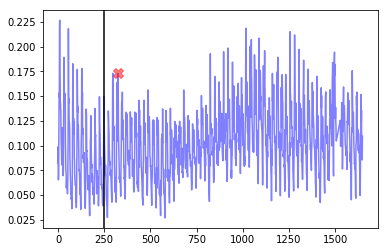




--- exchange-3_cpc_results ---
Corresponding window precision:  0.75
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [322, 466, 467, 1041, 1194]


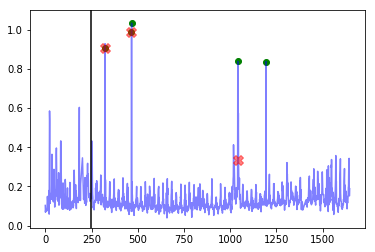




--- ec2_cpu_utilization_5f5533 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2970]


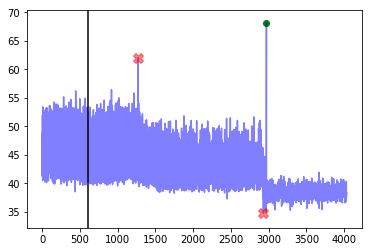




--- ec2_cpu_utilization_ac20cd ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2420, 3567, 3568, 3571, 3580, 3581, 3582, 3583, 3584, 3585]


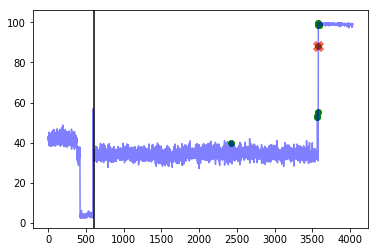




--- international-airline-passengers ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [100]


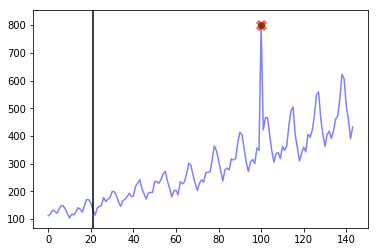

------------
False Positive Weight:  0.1
	 Minimum number of mistakes : 6.0
	 Best window threshold : 0.999
	 Corresponding window overall precision : 0.2222222222222222
	 Corresponding window overall recall : 1.0
	 Corresponding window overall F score : 0.3636363636363636
False Positive Weight:  0.2
	 Minimum number of mistakes : 11.0
	 Best window threshold : 1.0
	 Corresponding window overall precision : 0.47368421052631576
	 Corresponding window overall recall : 0.5
	 Corresponding window overall F score : 0.4864864864864865
False Positive Weight:  0.3
	 Minimum number of mistakes : 12.000000000000002
	 Best window threshold : 1.0
	 Corresponding window overall precision : 0.47368421052631576
	 Corresponding window overall recall : 0.5
	 Corresponding window overall F score : 0.4864864864864865
False Positive Weight:  0.4
	 Minimum number of mistakes : 13.000000000000002
	 Best window threshold : 1.0
	 Corresponding window overall precision : 0.47368421052631576
	 Corresponding win

In [44]:
end_results = {}
for weight_fp in weight_fp_list:  
    print("---------weight_fp=" + str(weight_fp) + ", weight_fn=1----------")
    weight_result = adclasses.pretty_print_results(ad_dict, anomaly_scores_dict, true_outlier_indices_dict, weight_fp=weight_fp, weight_fn=1)
    end_results[weight_fp] = weight_result

print("------------")
adclasses.pretty_print_end_results(end_results)

# NAB Score

    1. make a python 2.7 virtual environment
    2. pip install pandas
    3. git clone NAB
    4. pip install . in NAB

To obtain NAB scores for every method on the trend datasets, we must do the following:

# Have a new dataset?

1. add the new dataset csv with timestamp, value in respective folder in data folder. no missing time steps allowed

2. add the point anomaly dates to combined_labels.json in labels folder

3. add the anomaly windows to combined_windows.json  (start and end dates)

4. in results/null, include null_datasetname.csv with timestamp, value, label, and anomaly_score (all .5). You can just use the adclasses.create_result_csv function and delete irrelevant columns and fill anomaly_score with all .5s

WARNING: Some datasets we use are already in NAB, but they have missing time steps. Replace the dataset csv in the data folder with a prefilled version as the anomaly scores we use assume no missing time steps. You can just use the adclasses.create_result_csv function and delete irrelevant columns

In [45]:
dataset_name = "ibm-common-stock-closing-prices"
path = "data/" + dataset_name + ".csv"

data = pd.read_csv(path,header=0)
data["Date"] = pd.to_datetime(data["Date"],format="%Y-%m-%d")

data["timestamp"] = data["Date"]
del data["Date"]
data["value"] = data["IBM common stock closing prices"]
del data["IBM common stock closing prices"]

start_date = data["timestamp"].values[0]
end_date = data["timestamp"].values[-1]
print("Start date: ", start_date)
print("End date: ", end_date)

missing = adclasses.find_missing_time_steps(start_date, end_date, '1D', data)
print("Missing time steps: ", missing)

data = adclasses.fill_missing_time_steps(start_date, end_date, '1D', data, method="linear")

ad = adclasses.UnivariateAnomalyDetection(dataframe=data, timestep="1D", dateformat="%Y-%m-%d", name=dataset_name)
print("Length: ", ad.get_length())
print("Time step size: ", ad.get_timestep())
print("Start Date: ", start_date)
print("End Date: ", end_date)
print("Date Format: ", ad.get_dateformat())

true_outlier_dates = ["1962-10-26",
                      "1964-05-18"]

d = timedelta(days=1)
for outlier_date in true_outlier_dates:
    print(adclasses.get_window_ends(outlier_date, 
                                    ad.get_length(), 
                                    len(true_outlier_dates), 
                                    ad.get_dateformat(), d))

Start date:  1962-01-02T00:00:00.000000000
End date:  1965-12-31T00:00:00.000000000
Missing time steps:  DatetimeIndex(['1962-01-06', '1962-01-07', '1962-01-13', '1962-01-14',
               '1962-01-20', '1962-01-21', '1962-01-27', '1962-01-28',
               '1962-02-03', '1962-02-04',
               ...
               '1965-11-28', '1965-12-04', '1965-12-05', '1965-12-11',
               '1965-12-12', '1965-12-18', '1965-12-19', '1965-12-24',
               '1965-12-25', '1965-12-26'],
              dtype='datetime64[ns]', length=452, freq=None)
Length:  1460
Time step size:  1D
Start Date:  1962-01-02T00:00:00.000000000
End Date:  1965-12-31T00:00:00.000000000
Date Format:  %Y-%m-%d
(Timestamp('1962-09-20 00:00:00'), Timestamp('1962-12-01 00:00:00'))
(Timestamp('1964-04-12 00:00:00'), Timestamp('1964-06-23 00:00:00'))


In [46]:
dataset_name = "all_data_gift_certificates"
path = "data/" + dataset_name + ".csv"

data = pd.read_csv(path, header=0)
data["timestamp"] = data["BeginTime"].values
del data["BeginTime"]
data["value"] = data["Count"].values
del data["Count"]
start_date = data["timestamp"].values[0]
end_date = data["timestamp"].values[-1]
print("Start date: ", start_date)
print("End date: ", end_date)

data["timestamp"] = pd.to_datetime(data["timestamp"], 
                                   format="%Y-%m-%d %H:%M:%S")

print("Missing time stamps: \n", adclasses.find_missing_time_steps(start_date, end_date, 
                                                                   '1H', data))

ad = adclasses.UnivariateAnomalyDetection(dataframe=data, 
                                          timestep="1H", 
                                          dateformat="%Y-%m-%d %H:%M:%S", 
                                          name=dataset_name)
print("Length: ", ad.get_length())
print("Time step size: ", ad.get_timestep())
print("Start Date: ", start_date)
print("End Date: ", end_date)
print("Date Format: ", ad.get_dateformat())
true_outlier_dates = ["2016-04-06 16:00:00",
                      "2016-07-25 19:00:00",
                      "2016-11-19 20:00:00"]

d = timedelta(hours=1)
for outlier_date in true_outlier_dates:
    print(adclasses.get_window_ends(outlier_date, 
                                    ad.get_length(), 
                                    len(true_outlier_dates), 
                                    ad.get_dateformat(), d))

Start date:  2016-01-01 00:00:00
End date:  2016-12-31 23:00:00
Missing time stamps: 
 DatetimeIndex([], dtype='datetime64[ns]', freq='H')
Length:  8784
Time step size:  1H
Start Date:  2016-01-01 00:00:00
End Date:  2016-12-31 23:00:00
Date Format:  %Y-%m-%d %H:%M:%S
(Timestamp('2016-03-31 14:00:00'), Timestamp('2016-04-12 18:00:00'))
(Timestamp('2016-07-19 17:00:00'), Timestamp('2016-07-31 21:00:00'))
(Timestamp('2016-11-13 18:00:00'), Timestamp('2016-11-25 22:00:00'))


In [47]:
dataset_name = "international-airline-passengers"
path = "data/" + dataset_name + ".csv"

data = pd.read_csv(path, header=0)
start_date = data["timestamp"].values[0]
end_date = data["timestamp"].values[-1]
print("Start date: ", start_date)
print("End date: ", end_date)

data["timestamp"] = pd.to_datetime(data["timestamp"], 
                                   format="%Y-%m")

print("Missing time stamps: \n", adclasses.find_missing_time_steps(start_date, end_date, 
                                                                   '1MS', data))

# if you want to use a method that cannot take missing time steps
# into account, you need to fill in the missing time steps yourself
# this function also removes duplicates
print("Fill Missing Time Steps with Interpolation")
data = adclasses.fill_missing_time_steps(start_date, end_date, '1MS', data, method="linear")

ad = adclasses.UnivariateAnomalyDetection(dataframe=data, 
                                          timestep="1MS", 
                                          dateformat="%Y-%m", 
                                          name=dataset_name)
print("Length: ", ad.get_length())
print("Time step size: ", ad.get_timestep())
print("Start Date: ", start_date)
print("End Date: ", end_date)
print("Date Format: ", ad.get_dateformat())
true_outlier_dates = ["1957-05"]

d = timedelta(days=30)
for outlier_date in true_outlier_dates:
    print(adclasses.get_window_ends(outlier_date, 
                                    ad.get_length(), 
                                    len(true_outlier_dates), 
                                    ad.get_dateformat(), d))

Start date:  1949-01
End date:  1960-12
Missing time stamps: 
 DatetimeIndex([], dtype='datetime64[ns]', freq='MS')
Fill Missing Time Steps with Interpolation
Length:  144
Time step size:  1MS
Start Date:  1949-01
End Date:  1960-12
Date Format:  %Y-%m
(Timestamp('1956-10-03 00:00:00'), Timestamp('1957-11-27 00:00:00'))


# For every anomaly detection method "method_name" and dataset "dataset_name", do the following:

0. clear up previous NAB/results/

1. $ python scripts/create_new_detector.py --detector method_name

this creates the method_name folder in results folder with a bunch of datasets folders that are empty. delete the irrelevant ones

2. for every characteristic relevant dataset, create csvs with columns like so: timestamp, value, anomaly_score, label. place in appropriate locations in results/method_name/

3. replace datasets with prefill

4. $ python run.py -d method_name --optimize --score --normalize

WARNING: HAVE TO MAKE CHANGE TO NAB function convertAnomalyScoresToDetections in util.py bc it will think values are strings

In [48]:
prepath="/home/cfreeman/Documents/NextIT/test_python_2/NAB/results_trend" + window_size + "/"

# STL Resid

Final score for 'stl' detector on 'reward_low_FP_rate' profile = 35.56

Final score for 'stl' detector on 'reward_low_FN_rate' profile = 51.50

Final score for 'stl' detector on 'standard' profile = 36.11


In [49]:
folder="selfCreate"
method_name = "stl"
dataset_name = "all_data_gift_certificates"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2016-04-06 16:00:00",
                      "2016-07-25 19:00:00",
                      "2016-11-19 20:00:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="selfCreate"
method_name = "stl"
dataset_name = "international-airline-passengers"
date_format = "%Y-%m-%d"
timestep = "1MS"
true_outlier_dates = ["1957-05-01"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAdExchange"
method_name = "stl"
dataset_name = "exchange-2_cpm_results"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2011-07-26 06:00:01",
                      "2011-08-10 17:00:01"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAdExchange"
method_name = "stl"
dataset_name = "exchange-3_cpm_results"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2011-08-19 18:15:01"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realKnownCause"
method_name = "stl"
dataset_name = "ambient_temperature_system_failure"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2013-12-22 20:00:00",
                      "2014-04-13 09:00:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAdExchange"
method_name = "stl"
dataset_name = "exchange-2_cpc_results"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2011-07-14 13:00:01"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAdExchange"
method_name = "stl"
dataset_name = "exchange-3_cpc_results"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2011-07-14 10:15:01",
                      "2011-07-20 10:15:01",
                      "2011-08-13 10:15:01"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###

Duplicate records found: 
                        value
timestamp                    
2011-08-24 12:00:01  0.408490
2011-08-24 12:00:01  0.461745
Removing duplicates and keeping:  
                       value
timestamp                   
2011-08-24 12:00:01  0.40849
Duplicate records found: 
                        value
timestamp                    
2011-08-24 12:00:01  0.131250
2011-08-24 12:00:01  0.119453
Removing duplicates and keeping:  
                       value
timestamp                   
2011-08-24 12:00:01  0.13125


# SARIMA

Final score for 'SARIMA' detector on 'auto_reward_low_FP_rate' profile = 39.22

Final score for 'SARIMA' detector on 'auto_reward_low_FN_rate' profile = 57.76

Final score for 'SARIMA' detector on 'auto_standard' profile = 41.75


In [50]:
folder="selfCreate"
method_name = "SARIMA_auto"
dataset_name = "ibm-common-stock-closing-prices"
date_format = "%Y-%m-%d"
timestep = "1D"
true_outlier_dates = ["1962-10-26",
                      "1964-05-18"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="selfCreate"
method_name = "SARIMA_auto"
dataset_name = "all_data_gift_certificates"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2016-04-06 16:00:00",
                      "2016-07-25 19:00:00",
                      "2016-11-19 20:00:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="selfCreate"
method_name = "SARIMA_auto"
dataset_name = "international-airline-passengers"
date_format = "%Y-%m-%d"
timestep = "1MS"
true_outlier_dates = ["1957-05-01"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAdExchange"
method_name = "SARIMA_auto"
dataset_name = "exchange-2_cpm_results"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2011-07-26 06:00:01",
                      "2011-08-10 17:00:01"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAdExchange"
method_name = "SARIMA_auto"
dataset_name = "exchange-3_cpm_results"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2011-08-19 18:15:01"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realKnownCause"
method_name = "SARIMA_auto"
dataset_name = "ambient_temperature_system_failure"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2013-12-22 20:00:00",
                      "2014-04-13 09:00:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAdExchange"
method_name = "SARIMA_auto"
dataset_name = "exchange-2_cpc_results"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2011-07-14 13:00:01"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAdExchange"
method_name = "SARIMA_auto"
dataset_name = "exchange-3_cpc_results"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2011-07-14 10:15:01",
                      "2011-07-20 10:15:01",
                      "2011-08-13 10:15:01"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "SARIMA_auto"
dataset_name = "ec2_cpu_utilization_5f5533"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-02-19 00:22:00",
                      "2014-02-24 18:37:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "SARIMA_auto"
dataset_name = "ec2_cpu_utilization_ac20cd"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-15 00:49:00"]
adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###

Duplicate records found: 
                        value
timestamp                    
2011-08-24 12:00:01  0.408490
2011-08-24 12:00:01  0.461745
Removing duplicates and keeping:  
                       value
timestamp                   
2011-08-24 12:00:01  0.40849
Duplicate records found: 
                        value
timestamp                    
2011-08-24 12:00:01  0.131250
2011-08-24 12:00:01  0.119453
Removing duplicates and keeping:  
                       value
timestamp                   
2011-08-24 12:00:01  0.13125


# Prophet

Final score for 'Prophet' detector on 'reward_low_FP_rate' profile = 33.92

Final score for 'Prophet' detector on 'reward_low_FN_rate' profile = 56.79

Final score for 'Prophet' detector on 'standard' profile = 39.66



In [51]:
folder="selfCreate"
method_name = "Prophet"
dataset_name = "ibm-common-stock-closing-prices"
date_format = "%Y-%m-%d"
timestep = "1D"
true_outlier_dates = ["1962-10-26",
                      "1964-05-18"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="selfCreate"
method_name = "Prophet"
dataset_name = "all_data_gift_certificates"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2016-04-06 16:00:00",
                      "2016-07-25 19:00:00",
                      "2016-11-19 20:00:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="selfCreate"
method_name = "Prophet"
dataset_name = "international-airline-passengers"
date_format = "%Y-%m-%d"
timestep = "1MS"
true_outlier_dates = ["1957-05-01"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAdExchange"
method_name = "Prophet"
dataset_name = "exchange-2_cpm_results"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2011-07-26 06:00:01",
                      "2011-08-10 17:00:01"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAdExchange"
method_name = "Prophet"
dataset_name = "exchange-3_cpm_results"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2011-08-19 18:15:01"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realKnownCause"
method_name = "Prophet"
dataset_name = "ambient_temperature_system_failure"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2013-12-22 20:00:00",
                      "2014-04-13 09:00:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAdExchange"
method_name = "Prophet"
dataset_name = "exchange-2_cpc_results"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2011-07-14 13:00:01"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAdExchange"
method_name = "Prophet"
dataset_name = "exchange-3_cpc_results"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2011-07-14 10:15:01",
                      "2011-07-20 10:15:01",
                      "2011-08-13 10:15:01"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "Prophet"
dataset_name = "ec2_cpu_utilization_5f5533"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-02-19 00:22:00",
                      "2014-02-24 18:37:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "Prophet"
dataset_name = "ec2_cpu_utilization_ac20cd"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-15 00:49:00"]
adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###

Duplicate records found: 
                        value
timestamp                    
2011-08-24 12:00:01  0.408490
2011-08-24 12:00:01  0.461745
Removing duplicates and keeping:  
                       value
timestamp                   
2011-08-24 12:00:01  0.40849
Duplicate records found: 
                        value
timestamp                    
2011-08-24 12:00:01  0.131250
2011-08-24 12:00:01  0.119453
Removing duplicates and keeping:  
                       value
timestamp                   
2011-08-24 12:00:01  0.13125


# GLM

Final score for 'GLM' detector on 'reward_low_FP_rate' profile = 39.74

Final score for 'GLM' detector on 'reward_low_FN_rate' profile = 57.03

Final score for 'GLM' detector on 'standard' profile = 42.02



In [52]:
folder="selfCreate"
method_name = "GLM"
dataset_name = "ibm-common-stock-closing-prices"
date_format = "%Y-%m-%d"
timestep = "1D"
true_outlier_dates = ["1962-10-26",
                      "1964-05-18"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="selfCreate"
method_name = "GLM"
dataset_name = "all_data_gift_certificates"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2016-04-06 16:00:00",
                      "2016-07-25 19:00:00",
                      "2016-11-19 20:00:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="selfCreate"
method_name = "GLM"
dataset_name = "international-airline-passengers"
date_format = "%Y-%m-%d"
timestep = "1MS"
true_outlier_dates = ["1957-05-01"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAdExchange"
method_name = "GLM"
dataset_name = "exchange-2_cpm_results"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2011-07-26 06:00:01",
                      "2011-08-10 17:00:01"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAdExchange"
method_name = "GLM"
dataset_name = "exchange-3_cpm_results"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2011-08-19 18:15:01"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realKnownCause"
method_name = "GLM"
dataset_name = "ambient_temperature_system_failure"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2013-12-22 20:00:00",
                      "2014-04-13 09:00:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAdExchange"
method_name = "GLM"
dataset_name = "exchange-2_cpc_results"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2011-07-14 13:00:01"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAdExchange"
method_name = "GLM"
dataset_name = "exchange-3_cpc_results"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2011-07-14 10:15:01",
                      "2011-07-20 10:15:01",
                      "2011-08-13 10:15:01"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "GLM"
dataset_name = "ec2_cpu_utilization_5f5533"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-02-19 00:22:00",
                      "2014-02-24 18:37:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "GLM"
dataset_name = "ec2_cpu_utilization_ac20cd"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-15 00:49:00"]
adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###

Duplicate records found: 
                        value
timestamp                    
2011-08-24 12:00:01  0.408490
2011-08-24 12:00:01  0.461745
Removing duplicates and keeping:  
                       value
timestamp                   
2011-08-24 12:00:01  0.40849
Duplicate records found: 
                        value
timestamp                    
2011-08-24 12:00:01  0.131250
2011-08-24 12:00:01  0.119453
Removing duplicates and keeping:  
                       value
timestamp                   
2011-08-24 12:00:01  0.13125


# HTM


Final score for 'HTM' detector on 'reward_low_FP_rate' profile = 39.99

Final score for 'HTM' detector on 'reward_low_FN_rate' profile = 56.93

Final score for 'HTM' detector on 'standard' profile = 41.28


In [53]:
folder="selfCreate"
method_name = "HTM"
dataset_name = "ibm-common-stock-closing-prices"
date_format = "%Y-%m-%d"
timestep = "1D"
true_outlier_dates = ["1962-10-26",
                      "1964-05-18"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="selfCreate"
method_name = "HTM"
dataset_name = "all_data_gift_certificates"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2016-04-06 16:00:00",
                      "2016-07-25 19:00:00",
                      "2016-11-19 20:00:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAdExchange"
method_name = "HTM"
dataset_name = "exchange-2_cpm_results"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2011-07-26 06:00:01",
                      "2011-08-10 17:00:01"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAdExchange"
method_name = "HTM"
dataset_name = "exchange-3_cpm_results"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2011-08-19 18:15:01"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realKnownCause"
method_name = "HTM"
dataset_name = "ambient_temperature_system_failure"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2013-12-22 20:00:00",
                      "2014-04-13 09:00:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAdExchange"
method_name = "HTM"
dataset_name = "exchange-2_cpc_results"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2011-07-14 13:00:01"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAdExchange"
method_name = "HTM"
dataset_name = "exchange-3_cpc_results"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2011-07-14 10:15:01",
                      "2011-07-20 10:15:01",
                      "2011-08-13 10:15:01"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "HTM"
dataset_name = "ec2_cpu_utilization_5f5533"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-02-19 00:22:00",
                      "2014-02-24 18:37:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "HTM"
dataset_name = "ec2_cpu_utilization_ac20cd"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-15 00:49:00"]
adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###

Duplicate records found: 
                        value
timestamp                    
2011-08-24 12:00:01  0.408490
2011-08-24 12:00:01  0.461745
Removing duplicates and keeping:  
                       value
timestamp                   
2011-08-24 12:00:01  0.40849
Duplicate records found: 
                        value
timestamp                    
2011-08-24 12:00:01  0.131250
2011-08-24 12:00:01  0.119453
Removing duplicates and keeping:  
                       value
timestamp                   
2011-08-24 12:00:01  0.13125


# Windowed Gaussian

Final score for 'windowed' detector on 'gaussian_reward_low_FP_rate' profile = 38.73

Final score for 'windowed' detector on 'gaussian_reward_low_FN_rate' profile = 57.00

Final score for 'windowed' detector on 'gaussian_standard' profile = 40.68


In [54]:
folder="selfCreate"
method_name = "windowed_gaussian"
dataset_name = "ibm-common-stock-closing-prices"
date_format = "%Y-%m-%d"
timestep = "1D"
true_outlier_dates = ["1962-10-26",
                      "1964-05-18"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="selfCreate"
method_name = "windowed_gaussian"
dataset_name = "all_data_gift_certificates"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2016-04-06 16:00:00",
                      "2016-07-25 19:00:00",
                      "2016-11-19 20:00:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="selfCreate"
method_name = "windowed_gaussian"
dataset_name = "international-airline-passengers"
date_format = "%Y-%m-%d"
timestep = "1MS"
true_outlier_dates = ["1957-05-01"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAdExchange"
method_name = "windowed_gaussian"
dataset_name = "exchange-2_cpm_results"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2011-07-26 06:00:01",
                      "2011-08-10 17:00:01"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAdExchange"
method_name = "windowed_gaussian"
dataset_name = "exchange-3_cpm_results"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2011-08-19 18:15:01"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realKnownCause"
method_name = "windowed_gaussian"
dataset_name = "ambient_temperature_system_failure"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2013-12-22 20:00:00",
                      "2014-04-13 09:00:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAdExchange"
method_name = "windowed_gaussian"
dataset_name = "exchange-2_cpc_results"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2011-07-14 13:00:01"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAdExchange"
method_name = "windowed_gaussian"
dataset_name = "exchange-3_cpc_results"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2011-07-14 10:15:01",
                      "2011-07-20 10:15:01",
                      "2011-08-13 10:15:01"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "windowed_gaussian"
dataset_name = "ec2_cpu_utilization_5f5533"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-02-19 00:22:00",
                      "2014-02-24 18:37:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "windowed_gaussian"
dataset_name = "ec2_cpu_utilization_ac20cd"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-15 00:49:00"]
adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###

Duplicate records found: 
                        value
timestamp                    
2011-08-24 12:00:01  0.408490
2011-08-24 12:00:01  0.461745
Removing duplicates and keeping:  
                       value
timestamp                   
2011-08-24 12:00:01  0.40849
Duplicate records found: 
                        value
timestamp                    
2011-08-24 12:00:01  0.131250
2011-08-24 12:00:01  0.119453
Removing duplicates and keeping:  
                       value
timestamp                   
2011-08-24 12:00:01  0.13125


# HOTSAX


Final score for 'hotsax' detector on 'reward_low_FP_rate' profile = 36.31

Final score for 'hotsax' detector on 'reward_low_FN_rate' profile = 53.33

Final score for 'hotsax' detector on 'standard' profile = 37.98


In [55]:
folder="selfCreate"
method_name = "hotsax"
dataset_name = "ibm-common-stock-closing-prices"
date_format = "%Y-%m-%d"
timestep = "1D"
true_outlier_dates = ["1962-10-26",
                      "1964-05-18"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="selfCreate"
method_name = "hotsax"
dataset_name = "all_data_gift_certificates"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2016-04-06 16:00:00",
                      "2016-07-25 19:00:00",
                      "2016-11-19 20:00:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="selfCreate"
method_name = "hotsax"
dataset_name = "international-airline-passengers"
date_format = "%Y-%m-%d"
timestep = "1MS"
true_outlier_dates = ["1957-05-01"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAdExchange"
method_name = "hotsax"
dataset_name = "exchange-2_cpm_results"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2011-07-26 06:00:01",
                      "2011-08-10 17:00:01"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAdExchange"
method_name = "hotsax"
dataset_name = "exchange-3_cpm_results"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2011-08-19 18:15:01"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realKnownCause"
method_name = "hotsax"
dataset_name = "ambient_temperature_system_failure"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2013-12-22 20:00:00",
                      "2014-04-13 09:00:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAdExchange"
method_name = "hotsax"
dataset_name = "exchange-2_cpc_results"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2011-07-14 13:00:01"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAdExchange"
method_name = "hotsax"
dataset_name = "exchange-3_cpc_results"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2011-07-14 10:15:01",
                      "2011-07-20 10:15:01",
                      "2011-08-13 10:15:01"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "hotsax"
dataset_name = "ec2_cpu_utilization_5f5533"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-02-19 00:22:00",
                      "2014-02-24 18:37:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "hotsax"
dataset_name = "ec2_cpu_utilization_ac20cd"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-15 00:49:00"]
adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###

Duplicate records found: 
                        value
timestamp                    
2011-08-24 12:00:01  0.408490
2011-08-24 12:00:01  0.461745
Removing duplicates and keeping:  
                       value
timestamp                   
2011-08-24 12:00:01  0.40849
Duplicate records found: 
                        value
timestamp                    
2011-08-24 12:00:01  0.131250
2011-08-24 12:00:01  0.119453
Removing duplicates and keeping:  
                       value
timestamp                   
2011-08-24 12:00:01  0.13125


# Twitter

Final score for 'Twitter' detector on 'reward_low_FP_rate' profile = 38.70

Final score for 'Twitter' detector on 'reward_low_FN_rate' profile = 55.04

Final score for 'Twitter' detector on 'standard' profile = 39.32


In [56]:
folder="selfCreate"
method_name = "Twitter"
dataset_name = "all_data_gift_certificates"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2016-04-06 16:00:00",
                      "2016-07-25 19:00:00",
                      "2016-11-19 20:00:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="selfCreate"
method_name = "Twitter"
dataset_name = "international-airline-passengers"
date_format = "%Y-%m-%d"
timestep = "1MS"
true_outlier_dates = ["1957-05-01"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAdExchange"
method_name = "Twitter"
dataset_name = "exchange-2_cpm_results"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2011-07-26 06:00:01",
                      "2011-08-10 17:00:01"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAdExchange"
method_name = "Twitter"
dataset_name = "exchange-3_cpm_results"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2011-08-19 18:15:01"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realKnownCause"
method_name = "Twitter"
dataset_name = "ambient_temperature_system_failure"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2013-12-22 20:00:00",
                      "2014-04-13 09:00:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAdExchange"
method_name = "Twitter"
dataset_name = "exchange-2_cpc_results"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2011-07-14 13:00:01"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAdExchange"
method_name = "Twitter"
dataset_name = "exchange-3_cpc_results"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2011-07-14 10:15:01",
                      "2011-07-20 10:15:01",
                      "2011-08-13 10:15:01"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###

Duplicate records found: 
                        value
timestamp                    
2011-08-24 12:00:01  0.408490
2011-08-24 12:00:01  0.461745
Removing duplicates and keeping:  
                       value
timestamp                   
2011-08-24 12:00:01  0.40849
Duplicate records found: 
                        value
timestamp                    
2011-08-24 12:00:01  0.131250
2011-08-24 12:00:01  0.119453
Removing duplicates and keeping:  
                       value
timestamp                   
2011-08-24 12:00:01  0.13125


# Anomalous



Final score for 'anomalous' detector on 'reward_low_FP_rate' profile = 36.51

Final score for 'anomalous' detector on 'reward_low_FN_rate' profile = 53.79

Final score for 'anomalous' detector on 'standard' profile = 37.92


In [57]:
folder="selfCreate"
method_name = "anomalous"
dataset_name = "all_data_gift_certificates"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2016-04-06 16:00:00",
                      "2016-07-25 19:00:00",
                      "2016-11-19 20:00:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="selfCreate"
method_name = "anomalous"
dataset_name = "international-airline-passengers"
date_format = "%Y-%m-%d"
timestep = "1MS"
true_outlier_dates = ["1957-05-01"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAdExchange"
method_name = "anomalous"
dataset_name = "exchange-2_cpm_results"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2011-07-26 06:00:01",
                      "2011-08-10 17:00:01"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAdExchange"
method_name = "anomalous"
dataset_name = "exchange-3_cpm_results"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2011-08-19 18:15:01"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realKnownCause"
method_name = "anomalous"
dataset_name = "ambient_temperature_system_failure"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2013-12-22 20:00:00",
                      "2014-04-13 09:00:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAdExchange"
method_name = "anomalous"
dataset_name = "exchange-2_cpc_results"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2011-07-14 13:00:01"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAdExchange"
method_name = "anomalous"
dataset_name = "exchange-3_cpc_results"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2011-07-14 10:15:01",
                      "2011-07-20 10:15:01",
                      "2011-08-13 10:15:01"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###

Duplicate records found: 
                        value
timestamp                    
2011-08-24 12:00:01  0.408490
2011-08-24 12:00:01  0.461745
Removing duplicates and keeping:  
                       value
timestamp                   
2011-08-24 12:00:01  0.40849
Duplicate records found: 
                        value
timestamp                    
2011-08-24 12:00:01  0.131250
2011-08-24 12:00:01  0.119453
Removing duplicates and keeping:  
                       value
timestamp                   
2011-08-24 12:00:01  0.13125
